In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam, SGD, RMSprop, Adagrad, Adadelta, Adamax, Nadam
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import load_model

In [2]:
plt.style.use('seaborn')

## Load Datasets

## Loading Dataset
-  **Attribute Information:**
   - **X** - x-axis spatial coordinate within the Montesinho park map: 1 to 9
   - **Y** - y-axis spatial coordinate within the Montesinho park map: 2 to 9
   - **month** - month of the year: 'jan' to 'dec'
   - **day** - day of the week: 'mon' to 'sun'
   - **FFMC** - FFMC index from the FWI system: 18.7 to 96.20
   - **DMC** - DMC index from the FWI system: 1.1 to 291.3
   - **DC** - DC index from the FWI system: 7.9 to 860.6
   - **ISI** - ISI index from the FWI system: 0.0 to 56.10
   - **temp** - temperature in Celsius degrees: 2.2 to 33.30
   - **RH** - relative humidity in %: 15.0 to 100
   - **wind** - wind speed in km/h: 0.40 to 9.40
   - **rain** - outside rain in mm/m2 : 0.0 to 6.4
   - **area** - the burned area of the forest (in ha): 0.00 to 1090.84
   (this output variable is very skewed towards 0.0, thus it may make
   sense to model with the logarithm transform).

In [3]:
df = pd.read_csv('forestfires.csv')
df.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    int64  
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(8), int64(3), object(2)
memory usage: 52.6+ KB


## Exploration Data Analysis

### Separating numerical features and categorical features

In [5]:
feature_cols = df.drop(['area'], axis=1).columns.to_list()
num_cols = df[feature_cols].select_dtypes(include=['int64', 'float64']).columns.to_list()
cat_cols = list(set(feature_cols) - set(num_cols))

In [6]:
num_cols

['X', 'Y', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain']

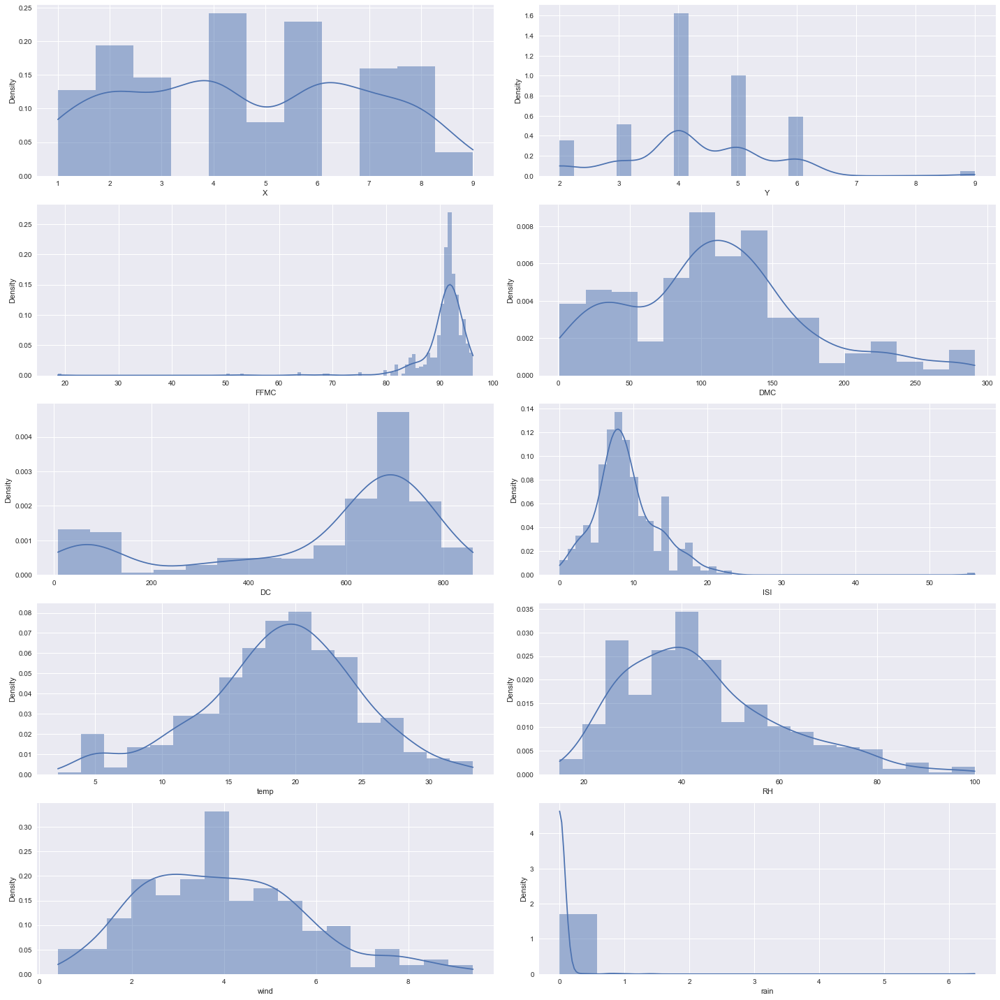

In [7]:
fig, axes = plt.subplots(nrows=5,ncols=2, figsize=(20, 20))

for i, col in enumerate(num_cols):
    sns.histplot(x=col, data=df, ax=axes[i//2, i%2], kde=True, stat="density", linewidth=0)
plt.tight_layout()
plt.show()

Based on the graph, we can see that FFMC and DC are left skewed; and DMC, ISI, and RH are very right skewed

In [8]:
cat_cols

['day', 'month']

## identify the area whether there are forest burn or not

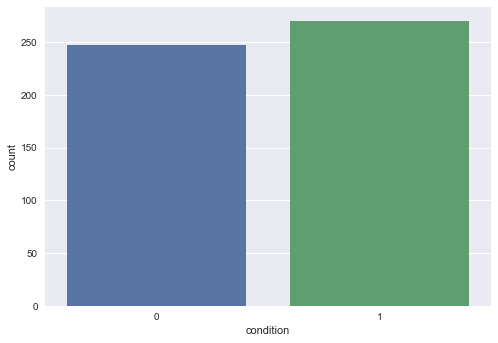

In [9]:
df['condition'] = df.area.apply(lambda x: 1 if x > 0 else 0)
sns.countplot(x='condition', data=df)
plt.show()

 0 = No fire Area, 1 = Fire Area

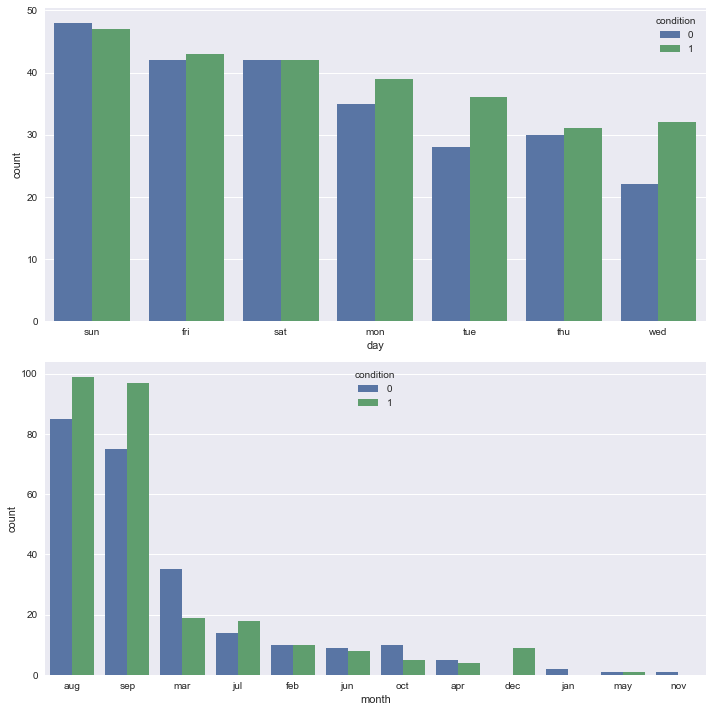

In [10]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10, 10))

for i, col in enumerate(cat_cols):
    sns.countplot(
        x=col, data=df, ax=ax[i], order=df[col].value_counts().index.to_list(), hue="condition"
    )
plt.tight_layout()
plt.show()

Based on the graph, we can see that the most forest fires happends on Sunday August

## Check and eliminate outliers

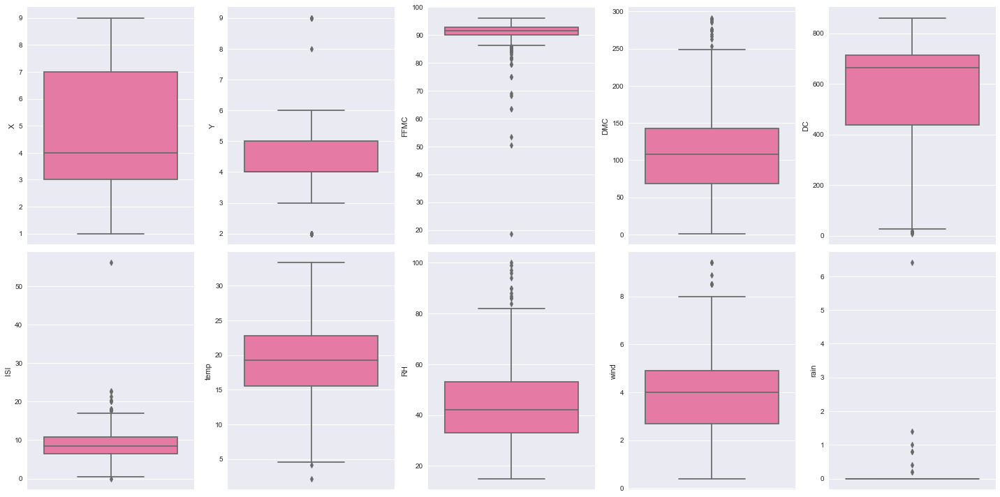

In [11]:
fig, axes = plt.subplots(nrows=2,ncols=5, figsize=(20, 10))

for i, col in enumerate(num_cols):
    sns.boxplot(y=col, data=df, ax=axes[i//5, i%5], palette = 'RdPu_r')
plt.tight_layout()
plt.show()

There are outliers on ISI, FFMC, RH, DMC, DC, temp and Wind

In [12]:
outliers_cols = list(set(num_cols) - {"X", "Y"})
z = df[outliers_cols].copy().add_prefix("_")
z = z.apply(lambda x: (x - x.mean()) / x.std())

In [13]:
z

,_wind,_rain,_temp,_RH,_FFMC,_DC,_DMC,_ISI
0,1.497164,-0.073197,-1.840857,0.411326,-0.805180,-1.828706,-1.322045,-0.860113
1,-1.740070,-0.073197,-0.153130,-0.691786,-0.008094,0.488418,-1.178399,-0.509195
2,-1.516813,-0.073197,-0.738668,-0.691786,-0.008094,0.560173,-1.048806,-0.509195
3,-0.009824,0.602572,-1.823636,3.230391,0.191177,-1.896429,-1.211188,-0.004751
4,-1.237741,-0.073197,-1.289763,3.352959,-0.243597,-1.796859,-0.930142,0.126843
...,...,...,...,...,...,...,...,...
512,-0.735411,-0.073197,1.534597,-0.753070,-1.638496,0.474309,-0.845829,-1.561947
513,0.994835,-0.073197,0.518517,1.637006,-1.638496,0.474309,-0.845829,-1.561947
514,1.497164,-0.073197,0.397965,1.575722,-1.638496,0.474309,-0.845829,-1.561947
515,-0.009824,-0.073197,1.155720,-0.140230,0.680298,0.269122,0.548471,0.499693


In [14]:
index = []

for col in outliers_cols:
    index.extend(z[np.abs(z["_" + col]) > 3].index.to_list())
    
index = list(set(index))

In [15]:
print(index)
print(len(index))

[130, 3, 4, 12, 22, 411, 168, 299, 304, 312, 199, 211, 469, 475, 97, 243, 499, 379, 509]
19


### Standarization

In [16]:
scaler = StandardScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])
df

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,condition
0,1.008313,0.569860,mar,fri,-0.805959,-1.323326,-1.830477,-0.860946,-1.842640,0.411724,1.498614,-0.073268,0.00,0
1,1.008313,-0.244001,oct,tue,-0.008102,-1.179541,0.488891,-0.509688,-0.153278,-0.692456,-1.741756,-0.073268,0.00,0
2,1.008313,-0.244001,oct,sat,-0.008102,-1.049822,0.560715,-0.509688,-0.739383,-0.692456,-1.518282,-0.073268,0.00,0
3,1.440925,1.383722,mar,fri,0.191362,-1.212361,-1.898266,-0.004756,-1.825402,3.233519,-0.009834,0.603155,0.00,0
4,1.440925,1.383722,mar,sun,-0.243833,-0.931043,-1.798600,0.126966,-1.291012,3.356206,-1.238940,-0.073268,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,-0.289524,-1.057862,aug,sun,-1.640083,-0.846648,0.474768,-1.563460,1.536084,-0.753800,-0.736124,-0.073268,6.44,1
513,-1.154748,-0.244001,aug,sun,-1.640083,-0.846648,0.474768,-1.563460,0.519019,1.638592,0.995798,-0.073268,54.29,1
514,1.008313,-0.244001,aug,sun,-1.640083,-0.846648,0.474768,-1.563460,0.398350,1.577248,1.498614,-0.073268,11.16,1
515,-1.587360,-0.244001,aug,sat,0.680957,0.549003,0.269382,0.500176,1.156839,-0.140366,-0.009834,-0.073268,0.00,0


### dropping outliers

In [17]:
df.drop(index, axis=0, inplace=True)
df.reset_index(drop=True, inplace=True)
df.shape

(498, 14)

In [18]:
outliers_cols = list(set(num_cols) - {"X", "Y"})
z = df[outliers_cols].copy().add_prefix("_")
z = z.apply(lambda x: (x - x.mean()) / x.std())

In [19]:
index = []

for col in outliers_cols:
    index.extend(z[np.abs(z["_" + col]) > 3].index.to_list())
    
index = list(set(index))

In [20]:
print(index)
print(len(index))

[448, 449, 482, 483, 484, 36, 450, 256, 169, 9, 492, 493, 494, 495, 497, 276, 468, 189]
18


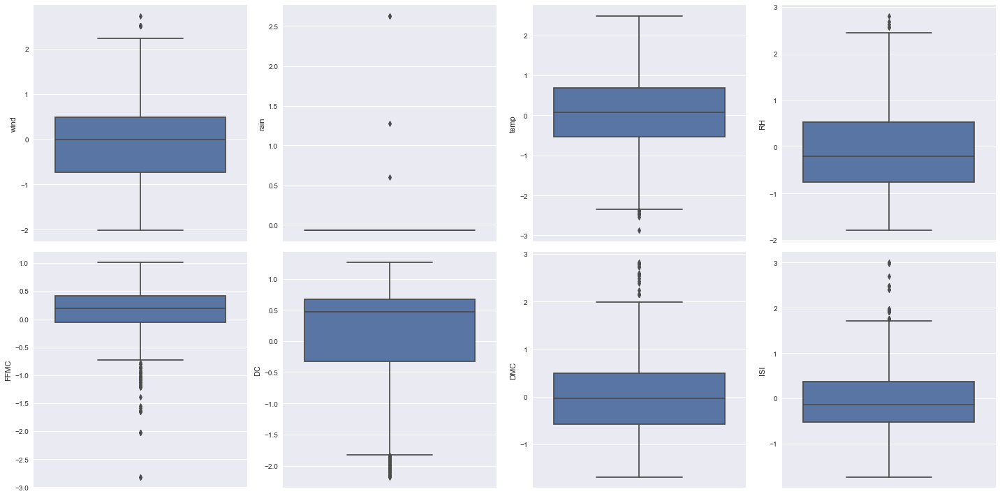

In [21]:
fig, axes = plt.subplots(nrows=2,ncols=4, figsize=(20, 10))

for i, col in enumerate(outliers_cols):
    sns.boxplot(y=col, data=df, ax=axes[i//4, i%4])
plt.tight_layout()
plt.show()

There are still another outliers even after be removed

### Correlation between features 

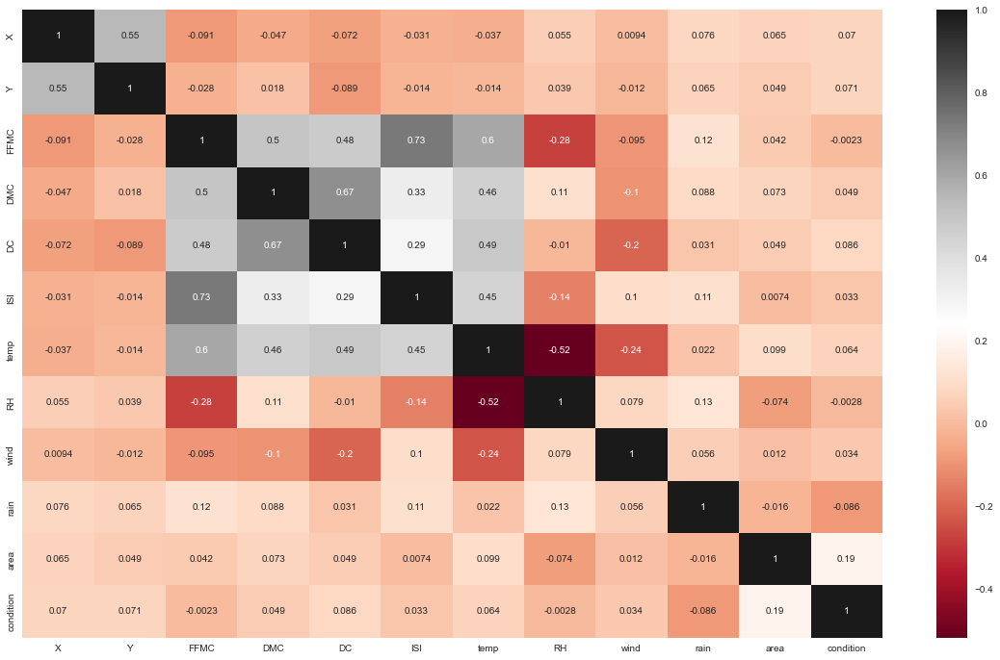

In [22]:
plt.subplots(figsize=(20, 12))
sns.heatmap(df.corr(), annot=True, cmap='RdGy')
plt.show()

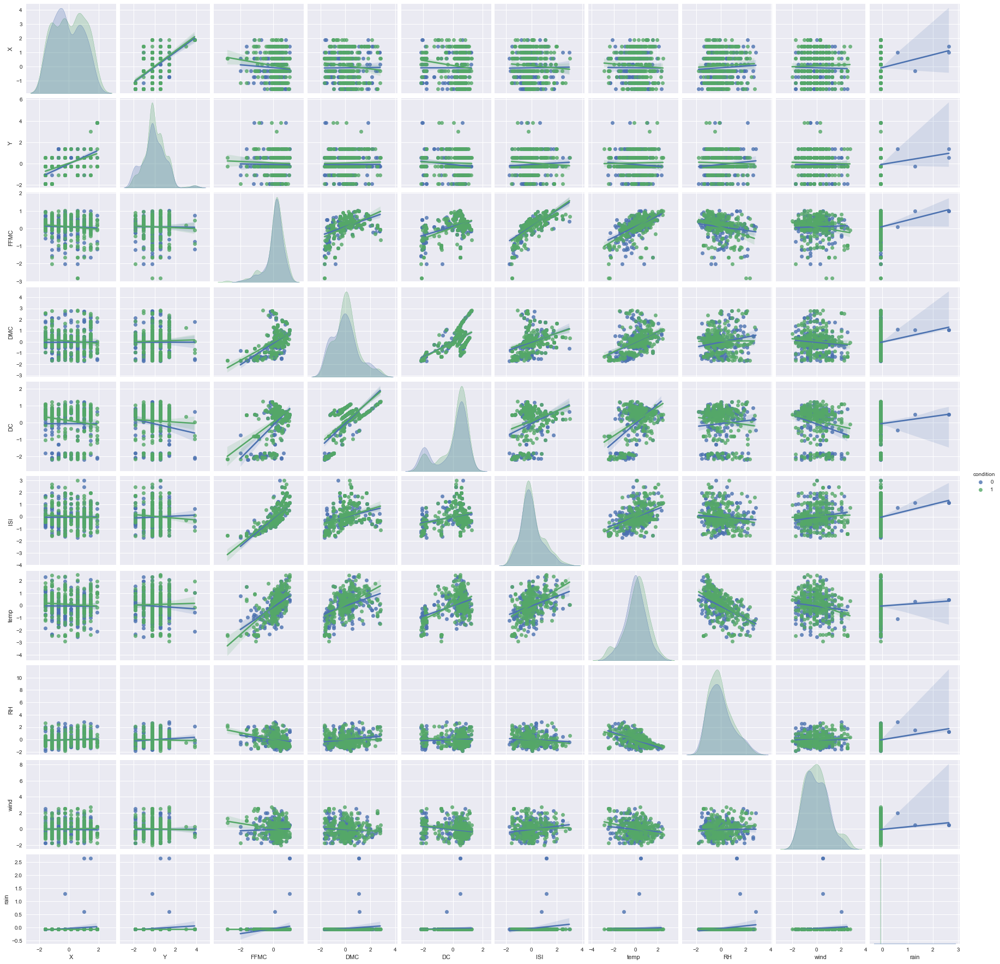

In [23]:
sns.pairplot(df[num_cols + ['condition']], kind='reg', hue='condition')
plt.show()

# Area Prediction Using Regression 

C:\Users\lenovo\miniconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='area', ylabel='Density'>

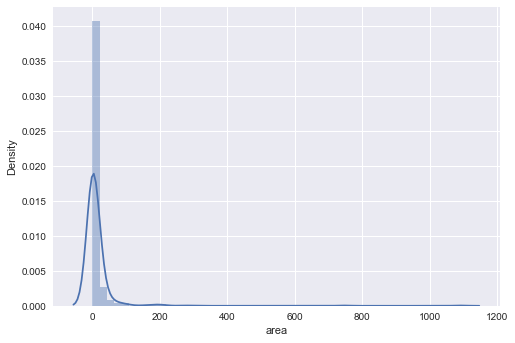

In [24]:
sns.distplot(df['area'])

In [25]:
df.describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,condition
count,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000,498.000000
mean,-0.012409,-0.010302,0.088207,0.023963,0.033515,-0.005417,0.024886,-0.047981,-0.034402,-0.058327,13.092912,0.526104
std,1.004337,1.010343,0.566107,0.996399,0.980548,0.861851,0.989507,0.937802,0.962584,0.183955,64.787642,0.499820
min,-1.587360,-1.871724,-2.818736,-1.685913,-2.179108,-1.739089,-2.876943,-1.796637,-2.021098,-0.073268,0.000000,0.000000
25%,-0.722136,-0.244001,-0.062501,-0.578223,-0.328214,-0.526153,-0.528213,-0.753800,-0.736124,-0.073268,0.000000,0.000000
50%,-0.289524,-0.244001,0.182296,-0.038640,0.470330,-0.136477,0.079440,-0.201709,-0.009834,-0.073268,0.545000,1.000000
75%,1.008313,0.569860,0.408960,0.492739,0.671277,0.368455,0.691403,0.534411,0.492982,-0.073268,6.577500,1.000000
max,1.873537,3.825306,1.007353,2.819865,1.261610,3.002885,2.484195,2.804116,2.727720,2.632426,1090.840000,1.000000


## Split Datasets

In [26]:
features = df.values[:,4:12]

In [27]:
labels =  df.values[:,12]

In [28]:
X_train, X_valid, y_train, y_valid = train_test_split(features, labels, test_size=0.4, random_state=20)

## Define Model 

In [29]:
def plot(history):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))

    ax[0].plot(history.history["loss"], label="loss")
    ax[0].plot(history.history["val_loss"], label="val_loss")
    ax[0].set_title("Loss")
    ax[0].set_xlabel("Epochs")
    ax[0].legend()

    ax[1].plot(history.history["accuracy"], label="accuracy")
    ax[1].plot(history.history["val_accuracy"], label="accuracy")
    ax[1].set_title("Accuracy")
    ax[1].set_xlabel("Epochs")
    ax[1].legend()
    plt.show()

def evaluate(model, X_train, y_train, X_test, y_test):
    _, train_acc = model.evaluate(X_train, y_train, verbose=0)
    _, test_acc = model.evaluate(X_test, y_test, verbose=0)
    print(f"Train: {train_acc:.3f}, Test: {test_acc:.3f}")

In [30]:
def model1():
    return tf.keras.Sequential([
        layers.Dense(24, input_dim=X_train.shape[1], activation='relu', kernel_initializer='he_normal'),
        layers.Dense(1, activation='linear')
    ])

def model2():
    return tf.keras.Sequential([
        layers.Dense(32, input_dim=X_train.shape[1], activation='relu', kernel_initializer='normal'),
        layers.Dense(32, activation='relu', kernel_initializer='normal'),
        layers.Dense(1, activation='linear')
    ])

def model3():
    return tf.keras.Sequential([
        layers.Dense(256, input_dim=X_train.shape[1], activation='relu', kernel_initializer='normal'),
        layers.Dense(128, activation='relu', kernel_initializer='normal'),
        layers.Dense(64, kernel_initializer='normal', activation='relu'),
        layers.Dense(32, kernel_initializer='normal', activation='relu'),
        layers.Dense(1, kernel_initializer='normal', activation='linear'),
    ])

def model4():
    return tf.keras.Sequential([
        layers.Dense(32, input_dim=X_train.shape[1], activation='relu', kernel_initializer='normal'),
        layers.Dense(64, activation='relu', kernel_initializer='normal'),
        layers.Dense(128, kernel_initializer='normal', activation='relu'),
        layers.Dense(64, kernel_initializer='normal', activation='relu'),
        layers.Dense(1, kernel_initializer='normal', activation='linear'),
    ])

In [31]:
X_train = np.asarray(X_train).astype(np.float32)
y_train = np.asarray(y_train).astype(np.float32)

X_valid = np.asarray(X_valid).astype(np.float32)
y_valid = np.asarray(y_valid).astype(np.float32)

## First Experiment

In [32]:
first_model = model1()
first_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['accuracy'])

In [33]:
history = first_model.fit(X_train, y_train, epochs=10000, validation_data=(X_valid, y_valid))

Epoch 1/10000
10/10 [==============================] - 6s 49ms/step - loss: 12.7893 - accuracy: 0.3893 - val_loss: 14.8862 - val_accuracy: 0.4800
Epoch 2/10000
10/10 [==============================] - 0s 11ms/step - loss: 12.6619 - accuracy: 0.3725 - val_loss: 14.7830 - val_accuracy: 0.4550
Epoch 3/10000
10/10 [==============================] - 0s 10ms/step - loss: 12.5516 - accuracy: 0.3523 - val_loss: 14.6944 - val_accuracy: 0.4050
Epoch 4/10000
10/10 [==============================] - 0s 11ms/step - loss: 12.4565 - accuracy: 0.3054 - val_loss: 14.6177 - val_accuracy: 0.3900
Epoch 5/10000
10/10 [==============================] - 0s 9ms/step - loss: 12.3629 - accuracy: 0.2953 - val_loss: 14.5624 - val_accuracy: 0.3650
Epoch 6/10000
10/10 [==============================] - 0s 9ms/step - loss: 12.2967 - accuracy: 0.2819 - val_loss: 14.5299 - val_accuracy: 0.3450
Epoch 7/10000
10/10 [==============================] - 0s 10ms/step - loss: 12.2479 - accuracy: 0.2617 - val_loss: 14.5142 - v

10/10 [==============================] - 0s 8ms/step - loss: 12.0010 - accuracy: 0.1040 - val_loss: 14.5269 - val_accuracy: 0.1000
Epoch 58/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.9990 - accuracy: 0.1007 - val_loss: 14.5330 - val_accuracy: 0.0950
Epoch 59/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.9966 - accuracy: 0.1007 - val_loss: 14.5350 - val_accuracy: 0.0950
Epoch 60/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.9946 - accuracy: 0.1007 - val_loss: 14.5403 - val_accuracy: 0.0900
Epoch 61/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.9917 - accuracy: 0.1040 - val_loss: 14.5372 - val_accuracy: 0.0900
Epoch 62/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.9895 - accuracy: 0.1107 - val_loss: 14.5375 - val_accuracy: 0.1000
Epoch 63/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.9872 - accuracy: 0.1040 - val_loss: 14.5413 - val_accuracy: 

10/10 [==============================] - 0s 8ms/step - loss: 11.9033 - accuracy: 0.1141 - val_loss: 14.5988 - val_accuracy: 0.0800
Epoch 114/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.9021 - accuracy: 0.1141 - val_loss: 14.5985 - val_accuracy: 0.0850
Epoch 115/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.9005 - accuracy: 0.1107 - val_loss: 14.5942 - val_accuracy: 0.0850
Epoch 116/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8996 - accuracy: 0.1107 - val_loss: 14.5990 - val_accuracy: 0.0850
Epoch 117/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8971 - accuracy: 0.1107 - val_loss: 14.6053 - val_accuracy: 0.0800
Epoch 118/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8949 - accuracy: 0.1074 - val_loss: 14.6087 - val_accuracy: 0.0800
Epoch 119/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8932 - accuracy: 0.1074 - val_loss: 14.6091 - val_accu

Epoch 169/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8140 - accuracy: 0.1174 - val_loss: 14.6725 - val_accuracy: 0.0750
Epoch 170/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8132 - accuracy: 0.1141 - val_loss: 14.6698 - val_accuracy: 0.0750
Epoch 171/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8120 - accuracy: 0.1141 - val_loss: 14.6673 - val_accuracy: 0.0750
Epoch 172/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8109 - accuracy: 0.1107 - val_loss: 14.6693 - val_accuracy: 0.0750
Epoch 173/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8100 - accuracy: 0.1107 - val_loss: 14.6678 - val_accuracy: 0.0750
Epoch 174/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8082 - accuracy: 0.1074 - val_loss: 14.6771 - val_accuracy: 0.0750
Epoch 175/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.8076 - accuracy: 0.1074 - val_loss: 14

Epoch 225/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7503 - accuracy: 0.1208 - val_loss: 14.7050 - val_accuracy: 0.0700
Epoch 226/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7492 - accuracy: 0.1208 - val_loss: 14.7109 - val_accuracy: 0.0700
Epoch 227/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7521 - accuracy: 0.1040 - val_loss: 14.7176 - val_accuracy: 0.0750
Epoch 228/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7486 - accuracy: 0.1040 - val_loss: 14.7161 - val_accuracy: 0.0750
Epoch 229/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7476 - accuracy: 0.1074 - val_loss: 14.7081 - val_accuracy: 0.0750
Epoch 230/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7471 - accuracy: 0.1141 - val_loss: 14.7088 - val_accuracy: 0.0750
Epoch 231/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7464 - accuracy: 0.1208 - val_loss: 14

Epoch 281/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7133 - accuracy: 0.1141 - val_loss: 14.7072 - val_accuracy: 0.0750
Epoch 282/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7118 - accuracy: 0.1208 - val_loss: 14.7016 - val_accuracy: 0.0750
Epoch 283/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7149 - accuracy: 0.1208 - val_loss: 14.6991 - val_accuracy: 0.0750
Epoch 284/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7128 - accuracy: 0.1174 - val_loss: 14.7102 - val_accuracy: 0.0750
Epoch 285/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7130 - accuracy: 0.1107 - val_loss: 14.7118 - val_accuracy: 0.0750
Epoch 286/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.7119 - accuracy: 0.1174 - val_loss: 14.7045 - val_accuracy: 0.0750
Epoch 287/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.7111 - accuracy: 0.1208 - val_loss: 14

Epoch 337/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.6871 - accuracy: 0.1174 - val_loss: 14.7159 - val_accuracy: 0.0750
Epoch 338/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6871 - accuracy: 0.1174 - val_loss: 14.7044 - val_accuracy: 0.0750
Epoch 339/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6866 - accuracy: 0.1242 - val_loss: 14.7069 - val_accuracy: 0.0800
Epoch 340/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6847 - accuracy: 0.1242 - val_loss: 14.7124 - val_accuracy: 0.0750
Epoch 341/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6849 - accuracy: 0.1174 - val_loss: 14.7100 - val_accuracy: 0.0750
Epoch 342/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6843 - accuracy: 0.1208 - val_loss: 14.6997 - val_accuracy: 0.0800
Epoch 343/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6834 - accuracy: 0.1242 - val_loss: 14

Epoch 393/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6673 - accuracy: 0.1242 - val_loss: 14.7222 - val_accuracy: 0.0700
Epoch 394/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6668 - accuracy: 0.1242 - val_loss: 14.7205 - val_accuracy: 0.0750
Epoch 395/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6643 - accuracy: 0.1242 - val_loss: 14.7161 - val_accuracy: 0.0800
Epoch 396/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6661 - accuracy: 0.1242 - val_loss: 14.7169 - val_accuracy: 0.0750
Epoch 397/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6637 - accuracy: 0.1275 - val_loss: 14.7186 - val_accuracy: 0.0750
Epoch 398/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6629 - accuracy: 0.1275 - val_loss: 14.7150 - val_accuracy: 0.0800
Epoch 399/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6636 - accuracy: 0.1275 - val_loss: 14

Epoch 449/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.6441 - accuracy: 0.1242 - val_loss: 14.7348 - val_accuracy: 0.0800
Epoch 450/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.6428 - accuracy: 0.1275 - val_loss: 14.7318 - val_accuracy: 0.0850
Epoch 451/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.6431 - accuracy: 0.1275 - val_loss: 14.7379 - val_accuracy: 0.0850
Epoch 452/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.6412 - accuracy: 0.1242 - val_loss: 14.7362 - val_accuracy: 0.0800
Epoch 453/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.6421 - accuracy: 0.1208 - val_loss: 14.7432 - val_accuracy: 0.0800
Epoch 454/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6424 - accuracy: 0.1208 - val_loss: 14.7398 - val_accuracy: 0.0850
Epoch 455/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6413 - accuracy: 0.1309 - val_loss: 1

10/10 [==============================] - 0s 8ms/step - loss: 11.6221 - accuracy: 0.1342 - val_loss: 14.7494 - val_accuracy: 0.0950
Epoch 505/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6214 - accuracy: 0.1409 - val_loss: 14.7457 - val_accuracy: 0.1000
Epoch 506/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6199 - accuracy: 0.1342 - val_loss: 14.7576 - val_accuracy: 0.0900
Epoch 507/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.6228 - accuracy: 0.1309 - val_loss: 14.7569 - val_accuracy: 0.1000
Epoch 508/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.6207 - accuracy: 0.1376 - val_loss: 14.7484 - val_accuracy: 0.1000
Epoch 509/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6184 - accuracy: 0.1376 - val_loss: 14.7513 - val_accuracy: 0.0950
Epoch 510/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.6212 - accuracy: 0.1342 - val_loss: 14.7512 - val_accu

Epoch 560/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6017 - accuracy: 0.1544 - val_loss: 14.7541 - val_accuracy: 0.0900
Epoch 561/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6014 - accuracy: 0.1544 - val_loss: 14.7554 - val_accuracy: 0.0900
Epoch 562/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.5996 - accuracy: 0.1544 - val_loss: 14.7586 - val_accuracy: 0.0900
Epoch 563/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6015 - accuracy: 0.1510 - val_loss: 14.7568 - val_accuracy: 0.0950
Epoch 564/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.6011 - accuracy: 0.1510 - val_loss: 14.7611 - val_accuracy: 0.0900
Epoch 565/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5994 - accuracy: 0.1544 - val_loss: 14.7552 - val_accuracy: 0.0950
Epoch 566/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5993 - accuracy: 0.1544 - val_loss: 14

Epoch 616/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5836 - accuracy: 0.1611 - val_loss: 14.7672 - val_accuracy: 0.0850
Epoch 617/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.5843 - accuracy: 0.1644 - val_loss: 14.7627 - val_accuracy: 0.0850
Epoch 618/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5857 - accuracy: 0.1711 - val_loss: 14.7566 - val_accuracy: 0.0850
Epoch 619/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5860 - accuracy: 0.1678 - val_loss: 14.7700 - val_accuracy: 0.0850
Epoch 620/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5829 - accuracy: 0.1611 - val_loss: 14.7596 - val_accuracy: 0.0850
Epoch 621/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5809 - accuracy: 0.1644 - val_loss: 14.7622 - val_accuracy: 0.0850
Epoch 622/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5810 - accuracy: 0.1644 - val_loss: 14

Epoch 672/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5644 - accuracy: 0.1745 - val_loss: 14.7626 - val_accuracy: 0.0950
Epoch 673/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5655 - accuracy: 0.1745 - val_loss: 14.7601 - val_accuracy: 0.0950
Epoch 674/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5648 - accuracy: 0.1711 - val_loss: 14.7633 - val_accuracy: 0.0950
Epoch 675/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5638 - accuracy: 0.1711 - val_loss: 14.7675 - val_accuracy: 0.0900
Epoch 676/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5658 - accuracy: 0.1745 - val_loss: 14.7611 - val_accuracy: 0.0950
Epoch 677/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5628 - accuracy: 0.1745 - val_loss: 14.7691 - val_accuracy: 0.1000
Epoch 678/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5622 - accuracy: 0.1745 - val_loss: 14

Epoch 728/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5487 - accuracy: 0.1812 - val_loss: 14.7763 - val_accuracy: 0.1000
Epoch 729/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5488 - accuracy: 0.1812 - val_loss: 14.7744 - val_accuracy: 0.0950
Epoch 730/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5490 - accuracy: 0.1812 - val_loss: 14.7751 - val_accuracy: 0.0950
Epoch 731/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5488 - accuracy: 0.1846 - val_loss: 14.7663 - val_accuracy: 0.1050
Epoch 732/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5482 - accuracy: 0.1846 - val_loss: 14.7725 - val_accuracy: 0.1050
Epoch 733/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.5507 - accuracy: 0.1846 - val_loss: 14.7777 - val_accuracy: 0.1050
Epoch 734/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5494 - accuracy: 0.1846 - val_loss: 14

10/10 [==============================] - 0s 8ms/step - loss: 11.5373 - accuracy: 0.1846 - val_loss: 14.7887 - val_accuracy: 0.1000
Epoch 784/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5365 - accuracy: 0.1846 - val_loss: 14.7772 - val_accuracy: 0.1150
Epoch 785/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5369 - accuracy: 0.1846 - val_loss: 14.7774 - val_accuracy: 0.1150
Epoch 786/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5364 - accuracy: 0.1846 - val_loss: 14.7834 - val_accuracy: 0.1000
Epoch 787/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5392 - accuracy: 0.1846 - val_loss: 14.7884 - val_accuracy: 0.1150
Epoch 788/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.5349 - accuracy: 0.1846 - val_loss: 14.7813 - val_accuracy: 0.1150
Epoch 789/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.5356 - accuracy: 0.1846 - val_loss: 14.7853 - val_accu

Epoch 839/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5244 - accuracy: 0.1846 - val_loss: 14.7808 - val_accuracy: 0.1150
Epoch 840/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5236 - accuracy: 0.1846 - val_loss: 14.7897 - val_accuracy: 0.1150
Epoch 841/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5234 - accuracy: 0.1846 - val_loss: 14.7888 - val_accuracy: 0.1150
Epoch 842/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5229 - accuracy: 0.1846 - val_loss: 14.7896 - val_accuracy: 0.1150
Epoch 843/10000
10/10 [==============================] - 3s 342ms/step - loss: 11.5230 - accuracy: 0.1846 - val_loss: 14.7874 - val_accuracy: 0.1150
Epoch 844/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5227 - accuracy: 0.1846 - val_loss: 14.7878 - val_accuracy: 0.1150
Epoch 845/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5237 - accuracy: 0.1846 - val_loss: 

Epoch 895/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.5119 - accuracy: 0.1812 - val_loss: 14.8010 - val_accuracy: 0.1150
Epoch 896/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5123 - accuracy: 0.1812 - val_loss: 14.8045 - val_accuracy: 0.1150
Epoch 897/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5110 - accuracy: 0.1779 - val_loss: 14.8008 - val_accuracy: 0.1150
Epoch 898/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5110 - accuracy: 0.1812 - val_loss: 14.8002 - val_accuracy: 0.1150
Epoch 899/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5131 - accuracy: 0.1812 - val_loss: 14.8022 - val_accuracy: 0.1150
Epoch 900/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5111 - accuracy: 0.1846 - val_loss: 14.7936 - val_accuracy: 0.1150
Epoch 901/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5116 - accuracy: 0.1812 - val_loss: 14

Epoch 951/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5021 - accuracy: 0.1779 - val_loss: 14.8153 - val_accuracy: 0.1150
Epoch 952/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5005 - accuracy: 0.1745 - val_loss: 14.8187 - val_accuracy: 0.1150
Epoch 953/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.5011 - accuracy: 0.1745 - val_loss: 14.8161 - val_accuracy: 0.1150
Epoch 954/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4990 - accuracy: 0.1711 - val_loss: 14.8221 - val_accuracy: 0.1200
Epoch 955/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4991 - accuracy: 0.1711 - val_loss: 14.8124 - val_accuracy: 0.1150
Epoch 956/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4996 - accuracy: 0.1779 - val_loss: 14.8166 - val_accuracy: 0.1150
Epoch 957/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4988 - accuracy: 0.1711 - val_loss: 14

10/10 [==============================] - 0s 8ms/step - loss: 11.4899 - accuracy: 0.1711 - val_loss: 14.8383 - val_accuracy: 0.1150
Epoch 1007/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4885 - accuracy: 0.1711 - val_loss: 14.8284 - val_accuracy: 0.1200
Epoch 1008/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4883 - accuracy: 0.1812 - val_loss: 14.8309 - val_accuracy: 0.1150
Epoch 1009/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4882 - accuracy: 0.1745 - val_loss: 14.8329 - val_accuracy: 0.1100
Epoch 1010/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4907 - accuracy: 0.1745 - val_loss: 14.8260 - val_accuracy: 0.1150
Epoch 1011/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4885 - accuracy: 0.1812 - val_loss: 14.8336 - val_accuracy: 0.1200
Epoch 1012/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.4878 - accuracy: 0.1812 - val_loss: 14.8326 - v

10/10 [==============================] - 0s 8ms/step - loss: 11.4794 - accuracy: 0.1812 - val_loss: 14.8532 - val_accuracy: 0.1150
Epoch 1062/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.4771 - accuracy: 0.1779 - val_loss: 14.8515 - val_accuracy: 0.1200
Epoch 1063/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4795 - accuracy: 0.1779 - val_loss: 14.8608 - val_accuracy: 0.1200
Epoch 1064/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4771 - accuracy: 0.1745 - val_loss: 14.8524 - val_accuracy: 0.1200
Epoch 1065/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.4773 - accuracy: 0.1779 - val_loss: 14.8582 - val_accuracy: 0.1150
Epoch 1066/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.4778 - accuracy: 0.1779 - val_loss: 14.8536 - val_accuracy: 0.1100
Epoch 1067/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.4755 - accuracy: 0.1745 - val_loss: 14.8596 

10/10 [==============================] - 0s 8ms/step - loss: 11.4690 - accuracy: 0.1812 - val_loss: 14.8591 - val_accuracy: 0.1100
Epoch 1117/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4663 - accuracy: 0.1812 - val_loss: 14.8656 - val_accuracy: 0.1100
Epoch 1118/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4681 - accuracy: 0.1846 - val_loss: 14.8715 - val_accuracy: 0.1150
Epoch 1119/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4637 - accuracy: 0.1812 - val_loss: 14.8638 - val_accuracy: 0.1100
Epoch 1120/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4654 - accuracy: 0.1779 - val_loss: 14.8572 - val_accuracy: 0.1100
Epoch 1121/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4686 - accuracy: 0.1846 - val_loss: 14.8679 - val_accuracy: 0.1100
Epoch 1122/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4672 - accuracy: 0.1846 - val_loss: 14.8609 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.4528 - accuracy: 0.1846 - val_loss: 14.8745 - val_accuracy: 0.1150
Epoch 1172/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4520 - accuracy: 0.1846 - val_loss: 14.8747 - val_accuracy: 0.1100
Epoch 1173/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4555 - accuracy: 0.1879 - val_loss: 14.8700 - val_accuracy: 0.1100
Epoch 1174/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.4563 - accuracy: 0.1846 - val_loss: 14.8763 - val_accuracy: 0.1100
Epoch 1175/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.4556 - accuracy: 0.1846 - val_loss: 14.8652 - val_accuracy: 0.1150
Epoch 1176/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4549 - accuracy: 0.1846 - val_loss: 14.8754 - val_accuracy: 0.1050
Epoch 1177/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.4541 - accuracy: 0.1812 - val_loss: 14.8695 -

10/10 [==============================] - 0s 8ms/step - loss: 11.4405 - accuracy: 0.1846 - val_loss: 14.8835 - val_accuracy: 0.1050
Epoch 1227/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4440 - accuracy: 0.1946 - val_loss: 14.8800 - val_accuracy: 0.1150
Epoch 1228/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4412 - accuracy: 0.1913 - val_loss: 14.8821 - val_accuracy: 0.1050
Epoch 1229/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4380 - accuracy: 0.1879 - val_loss: 14.8860 - val_accuracy: 0.1050
Epoch 1230/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4414 - accuracy: 0.1779 - val_loss: 14.8911 - val_accuracy: 0.1100
Epoch 1231/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4381 - accuracy: 0.1846 - val_loss: 14.8769 - val_accuracy: 0.1150
Epoch 1232/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.4379 - accuracy: 0.1913 - val_loss: 14.8793 - v

10/10 [==============================] - 0s 8ms/step - loss: 11.4230 - accuracy: 0.1846 - val_loss: 14.9052 - val_accuracy: 0.1150
Epoch 1282/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4237 - accuracy: 0.1879 - val_loss: 14.9031 - val_accuracy: 0.1200
Epoch 1283/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4245 - accuracy: 0.1946 - val_loss: 14.9015 - val_accuracy: 0.1200
Epoch 1284/10000
10/10 [==============================] - 0s 18ms/step - loss: 11.4231 - accuracy: 0.1846 - val_loss: 14.9044 - val_accuracy: 0.1150
Epoch 1285/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4245 - accuracy: 0.1812 - val_loss: 14.9039 - val_accuracy: 0.1150
Epoch 1286/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4244 - accuracy: 0.1846 - val_loss: 14.9023 - val_accuracy: 0.1250
Epoch 1287/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.4232 - accuracy: 0.1879 - val_loss: 14.9017 - v

10/10 [==============================] - 0s 8ms/step - loss: 11.4158 - accuracy: 0.1879 - val_loss: 14.9041 - val_accuracy: 0.1200
Epoch 1337/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4127 - accuracy: 0.1846 - val_loss: 14.9184 - val_accuracy: 0.1000
Epoch 1338/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4114 - accuracy: 0.1879 - val_loss: 14.9111 - val_accuracy: 0.1000
Epoch 1339/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4092 - accuracy: 0.1846 - val_loss: 14.9158 - val_accuracy: 0.1050
Epoch 1340/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4108 - accuracy: 0.1879 - val_loss: 14.9192 - val_accuracy: 0.1050
Epoch 1341/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4131 - accuracy: 0.1846 - val_loss: 14.9176 - val_accuracy: 0.1050
Epoch 1342/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4128 - accuracy: 0.1846 - val_loss: 14.9243 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.3981 - accuracy: 0.1812 - val_loss: 14.9298 - val_accuracy: 0.0950
Epoch 1392/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3984 - accuracy: 0.1846 - val_loss: 14.9232 - val_accuracy: 0.1050
Epoch 1393/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4003 - accuracy: 0.1846 - val_loss: 14.9300 - val_accuracy: 0.0950
Epoch 1394/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3996 - accuracy: 0.1846 - val_loss: 14.9216 - val_accuracy: 0.0950
Epoch 1395/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.4018 - accuracy: 0.1812 - val_loss: 14.9173 - val_accuracy: 0.1000
Epoch 1396/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3998 - accuracy: 0.1812 - val_loss: 14.9315 - val_accuracy: 0.0950
Epoch 1397/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.4010 - accuracy: 0.1812 - val_loss: 14.9207 - v

10/10 [==============================] - 0s 8ms/step - loss: 11.3894 - accuracy: 0.1879 - val_loss: 14.9389 - val_accuracy: 0.0950
Epoch 1447/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3867 - accuracy: 0.1913 - val_loss: 14.9453 - val_accuracy: 0.0950
Epoch 1448/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3870 - accuracy: 0.1879 - val_loss: 14.9379 - val_accuracy: 0.0950
Epoch 1449/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3845 - accuracy: 0.1879 - val_loss: 14.9430 - val_accuracy: 0.0950
Epoch 1450/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3872 - accuracy: 0.1812 - val_loss: 14.9397 - val_accuracy: 0.0950
Epoch 1451/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3888 - accuracy: 0.1879 - val_loss: 14.9386 - val_accuracy: 0.0950
Epoch 1452/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3891 - accuracy: 0.1779 - val_loss: 14.9506 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.3778 - accuracy: 0.1846 - val_loss: 14.9579 - val_accuracy: 0.0950
Epoch 1502/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3793 - accuracy: 0.1812 - val_loss: 14.9535 - val_accuracy: 0.0950
Epoch 1503/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3777 - accuracy: 0.1846 - val_loss: 14.9568 - val_accuracy: 0.0950
Epoch 1504/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3762 - accuracy: 0.1812 - val_loss: 14.9600 - val_accuracy: 0.0950
Epoch 1505/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3773 - accuracy: 0.1846 - val_loss: 14.9578 - val_accuracy: 0.0950
Epoch 1506/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.3754 - accuracy: 0.1812 - val_loss: 14.9558 - val_accuracy: 0.0950
Epoch 1507/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3823 - accuracy: 0.1812 - val_loss: 14.9490 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.3715 - accuracy: 0.1879 - val_loss: 14.9698 - val_accuracy: 0.0950
Epoch 1557/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.3713 - accuracy: 0.1812 - val_loss: 14.9714 - val_accuracy: 0.0950
Epoch 1558/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.3704 - accuracy: 0.1846 - val_loss: 14.9654 - val_accuracy: 0.0950
Epoch 1559/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.3681 - accuracy: 0.1879 - val_loss: 14.9699 - val_accuracy: 0.0950
Epoch 1560/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3711 - accuracy: 0.1779 - val_loss: 14.9794 - val_accuracy: 0.0950
Epoch 1561/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.3716 - accuracy: 0.1812 - val_loss: 14.9712 - val_accuracy: 0.0950
Epoch 1562/10000
10/10 [==============================] - 0s 12ms/step - loss: 11.3703 - accuracy: 0.1879 - val_loss: 14.9777

10/10 [==============================] - 0s 10ms/step - loss: 11.3608 - accuracy: 0.1879 - val_loss: 14.9837 - val_accuracy: 0.0950
Epoch 1612/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3567 - accuracy: 0.1879 - val_loss: 14.9873 - val_accuracy: 0.0950
Epoch 1613/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3607 - accuracy: 0.1812 - val_loss: 14.9862 - val_accuracy: 0.0950
Epoch 1614/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3579 - accuracy: 0.1879 - val_loss: 14.9869 - val_accuracy: 0.0950
Epoch 1615/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3584 - accuracy: 0.1946 - val_loss: 14.9870 - val_accuracy: 0.0950
Epoch 1616/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3591 - accuracy: 0.1879 - val_loss: 14.9876 - val_accuracy: 0.0950
Epoch 1617/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3595 - accuracy: 0.1846 - val_loss: 14.9900 - v

10/10 [==============================] - 0s 8ms/step - loss: 11.3516 - accuracy: 0.1913 - val_loss: 15.0011 - val_accuracy: 0.0950
Epoch 1667/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3511 - accuracy: 0.1913 - val_loss: 15.0038 - val_accuracy: 0.0950
Epoch 1668/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3494 - accuracy: 0.1946 - val_loss: 14.9984 - val_accuracy: 0.0950
Epoch 1669/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3501 - accuracy: 0.1846 - val_loss: 15.0099 - val_accuracy: 0.0950
Epoch 1670/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3497 - accuracy: 0.1913 - val_loss: 15.0032 - val_accuracy: 0.0950
Epoch 1671/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3492 - accuracy: 0.1913 - val_loss: 15.0090 - val_accuracy: 0.0900
Epoch 1672/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.3518 - accuracy: 0.1913 - val_loss: 14.9969 - v

10/10 [==============================] - 0s 8ms/step - loss: 11.3422 - accuracy: 0.1879 - val_loss: 15.0260 - val_accuracy: 0.0900
Epoch 1722/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3382 - accuracy: 0.1879 - val_loss: 15.0194 - val_accuracy: 0.0950
Epoch 1723/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3400 - accuracy: 0.1913 - val_loss: 15.0267 - val_accuracy: 0.0950
Epoch 1724/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3387 - accuracy: 0.1913 - val_loss: 15.0141 - val_accuracy: 0.0950
Epoch 1725/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3400 - accuracy: 0.1913 - val_loss: 15.0179 - val_accuracy: 0.0950
Epoch 1726/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3423 - accuracy: 0.1879 - val_loss: 15.0245 - val_accuracy: 0.0950
Epoch 1727/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3408 - accuracy: 0.1913 - val_loss: 15.0234 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.3328 - accuracy: 0.1913 - val_loss: 15.0275 - val_accuracy: 0.0950
Epoch 1777/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3307 - accuracy: 0.1913 - val_loss: 15.0410 - val_accuracy: 0.0950
Epoch 1778/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3328 - accuracy: 0.1913 - val_loss: 15.0351 - val_accuracy: 0.0950
Epoch 1779/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3343 - accuracy: 0.1913 - val_loss: 15.0325 - val_accuracy: 0.0950
Epoch 1780/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3324 - accuracy: 0.1913 - val_loss: 15.0375 - val_accuracy: 0.0950
Epoch 1781/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.3287 - accuracy: 0.1913 - val_loss: 15.0323 - val_accuracy: 0.0950
Epoch 1782/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.3328 - accuracy: 0.1913 - val_loss: 15.0355 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.3276 - accuracy: 0.1913 - val_loss: 15.0462 - val_accuracy: 0.0950
Epoch 1832/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3241 - accuracy: 0.1913 - val_loss: 15.0592 - val_accuracy: 0.0950
Epoch 1833/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3262 - accuracy: 0.1913 - val_loss: 15.0478 - val_accuracy: 0.0950
Epoch 1834/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3243 - accuracy: 0.1913 - val_loss: 15.0634 - val_accuracy: 0.0950
Epoch 1835/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3220 - accuracy: 0.1913 - val_loss: 15.0488 - val_accuracy: 0.0950
Epoch 1836/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3226 - accuracy: 0.1913 - val_loss: 15.0523 - val_accuracy: 0.0950
Epoch 1837/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3236 - accuracy: 0.1913 - val_loss: 15.0570 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.3170 - accuracy: 0.1913 - val_loss: 15.0622 - val_accuracy: 0.0950
Epoch 1887/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3171 - accuracy: 0.1913 - val_loss: 15.0703 - val_accuracy: 0.0950
Epoch 1888/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3179 - accuracy: 0.1913 - val_loss: 15.0744 - val_accuracy: 0.0950
Epoch 1889/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3168 - accuracy: 0.1846 - val_loss: 15.0728 - val_accuracy: 0.0950
Epoch 1890/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3156 - accuracy: 0.1913 - val_loss: 15.0681 - val_accuracy: 0.0950
Epoch 1891/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3185 - accuracy: 0.1946 - val_loss: 15.0675 - val_accuracy: 0.0950
Epoch 1892/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3178 - accuracy: 0.1913 - val_loss: 15.0730 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.3100 - accuracy: 0.1913 - val_loss: 15.0901 - val_accuracy: 0.0950
Epoch 1942/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3090 - accuracy: 0.1913 - val_loss: 15.0888 - val_accuracy: 0.0950
Epoch 1943/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.3081 - accuracy: 0.1846 - val_loss: 15.0875 - val_accuracy: 0.0950
Epoch 1944/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3073 - accuracy: 0.1846 - val_loss: 15.0853 - val_accuracy: 0.0950
Epoch 1945/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3092 - accuracy: 0.1846 - val_loss: 15.0882 - val_accuracy: 0.0950
Epoch 1946/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3104 - accuracy: 0.1913 - val_loss: 15.0925 - val_accuracy: 0.0950
Epoch 1947/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3069 - accuracy: 0.1946 - val_loss: 15.0850 - v

10/10 [==============================] - 0s 8ms/step - loss: 11.3054 - accuracy: 0.1980 - val_loss: 15.0971 - val_accuracy: 0.0950
Epoch 1997/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.3009 - accuracy: 0.1879 - val_loss: 15.1008 - val_accuracy: 0.0950
Epoch 1998/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3009 - accuracy: 0.1812 - val_loss: 15.0913 - val_accuracy: 0.0950
Epoch 1999/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3066 - accuracy: 0.1946 - val_loss: 15.0914 - val_accuracy: 0.0950
Epoch 2000/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.3070 - accuracy: 0.1779 - val_loss: 15.1037 - val_accuracy: 0.0950
Epoch 2001/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.3013 - accuracy: 0.1879 - val_loss: 15.0958 - val_accuracy: 0.0950
Epoch 2002/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.3039 - accuracy: 0.1879 - val_loss: 15.1019 - v

10/10 [==============================] - 0s 11ms/step - loss: 11.2927 - accuracy: 0.1879 - val_loss: 15.1167 - val_accuracy: 0.0950
Epoch 2052/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.2922 - accuracy: 0.1913 - val_loss: 15.1180 - val_accuracy: 0.0950
Epoch 2053/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.2941 - accuracy: 0.1879 - val_loss: 15.1120 - val_accuracy: 0.0950
Epoch 2054/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2911 - accuracy: 0.1913 - val_loss: 15.1206 - val_accuracy: 0.0950
Epoch 2055/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2938 - accuracy: 0.1879 - val_loss: 15.1131 - val_accuracy: 0.0950
Epoch 2056/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2937 - accuracy: 0.1879 - val_loss: 15.1197 - val_accuracy: 0.0950
Epoch 2057/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2950 - accuracy: 0.1879 - val_loss: 15.1282 -

10/10 [==============================] - 0s 8ms/step - loss: 11.2927 - accuracy: 0.1846 - val_loss: 15.1444 - val_accuracy: 0.0950
Epoch 2107/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.2859 - accuracy: 0.1812 - val_loss: 15.1284 - val_accuracy: 0.0950
Epoch 2108/10000
10/10 [==============================] - 0s 12ms/step - loss: 11.2881 - accuracy: 0.1946 - val_loss: 15.1378 - val_accuracy: 0.0900
Epoch 2109/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.2888 - accuracy: 0.1846 - val_loss: 15.1499 - val_accuracy: 0.0950
Epoch 2110/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.2905 - accuracy: 0.1913 - val_loss: 15.1250 - val_accuracy: 0.0950
Epoch 2111/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2860 - accuracy: 0.1846 - val_loss: 15.1352 - val_accuracy: 0.0950
Epoch 2112/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2845 - accuracy: 0.1846 - val_loss: 15.1303 

10/10 [==============================] - 0s 8ms/step - loss: 11.2762 - accuracy: 0.1946 - val_loss: 15.1501 - val_accuracy: 0.0950
Epoch 2162/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.2779 - accuracy: 0.1812 - val_loss: 15.1649 - val_accuracy: 0.0950
Epoch 2163/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2763 - accuracy: 0.1812 - val_loss: 15.1430 - val_accuracy: 0.1000
Epoch 2164/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2807 - accuracy: 0.1913 - val_loss: 15.1556 - val_accuracy: 0.0900
Epoch 2165/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2758 - accuracy: 0.1846 - val_loss: 15.1582 - val_accuracy: 0.0950
Epoch 2166/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2750 - accuracy: 0.1846 - val_loss: 15.1465 - val_accuracy: 0.1000
Epoch 2167/10000
10/10 [==============================] - 0s 13ms/step - loss: 11.2783 - accuracy: 0.1946 - val_loss: 15.1462 - 

10/10 [==============================] - 0s 8ms/step - loss: 11.2612 - accuracy: 0.1846 - val_loss: 15.1673 - val_accuracy: 0.0950
Epoch 2217/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2639 - accuracy: 0.1913 - val_loss: 15.1634 - val_accuracy: 0.0950
Epoch 2218/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2657 - accuracy: 0.1913 - val_loss: 15.1619 - val_accuracy: 0.0950
Epoch 2219/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2700 - accuracy: 0.1879 - val_loss: 15.1859 - val_accuracy: 0.0950
Epoch 2220/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2635 - accuracy: 0.1879 - val_loss: 15.1665 - val_accuracy: 0.0950
Epoch 2221/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2634 - accuracy: 0.1913 - val_loss: 15.1688 - val_accuracy: 0.1000
Epoch 2222/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2649 - accuracy: 0.1946 - val_loss: 15.1764 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.2515 - accuracy: 0.1879 - val_loss: 15.1749 - val_accuracy: 0.0950
Epoch 2272/10000
10/10 [==============================] - 0s 15ms/step - loss: 11.2503 - accuracy: 0.1879 - val_loss: 15.1836 - val_accuracy: 0.0950
Epoch 2273/10000
10/10 [==============================] - 0s 14ms/step - loss: 11.2535 - accuracy: 0.1779 - val_loss: 15.1886 - val_accuracy: 0.0950
Epoch 2274/10000
10/10 [==============================] - 0s 15ms/step - loss: 11.2484 - accuracy: 0.1879 - val_loss: 15.1771 - val_accuracy: 0.0950
Epoch 2275/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.2493 - accuracy: 0.1913 - val_loss: 15.1832 - val_accuracy: 0.0900
Epoch 2276/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2479 - accuracy: 0.1846 - val_loss: 15.1862 - val_accuracy: 0.0950
Epoch 2277/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2479 - accuracy: 0.1812 - val_loss: 15.1848 

10/10 [==============================] - 0s 8ms/step - loss: 11.2455 - accuracy: 0.1779 - val_loss: 15.2047 - val_accuracy: 0.0950
Epoch 2327/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2407 - accuracy: 0.1846 - val_loss: 15.2034 - val_accuracy: 0.0950
Epoch 2328/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2404 - accuracy: 0.1812 - val_loss: 15.2139 - val_accuracy: 0.0900
Epoch 2329/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2412 - accuracy: 0.1812 - val_loss: 15.2079 - val_accuracy: 0.0950
Epoch 2330/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2407 - accuracy: 0.1913 - val_loss: 15.2051 - val_accuracy: 0.0900
Epoch 2331/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2373 - accuracy: 0.1812 - val_loss: 15.2129 - val_accuracy: 0.0850
Epoch 2332/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2406 - accuracy: 0.1745 - val_loss: 15.2166 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.2283 - accuracy: 0.1879 - val_loss: 15.2273 - val_accuracy: 0.1000
Epoch 2382/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2290 - accuracy: 0.1879 - val_loss: 15.2336 - val_accuracy: 0.1000
Epoch 2383/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2271 - accuracy: 0.1812 - val_loss: 15.2313 - val_accuracy: 0.1000
Epoch 2384/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2261 - accuracy: 0.1812 - val_loss: 15.2352 - val_accuracy: 0.1000
Epoch 2385/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2268 - accuracy: 0.1812 - val_loss: 15.2332 - val_accuracy: 0.0950
Epoch 2386/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2275 - accuracy: 0.1812 - val_loss: 15.2379 - val_accuracy: 0.0950
Epoch 2387/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2261 - accuracy: 0.1812 - val_loss: 15.2366 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.2222 - accuracy: 0.1812 - val_loss: 15.2718 - val_accuracy: 0.0850
Epoch 2437/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2174 - accuracy: 0.1846 - val_loss: 15.2517 - val_accuracy: 0.0950
Epoch 2438/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2229 - accuracy: 0.1846 - val_loss: 15.2482 - val_accuracy: 0.0950
Epoch 2439/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2177 - accuracy: 0.1812 - val_loss: 15.2591 - val_accuracy: 0.0950
Epoch 2440/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.2172 - accuracy: 0.1846 - val_loss: 15.2529 - val_accuracy: 0.1050
Epoch 2441/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2156 - accuracy: 0.1812 - val_loss: 15.2587 - val_accuracy: 0.0950
Epoch 2442/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.2184 - accuracy: 0.1812 - val_loss: 15.2689 - v

10/10 [==============================] - 0s 8ms/step - loss: 11.2050 - accuracy: 0.1846 - val_loss: 15.2716 - val_accuracy: 0.1000
Epoch 2492/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.2057 - accuracy: 0.1846 - val_loss: 15.2719 - val_accuracy: 0.1000
Epoch 2493/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2055 - accuracy: 0.1879 - val_loss: 15.2712 - val_accuracy: 0.0950
Epoch 2494/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2047 - accuracy: 0.1846 - val_loss: 15.2797 - val_accuracy: 0.0950
Epoch 2495/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.2043 - accuracy: 0.1846 - val_loss: 15.2711 - val_accuracy: 0.1050
Epoch 2496/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.2078 - accuracy: 0.1846 - val_loss: 15.2736 - val_accuracy: 0.0900
Epoch 2497/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2042 - accuracy: 0.1846 - val_loss: 15.2707 -

10/10 [==============================] - 0s 8ms/step - loss: 11.1962 - accuracy: 0.1846 - val_loss: 15.2836 - val_accuracy: 0.1050
Epoch 2547/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1991 - accuracy: 0.1879 - val_loss: 15.2814 - val_accuracy: 0.1000
Epoch 2548/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1964 - accuracy: 0.1846 - val_loss: 15.2975 - val_accuracy: 0.0900
Epoch 2549/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1993 - accuracy: 0.1879 - val_loss: 15.2839 - val_accuracy: 0.1050
Epoch 2550/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1949 - accuracy: 0.1846 - val_loss: 15.2936 - val_accuracy: 0.1000
Epoch 2551/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1944 - accuracy: 0.1846 - val_loss: 15.2822 - val_accuracy: 0.1100
Epoch 2552/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.2023 - accuracy: 0.1913 - val_loss: 15.2942 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.1920 - accuracy: 0.1946 - val_loss: 15.3155 - val_accuracy: 0.1000
Epoch 2602/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1886 - accuracy: 0.1846 - val_loss: 15.2925 - val_accuracy: 0.1000
Epoch 2603/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1871 - accuracy: 0.1913 - val_loss: 15.3107 - val_accuracy: 0.1050
Epoch 2604/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1890 - accuracy: 0.1980 - val_loss: 15.3062 - val_accuracy: 0.1050
Epoch 2605/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1882 - accuracy: 0.1913 - val_loss: 15.3021 - val_accuracy: 0.1000
Epoch 2606/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1859 - accuracy: 0.1913 - val_loss: 15.3041 - val_accuracy: 0.1000
Epoch 2607/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1883 - accuracy: 0.1980 - val_loss: 15.3032 - v

10/10 [==============================] - 0s 9ms/step - loss: 11.1806 - accuracy: 0.1946 - val_loss: 15.3203 - val_accuracy: 0.1050
Epoch 2657/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1804 - accuracy: 0.1980 - val_loss: 15.3178 - val_accuracy: 0.0950
Epoch 2658/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1770 - accuracy: 0.1946 - val_loss: 15.3190 - val_accuracy: 0.1050
Epoch 2659/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1805 - accuracy: 0.1946 - val_loss: 15.3213 - val_accuracy: 0.1050
Epoch 2660/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1799 - accuracy: 0.1946 - val_loss: 15.3203 - val_accuracy: 0.1000
Epoch 2661/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1790 - accuracy: 0.1913 - val_loss: 15.3089 - val_accuracy: 0.1000
Epoch 2662/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1781 - accuracy: 0.1980 - val_loss: 15.3227 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.1715 - accuracy: 0.1980 - val_loss: 15.3229 - val_accuracy: 0.1050
Epoch 2712/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1733 - accuracy: 0.1946 - val_loss: 15.3297 - val_accuracy: 0.1050
Epoch 2713/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1734 - accuracy: 0.1980 - val_loss: 15.3281 - val_accuracy: 0.1000
Epoch 2714/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1710 - accuracy: 0.1946 - val_loss: 15.3314 - val_accuracy: 0.1000
Epoch 2715/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1690 - accuracy: 0.1980 - val_loss: 15.3327 - val_accuracy: 0.1050
Epoch 2716/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1701 - accuracy: 0.1980 - val_loss: 15.3315 - val_accuracy: 0.1050
Epoch 2717/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.1723 - accuracy: 0.1946 - val_loss: 15.3236 - 

10/10 [==============================] - 0s 9ms/step - loss: 11.1743 - accuracy: 0.1946 - val_loss: 15.3237 - val_accuracy: 0.1100
Epoch 2767/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1642 - accuracy: 0.1980 - val_loss: 15.3431 - val_accuracy: 0.1050
Epoch 2768/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1684 - accuracy: 0.1913 - val_loss: 15.3325 - val_accuracy: 0.1050
Epoch 2769/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1669 - accuracy: 0.1980 - val_loss: 15.3341 - val_accuracy: 0.1050
Epoch 2770/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1674 - accuracy: 0.1980 - val_loss: 15.3487 - val_accuracy: 0.1050
Epoch 2771/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1630 - accuracy: 0.1980 - val_loss: 15.3376 - val_accuracy: 0.1050
Epoch 2772/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1651 - accuracy: 0.1946 - val_loss: 15.3395 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.1594 - accuracy: 0.1946 - val_loss: 15.3400 - val_accuracy: 0.1050
Epoch 2822/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1602 - accuracy: 0.1980 - val_loss: 15.3438 - val_accuracy: 0.1050
Epoch 2823/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1616 - accuracy: 0.1946 - val_loss: 15.3502 - val_accuracy: 0.1050
Epoch 2824/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1596 - accuracy: 0.2013 - val_loss: 15.3335 - val_accuracy: 0.1050
Epoch 2825/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1603 - accuracy: 0.1980 - val_loss: 15.3500 - val_accuracy: 0.1050
Epoch 2826/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1596 - accuracy: 0.1913 - val_loss: 15.3404 - val_accuracy: 0.1050
Epoch 2827/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1569 - accuracy: 0.1980 - val_loss: 15.3402 - 

10/10 [==============================] - 0s 9ms/step - loss: 11.1560 - accuracy: 0.1980 - val_loss: 15.3602 - val_accuracy: 0.0950
Epoch 2877/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1587 - accuracy: 0.1913 - val_loss: 15.3358 - val_accuracy: 0.1050
Epoch 2878/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1550 - accuracy: 0.2047 - val_loss: 15.3507 - val_accuracy: 0.1050
Epoch 2879/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1578 - accuracy: 0.1946 - val_loss: 15.3553 - val_accuracy: 0.1050
Epoch 2880/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1566 - accuracy: 0.1913 - val_loss: 15.3390 - val_accuracy: 0.1050
Epoch 2881/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1515 - accuracy: 0.1980 - val_loss: 15.3486 - val_accuracy: 0.1050
Epoch 2882/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1541 - accuracy: 0.1946 - val_loss: 15.3553 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.1435 - accuracy: 0.1946 - val_loss: 15.3485 - val_accuracy: 0.1050
Epoch 2932/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1502 - accuracy: 0.1980 - val_loss: 15.3511 - val_accuracy: 0.1050
Epoch 2933/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1502 - accuracy: 0.2047 - val_loss: 15.3564 - val_accuracy: 0.1050
Epoch 2934/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1442 - accuracy: 0.1980 - val_loss: 15.3514 - val_accuracy: 0.1050
Epoch 2935/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1443 - accuracy: 0.1946 - val_loss: 15.3568 - val_accuracy: 0.1050
Epoch 2936/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1414 - accuracy: 0.2081 - val_loss: 15.3461 - val_accuracy: 0.1050
Epoch 2937/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1464 - accuracy: 0.1980 - val_loss: 15.3477 

10/10 [==============================] - 0s 8ms/step - loss: 11.1425 - accuracy: 0.2081 - val_loss: 15.3630 - val_accuracy: 0.1050
Epoch 2987/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1383 - accuracy: 0.1980 - val_loss: 15.3588 - val_accuracy: 0.1050
Epoch 2988/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1396 - accuracy: 0.1946 - val_loss: 15.3607 - val_accuracy: 0.1050
Epoch 2989/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1454 - accuracy: 0.1980 - val_loss: 15.3530 - val_accuracy: 0.1050
Epoch 2990/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1397 - accuracy: 0.1946 - val_loss: 15.3589 - val_accuracy: 0.1050
Epoch 2991/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1408 - accuracy: 0.2148 - val_loss: 15.3562 - val_accuracy: 0.1050
Epoch 2992/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1394 - accuracy: 0.1980 - val_loss: 15.3511 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.1288 - accuracy: 0.2047 - val_loss: 15.3587 - val_accuracy: 0.1100
Epoch 3042/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1326 - accuracy: 0.2013 - val_loss: 15.3561 - val_accuracy: 0.1100
Epoch 3043/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1356 - accuracy: 0.1946 - val_loss: 15.3650 - val_accuracy: 0.1100
Epoch 3044/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1315 - accuracy: 0.2013 - val_loss: 15.3553 - val_accuracy: 0.1100
Epoch 3045/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1333 - accuracy: 0.2047 - val_loss: 15.3586 - val_accuracy: 0.1100
Epoch 3046/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1320 - accuracy: 0.1980 - val_loss: 15.3619 - val_accuracy: 0.1100
Epoch 3047/10000
10/10 [==============================] - 0s 21ms/step - loss: 11.1323 - accuracy: 0.1946 - val_loss: 15.3635 - 

10/10 [==============================] - 0s 7ms/step - loss: 11.1235 - accuracy: 0.2047 - val_loss: 15.3729 - val_accuracy: 0.1100
Epoch 3097/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1275 - accuracy: 0.2013 - val_loss: 15.3765 - val_accuracy: 0.1050
Epoch 3098/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1316 - accuracy: 0.2114 - val_loss: 15.3614 - val_accuracy: 0.1100
Epoch 3099/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.1273 - accuracy: 0.2013 - val_loss: 15.3733 - val_accuracy: 0.1050
Epoch 3100/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1269 - accuracy: 0.2013 - val_loss: 15.3706 - val_accuracy: 0.1100
Epoch 3101/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1244 - accuracy: 0.2081 - val_loss: 15.3738 - val_accuracy: 0.1100
Epoch 3102/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1247 - accuracy: 0.2081 - val_loss: 15.3728 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.1175 - accuracy: 0.2081 - val_loss: 15.3783 - val_accuracy: 0.1150
Epoch 3152/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1205 - accuracy: 0.1980 - val_loss: 15.3710 - val_accuracy: 0.1150
Epoch 3153/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1230 - accuracy: 0.2081 - val_loss: 15.3692 - val_accuracy: 0.1150
Epoch 3154/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1172 - accuracy: 0.2047 - val_loss: 15.3820 - val_accuracy: 0.1100
Epoch 3155/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1169 - accuracy: 0.2081 - val_loss: 15.3716 - val_accuracy: 0.1100
Epoch 3156/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1188 - accuracy: 0.2114 - val_loss: 15.3785 - val_accuracy: 0.1150
Epoch 3157/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1193 - accuracy: 0.2081 - val_loss: 15.3780 - v

10/10 [==============================] - 0s 7ms/step - loss: 11.1095 - accuracy: 0.2013 - val_loss: 15.3932 - val_accuracy: 0.1100
Epoch 3207/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1070 - accuracy: 0.2047 - val_loss: 15.3901 - val_accuracy: 0.1100
Epoch 3208/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1110 - accuracy: 0.1980 - val_loss: 15.3970 - val_accuracy: 0.1100
Epoch 3209/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1069 - accuracy: 0.2047 - val_loss: 15.3813 - val_accuracy: 0.1100
Epoch 3210/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1117 - accuracy: 0.2081 - val_loss: 15.3909 - val_accuracy: 0.1150
Epoch 3211/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1069 - accuracy: 0.2081 - val_loss: 15.3974 - val_accuracy: 0.1100
Epoch 3212/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.1080 - accuracy: 0.2013 - val_loss: 15.3888 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.1039 - accuracy: 0.2114 - val_loss: 15.3956 - val_accuracy: 0.1150
Epoch 3262/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.1000 - accuracy: 0.2047 - val_loss: 15.3966 - val_accuracy: 0.1100
Epoch 3263/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0978 - accuracy: 0.2047 - val_loss: 15.3948 - val_accuracy: 0.1150
Epoch 3264/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.1004 - accuracy: 0.2013 - val_loss: 15.3978 - val_accuracy: 0.1100
Epoch 3265/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0999 - accuracy: 0.2047 - val_loss: 15.4005 - val_accuracy: 0.1100
Epoch 3266/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0976 - accuracy: 0.2013 - val_loss: 15.3994 - val_accuracy: 0.1100
Epoch 3267/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0976 - accuracy: 0.2081 - val_loss: 15.4015 - v

10/10 [==============================] - 0s 7ms/step - loss: 11.0896 - accuracy: 0.2081 - val_loss: 15.4041 - val_accuracy: 0.1100
Epoch 3317/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0931 - accuracy: 0.2013 - val_loss: 15.4013 - val_accuracy: 0.1100
Epoch 3318/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0944 - accuracy: 0.2047 - val_loss: 15.4090 - val_accuracy: 0.1100
Epoch 3319/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0920 - accuracy: 0.1980 - val_loss: 15.4053 - val_accuracy: 0.1100
Epoch 3320/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0953 - accuracy: 0.2013 - val_loss: 15.3976 - val_accuracy: 0.1100
Epoch 3321/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0948 - accuracy: 0.2047 - val_loss: 15.4072 - val_accuracy: 0.1000
Epoch 3322/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0944 - accuracy: 0.2047 - val_loss: 15.3993 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.0900 - accuracy: 0.1980 - val_loss: 15.4075 - val_accuracy: 0.1100
Epoch 3372/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0869 - accuracy: 0.2047 - val_loss: 15.4089 - val_accuracy: 0.1100
Epoch 3373/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0924 - accuracy: 0.2114 - val_loss: 15.4160 - val_accuracy: 0.1100
Epoch 3374/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0849 - accuracy: 0.2081 - val_loss: 15.4124 - val_accuracy: 0.1100
Epoch 3375/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.0846 - accuracy: 0.2081 - val_loss: 15.4082 - val_accuracy: 0.1100
Epoch 3376/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.0871 - accuracy: 0.2081 - val_loss: 15.4049 - val_accuracy: 0.1100
Epoch 3377/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.0836 - accuracy: 0.2047 - val_loss: 15.4242 - 

10/10 [==============================] - 0s 9ms/step - loss: 11.0798 - accuracy: 0.2047 - val_loss: 15.4192 - val_accuracy: 0.1100
Epoch 3427/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0894 - accuracy: 0.2114 - val_loss: 15.4188 - val_accuracy: 0.1100
Epoch 3428/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.0789 - accuracy: 0.2081 - val_loss: 15.4266 - val_accuracy: 0.1100
Epoch 3429/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0790 - accuracy: 0.2047 - val_loss: 15.4079 - val_accuracy: 0.1100
Epoch 3430/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.0889 - accuracy: 0.2114 - val_loss: 15.4075 - val_accuracy: 0.1100
Epoch 3431/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0846 - accuracy: 0.2047 - val_loss: 15.4171 - val_accuracy: 0.1100
Epoch 3432/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0793 - accuracy: 0.2047 - val_loss: 15.4232 - va

10/10 [==============================] - 0s 7ms/step - loss: 11.0762 - accuracy: 0.2047 - val_loss: 15.4290 - val_accuracy: 0.1050
Epoch 3482/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0747 - accuracy: 0.2047 - val_loss: 15.4268 - val_accuracy: 0.1100
Epoch 3483/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0746 - accuracy: 0.2047 - val_loss: 15.4259 - val_accuracy: 0.1100
Epoch 3484/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0767 - accuracy: 0.2081 - val_loss: 15.4196 - val_accuracy: 0.1100
Epoch 3485/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0739 - accuracy: 0.2047 - val_loss: 15.4237 - val_accuracy: 0.1100
Epoch 3486/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0792 - accuracy: 0.2081 - val_loss: 15.4147 - val_accuracy: 0.1100
Epoch 3487/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0807 - accuracy: 0.2047 - val_loss: 15.4327 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.0720 - accuracy: 0.2114 - val_loss: 15.4341 - val_accuracy: 0.1100
Epoch 3537/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0732 - accuracy: 0.2081 - val_loss: 15.4255 - val_accuracy: 0.1100
Epoch 3538/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0689 - accuracy: 0.2081 - val_loss: 15.4265 - val_accuracy: 0.1050
Epoch 3539/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0678 - accuracy: 0.2081 - val_loss: 15.4260 - val_accuracy: 0.1100
Epoch 3540/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0687 - accuracy: 0.2047 - val_loss: 15.4298 - val_accuracy: 0.1100
Epoch 3541/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0704 - accuracy: 0.2114 - val_loss: 15.4222 - val_accuracy: 0.1100
Epoch 3542/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0688 - accuracy: 0.2081 - val_loss: 15.4273 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.0627 - accuracy: 0.2047 - val_loss: 15.4361 - val_accuracy: 0.1050
Epoch 3592/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0648 - accuracy: 0.2047 - val_loss: 15.4344 - val_accuracy: 0.1050
Epoch 3593/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0662 - accuracy: 0.2047 - val_loss: 15.4338 - val_accuracy: 0.1100
Epoch 3594/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0608 - accuracy: 0.2081 - val_loss: 15.4277 - val_accuracy: 0.1100
Epoch 3595/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0652 - accuracy: 0.2081 - val_loss: 15.4266 - val_accuracy: 0.1100
Epoch 3596/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0686 - accuracy: 0.2047 - val_loss: 15.4352 - val_accuracy: 0.1050
Epoch 3597/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.0611 - accuracy: 0.2047 - val_loss: 15.4302 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.0582 - accuracy: 0.2081 - val_loss: 15.4348 - val_accuracy: 0.1100
Epoch 3647/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.0593 - accuracy: 0.2081 - val_loss: 15.4221 - val_accuracy: 0.1050
Epoch 3648/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0583 - accuracy: 0.2081 - val_loss: 15.4363 - val_accuracy: 0.1050
Epoch 3649/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0580 - accuracy: 0.2081 - val_loss: 15.4395 - val_accuracy: 0.1050
Epoch 3650/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0557 - accuracy: 0.2148 - val_loss: 15.4334 - val_accuracy: 0.1100
Epoch 3651/10000
10/10 [==============================] - 0s 18ms/step - loss: 11.0567 - accuracy: 0.2114 - val_loss: 15.4341 - val_accuracy: 0.1100
Epoch 3652/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.0552 - accuracy: 0.2081 - val_loss: 15.4380 - v

10/10 [==============================] - 0s 7ms/step - loss: 11.0498 - accuracy: 0.2114 - val_loss: 15.4390 - val_accuracy: 0.1050
Epoch 3702/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0531 - accuracy: 0.2114 - val_loss: 15.4273 - val_accuracy: 0.1050
Epoch 3703/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0523 - accuracy: 0.2114 - val_loss: 15.4389 - val_accuracy: 0.1050
Epoch 3704/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0558 - accuracy: 0.2114 - val_loss: 15.4364 - val_accuracy: 0.1050
Epoch 3705/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0522 - accuracy: 0.2114 - val_loss: 15.4436 - val_accuracy: 0.1050
Epoch 3706/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0506 - accuracy: 0.2114 - val_loss: 15.4290 - val_accuracy: 0.1100
Epoch 3707/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0502 - accuracy: 0.2114 - val_loss: 15.4463 - va

10/10 [==============================] - 0s 7ms/step - loss: 11.0439 - accuracy: 0.2114 - val_loss: 15.4395 - val_accuracy: 0.1100
Epoch 3757/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0464 - accuracy: 0.2114 - val_loss: 15.4502 - val_accuracy: 0.1050
Epoch 3758/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0568 - accuracy: 0.2114 - val_loss: 15.4503 - val_accuracy: 0.1100
Epoch 3759/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0455 - accuracy: 0.2114 - val_loss: 15.4422 - val_accuracy: 0.1050
Epoch 3760/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0476 - accuracy: 0.2114 - val_loss: 15.4496 - val_accuracy: 0.1050
Epoch 3761/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0469 - accuracy: 0.2148 - val_loss: 15.4372 - val_accuracy: 0.1100
Epoch 3762/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0478 - accuracy: 0.2114 - val_loss: 15.4407 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.0412 - accuracy: 0.2081 - val_loss: 15.4580 - val_accuracy: 0.1050
Epoch 3812/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0400 - accuracy: 0.2114 - val_loss: 15.4530 - val_accuracy: 0.1050
Epoch 3813/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0419 - accuracy: 0.2114 - val_loss: 15.4468 - val_accuracy: 0.1050
Epoch 3814/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0413 - accuracy: 0.2114 - val_loss: 15.4463 - val_accuracy: 0.1100
Epoch 3815/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0438 - accuracy: 0.2148 - val_loss: 15.4559 - val_accuracy: 0.1100
Epoch 3816/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0428 - accuracy: 0.2081 - val_loss: 15.4513 - val_accuracy: 0.1050
Epoch 3817/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0391 - accuracy: 0.2114 - val_loss: 15.4535 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.0315 - accuracy: 0.2114 - val_loss: 15.4591 - val_accuracy: 0.1100
Epoch 3867/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0357 - accuracy: 0.2114 - val_loss: 15.4575 - val_accuracy: 0.1050
Epoch 3868/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0356 - accuracy: 0.2081 - val_loss: 15.4599 - val_accuracy: 0.1050
Epoch 3869/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0327 - accuracy: 0.2081 - val_loss: 15.4629 - val_accuracy: 0.1050
Epoch 3870/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0343 - accuracy: 0.2114 - val_loss: 15.4563 - val_accuracy: 0.1050
Epoch 3871/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0341 - accuracy: 0.2148 - val_loss: 15.4661 - val_accuracy: 0.1050
Epoch 3872/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0382 - accuracy: 0.2047 - val_loss: 15.4575 - va

10/10 [==============================] - 0s 9ms/step - loss: 11.0293 - accuracy: 0.2148 - val_loss: 15.4676 - val_accuracy: 0.1050
Epoch 3922/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.0326 - accuracy: 0.2114 - val_loss: 15.4604 - val_accuracy: 0.1050
Epoch 3923/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.0318 - accuracy: 0.2148 - val_loss: 15.4598 - val_accuracy: 0.1050
Epoch 3924/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.0276 - accuracy: 0.2148 - val_loss: 15.4689 - val_accuracy: 0.1050
Epoch 3925/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0296 - accuracy: 0.2148 - val_loss: 15.4584 - val_accuracy: 0.1050
Epoch 3926/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0334 - accuracy: 0.2148 - val_loss: 15.4608 - val_accuracy: 0.1050
Epoch 3927/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0271 - accuracy: 0.2148 - val_loss: 15.4701 - va

10/10 [==============================] - 0s 13ms/step - loss: 11.0253 - accuracy: 0.2114 - val_loss: 15.4621 - val_accuracy: 0.1050
Epoch 3977/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0242 - accuracy: 0.2114 - val_loss: 15.4669 - val_accuracy: 0.1050
Epoch 3978/10000
10/10 [==============================] - 0s 9ms/step - loss: 11.0241 - accuracy: 0.2148 - val_loss: 15.4602 - val_accuracy: 0.1050
Epoch 3979/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0191 - accuracy: 0.2148 - val_loss: 15.4769 - val_accuracy: 0.1050
Epoch 3980/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.0252 - accuracy: 0.2013 - val_loss: 15.4677 - val_accuracy: 0.1050
Epoch 3981/10000
10/10 [==============================] - 0s 11ms/step - loss: 11.0307 - accuracy: 0.2148 - val_loss: 15.4542 - val_accuracy: 0.1100
Epoch 3982/10000
10/10 [==============================] - 0s 10ms/step - loss: 11.0273 - accuracy: 0.2148 - val_loss: 15.4657 

10/10 [==============================] - 0s 8ms/step - loss: 11.0138 - accuracy: 0.2114 - val_loss: 15.4701 - val_accuracy: 0.1050
Epoch 4032/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0154 - accuracy: 0.2148 - val_loss: 15.4601 - val_accuracy: 0.1050
Epoch 4033/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0158 - accuracy: 0.2148 - val_loss: 15.4688 - val_accuracy: 0.1050
Epoch 4034/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0133 - accuracy: 0.2114 - val_loss: 15.4644 - val_accuracy: 0.1050
Epoch 4035/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0153 - accuracy: 0.2114 - val_loss: 15.4707 - val_accuracy: 0.1000
Epoch 4036/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0198 - accuracy: 0.2114 - val_loss: 15.4715 - val_accuracy: 0.1000
Epoch 4037/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0161 - accuracy: 0.2114 - val_loss: 15.4643 - va

10/10 [==============================] - 0s 8ms/step - loss: 11.0076 - accuracy: 0.2081 - val_loss: 15.4683 - val_accuracy: 0.1050
Epoch 4087/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0074 - accuracy: 0.2114 - val_loss: 15.4672 - val_accuracy: 0.1100
Epoch 4088/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0066 - accuracy: 0.2081 - val_loss: 15.4707 - val_accuracy: 0.1100
Epoch 4089/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0144 - accuracy: 0.2114 - val_loss: 15.4753 - val_accuracy: 0.1000
Epoch 4090/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0098 - accuracy: 0.2081 - val_loss: 15.4599 - val_accuracy: 0.1100
Epoch 4091/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0086 - accuracy: 0.2081 - val_loss: 15.4724 - val_accuracy: 0.1050
Epoch 4092/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0086 - accuracy: 0.2148 - val_loss: 15.4722 - va

10/10 [==============================] - 0s 7ms/step - loss: 11.0036 - accuracy: 0.2148 - val_loss: 15.4694 - val_accuracy: 0.1100
Epoch 4142/10000
10/10 [==============================] - 0s 7ms/step - loss: 11.0034 - accuracy: 0.2148 - val_loss: 15.4686 - val_accuracy: 0.1050
Epoch 4143/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0037 - accuracy: 0.2114 - val_loss: 15.4714 - val_accuracy: 0.1100
Epoch 4144/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0026 - accuracy: 0.2148 - val_loss: 15.4725 - val_accuracy: 0.1050
Epoch 4145/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0047 - accuracy: 0.2114 - val_loss: 15.4721 - val_accuracy: 0.1050
Epoch 4146/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9988 - accuracy: 0.2148 - val_loss: 15.4745 - val_accuracy: 0.1050
Epoch 4147/10000
10/10 [==============================] - 0s 8ms/step - loss: 11.0026 - accuracy: 0.2114 - val_loss: 15.4680 - va

10/10 [==============================] - 0s 7ms/step - loss: 10.9947 - accuracy: 0.2148 - val_loss: 15.4749 - val_accuracy: 0.1100
Epoch 4197/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9963 - accuracy: 0.2181 - val_loss: 15.4785 - val_accuracy: 0.1100
Epoch 4198/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9973 - accuracy: 0.2148 - val_loss: 15.4660 - val_accuracy: 0.1050
Epoch 4199/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9939 - accuracy: 0.2148 - val_loss: 15.4782 - val_accuracy: 0.1100
Epoch 4200/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9943 - accuracy: 0.2114 - val_loss: 15.4684 - val_accuracy: 0.1100
Epoch 4201/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9959 - accuracy: 0.2148 - val_loss: 15.4654 - val_accuracy: 0.1100
Epoch 4202/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9944 - accuracy: 0.2047 - val_loss: 15.4712 - va

10/10 [==============================] - 0s 7ms/step - loss: 10.9897 - accuracy: 0.2148 - val_loss: 15.4744 - val_accuracy: 0.1100
Epoch 4252/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9894 - accuracy: 0.2148 - val_loss: 15.4727 - val_accuracy: 0.1100
Epoch 4253/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9893 - accuracy: 0.2148 - val_loss: 15.4830 - val_accuracy: 0.1100
Epoch 4254/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9876 - accuracy: 0.2148 - val_loss: 15.4703 - val_accuracy: 0.1100
Epoch 4255/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9881 - accuracy: 0.2081 - val_loss: 15.4829 - val_accuracy: 0.1100
Epoch 4256/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9900 - accuracy: 0.2181 - val_loss: 15.4674 - val_accuracy: 0.1100
Epoch 4257/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9860 - accuracy: 0.2181 - val_loss: 15.4772 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9828 - accuracy: 0.2148 - val_loss: 15.4841 - val_accuracy: 0.1100
Epoch 4307/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9854 - accuracy: 0.2114 - val_loss: 15.4722 - val_accuracy: 0.1100
Epoch 4308/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9819 - accuracy: 0.2181 - val_loss: 15.4757 - val_accuracy: 0.1100
Epoch 4309/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9860 - accuracy: 0.2181 - val_loss: 15.4794 - val_accuracy: 0.1100
Epoch 4310/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9822 - accuracy: 0.2148 - val_loss: 15.4703 - val_accuracy: 0.1100
Epoch 4311/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9809 - accuracy: 0.2181 - val_loss: 15.4757 - val_accuracy: 0.1100
Epoch 4312/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9841 - accuracy: 0.2114 - val_loss: 15.4750 - va

10/10 [==============================] - 0s 7ms/step - loss: 10.9735 - accuracy: 0.2181 - val_loss: 15.4800 - val_accuracy: 0.1100
Epoch 4362/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9746 - accuracy: 0.2148 - val_loss: 15.4736 - val_accuracy: 0.1100
Epoch 4363/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9757 - accuracy: 0.2148 - val_loss: 15.4771 - val_accuracy: 0.1100
Epoch 4364/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9810 - accuracy: 0.2114 - val_loss: 15.4874 - val_accuracy: 0.1100
Epoch 4365/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9759 - accuracy: 0.2181 - val_loss: 15.4759 - val_accuracy: 0.1100
Epoch 4366/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9760 - accuracy: 0.2181 - val_loss: 15.4729 - val_accuracy: 0.1100
Epoch 4367/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9794 - accuracy: 0.2081 - val_loss: 15.4697 - va

10/10 [==============================] - 0s 7ms/step - loss: 10.9691 - accuracy: 0.2215 - val_loss: 15.4866 - val_accuracy: 0.1100
Epoch 4417/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9727 - accuracy: 0.2148 - val_loss: 15.4838 - val_accuracy: 0.1100
Epoch 4418/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9711 - accuracy: 0.2215 - val_loss: 15.4651 - val_accuracy: 0.1100
Epoch 4419/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9739 - accuracy: 0.2181 - val_loss: 15.4796 - val_accuracy: 0.1100
Epoch 4420/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9784 - accuracy: 0.2081 - val_loss: 15.4752 - val_accuracy: 0.1100
Epoch 4421/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9685 - accuracy: 0.2181 - val_loss: 15.4798 - val_accuracy: 0.1100
Epoch 4422/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9671 - accuracy: 0.2148 - val_loss: 15.4796 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9681 - accuracy: 0.2148 - val_loss: 15.4839 - val_accuracy: 0.1100
Epoch 4472/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9634 - accuracy: 0.2148 - val_loss: 15.4790 - val_accuracy: 0.1100
Epoch 4473/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9659 - accuracy: 0.2181 - val_loss: 15.4872 - val_accuracy: 0.1100
Epoch 4474/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9650 - accuracy: 0.2181 - val_loss: 15.4804 - val_accuracy: 0.1100
Epoch 4475/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9657 - accuracy: 0.2215 - val_loss: 15.4833 - val_accuracy: 0.1100
Epoch 4476/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9669 - accuracy: 0.2248 - val_loss: 15.4796 - val_accuracy: 0.1100
Epoch 4477/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9615 - accuracy: 0.2148 - val_loss: 15.4877 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9667 - accuracy: 0.2114 - val_loss: 15.4995 - val_accuracy: 0.1050
Epoch 4527/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9630 - accuracy: 0.2081 - val_loss: 15.4792 - val_accuracy: 0.1100
Epoch 4528/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9666 - accuracy: 0.2248 - val_loss: 15.4771 - val_accuracy: 0.1100
Epoch 4529/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9610 - accuracy: 0.2248 - val_loss: 15.4960 - val_accuracy: 0.1050
Epoch 4530/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9660 - accuracy: 0.2114 - val_loss: 15.4851 - val_accuracy: 0.1150
Epoch 4531/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9592 - accuracy: 0.2248 - val_loss: 15.4828 - val_accuracy: 0.1050
Epoch 4532/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9616 - accuracy: 0.2181 - val_loss: 15.4818 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9565 - accuracy: 0.2181 - val_loss: 15.4927 - val_accuracy: 0.1050
Epoch 4582/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9540 - accuracy: 0.2215 - val_loss: 15.4871 - val_accuracy: 0.1050
Epoch 4583/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9529 - accuracy: 0.2282 - val_loss: 15.4953 - val_accuracy: 0.1100
Epoch 4584/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9542 - accuracy: 0.2248 - val_loss: 15.4868 - val_accuracy: 0.1050
Epoch 4585/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9537 - accuracy: 0.2215 - val_loss: 15.4858 - val_accuracy: 0.1100
Epoch 4586/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9629 - accuracy: 0.2383 - val_loss: 15.4796 - val_accuracy: 0.1100
Epoch 4587/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9568 - accuracy: 0.2282 - val_loss: 15.4931 - 

10/10 [==============================] - 0s 9ms/step - loss: 10.9554 - accuracy: 0.2148 - val_loss: 15.5003 - val_accuracy: 0.1050
Epoch 4637/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9562 - accuracy: 0.2349 - val_loss: 15.4872 - val_accuracy: 0.1100
Epoch 4638/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9525 - accuracy: 0.2282 - val_loss: 15.4986 - val_accuracy: 0.1100
Epoch 4639/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9481 - accuracy: 0.2282 - val_loss: 15.4902 - val_accuracy: 0.1050
Epoch 4640/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9505 - accuracy: 0.2181 - val_loss: 15.5050 - val_accuracy: 0.1050
Epoch 4641/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9503 - accuracy: 0.2248 - val_loss: 15.4906 - val_accuracy: 0.1100
Epoch 4642/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9554 - accuracy: 0.2383 - val_loss: 15.5002 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9475 - accuracy: 0.2215 - val_loss: 15.5091 - val_accuracy: 0.1100
Epoch 4692/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9524 - accuracy: 0.2315 - val_loss: 15.4903 - val_accuracy: 0.1150
Epoch 4693/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9467 - accuracy: 0.2148 - val_loss: 15.5120 - val_accuracy: 0.1100
Epoch 4694/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9488 - accuracy: 0.2282 - val_loss: 15.4955 - val_accuracy: 0.1100
Epoch 4695/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9426 - accuracy: 0.2349 - val_loss: 15.5081 - val_accuracy: 0.1100
Epoch 4696/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9507 - accuracy: 0.2114 - val_loss: 15.5030 - val_accuracy: 0.1100
Epoch 4697/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9492 - accuracy: 0.2282 - val_loss: 15.4960 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9452 - accuracy: 0.2215 - val_loss: 15.4937 - val_accuracy: 0.1100
Epoch 4747/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.9527 - accuracy: 0.2416 - val_loss: 15.4884 - val_accuracy: 0.1200
Epoch 4748/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9447 - accuracy: 0.2282 - val_loss: 15.5140 - val_accuracy: 0.1100
Epoch 4749/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9438 - accuracy: 0.2248 - val_loss: 15.4914 - val_accuracy: 0.1150
Epoch 4750/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9447 - accuracy: 0.2315 - val_loss: 15.5081 - val_accuracy: 0.1100
Epoch 4751/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9446 - accuracy: 0.2215 - val_loss: 15.4930 - val_accuracy: 0.1100
Epoch 4752/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9475 - accuracy: 0.2315 - val_loss: 15.5101 - 

10/10 [==============================] - 0s 10ms/step - loss: 10.9497 - accuracy: 0.2383 - val_loss: 15.5122 - val_accuracy: 0.1150
Epoch 4802/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9401 - accuracy: 0.2282 - val_loss: 15.5040 - val_accuracy: 0.1100
Epoch 4803/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9390 - accuracy: 0.2315 - val_loss: 15.5110 - val_accuracy: 0.1100
Epoch 4804/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9424 - accuracy: 0.2248 - val_loss: 15.5135 - val_accuracy: 0.1100
Epoch 4805/10000
10/10 [==============================] - 0s 14ms/step - loss: 10.9425 - accuracy: 0.2383 - val_loss: 15.5060 - val_accuracy: 0.1200
Epoch 4806/10000
10/10 [==============================] - 0s 15ms/step - loss: 10.9363 - accuracy: 0.2383 - val_loss: 15.5055 - val_accuracy: 0.1150
Epoch 4807/10000
10/10 [==============================] - 0s 13ms/step - loss: 10.9401 - accuracy: 0.2315 - val_loss: 15.5117 

10/10 [==============================] - 0s 8ms/step - loss: 10.9344 - accuracy: 0.2383 - val_loss: 15.5100 - val_accuracy: 0.1100
Epoch 4857/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9341 - accuracy: 0.2282 - val_loss: 15.5126 - val_accuracy: 0.1200
Epoch 4858/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9381 - accuracy: 0.2315 - val_loss: 15.5274 - val_accuracy: 0.1100
Epoch 4859/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9451 - accuracy: 0.2248 - val_loss: 15.5294 - val_accuracy: 0.1200
Epoch 4860/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9430 - accuracy: 0.2315 - val_loss: 15.5022 - val_accuracy: 0.1150
Epoch 4861/10000
10/10 [==============================] - 0s 13ms/step - loss: 10.9330 - accuracy: 0.2315 - val_loss: 15.5211 - val_accuracy: 0.1150
Epoch 4862/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9394 - accuracy: 0.2315 - val_loss: 15.5140 

10/10 [==============================] - 0s 10ms/step - loss: 10.9292 - accuracy: 0.2383 - val_loss: 15.4995 - val_accuracy: 0.1250
Epoch 4912/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9460 - accuracy: 0.2517 - val_loss: 15.5158 - val_accuracy: 0.1100
Epoch 4913/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9405 - accuracy: 0.2215 - val_loss: 15.5333 - val_accuracy: 0.1100
Epoch 4914/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9338 - accuracy: 0.2282 - val_loss: 15.5145 - val_accuracy: 0.1200
Epoch 4915/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9364 - accuracy: 0.2383 - val_loss: 15.5188 - val_accuracy: 0.1100
Epoch 4916/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9344 - accuracy: 0.2282 - val_loss: 15.5298 - val_accuracy: 0.1100
Epoch 4917/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9313 - accuracy: 0.2215 - val_loss: 15.5209 

10/10 [==============================] - 0s 8ms/step - loss: 10.9241 - accuracy: 0.2416 - val_loss: 15.5252 - val_accuracy: 0.1100
Epoch 4967/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9225 - accuracy: 0.2416 - val_loss: 15.5316 - val_accuracy: 0.1100
Epoch 4968/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9218 - accuracy: 0.2349 - val_loss: 15.5249 - val_accuracy: 0.1200
Epoch 4969/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9259 - accuracy: 0.2517 - val_loss: 15.5200 - val_accuracy: 0.1200
Epoch 4970/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9320 - accuracy: 0.2315 - val_loss: 15.5457 - val_accuracy: 0.1150
Epoch 4971/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9306 - accuracy: 0.2315 - val_loss: 15.5148 - val_accuracy: 0.1200
Epoch 4972/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9248 - accuracy: 0.2315 - val_loss: 15.5272 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9267 - accuracy: 0.2282 - val_loss: 15.5373 - val_accuracy: 0.1100
Epoch 5022/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9302 - accuracy: 0.2517 - val_loss: 15.5304 - val_accuracy: 0.1200
Epoch 5023/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9374 - accuracy: 0.2148 - val_loss: 15.5458 - val_accuracy: 0.1100
Epoch 5024/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9242 - accuracy: 0.2483 - val_loss: 15.5279 - val_accuracy: 0.1250
Epoch 5025/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9208 - accuracy: 0.2517 - val_loss: 15.5393 - val_accuracy: 0.1100
Epoch 5026/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9289 - accuracy: 0.2248 - val_loss: 15.5363 - val_accuracy: 0.1150
Epoch 5027/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9216 - accuracy: 0.2282 - val_loss: 15.5469 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.9225 - accuracy: 0.2450 - val_loss: 15.5413 - val_accuracy: 0.1100
Epoch 5077/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9167 - accuracy: 0.2416 - val_loss: 15.5390 - val_accuracy: 0.1200
Epoch 5078/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9142 - accuracy: 0.2450 - val_loss: 15.5427 - val_accuracy: 0.1150
Epoch 5079/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9125 - accuracy: 0.2383 - val_loss: 15.5395 - val_accuracy: 0.1200
Epoch 5080/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9200 - accuracy: 0.2483 - val_loss: 15.5378 - val_accuracy: 0.1150
Epoch 5081/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9137 - accuracy: 0.2416 - val_loss: 15.5446 - val_accuracy: 0.1100
Epoch 5082/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9158 - accuracy: 0.2282 - val_loss: 15.5439 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9109 - accuracy: 0.2450 - val_loss: 15.5526 - val_accuracy: 0.1100
Epoch 5132/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9131 - accuracy: 0.2416 - val_loss: 15.5538 - val_accuracy: 0.1100
Epoch 5133/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9126 - accuracy: 0.2416 - val_loss: 15.5463 - val_accuracy: 0.1100
Epoch 5134/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9098 - accuracy: 0.2383 - val_loss: 15.5529 - val_accuracy: 0.1150
Epoch 5135/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9107 - accuracy: 0.2383 - val_loss: 15.5449 - val_accuracy: 0.1150
Epoch 5136/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9126 - accuracy: 0.2450 - val_loss: 15.5496 - val_accuracy: 0.1200
Epoch 5137/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9131 - accuracy: 0.2416 - val_loss: 15.5484 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9104 - accuracy: 0.2483 - val_loss: 15.5491 - val_accuracy: 0.1200
Epoch 5187/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9051 - accuracy: 0.2483 - val_loss: 15.5513 - val_accuracy: 0.1100
Epoch 5188/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9140 - accuracy: 0.2450 - val_loss: 15.5482 - val_accuracy: 0.1200
Epoch 5189/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9138 - accuracy: 0.2416 - val_loss: 15.5635 - val_accuracy: 0.1200
Epoch 5190/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9062 - accuracy: 0.2450 - val_loss: 15.5482 - val_accuracy: 0.1200
Epoch 5191/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9035 - accuracy: 0.2450 - val_loss: 15.5568 - val_accuracy: 0.1150
Epoch 5192/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9100 - accuracy: 0.2416 - val_loss: 15.5546 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9053 - accuracy: 0.2483 - val_loss: 15.5546 - val_accuracy: 0.1200
Epoch 5242/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9066 - accuracy: 0.2349 - val_loss: 15.5675 - val_accuracy: 0.1150
Epoch 5243/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9058 - accuracy: 0.2450 - val_loss: 15.5597 - val_accuracy: 0.1200
Epoch 5244/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9051 - accuracy: 0.2416 - val_loss: 15.5456 - val_accuracy: 0.1200
Epoch 5245/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9066 - accuracy: 0.2450 - val_loss: 15.5637 - val_accuracy: 0.1200
Epoch 5246/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9061 - accuracy: 0.2282 - val_loss: 15.5608 - val_accuracy: 0.1200
Epoch 5247/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9001 - accuracy: 0.2450 - val_loss: 15.5651 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.9029 - accuracy: 0.2383 - val_loss: 15.5658 - val_accuracy: 0.1150
Epoch 5297/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8984 - accuracy: 0.2416 - val_loss: 15.5699 - val_accuracy: 0.1200
Epoch 5298/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8965 - accuracy: 0.2450 - val_loss: 15.5673 - val_accuracy: 0.1200
Epoch 5299/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9011 - accuracy: 0.2450 - val_loss: 15.5724 - val_accuracy: 0.1200
Epoch 5300/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.9033 - accuracy: 0.2483 - val_loss: 15.5651 - val_accuracy: 0.1200
Epoch 5301/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8972 - accuracy: 0.2450 - val_loss: 15.5722 - val_accuracy: 0.1200
Epoch 5302/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8989 - accuracy: 0.2416 - val_loss: 15.5614 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8941 - accuracy: 0.2383 - val_loss: 15.5753 - val_accuracy: 0.1150
Epoch 5352/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8997 - accuracy: 0.2416 - val_loss: 15.5790 - val_accuracy: 0.1200
Epoch 5353/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8980 - accuracy: 0.2450 - val_loss: 15.5792 - val_accuracy: 0.1150
Epoch 5354/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8967 - accuracy: 0.2349 - val_loss: 15.5780 - val_accuracy: 0.1200
Epoch 5355/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8984 - accuracy: 0.2450 - val_loss: 15.5792 - val_accuracy: 0.1200
Epoch 5356/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8973 - accuracy: 0.2416 - val_loss: 15.5795 - val_accuracy: 0.1150
Epoch 5357/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8947 - accuracy: 0.2450 - val_loss: 15.5840 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8996 - accuracy: 0.2483 - val_loss: 15.5833 - val_accuracy: 0.1250
Epoch 5407/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9043 - accuracy: 0.2349 - val_loss: 15.5867 - val_accuracy: 0.1200
Epoch 5408/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8932 - accuracy: 0.2483 - val_loss: 15.5872 - val_accuracy: 0.1250
Epoch 5409/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.9116 - accuracy: 0.2383 - val_loss: 15.5952 - val_accuracy: 0.1250
Epoch 5410/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.9031 - accuracy: 0.2416 - val_loss: 15.5698 - val_accuracy: 0.1250
Epoch 5411/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8935 - accuracy: 0.2383 - val_loss: 15.5824 - val_accuracy: 0.1250
Epoch 5412/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8907 - accuracy: 0.2416 - val_loss: 15.5780 - 

10/10 [==============================] - 0s 8ms/step - loss: 10.8869 - accuracy: 0.2383 - val_loss: 15.5842 - val_accuracy: 0.1250
Epoch 5462/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8852 - accuracy: 0.2416 - val_loss: 15.5842 - val_accuracy: 0.1250
Epoch 5463/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8852 - accuracy: 0.2383 - val_loss: 15.5892 - val_accuracy: 0.1250
Epoch 5464/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8920 - accuracy: 0.2416 - val_loss: 15.5853 - val_accuracy: 0.1250
Epoch 5465/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8846 - accuracy: 0.2483 - val_loss: 15.5940 - val_accuracy: 0.1250
Epoch 5466/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8866 - accuracy: 0.2450 - val_loss: 15.5867 - val_accuracy: 0.1250
Epoch 5467/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8859 - accuracy: 0.2450 - val_loss: 15.5827 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8816 - accuracy: 0.2349 - val_loss: 15.5854 - val_accuracy: 0.1250
Epoch 5517/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8902 - accuracy: 0.2383 - val_loss: 15.5826 - val_accuracy: 0.1300
Epoch 5518/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8959 - accuracy: 0.2450 - val_loss: 15.6031 - val_accuracy: 0.1250
Epoch 5519/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8814 - accuracy: 0.2282 - val_loss: 15.5880 - val_accuracy: 0.1250
Epoch 5520/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8890 - accuracy: 0.2315 - val_loss: 15.5962 - val_accuracy: 0.1250
Epoch 5521/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8937 - accuracy: 0.2282 - val_loss: 15.6016 - val_accuracy: 0.1250
Epoch 5522/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8875 - accuracy: 0.2349 - val_loss: 15.5822 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8819 - accuracy: 0.2416 - val_loss: 15.6087 - val_accuracy: 0.1250
Epoch 5572/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8797 - accuracy: 0.2349 - val_loss: 15.5992 - val_accuracy: 0.1250
Epoch 5573/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8835 - accuracy: 0.2383 - val_loss: 15.6029 - val_accuracy: 0.1250
Epoch 5574/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8773 - accuracy: 0.2349 - val_loss: 15.6064 - val_accuracy: 0.1250
Epoch 5575/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8798 - accuracy: 0.2383 - val_loss: 15.5963 - val_accuracy: 0.1250
Epoch 5576/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8822 - accuracy: 0.2349 - val_loss: 15.6082 - val_accuracy: 0.1250
Epoch 5577/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8840 - accuracy: 0.2315 - val_loss: 15.5955 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8809 - accuracy: 0.2315 - val_loss: 15.6088 - val_accuracy: 0.1250
Epoch 5627/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8797 - accuracy: 0.2383 - val_loss: 15.6061 - val_accuracy: 0.1300
Epoch 5628/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8794 - accuracy: 0.2315 - val_loss: 15.6096 - val_accuracy: 0.1250
Epoch 5629/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8790 - accuracy: 0.2315 - val_loss: 15.6085 - val_accuracy: 0.1250
Epoch 5630/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8786 - accuracy: 0.2315 - val_loss: 15.6088 - val_accuracy: 0.1250
Epoch 5631/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8953 - accuracy: 0.2215 - val_loss: 15.6228 - val_accuracy: 0.1250
Epoch 5632/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8874 - accuracy: 0.2282 - val_loss: 15.5842 -

10/10 [==============================] - 0s 9ms/step - loss: 10.8775 - accuracy: 0.2282 - val_loss: 15.6027 - val_accuracy: 0.1300
Epoch 5682/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8764 - accuracy: 0.2315 - val_loss: 15.6200 - val_accuracy: 0.1250
Epoch 5683/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.8747 - accuracy: 0.2315 - val_loss: 15.6156 - val_accuracy: 0.1250
Epoch 5684/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8735 - accuracy: 0.2282 - val_loss: 15.6090 - val_accuracy: 0.1250
Epoch 5685/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8825 - accuracy: 0.2416 - val_loss: 15.6095 - val_accuracy: 0.1250
Epoch 5686/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.8716 - accuracy: 0.2282 - val_loss: 15.6155 - val_accuracy: 0.1250
Epoch 5687/10000
10/10 [==============================] - 0s 13ms/step - loss: 10.8747 - accuracy: 0.2315 - val_loss: 15.6013

10/10 [==============================] - 0s 10ms/step - loss: 10.8744 - accuracy: 0.2315 - val_loss: 15.6072 - val_accuracy: 0.1250
Epoch 5737/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.8695 - accuracy: 0.2315 - val_loss: 15.6137 - val_accuracy: 0.1250
Epoch 5738/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8694 - accuracy: 0.2315 - val_loss: 15.6145 - val_accuracy: 0.1250
Epoch 5739/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8704 - accuracy: 0.2282 - val_loss: 15.6272 - val_accuracy: 0.1250
Epoch 5740/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8734 - accuracy: 0.2282 - val_loss: 15.6138 - val_accuracy: 0.1300
Epoch 5741/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8737 - accuracy: 0.2282 - val_loss: 15.6194 - val_accuracy: 0.1250
Epoch 5742/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8688 - accuracy: 0.2315 - val_loss: 15.6161 - 

10/10 [==============================] - 0s 10ms/step - loss: 10.8641 - accuracy: 0.2315 - val_loss: 15.6229 - val_accuracy: 0.1250
Epoch 5792/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8699 - accuracy: 0.2315 - val_loss: 15.6187 - val_accuracy: 0.1250
Epoch 5793/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8656 - accuracy: 0.2315 - val_loss: 15.6190 - val_accuracy: 0.1250
Epoch 5794/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8694 - accuracy: 0.2315 - val_loss: 15.6201 - val_accuracy: 0.1250
Epoch 5795/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8727 - accuracy: 0.2282 - val_loss: 15.6151 - val_accuracy: 0.1250
Epoch 5796/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8687 - accuracy: 0.2282 - val_loss: 15.6181 - val_accuracy: 0.1250
Epoch 5797/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8682 - accuracy: 0.2315 - val_loss: 15.6192 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.8671 - accuracy: 0.2315 - val_loss: 15.6306 - val_accuracy: 0.1250
Epoch 5847/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8616 - accuracy: 0.2282 - val_loss: 15.6261 - val_accuracy: 0.1250
Epoch 5848/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8645 - accuracy: 0.2282 - val_loss: 15.6293 - val_accuracy: 0.1250
Epoch 5849/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8674 - accuracy: 0.2282 - val_loss: 15.6185 - val_accuracy: 0.1250
Epoch 5850/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8617 - accuracy: 0.2315 - val_loss: 15.6327 - val_accuracy: 0.1200
Epoch 5851/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8679 - accuracy: 0.2315 - val_loss: 15.6241 - val_accuracy: 0.1250
Epoch 5852/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8650 - accuracy: 0.2248 - val_loss: 15.6261 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8602 - accuracy: 0.2282 - val_loss: 15.6284 - val_accuracy: 0.1250
Epoch 5902/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8581 - accuracy: 0.2315 - val_loss: 15.6397 - val_accuracy: 0.1250
Epoch 5903/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8697 - accuracy: 0.2315 - val_loss: 15.6330 - val_accuracy: 0.1250
Epoch 5904/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8653 - accuracy: 0.2315 - val_loss: 15.6279 - val_accuracy: 0.1250
Epoch 5905/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8614 - accuracy: 0.2282 - val_loss: 15.6320 - val_accuracy: 0.1250
Epoch 5906/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8594 - accuracy: 0.2315 - val_loss: 15.6327 - val_accuracy: 0.1250
Epoch 5907/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8585 - accuracy: 0.2315 - val_loss: 15.6279 - va

10/10 [==============================] - 0s 9ms/step - loss: 10.8682 - accuracy: 0.2349 - val_loss: 15.6358 - val_accuracy: 0.1250
Epoch 5957/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8590 - accuracy: 0.2215 - val_loss: 15.6534 - val_accuracy: 0.1250
Epoch 5958/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8655 - accuracy: 0.2282 - val_loss: 15.6366 - val_accuracy: 0.1250
Epoch 5959/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8599 - accuracy: 0.2248 - val_loss: 15.6417 - val_accuracy: 0.1250
Epoch 5960/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8578 - accuracy: 0.2315 - val_loss: 15.6411 - val_accuracy: 0.1200
Epoch 5961/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8634 - accuracy: 0.2349 - val_loss: 15.6327 - val_accuracy: 0.1200
Epoch 5962/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8583 - accuracy: 0.2215 - val_loss: 15.6406 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.8522 - accuracy: 0.2315 - val_loss: 15.6427 - val_accuracy: 0.1250
Epoch 6012/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8550 - accuracy: 0.2282 - val_loss: 15.6445 - val_accuracy: 0.1250
Epoch 6013/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8519 - accuracy: 0.2315 - val_loss: 15.6412 - val_accuracy: 0.1250
Epoch 6014/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8555 - accuracy: 0.2282 - val_loss: 15.6449 - val_accuracy: 0.1250
Epoch 6015/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8549 - accuracy: 0.2315 - val_loss: 15.6373 - val_accuracy: 0.1250
Epoch 6016/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8524 - accuracy: 0.2282 - val_loss: 15.6508 - val_accuracy: 0.1200
Epoch 6017/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.8523 - accuracy: 0.2282 - val_loss: 15.6489 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.8528 - accuracy: 0.2349 - val_loss: 15.6450 - val_accuracy: 0.1250
Epoch 6067/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8501 - accuracy: 0.2248 - val_loss: 15.6461 - val_accuracy: 0.1250
Epoch 6068/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8490 - accuracy: 0.2282 - val_loss: 15.6505 - val_accuracy: 0.1250
Epoch 6069/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8489 - accuracy: 0.2282 - val_loss: 15.6371 - val_accuracy: 0.1250
Epoch 6070/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8537 - accuracy: 0.2349 - val_loss: 15.6480 - val_accuracy: 0.1250
Epoch 6071/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8492 - accuracy: 0.2215 - val_loss: 15.6473 - val_accuracy: 0.1250
Epoch 6072/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8504 - accuracy: 0.2215 - val_loss: 15.6505 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8474 - accuracy: 0.2315 - val_loss: 15.6517 - val_accuracy: 0.1200
Epoch 6122/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8542 - accuracy: 0.2215 - val_loss: 15.6600 - val_accuracy: 0.1200
Epoch 6123/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8462 - accuracy: 0.2248 - val_loss: 15.6487 - val_accuracy: 0.1300
Epoch 6124/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8550 - accuracy: 0.2248 - val_loss: 15.6606 - val_accuracy: 0.1250
Epoch 6125/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8647 - accuracy: 0.2248 - val_loss: 15.6309 - val_accuracy: 0.1200
Epoch 6126/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8578 - accuracy: 0.2248 - val_loss: 15.6675 - val_accuracy: 0.1250
Epoch 6127/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8531 - accuracy: 0.2349 - val_loss: 15.6479 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8453 - accuracy: 0.2315 - val_loss: 15.6633 - val_accuracy: 0.1200
Epoch 6177/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8503 - accuracy: 0.2248 - val_loss: 15.6659 - val_accuracy: 0.1200
Epoch 6178/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8518 - accuracy: 0.2315 - val_loss: 15.6598 - val_accuracy: 0.1250
Epoch 6179/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8447 - accuracy: 0.2282 - val_loss: 15.6633 - val_accuracy: 0.1200
Epoch 6180/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8410 - accuracy: 0.2248 - val_loss: 15.6609 - val_accuracy: 0.1200
Epoch 6181/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8513 - accuracy: 0.2315 - val_loss: 15.6540 - val_accuracy: 0.1200
Epoch 6182/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8487 - accuracy: 0.2215 - val_loss: 15.6742 - va

10/10 [==============================] - 0s 9ms/step - loss: 10.8551 - accuracy: 0.2315 - val_loss: 15.6634 - val_accuracy: 0.1250
Epoch 6232/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8519 - accuracy: 0.2282 - val_loss: 15.6890 - val_accuracy: 0.1200
Epoch 6233/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.8468 - accuracy: 0.2315 - val_loss: 15.6544 - val_accuracy: 0.1250
Epoch 6234/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.8494 - accuracy: 0.2315 - val_loss: 15.6626 - val_accuracy: 0.1200
Epoch 6235/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8428 - accuracy: 0.2248 - val_loss: 15.6655 - val_accuracy: 0.1250
Epoch 6236/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8433 - accuracy: 0.2248 - val_loss: 15.6633 - val_accuracy: 0.1250
Epoch 6237/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8432 - accuracy: 0.2248 - val_loss: 15.6657 - 

10/10 [==============================] - 0s 8ms/step - loss: 10.8373 - accuracy: 0.2248 - val_loss: 15.6620 - val_accuracy: 0.1200
Epoch 6287/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8474 - accuracy: 0.2215 - val_loss: 15.6561 - val_accuracy: 0.1250
Epoch 6288/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8455 - accuracy: 0.2248 - val_loss: 15.6757 - val_accuracy: 0.1250
Epoch 6289/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8470 - accuracy: 0.2248 - val_loss: 15.6581 - val_accuracy: 0.1250
Epoch 6290/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8389 - accuracy: 0.2248 - val_loss: 15.6736 - val_accuracy: 0.1250
Epoch 6291/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8395 - accuracy: 0.2248 - val_loss: 15.6658 - val_accuracy: 0.1200
Epoch 6292/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8365 - accuracy: 0.2215 - val_loss: 15.6697 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8347 - accuracy: 0.2248 - val_loss: 15.6768 - val_accuracy: 0.1250
Epoch 6342/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8340 - accuracy: 0.2248 - val_loss: 15.6698 - val_accuracy: 0.1200
Epoch 6343/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8387 - accuracy: 0.2248 - val_loss: 15.6705 - val_accuracy: 0.1200
Epoch 6344/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8398 - accuracy: 0.2248 - val_loss: 15.6755 - val_accuracy: 0.1250
Epoch 6345/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8383 - accuracy: 0.2248 - val_loss: 15.6741 - val_accuracy: 0.1200
Epoch 6346/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8345 - accuracy: 0.2282 - val_loss: 15.6706 - val_accuracy: 0.1200
Epoch 6347/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8339 - accuracy: 0.2349 - val_loss: 15.6726 - va

10/10 [==============================] - 0s 9ms/step - loss: 10.8407 - accuracy: 0.2215 - val_loss: 15.6760 - val_accuracy: 0.1200
Epoch 6397/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8402 - accuracy: 0.2282 - val_loss: 15.6732 - val_accuracy: 0.1250
Epoch 6398/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8390 - accuracy: 0.2248 - val_loss: 15.6688 - val_accuracy: 0.1250
Epoch 6399/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8362 - accuracy: 0.2248 - val_loss: 15.6857 - val_accuracy: 0.1250
Epoch 6400/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8290 - accuracy: 0.2248 - val_loss: 15.6790 - val_accuracy: 0.1200
Epoch 6401/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8316 - accuracy: 0.2248 - val_loss: 15.6756 - val_accuracy: 0.1250
Epoch 6402/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8389 - accuracy: 0.2282 - val_loss: 15.6735 - v

10/10 [==============================] - 0s 11ms/step - loss: 10.8327 - accuracy: 0.2215 - val_loss: 15.6722 - val_accuracy: 0.1250
Epoch 6452/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.8307 - accuracy: 0.2215 - val_loss: 15.6769 - val_accuracy: 0.1200
Epoch 6453/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.8288 - accuracy: 0.2215 - val_loss: 15.6779 - val_accuracy: 0.1250
Epoch 6454/10000
10/10 [==============================] - 0s 20ms/step - loss: 10.8308 - accuracy: 0.2215 - val_loss: 15.6752 - val_accuracy: 0.1200
Epoch 6455/10000
10/10 [==============================] - 0s 16ms/step - loss: 10.8328 - accuracy: 0.2248 - val_loss: 15.6847 - val_accuracy: 0.1250
Epoch 6456/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.8300 - accuracy: 0.2215 - val_loss: 15.6803 - val_accuracy: 0.1250
Epoch 6457/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8359 - accuracy: 0.2248 - val_loss: 15.684

10/10 [==============================] - 0s 8ms/step - loss: 10.8268 - accuracy: 0.2215 - val_loss: 15.6879 - val_accuracy: 0.1200
Epoch 6507/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8251 - accuracy: 0.2215 - val_loss: 15.6896 - val_accuracy: 0.1200
Epoch 6508/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.8310 - accuracy: 0.2215 - val_loss: 15.6930 - val_accuracy: 0.1250
Epoch 6509/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.8241 - accuracy: 0.2248 - val_loss: 15.6805 - val_accuracy: 0.1300
Epoch 6510/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.8311 - accuracy: 0.2248 - val_loss: 15.6817 - val_accuracy: 0.1250
Epoch 6511/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8275 - accuracy: 0.2215 - val_loss: 15.6793 - val_accuracy: 0.1250
Epoch 6512/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8269 - accuracy: 0.2215 - val_loss: 15.6862 - va

10/10 [==============================] - 0s 9ms/step - loss: 10.8305 - accuracy: 0.2215 - val_loss: 15.6924 - val_accuracy: 0.1300
Epoch 6562/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.8311 - accuracy: 0.2248 - val_loss: 15.6827 - val_accuracy: 0.1250
Epoch 6563/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8291 - accuracy: 0.2215 - val_loss: 15.6871 - val_accuracy: 0.1300
Epoch 6564/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8223 - accuracy: 0.2215 - val_loss: 15.6853 - val_accuracy: 0.1300
Epoch 6565/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8217 - accuracy: 0.2215 - val_loss: 15.6892 - val_accuracy: 0.1250
Epoch 6566/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8234 - accuracy: 0.2248 - val_loss: 15.6880 - val_accuracy: 0.1250
Epoch 6567/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8238 - accuracy: 0.2215 - val_loss: 15.6919 - 

10/10 [==============================] - 0s 11ms/step - loss: 10.8247 - accuracy: 0.2248 - val_loss: 15.6864 - val_accuracy: 0.1300
Epoch 6617/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8239 - accuracy: 0.2215 - val_loss: 15.7037 - val_accuracy: 0.1200
Epoch 6618/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8227 - accuracy: 0.2215 - val_loss: 15.6900 - val_accuracy: 0.1250
Epoch 6619/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8265 - accuracy: 0.2215 - val_loss: 15.6921 - val_accuracy: 0.1250
Epoch 6620/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8290 - accuracy: 0.2248 - val_loss: 15.6844 - val_accuracy: 0.1300
Epoch 6621/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.8232 - accuracy: 0.2215 - val_loss: 15.6918 - val_accuracy: 0.1200
Epoch 6622/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8242 - accuracy: 0.2215 - val_loss: 15.6897 - 

10/10 [==============================] - 0s 8ms/step - loss: 10.8190 - accuracy: 0.2248 - val_loss: 15.6934 - val_accuracy: 0.1250
Epoch 6672/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8245 - accuracy: 0.2248 - val_loss: 15.6968 - val_accuracy: 0.1300
Epoch 6673/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8238 - accuracy: 0.2248 - val_loss: 15.6949 - val_accuracy: 0.1300
Epoch 6674/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8214 - accuracy: 0.2215 - val_loss: 15.6963 - val_accuracy: 0.1250
Epoch 6675/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8245 - accuracy: 0.2248 - val_loss: 15.6956 - val_accuracy: 0.1250
Epoch 6676/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8189 - accuracy: 0.2215 - val_loss: 15.6958 - val_accuracy: 0.1300
Epoch 6677/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8217 - accuracy: 0.2248 - val_loss: 15.6954 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8266 - accuracy: 0.2282 - val_loss: 15.6996 - val_accuracy: 0.1300
Epoch 6727/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8270 - accuracy: 0.2181 - val_loss: 15.6943 - val_accuracy: 0.1250
Epoch 6728/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.8217 - accuracy: 0.2248 - val_loss: 15.6875 - val_accuracy: 0.1450
Epoch 6729/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8193 - accuracy: 0.2282 - val_loss: 15.7015 - val_accuracy: 0.1250
Epoch 6730/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8170 - accuracy: 0.2215 - val_loss: 15.7029 - val_accuracy: 0.1300
Epoch 6731/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.8159 - accuracy: 0.2215 - val_loss: 15.6980 - val_accuracy: 0.1250
Epoch 6732/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8144 - accuracy: 0.2248 - val_loss: 15.6978 - v

10/10 [==============================] - 0s 9ms/step - loss: 10.8143 - accuracy: 0.2248 - val_loss: 15.6934 - val_accuracy: 0.1350
Epoch 6782/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8136 - accuracy: 0.2215 - val_loss: 15.7108 - val_accuracy: 0.1250
Epoch 6783/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8147 - accuracy: 0.2282 - val_loss: 15.6930 - val_accuracy: 0.1250
Epoch 6784/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8141 - accuracy: 0.2215 - val_loss: 15.7105 - val_accuracy: 0.1250
Epoch 6785/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8164 - accuracy: 0.2181 - val_loss: 15.6963 - val_accuracy: 0.1300
Epoch 6786/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8153 - accuracy: 0.2282 - val_loss: 15.7088 - val_accuracy: 0.1250
Epoch 6787/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8193 - accuracy: 0.2215 - val_loss: 15.6966 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.8113 - accuracy: 0.2215 - val_loss: 15.7079 - val_accuracy: 0.1400
Epoch 6837/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8129 - accuracy: 0.2215 - val_loss: 15.7017 - val_accuracy: 0.1350
Epoch 6838/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8134 - accuracy: 0.2248 - val_loss: 15.7039 - val_accuracy: 0.1400
Epoch 6839/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8180 - accuracy: 0.2215 - val_loss: 15.6970 - val_accuracy: 0.1400
Epoch 6840/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8176 - accuracy: 0.2248 - val_loss: 15.6965 - val_accuracy: 0.1300
Epoch 6841/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8121 - accuracy: 0.2248 - val_loss: 15.7092 - val_accuracy: 0.1350
Epoch 6842/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8144 - accuracy: 0.2215 - val_loss: 15.7066 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8124 - accuracy: 0.2215 - val_loss: 15.7030 - val_accuracy: 0.1400
Epoch 6892/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.8157 - accuracy: 0.2315 - val_loss: 15.7241 - val_accuracy: 0.1500
Epoch 6893/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8094 - accuracy: 0.2282 - val_loss: 15.7151 - val_accuracy: 0.1300
Epoch 6894/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8060 - accuracy: 0.2248 - val_loss: 15.7184 - val_accuracy: 0.1500
Epoch 6895/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8111 - accuracy: 0.2248 - val_loss: 15.7081 - val_accuracy: 0.1450
Epoch 6896/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8116 - accuracy: 0.2248 - val_loss: 15.7165 - val_accuracy: 0.1450
Epoch 6897/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8137 - accuracy: 0.2215 - val_loss: 15.7164 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.8087 - accuracy: 0.2215 - val_loss: 15.7106 - val_accuracy: 0.1450
Epoch 6947/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8173 - accuracy: 0.2282 - val_loss: 15.7083 - val_accuracy: 0.1500
Epoch 6948/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8223 - accuracy: 0.2181 - val_loss: 15.7368 - val_accuracy: 0.1450
Epoch 6949/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8241 - accuracy: 0.2181 - val_loss: 15.7025 - val_accuracy: 0.1450
Epoch 6950/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.8158 - accuracy: 0.2315 - val_loss: 15.7179 - val_accuracy: 0.1500
Epoch 6951/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8076 - accuracy: 0.2282 - val_loss: 15.7090 - val_accuracy: 0.1500
Epoch 6952/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8089 - accuracy: 0.2282 - val_loss: 15.7180 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8023 - accuracy: 0.2248 - val_loss: 15.7119 - val_accuracy: 0.1500
Epoch 7002/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8051 - accuracy: 0.2248 - val_loss: 15.7279 - val_accuracy: 0.1500
Epoch 7003/10000
10/10 [==============================] - 0s 14ms/step - loss: 10.8230 - accuracy: 0.2248 - val_loss: 15.7304 - val_accuracy: 0.1450
Epoch 7004/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8049 - accuracy: 0.2248 - val_loss: 15.7192 - val_accuracy: 0.1450
Epoch 7005/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8070 - accuracy: 0.2349 - val_loss: 15.7166 - val_accuracy: 0.1500
Epoch 7006/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8096 - accuracy: 0.2383 - val_loss: 15.7111 - val_accuracy: 0.1550
Epoch 7007/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8084 - accuracy: 0.2181 - val_loss: 15.7276 - v

10/10 [==============================] - 0s 9ms/step - loss: 10.7968 - accuracy: 0.2248 - val_loss: 15.7218 - val_accuracy: 0.1450
Epoch 7057/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8009 - accuracy: 0.2215 - val_loss: 15.7291 - val_accuracy: 0.1500
Epoch 7058/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8062 - accuracy: 0.2248 - val_loss: 15.7253 - val_accuracy: 0.1500
Epoch 7059/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8026 - accuracy: 0.2248 - val_loss: 15.7210 - val_accuracy: 0.1500
Epoch 7060/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7978 - accuracy: 0.2248 - val_loss: 15.7262 - val_accuracy: 0.1500
Epoch 7061/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7981 - accuracy: 0.2215 - val_loss: 15.7237 - val_accuracy: 0.1500
Epoch 7062/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7963 - accuracy: 0.2248 - val_loss: 15.7175 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7975 - accuracy: 0.2215 - val_loss: 15.7266 - val_accuracy: 0.1450
Epoch 7112/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7939 - accuracy: 0.2215 - val_loss: 15.7303 - val_accuracy: 0.1500
Epoch 7113/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7960 - accuracy: 0.2248 - val_loss: 15.7204 - val_accuracy: 0.1450
Epoch 7114/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8041 - accuracy: 0.2215 - val_loss: 15.7215 - val_accuracy: 0.1500
Epoch 7115/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8011 - accuracy: 0.2215 - val_loss: 15.7243 - val_accuracy: 0.1500
Epoch 7116/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7991 - accuracy: 0.2248 - val_loss: 15.7281 - val_accuracy: 0.1450
Epoch 7117/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7995 - accuracy: 0.2248 - val_loss: 15.7285 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7984 - accuracy: 0.2248 - val_loss: 15.7373 - val_accuracy: 0.1500
Epoch 7167/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8066 - accuracy: 0.2282 - val_loss: 15.7415 - val_accuracy: 0.1450
Epoch 7168/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7957 - accuracy: 0.2215 - val_loss: 15.7210 - val_accuracy: 0.1500
Epoch 7169/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7943 - accuracy: 0.2315 - val_loss: 15.7289 - val_accuracy: 0.1450
Epoch 7170/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7947 - accuracy: 0.2215 - val_loss: 15.7280 - val_accuracy: 0.1500
Epoch 7171/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7994 - accuracy: 0.2181 - val_loss: 15.7263 - val_accuracy: 0.1500
Epoch 7172/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7890 - accuracy: 0.2215 - val_loss: 15.7323 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7920 - accuracy: 0.2248 - val_loss: 15.7453 - val_accuracy: 0.1500
Epoch 7222/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7936 - accuracy: 0.2248 - val_loss: 15.7173 - val_accuracy: 0.1500
Epoch 7223/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7882 - accuracy: 0.2315 - val_loss: 15.7427 - val_accuracy: 0.1450
Epoch 7224/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7910 - accuracy: 0.2181 - val_loss: 15.7280 - val_accuracy: 0.1500
Epoch 7225/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.7888 - accuracy: 0.2215 - val_loss: 15.7376 - val_accuracy: 0.1450
Epoch 7226/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7915 - accuracy: 0.2248 - val_loss: 15.7423 - val_accuracy: 0.1400
Epoch 7227/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.7912 - accuracy: 0.2215 - val_loss: 15.7290 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.8036 - accuracy: 0.2315 - val_loss: 15.7402 - val_accuracy: 0.1500
Epoch 7277/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7941 - accuracy: 0.2282 - val_loss: 15.7406 - val_accuracy: 0.1450
Epoch 7278/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7894 - accuracy: 0.2282 - val_loss: 15.7368 - val_accuracy: 0.1450
Epoch 7279/10000
10/10 [==============================] - 0s 16ms/step - loss: 10.7842 - accuracy: 0.2282 - val_loss: 15.7505 - val_accuracy: 0.1450
Epoch 7280/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7835 - accuracy: 0.2215 - val_loss: 15.7392 - val_accuracy: 0.1500
Epoch 7281/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7938 - accuracy: 0.2215 - val_loss: 15.7497 - val_accuracy: 0.1400
Epoch 7282/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7854 - accuracy: 0.2181 - val_loss: 15.7397 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.7832 - accuracy: 0.2248 - val_loss: 15.7408 - val_accuracy: 0.1450
Epoch 7332/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7798 - accuracy: 0.2181 - val_loss: 15.7535 - val_accuracy: 0.1500
Epoch 7333/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7813 - accuracy: 0.2349 - val_loss: 15.7418 - val_accuracy: 0.1450
Epoch 7334/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.7863 - accuracy: 0.2282 - val_loss: 15.7528 - val_accuracy: 0.1500
Epoch 7335/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7801 - accuracy: 0.2248 - val_loss: 15.7417 - val_accuracy: 0.1500
Epoch 7336/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7844 - accuracy: 0.2315 - val_loss: 15.7348 - val_accuracy: 0.1500
Epoch 7337/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7908 - accuracy: 0.2181 - val_loss: 15.7440 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.7731 - accuracy: 0.2349 - val_loss: 15.7435 - val_accuracy: 0.1500
Epoch 7387/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7755 - accuracy: 0.2315 - val_loss: 15.7451 - val_accuracy: 0.1450
Epoch 7388/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7759 - accuracy: 0.2315 - val_loss: 15.7496 - val_accuracy: 0.1450
Epoch 7389/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7789 - accuracy: 0.2282 - val_loss: 15.7424 - val_accuracy: 0.1500
Epoch 7390/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7801 - accuracy: 0.2215 - val_loss: 15.7531 - val_accuracy: 0.1500
Epoch 7391/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.7766 - accuracy: 0.2248 - val_loss: 15.7392 - val_accuracy: 0.1450
Epoch 7392/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.7785 - accuracy: 0.2315 - val_loss: 15.7451 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7824 - accuracy: 0.2215 - val_loss: 15.7518 - val_accuracy: 0.1450
Epoch 7442/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7711 - accuracy: 0.2349 - val_loss: 15.7538 - val_accuracy: 0.1500
Epoch 7443/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7712 - accuracy: 0.2282 - val_loss: 15.7477 - val_accuracy: 0.1450
Epoch 7444/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7683 - accuracy: 0.2282 - val_loss: 15.7610 - val_accuracy: 0.1450
Epoch 7445/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7752 - accuracy: 0.2282 - val_loss: 15.7536 - val_accuracy: 0.1450
Epoch 7446/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7788 - accuracy: 0.2248 - val_loss: 15.7604 - val_accuracy: 0.1450
Epoch 7447/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7746 - accuracy: 0.2315 - val_loss: 15.7518 - va

10/10 [==============================] - 0s 7ms/step - loss: 10.7705 - accuracy: 0.2416 - val_loss: 15.7608 - val_accuracy: 0.1450
Epoch 7497/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7706 - accuracy: 0.2349 - val_loss: 15.7617 - val_accuracy: 0.1450
Epoch 7498/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7704 - accuracy: 0.2349 - val_loss: 15.7628 - val_accuracy: 0.1450
Epoch 7499/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7647 - accuracy: 0.2383 - val_loss: 15.7565 - val_accuracy: 0.1450
Epoch 7500/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7671 - accuracy: 0.2383 - val_loss: 15.7477 - val_accuracy: 0.1450
Epoch 7501/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7708 - accuracy: 0.2282 - val_loss: 15.7709 - val_accuracy: 0.1450
Epoch 7502/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7748 - accuracy: 0.2383 - val_loss: 15.7546 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7748 - accuracy: 0.2450 - val_loss: 15.7668 - val_accuracy: 0.1450
Epoch 7552/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7676 - accuracy: 0.2349 - val_loss: 15.7730 - val_accuracy: 0.1500
Epoch 7553/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7666 - accuracy: 0.2349 - val_loss: 15.7639 - val_accuracy: 0.1450
Epoch 7554/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7704 - accuracy: 0.2416 - val_loss: 15.7587 - val_accuracy: 0.1450
Epoch 7555/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7696 - accuracy: 0.2383 - val_loss: 15.7632 - val_accuracy: 0.1450
Epoch 7556/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7697 - accuracy: 0.2282 - val_loss: 15.7670 - val_accuracy: 0.1500
Epoch 7557/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7785 - accuracy: 0.2483 - val_loss: 15.7664 - va

10/10 [==============================] - 0s 13ms/step - loss: 10.7669 - accuracy: 0.2383 - val_loss: 15.7607 - val_accuracy: 0.1450
Epoch 7607/10000
10/10 [==============================] - 0s 13ms/step - loss: 10.7733 - accuracy: 0.2383 - val_loss: 15.7656 - val_accuracy: 0.1450
Epoch 7608/10000
10/10 [==============================] - 0s 14ms/step - loss: 10.7797 - accuracy: 0.2248 - val_loss: 15.7661 - val_accuracy: 0.1450
Epoch 7609/10000
10/10 [==============================] - 0s 13ms/step - loss: 10.7729 - accuracy: 0.2416 - val_loss: 15.7742 - val_accuracy: 0.1450
Epoch 7610/10000
10/10 [==============================] - 0s 13ms/step - loss: 10.7748 - accuracy: 0.2383 - val_loss: 15.7679 - val_accuracy: 0.1450
Epoch 7611/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7818 - accuracy: 0.2215 - val_loss: 15.7678 - val_accuracy: 0.1500
Epoch 7612/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7676 - accuracy: 0.2383 - val_loss: 15.7838

10/10 [==============================] - 0s 8ms/step - loss: 10.7660 - accuracy: 0.2450 - val_loss: 15.7749 - val_accuracy: 0.1450
Epoch 7662/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7707 - accuracy: 0.2282 - val_loss: 15.7712 - val_accuracy: 0.1450
Epoch 7663/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7657 - accuracy: 0.2483 - val_loss: 15.7731 - val_accuracy: 0.1450
Epoch 7664/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7682 - accuracy: 0.2349 - val_loss: 15.7820 - val_accuracy: 0.1450
Epoch 7665/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7587 - accuracy: 0.2383 - val_loss: 15.7752 - val_accuracy: 0.1450
Epoch 7666/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7652 - accuracy: 0.2383 - val_loss: 15.7741 - val_accuracy: 0.1450
Epoch 7667/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7600 - accuracy: 0.2450 - val_loss: 15.7742 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7625 - accuracy: 0.2349 - val_loss: 15.7840 - val_accuracy: 0.1450
Epoch 7717/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7745 - accuracy: 0.2416 - val_loss: 15.7967 - val_accuracy: 0.1450
Epoch 7718/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7588 - accuracy: 0.2383 - val_loss: 15.7818 - val_accuracy: 0.1500
Epoch 7719/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7640 - accuracy: 0.2383 - val_loss: 15.7876 - val_accuracy: 0.1450
Epoch 7720/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7618 - accuracy: 0.2383 - val_loss: 15.7874 - val_accuracy: 0.1500
Epoch 7721/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7541 - accuracy: 0.2416 - val_loss: 15.7866 - val_accuracy: 0.1500
Epoch 7722/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7619 - accuracy: 0.2349 - val_loss: 15.8034 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7596 - accuracy: 0.2282 - val_loss: 15.7884 - val_accuracy: 0.1450
Epoch 7772/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7529 - accuracy: 0.2450 - val_loss: 15.7945 - val_accuracy: 0.1450
Epoch 7773/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7599 - accuracy: 0.2416 - val_loss: 15.7844 - val_accuracy: 0.1450
Epoch 7774/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7629 - accuracy: 0.2315 - val_loss: 15.7842 - val_accuracy: 0.1450
Epoch 7775/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7640 - accuracy: 0.2450 - val_loss: 15.7911 - val_accuracy: 0.1450
Epoch 7776/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7552 - accuracy: 0.2416 - val_loss: 15.7866 - val_accuracy: 0.1450
Epoch 7777/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7530 - accuracy: 0.2416 - val_loss: 15.7778 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7554 - accuracy: 0.2416 - val_loss: 15.7989 - val_accuracy: 0.1450
Epoch 7827/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7492 - accuracy: 0.2416 - val_loss: 15.7966 - val_accuracy: 0.1450
Epoch 7828/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7502 - accuracy: 0.2416 - val_loss: 15.7920 - val_accuracy: 0.1450
Epoch 7829/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7547 - accuracy: 0.2416 - val_loss: 15.7931 - val_accuracy: 0.1450
Epoch 7830/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7563 - accuracy: 0.2416 - val_loss: 15.7857 - val_accuracy: 0.1500
Epoch 7831/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7671 - accuracy: 0.2416 - val_loss: 15.7851 - val_accuracy: 0.1450
Epoch 7832/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7563 - accuracy: 0.2416 - val_loss: 15.7933 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7637 - accuracy: 0.2282 - val_loss: 15.7974 - val_accuracy: 0.1450
Epoch 7882/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7547 - accuracy: 0.2416 - val_loss: 15.8057 - val_accuracy: 0.1450
Epoch 7883/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7526 - accuracy: 0.2383 - val_loss: 15.7983 - val_accuracy: 0.1450
Epoch 7884/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7523 - accuracy: 0.2383 - val_loss: 15.8123 - val_accuracy: 0.1450
Epoch 7885/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7529 - accuracy: 0.2450 - val_loss: 15.7942 - val_accuracy: 0.1450
Epoch 7886/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7519 - accuracy: 0.2416 - val_loss: 15.7992 - val_accuracy: 0.1450
Epoch 7887/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7484 - accuracy: 0.2416 - val_loss: 15.7985 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7491 - accuracy: 0.2416 - val_loss: 15.8091 - val_accuracy: 0.1450
Epoch 7937/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7480 - accuracy: 0.2416 - val_loss: 15.8017 - val_accuracy: 0.1450
Epoch 7938/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7464 - accuracy: 0.2383 - val_loss: 15.8158 - val_accuracy: 0.1450
Epoch 7939/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7450 - accuracy: 0.2416 - val_loss: 15.8025 - val_accuracy: 0.1450
Epoch 7940/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7566 - accuracy: 0.2416 - val_loss: 15.8077 - val_accuracy: 0.1450
Epoch 7941/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7490 - accuracy: 0.2416 - val_loss: 15.8042 - val_accuracy: 0.1450
Epoch 7942/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7532 - accuracy: 0.2416 - val_loss: 15.8058 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7478 - accuracy: 0.2416 - val_loss: 15.8233 - val_accuracy: 0.1450
Epoch 7992/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7418 - accuracy: 0.2416 - val_loss: 15.8130 - val_accuracy: 0.1450
Epoch 7993/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7415 - accuracy: 0.2416 - val_loss: 15.8095 - val_accuracy: 0.1450
Epoch 7994/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7452 - accuracy: 0.2383 - val_loss: 15.8007 - val_accuracy: 0.1500
Epoch 7995/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7496 - accuracy: 0.2383 - val_loss: 15.8215 - val_accuracy: 0.1450
Epoch 7996/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7511 - accuracy: 0.2450 - val_loss: 15.8031 - val_accuracy: 0.1450
Epoch 7997/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7469 - accuracy: 0.2416 - val_loss: 15.8200 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7386 - accuracy: 0.2450 - val_loss: 15.8330 - val_accuracy: 0.1450
Epoch 8047/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7407 - accuracy: 0.2416 - val_loss: 15.8200 - val_accuracy: 0.1450
Epoch 8048/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7457 - accuracy: 0.2416 - val_loss: 15.8355 - val_accuracy: 0.1450
Epoch 8049/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7428 - accuracy: 0.2416 - val_loss: 15.8171 - val_accuracy: 0.1450
Epoch 8050/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7397 - accuracy: 0.2383 - val_loss: 15.8273 - val_accuracy: 0.1450
Epoch 8051/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7421 - accuracy: 0.2416 - val_loss: 15.8144 - val_accuracy: 0.1450
Epoch 8052/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7445 - accuracy: 0.2416 - val_loss: 15.8326 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.7412 - accuracy: 0.2416 - val_loss: 15.8204 - val_accuracy: 0.1450
Epoch 8102/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7485 - accuracy: 0.2349 - val_loss: 15.8170 - val_accuracy: 0.1450
Epoch 8103/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7489 - accuracy: 0.2416 - val_loss: 15.8383 - val_accuracy: 0.1450
Epoch 8104/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7471 - accuracy: 0.2450 - val_loss: 15.8068 - val_accuracy: 0.1450
Epoch 8105/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7426 - accuracy: 0.2450 - val_loss: 15.8368 - val_accuracy: 0.1450
Epoch 8106/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7454 - accuracy: 0.2517 - val_loss: 15.8079 - val_accuracy: 0.1450
Epoch 8107/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7408 - accuracy: 0.2416 - val_loss: 15.8400 - v

10/10 [==============================] - 0s 12ms/step - loss: 10.7305 - accuracy: 0.2483 - val_loss: 15.8350 - val_accuracy: 0.1450
Epoch 8157/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.7350 - accuracy: 0.2483 - val_loss: 15.8409 - val_accuracy: 0.1450
Epoch 8158/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.7352 - accuracy: 0.2450 - val_loss: 15.8240 - val_accuracy: 0.1450
Epoch 8159/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7431 - accuracy: 0.2349 - val_loss: 15.8356 - val_accuracy: 0.1450
Epoch 8160/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7342 - accuracy: 0.2517 - val_loss: 15.8374 - val_accuracy: 0.1450
Epoch 8161/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7408 - accuracy: 0.2483 - val_loss: 15.8222 - val_accuracy: 0.1450
Epoch 8162/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7389 - accuracy: 0.2483 - val_loss: 15.8354 

10/10 [==============================] - 0s 11ms/step - loss: 10.7314 - accuracy: 0.2483 - val_loss: 15.8434 - val_accuracy: 0.1450
Epoch 8212/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.7308 - accuracy: 0.2483 - val_loss: 15.8468 - val_accuracy: 0.1450
Epoch 8213/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.7304 - accuracy: 0.2416 - val_loss: 15.8312 - val_accuracy: 0.1450
Epoch 8214/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7338 - accuracy: 0.2483 - val_loss: 15.8431 - val_accuracy: 0.1450
Epoch 8215/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.7339 - accuracy: 0.2416 - val_loss: 15.8393 - val_accuracy: 0.1450
Epoch 8216/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.7321 - accuracy: 0.2483 - val_loss: 15.8376 - val_accuracy: 0.1450
Epoch 8217/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7315 - accuracy: 0.2416 - val_loss: 15.84

10/10 [==============================] - 0s 10ms/step - loss: 10.7421 - accuracy: 0.2383 - val_loss: 15.8466 - val_accuracy: 0.1450
Epoch 8267/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7364 - accuracy: 0.2517 - val_loss: 15.8549 - val_accuracy: 0.1400
Epoch 8268/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7343 - accuracy: 0.2483 - val_loss: 15.8495 - val_accuracy: 0.1400
Epoch 8269/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7279 - accuracy: 0.2517 - val_loss: 15.8415 - val_accuracy: 0.1400
Epoch 8270/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7320 - accuracy: 0.2483 - val_loss: 15.8451 - val_accuracy: 0.1450
Epoch 8271/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.7299 - accuracy: 0.2483 - val_loss: 15.8401 - val_accuracy: 0.1450
Epoch 8272/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7255 - accuracy: 0.2483 - val_loss: 15.8476 

10/10 [==============================] - 0s 9ms/step - loss: 10.7317 - accuracy: 0.2550 - val_loss: 15.8686 - val_accuracy: 0.1400
Epoch 8322/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7244 - accuracy: 0.2483 - val_loss: 15.8446 - val_accuracy: 0.1400
Epoch 8323/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.7260 - accuracy: 0.2517 - val_loss: 15.8530 - val_accuracy: 0.1400
Epoch 8324/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7247 - accuracy: 0.2517 - val_loss: 15.8405 - val_accuracy: 0.1500
Epoch 8325/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7263 - accuracy: 0.2550 - val_loss: 15.8508 - val_accuracy: 0.1450
Epoch 8326/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7211 - accuracy: 0.2517 - val_loss: 15.8560 - val_accuracy: 0.1400
Epoch 8327/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7263 - accuracy: 0.2450 - val_loss: 15.8534 - 

10/10 [==============================] - 0s 11ms/step - loss: 10.7269 - accuracy: 0.2550 - val_loss: 15.8556 - val_accuracy: 0.1500
Epoch 8377/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.7216 - accuracy: 0.2517 - val_loss: 15.8579 - val_accuracy: 0.1400
Epoch 8378/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7340 - accuracy: 0.2416 - val_loss: 15.8579 - val_accuracy: 0.1400
Epoch 8379/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7235 - accuracy: 0.2550 - val_loss: 15.8696 - val_accuracy: 0.1450
Epoch 8380/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7207 - accuracy: 0.2483 - val_loss: 15.8558 - val_accuracy: 0.1400
Epoch 8381/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7225 - accuracy: 0.2483 - val_loss: 15.8571 - val_accuracy: 0.1400
Epoch 8382/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7225 - accuracy: 0.2517 - val_loss: 15.8630 -

10/10 [==============================] - 0s 10ms/step - loss: 10.7162 - accuracy: 0.2584 - val_loss: 15.8592 - val_accuracy: 0.1400
Epoch 8432/10000
10/10 [==============================] - 0s 15ms/step - loss: 10.7254 - accuracy: 0.2651 - val_loss: 15.8528 - val_accuracy: 0.1400
Epoch 8433/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7234 - accuracy: 0.2483 - val_loss: 15.8523 - val_accuracy: 0.1450
Epoch 8434/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7173 - accuracy: 0.2651 - val_loss: 15.8584 - val_accuracy: 0.1450
Epoch 8435/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7187 - accuracy: 0.2550 - val_loss: 15.8660 - val_accuracy: 0.1400
Epoch 8436/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.7210 - accuracy: 0.2517 - val_loss: 15.8560 - val_accuracy: 0.1400
Epoch 8437/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.7182 - accuracy: 0.2517 - val_loss: 15.86

10/10 [==============================] - 0s 10ms/step - loss: 10.7125 - accuracy: 0.2651 - val_loss: 15.8751 - val_accuracy: 0.1400
Epoch 8487/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7168 - accuracy: 0.2617 - val_loss: 15.8707 - val_accuracy: 0.1450
Epoch 8488/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7118 - accuracy: 0.2584 - val_loss: 15.8676 - val_accuracy: 0.1400
Epoch 8489/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.7105 - accuracy: 0.2651 - val_loss: 15.8542 - val_accuracy: 0.1500
Epoch 8490/10000
10/10 [==============================] - 0s 13ms/step - loss: 10.7182 - accuracy: 0.2651 - val_loss: 15.8747 - val_accuracy: 0.1450
Epoch 8491/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7186 - accuracy: 0.2483 - val_loss: 15.8672 - val_accuracy: 0.1400
Epoch 8492/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7171 - accuracy: 0.2584 - val_loss: 15.86

10/10 [==============================] - 0s 9ms/step - loss: 10.7113 - accuracy: 0.2617 - val_loss: 15.8700 - val_accuracy: 0.1450
Epoch 8542/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7134 - accuracy: 0.2617 - val_loss: 15.8767 - val_accuracy: 0.1400
Epoch 8543/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7083 - accuracy: 0.2651 - val_loss: 15.8648 - val_accuracy: 0.1450
Epoch 8544/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7111 - accuracy: 0.2584 - val_loss: 15.8531 - val_accuracy: 0.1450
Epoch 8545/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7420 - accuracy: 0.2550 - val_loss: 15.8581 - val_accuracy: 0.1450
Epoch 8546/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7186 - accuracy: 0.2450 - val_loss: 15.8818 - val_accuracy: 0.1400
Epoch 8547/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7157 - accuracy: 0.2651 - val_loss: 15.8581 - va

10/10 [==============================] - 0s 10ms/step - loss: 10.7100 - accuracy: 0.2584 - val_loss: 15.8703 - val_accuracy: 0.1400
Epoch 8597/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7117 - accuracy: 0.2651 - val_loss: 15.8733 - val_accuracy: 0.1400
Epoch 8598/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7060 - accuracy: 0.2617 - val_loss: 15.8801 - val_accuracy: 0.1450
Epoch 8599/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.7059 - accuracy: 0.2584 - val_loss: 15.8805 - val_accuracy: 0.1400
Epoch 8600/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7033 - accuracy: 0.2617 - val_loss: 15.8693 - val_accuracy: 0.1450
Epoch 8601/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.7099 - accuracy: 0.2617 - val_loss: 15.8723 - val_accuracy: 0.1450
Epoch 8602/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7115 - accuracy: 0.2517 - val_loss: 15.8758 

10/10 [==============================] - 0s 8ms/step - loss: 10.7075 - accuracy: 0.2617 - val_loss: 15.8822 - val_accuracy: 0.1400
Epoch 8652/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7078 - accuracy: 0.2550 - val_loss: 15.8722 - val_accuracy: 0.1450
Epoch 8653/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7043 - accuracy: 0.2584 - val_loss: 15.8802 - val_accuracy: 0.1400
Epoch 8654/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7026 - accuracy: 0.2617 - val_loss: 15.8832 - val_accuracy: 0.1450
Epoch 8655/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7029 - accuracy: 0.2584 - val_loss: 15.8937 - val_accuracy: 0.1400
Epoch 8656/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7076 - accuracy: 0.2617 - val_loss: 15.8725 - val_accuracy: 0.1450
Epoch 8657/10000
10/10 [==============================] - 0s 14ms/step - loss: 10.7016 - accuracy: 0.2617 - val_loss: 15.8771 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.7044 - accuracy: 0.2550 - val_loss: 15.8741 - val_accuracy: 0.1500
Epoch 8707/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7002 - accuracy: 0.2617 - val_loss: 15.8798 - val_accuracy: 0.1450
Epoch 8708/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7076 - accuracy: 0.2584 - val_loss: 15.8821 - val_accuracy: 0.1450
Epoch 8709/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7015 - accuracy: 0.2584 - val_loss: 15.8924 - val_accuracy: 0.1400
Epoch 8710/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7035 - accuracy: 0.2550 - val_loss: 15.8798 - val_accuracy: 0.1450
Epoch 8711/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6966 - accuracy: 0.2584 - val_loss: 15.8826 - val_accuracy: 0.1500
Epoch 8712/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7007 - accuracy: 0.2584 - val_loss: 15.8819 - va

10/10 [==============================] - 0s 11ms/step - loss: 10.6989 - accuracy: 0.2550 - val_loss: 15.8905 - val_accuracy: 0.1400
Epoch 8762/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7203 - accuracy: 0.2584 - val_loss: 15.8862 - val_accuracy: 0.1450
Epoch 8763/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6929 - accuracy: 0.2584 - val_loss: 15.8816 - val_accuracy: 0.1500
Epoch 8764/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6987 - accuracy: 0.2617 - val_loss: 15.8925 - val_accuracy: 0.1450
Epoch 8765/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6921 - accuracy: 0.2550 - val_loss: 15.8845 - val_accuracy: 0.1450
Epoch 8766/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.6926 - accuracy: 0.2617 - val_loss: 15.8978 - val_accuracy: 0.1450
Epoch 8767/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7030 - accuracy: 0.2550 - val_loss: 15.8872 - 

10/10 [==============================] - 0s 8ms/step - loss: 10.6880 - accuracy: 0.2584 - val_loss: 15.8837 - val_accuracy: 0.1500
Epoch 8817/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.7014 - accuracy: 0.2584 - val_loss: 15.8950 - val_accuracy: 0.1400
Epoch 8818/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6888 - accuracy: 0.2584 - val_loss: 15.8984 - val_accuracy: 0.1500
Epoch 8819/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6881 - accuracy: 0.2584 - val_loss: 15.8952 - val_accuracy: 0.1500
Epoch 8820/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6897 - accuracy: 0.2584 - val_loss: 15.8948 - val_accuracy: 0.1500
Epoch 8821/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.6985 - accuracy: 0.2550 - val_loss: 15.9007 - val_accuracy: 0.1500
Epoch 8822/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6896 - accuracy: 0.2584 - val_loss: 15.8958 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.6905 - accuracy: 0.2550 - val_loss: 15.8857 - val_accuracy: 0.1450
Epoch 8872/10000
10/10 [==============================] - 0s 24ms/step - loss: 10.6977 - accuracy: 0.2550 - val_loss: 15.8973 - val_accuracy: 0.1400
Epoch 8873/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.6979 - accuracy: 0.2617 - val_loss: 15.9008 - val_accuracy: 0.1500
Epoch 8874/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.6918 - accuracy: 0.2584 - val_loss: 15.9085 - val_accuracy: 0.1400
Epoch 8875/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.6885 - accuracy: 0.2584 - val_loss: 15.8842 - val_accuracy: 0.1500
Epoch 8876/10000
10/10 [==============================] - 0s 13ms/step - loss: 10.6902 - accuracy: 0.2584 - val_loss: 15.8879 - val_accuracy: 0.1500
Epoch 8877/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.7010 - accuracy: 0.2550 - val_loss: 15.8923

10/10 [==============================] - 0s 8ms/step - loss: 10.6835 - accuracy: 0.2584 - val_loss: 15.9120 - val_accuracy: 0.1400
Epoch 8927/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6853 - accuracy: 0.2550 - val_loss: 15.9063 - val_accuracy: 0.1500
Epoch 8928/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6834 - accuracy: 0.2584 - val_loss: 15.9054 - val_accuracy: 0.1450
Epoch 8929/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6853 - accuracy: 0.2584 - val_loss: 15.9058 - val_accuracy: 0.1450
Epoch 8930/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6856 - accuracy: 0.2584 - val_loss: 15.9104 - val_accuracy: 0.1450
Epoch 8931/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6847 - accuracy: 0.2584 - val_loss: 15.9021 - val_accuracy: 0.1500
Epoch 8932/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6876 - accuracy: 0.2517 - val_loss: 15.9089 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.6851 - accuracy: 0.2584 - val_loss: 15.9086 - val_accuracy: 0.1450
Epoch 8982/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6825 - accuracy: 0.2517 - val_loss: 15.9122 - val_accuracy: 0.1450
Epoch 8983/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6891 - accuracy: 0.2550 - val_loss: 15.9182 - val_accuracy: 0.1350
Epoch 8984/10000
10/10 [==============================] - 0s 13ms/step - loss: 10.6902 - accuracy: 0.2483 - val_loss: 15.9154 - val_accuracy: 0.1400
Epoch 8985/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6837 - accuracy: 0.2584 - val_loss: 15.9145 - val_accuracy: 0.1350
Epoch 8986/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6830 - accuracy: 0.2517 - val_loss: 15.9168 - val_accuracy: 0.1400
Epoch 8987/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6800 - accuracy: 0.2517 - val_loss: 15.9182 - v

10/10 [==============================] - 0s 9ms/step - loss: 10.6811 - accuracy: 0.2517 - val_loss: 15.9142 - val_accuracy: 0.1450
Epoch 9037/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6835 - accuracy: 0.2584 - val_loss: 15.9206 - val_accuracy: 0.1350
Epoch 9038/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6805 - accuracy: 0.2550 - val_loss: 15.9068 - val_accuracy: 0.1450
Epoch 9039/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6792 - accuracy: 0.2584 - val_loss: 15.9278 - val_accuracy: 0.1350
Epoch 9040/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6939 - accuracy: 0.2517 - val_loss: 15.9158 - val_accuracy: 0.1450
Epoch 9041/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6800 - accuracy: 0.2550 - val_loss: 15.9268 - val_accuracy: 0.1450
Epoch 9042/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6871 - accuracy: 0.2584 - val_loss: 15.9092 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.6761 - accuracy: 0.2550 - val_loss: 15.9173 - val_accuracy: 0.1450
Epoch 9092/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6744 - accuracy: 0.2584 - val_loss: 15.9235 - val_accuracy: 0.1450
Epoch 9093/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6740 - accuracy: 0.2584 - val_loss: 15.9131 - val_accuracy: 0.1500
Epoch 9094/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6756 - accuracy: 0.2584 - val_loss: 15.9244 - val_accuracy: 0.1450
Epoch 9095/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6804 - accuracy: 0.2517 - val_loss: 15.9173 - val_accuracy: 0.1450
Epoch 9096/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6786 - accuracy: 0.2584 - val_loss: 15.9302 - val_accuracy: 0.1350
Epoch 9097/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6748 - accuracy: 0.2550 - val_loss: 15.9188 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.6783 - accuracy: 0.2550 - val_loss: 15.9138 - val_accuracy: 0.1500
Epoch 9147/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6906 - accuracy: 0.2550 - val_loss: 15.9226 - val_accuracy: 0.1450
Epoch 9148/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6758 - accuracy: 0.2550 - val_loss: 15.9276 - val_accuracy: 0.1450
Epoch 9149/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6752 - accuracy: 0.2550 - val_loss: 15.9388 - val_accuracy: 0.1400
Epoch 9150/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6781 - accuracy: 0.2550 - val_loss: 15.9235 - val_accuracy: 0.1450
Epoch 9151/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6755 - accuracy: 0.2550 - val_loss: 15.9294 - val_accuracy: 0.1450
Epoch 9152/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6803 - accuracy: 0.2584 - val_loss: 15.9344 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.6746 - accuracy: 0.2584 - val_loss: 15.9399 - val_accuracy: 0.1450
Epoch 9202/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6712 - accuracy: 0.2550 - val_loss: 15.9301 - val_accuracy: 0.1450
Epoch 9203/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6896 - accuracy: 0.2584 - val_loss: 15.9359 - val_accuracy: 0.1400
Epoch 9204/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.6854 - accuracy: 0.2550 - val_loss: 15.9392 - val_accuracy: 0.1400
Epoch 9205/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6705 - accuracy: 0.2584 - val_loss: 15.9188 - val_accuracy: 0.1500
Epoch 9206/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6848 - accuracy: 0.2550 - val_loss: 15.9436 - val_accuracy: 0.1400
Epoch 9207/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6786 - accuracy: 0.2584 - val_loss: 15.9321 - v

10/10 [==============================] - 0s 8ms/step - loss: 10.6787 - accuracy: 0.2550 - val_loss: 15.9410 - val_accuracy: 0.1450
Epoch 9257/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6743 - accuracy: 0.2550 - val_loss: 15.9478 - val_accuracy: 0.1450
Epoch 9258/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6759 - accuracy: 0.2584 - val_loss: 15.9377 - val_accuracy: 0.1500
Epoch 9259/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6736 - accuracy: 0.2550 - val_loss: 15.9491 - val_accuracy: 0.1450
Epoch 9260/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6721 - accuracy: 0.2550 - val_loss: 15.9321 - val_accuracy: 0.1450
Epoch 9261/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6739 - accuracy: 0.2584 - val_loss: 15.9575 - val_accuracy: 0.1350
Epoch 9262/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6703 - accuracy: 0.2584 - val_loss: 15.9391 - va

10/10 [==============================] - 0s 7ms/step - loss: 10.6651 - accuracy: 0.2550 - val_loss: 15.9443 - val_accuracy: 0.1450
Epoch 9312/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6634 - accuracy: 0.2584 - val_loss: 15.9546 - val_accuracy: 0.1450
Epoch 9313/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6705 - accuracy: 0.2584 - val_loss: 15.9435 - val_accuracy: 0.1450
Epoch 9314/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6664 - accuracy: 0.2550 - val_loss: 15.9570 - val_accuracy: 0.1400
Epoch 9315/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6727 - accuracy: 0.2550 - val_loss: 15.9417 - val_accuracy: 0.1500
Epoch 9316/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6710 - accuracy: 0.2550 - val_loss: 15.9628 - val_accuracy: 0.1450
Epoch 9317/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6756 - accuracy: 0.2550 - val_loss: 15.9396 - va

10/10 [==============================] - 0s 9ms/step - loss: 10.6617 - accuracy: 0.2550 - val_loss: 15.9357 - val_accuracy: 0.1500
Epoch 9367/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6655 - accuracy: 0.2550 - val_loss: 15.9487 - val_accuracy: 0.1450
Epoch 9368/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6710 - accuracy: 0.2584 - val_loss: 15.9536 - val_accuracy: 0.1450
Epoch 9369/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6710 - accuracy: 0.2517 - val_loss: 15.9539 - val_accuracy: 0.1450
Epoch 9370/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6663 - accuracy: 0.2584 - val_loss: 15.9576 - val_accuracy: 0.1450
Epoch 9371/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6743 - accuracy: 0.2550 - val_loss: 15.9397 - val_accuracy: 0.1450
Epoch 9372/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6711 - accuracy: 0.2584 - val_loss: 15.9556 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.6623 - accuracy: 0.2584 - val_loss: 15.9557 - val_accuracy: 0.1450
Epoch 9422/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6580 - accuracy: 0.2550 - val_loss: 15.9451 - val_accuracy: 0.1450
Epoch 9423/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6613 - accuracy: 0.2550 - val_loss: 15.9504 - val_accuracy: 0.1450
Epoch 9424/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6597 - accuracy: 0.2550 - val_loss: 15.9531 - val_accuracy: 0.1450
Epoch 9425/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6604 - accuracy: 0.2584 - val_loss: 15.9634 - val_accuracy: 0.1450
Epoch 9426/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6598 - accuracy: 0.2617 - val_loss: 15.9498 - val_accuracy: 0.1450
Epoch 9427/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6632 - accuracy: 0.2517 - val_loss: 15.9532 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.6619 - accuracy: 0.2550 - val_loss: 15.9647 - val_accuracy: 0.1400
Epoch 9477/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6685 - accuracy: 0.2584 - val_loss: 15.9490 - val_accuracy: 0.1500
Epoch 9478/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6707 - accuracy: 0.2584 - val_loss: 15.9567 - val_accuracy: 0.1450
Epoch 9479/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6639 - accuracy: 0.2617 - val_loss: 15.9569 - val_accuracy: 0.1400
Epoch 9480/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6609 - accuracy: 0.2584 - val_loss: 15.9540 - val_accuracy: 0.1400
Epoch 9481/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6657 - accuracy: 0.2550 - val_loss: 15.9480 - val_accuracy: 0.1450
Epoch 9482/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6590 - accuracy: 0.2584 - val_loss: 15.9504 - va

10/10 [==============================] - 0s 12ms/step - loss: 10.6593 - accuracy: 0.2617 - val_loss: 15.9603 - val_accuracy: 0.1400
Epoch 9532/10000
10/10 [==============================] - 0s 15ms/step - loss: 10.6572 - accuracy: 0.2617 - val_loss: 15.9556 - val_accuracy: 0.1500
Epoch 9533/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.6561 - accuracy: 0.2584 - val_loss: 15.9647 - val_accuracy: 0.1400
Epoch 9534/10000
10/10 [==============================] - 0s 15ms/step - loss: 10.6663 - accuracy: 0.2550 - val_loss: 15.9441 - val_accuracy: 0.1500
Epoch 9535/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.6634 - accuracy: 0.2651 - val_loss: 15.9565 - val_accuracy: 0.1500
Epoch 9536/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.6566 - accuracy: 0.2550 - val_loss: 15.9518 - val_accuracy: 0.1450
Epoch 9537/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.6615 - accuracy: 0.2584 - val_loss: 15.94

10/10 [==============================] - 0s 10ms/step - loss: 10.6599 - accuracy: 0.2584 - val_loss: 15.9517 - val_accuracy: 0.1450
Epoch 9587/10000
10/10 [==============================] - 0s 12ms/step - loss: 10.6645 - accuracy: 0.2584 - val_loss: 15.9660 - val_accuracy: 0.1450
Epoch 9588/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6636 - accuracy: 0.2517 - val_loss: 15.9550 - val_accuracy: 0.1400
Epoch 9589/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6532 - accuracy: 0.2617 - val_loss: 15.9559 - val_accuracy: 0.1450
Epoch 9590/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6549 - accuracy: 0.2617 - val_loss: 15.9505 - val_accuracy: 0.1450
Epoch 9591/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6566 - accuracy: 0.2584 - val_loss: 15.9584 - val_accuracy: 0.1450
Epoch 9592/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.6613 - accuracy: 0.2617 - val_loss: 15.9527 -

10/10 [==============================] - 0s 8ms/step - loss: 10.6585 - accuracy: 0.2617 - val_loss: 15.9670 - val_accuracy: 0.1450
Epoch 9642/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6640 - accuracy: 0.2550 - val_loss: 15.9543 - val_accuracy: 0.1400
Epoch 9643/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6617 - accuracy: 0.2617 - val_loss: 15.9713 - val_accuracy: 0.1450
Epoch 9644/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6558 - accuracy: 0.2617 - val_loss: 15.9593 - val_accuracy: 0.1450
Epoch 9645/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6536 - accuracy: 0.2584 - val_loss: 15.9627 - val_accuracy: 0.1450
Epoch 9646/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6535 - accuracy: 0.2651 - val_loss: 15.9620 - val_accuracy: 0.1400
Epoch 9647/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6517 - accuracy: 0.2584 - val_loss: 15.9597 - va

10/10 [==============================] - 0s 10ms/step - loss: 10.6656 - accuracy: 0.2617 - val_loss: 15.9814 - val_accuracy: 0.1350
Epoch 9697/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.6629 - accuracy: 0.2550 - val_loss: 15.9550 - val_accuracy: 0.1450
Epoch 9698/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6740 - accuracy: 0.2617 - val_loss: 15.9485 - val_accuracy: 0.1500
Epoch 9699/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6583 - accuracy: 0.2617 - val_loss: 15.9627 - val_accuracy: 0.1500
Epoch 9700/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6764 - accuracy: 0.2651 - val_loss: 15.9594 - val_accuracy: 0.1500
Epoch 9701/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6530 - accuracy: 0.2550 - val_loss: 15.9655 - val_accuracy: 0.1450
Epoch 9702/10000
10/10 [==============================] - 0s 10ms/step - loss: 10.6570 - accuracy: 0.2617 - val_loss: 15.9632 -

10/10 [==============================] - 0s 9ms/step - loss: 10.6585 - accuracy: 0.2617 - val_loss: 15.9497 - val_accuracy: 0.1550
Epoch 9752/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6571 - accuracy: 0.2651 - val_loss: 15.9763 - val_accuracy: 0.1400
Epoch 9753/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6545 - accuracy: 0.2617 - val_loss: 15.9620 - val_accuracy: 0.1500
Epoch 9754/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6568 - accuracy: 0.2617 - val_loss: 15.9651 - val_accuracy: 0.1450
Epoch 9755/10000
10/10 [==============================] - 0s 9ms/step - loss: 10.6488 - accuracy: 0.2651 - val_loss: 15.9650 - val_accuracy: 0.1550
Epoch 9756/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6514 - accuracy: 0.2651 - val_loss: 15.9677 - val_accuracy: 0.1450
Epoch 9757/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6582 - accuracy: 0.2617 - val_loss: 15.9646 - va

10/10 [==============================] - 0s 8ms/step - loss: 10.6450 - accuracy: 0.2617 - val_loss: 15.9545 - val_accuracy: 0.1550
Epoch 9807/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6471 - accuracy: 0.2651 - val_loss: 15.9641 - val_accuracy: 0.1550
Epoch 9808/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6448 - accuracy: 0.2651 - val_loss: 15.9584 - val_accuracy: 0.1550
Epoch 9809/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6445 - accuracy: 0.2617 - val_loss: 15.9681 - val_accuracy: 0.1400
Epoch 9810/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6488 - accuracy: 0.2617 - val_loss: 15.9640 - val_accuracy: 0.1550
Epoch 9811/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6432 - accuracy: 0.2651 - val_loss: 15.9726 - val_accuracy: 0.1400
Epoch 9812/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.6482 - accuracy: 0.2617 - val_loss: 15.9623 - va

10/10 [==============================] - 0s 4ms/step - loss: 10.6469 - accuracy: 0.2651 - val_loss: 15.9639 - val_accuracy: 0.1550
Epoch 9862/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6475 - accuracy: 0.2617 - val_loss: 15.9633 - val_accuracy: 0.1450
Epoch 9863/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6440 - accuracy: 0.2617 - val_loss: 15.9724 - val_accuracy: 0.1450
Epoch 9864/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6536 - accuracy: 0.2584 - val_loss: 15.9557 - val_accuracy: 0.1550
Epoch 9865/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6545 - accuracy: 0.2651 - val_loss: 15.9786 - val_accuracy: 0.1450
Epoch 9866/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6438 - accuracy: 0.2651 - val_loss: 15.9665 - val_accuracy: 0.1450
Epoch 9867/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6439 - accuracy: 0.2584 - val_loss: 15.9617 - va

10/10 [==============================] - 0s 4ms/step - loss: 10.6447 - accuracy: 0.2651 - val_loss: 15.9808 - val_accuracy: 0.1450
Epoch 9917/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6439 - accuracy: 0.2651 - val_loss: 15.9689 - val_accuracy: 0.1550
Epoch 9918/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6484 - accuracy: 0.2685 - val_loss: 15.9779 - val_accuracy: 0.1400
Epoch 9919/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6425 - accuracy: 0.2651 - val_loss: 15.9786 - val_accuracy: 0.1400
Epoch 9920/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6421 - accuracy: 0.2617 - val_loss: 15.9769 - val_accuracy: 0.1550
Epoch 9921/10000
10/10 [==============================] - 0s 11ms/step - loss: 10.6389 - accuracy: 0.2651 - val_loss: 15.9803 - val_accuracy: 0.1450
Epoch 9922/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6466 - accuracy: 0.2651 - val_loss: 15.9668 - v

10/10 [==============================] - 0s 4ms/step - loss: 10.6443 - accuracy: 0.2584 - val_loss: 15.9625 - val_accuracy: 0.1500
Epoch 9972/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6482 - accuracy: 0.2617 - val_loss: 15.9701 - val_accuracy: 0.1400
Epoch 9973/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6538 - accuracy: 0.2550 - val_loss: 15.9619 - val_accuracy: 0.1550
Epoch 9974/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.6486 - accuracy: 0.2651 - val_loss: 15.9727 - val_accuracy: 0.1400
Epoch 9975/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6490 - accuracy: 0.2584 - val_loss: 15.9703 - val_accuracy: 0.1500
Epoch 9976/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6417 - accuracy: 0.2651 - val_loss: 15.9720 - val_accuracy: 0.1500
Epoch 9977/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6381 - accuracy: 0.2584 - val_loss: 15.9683 - va

In [34]:
evaluate(first_model, X_train, y_train, X_valid, y_valid)

Train: 0.265, Test: 0.155


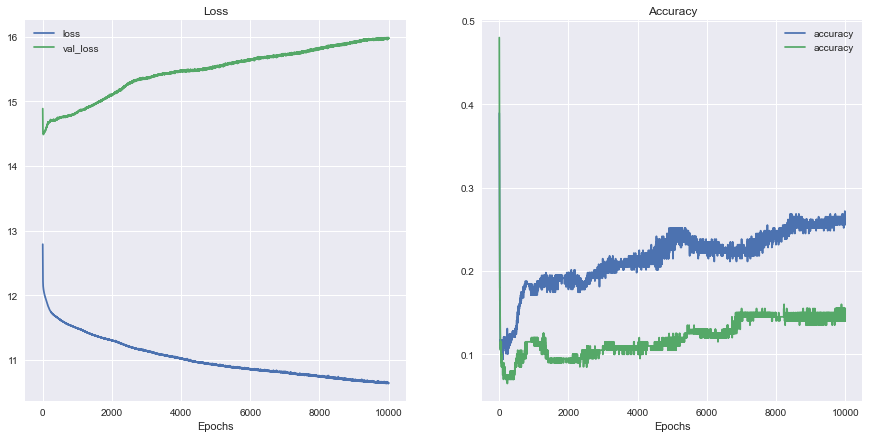

In [35]:
plot(history)

## Second Experiment

In [36]:
second_model = model2()
second_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['accuracy'])

In [37]:
history2 = second_model.fit(X_train, y_train, epochs=10000, validation_data=(X_valid, y_valid))

Epoch 1/10000
10/10 [==============================] - 1s 16ms/step - loss: 12.2262 - accuracy: 0.4295 - val_loss: 14.3918 - val_accuracy: 0.5400
Epoch 2/10000
10/10 [==============================] - 0s 4ms/step - loss: 12.2135 - accuracy: 0.4295 - val_loss: 14.3952 - val_accuracy: 0.5400
Epoch 3/10000
10/10 [==============================] - 0s 4ms/step - loss: 12.2060 - accuracy: 0.4295 - val_loss: 14.3977 - val_accuracy: 0.5400
Epoch 4/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.2004 - accuracy: 0.4295 - val_loss: 14.4009 - val_accuracy: 0.5400
Epoch 5/10000
10/10 [==============================] - 0s 4ms/step - loss: 12.1911 - accuracy: 0.4295 - val_loss: 14.4029 - val_accuracy: 0.5400
Epoch 6/10000
10/10 [==============================] - 0s 4ms/step - loss: 12.1823 - accuracy: 0.4295 - val_loss: 14.4064 - val_accuracy: 0.5400
Epoch 7/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.1716 - accuracy: 0.4295 - val_loss: 14.4107 - val_a

10/10 [==============================] - 0s 4ms/step - loss: 11.7419 - accuracy: 0.1644 - val_loss: 14.7426 - val_accuracy: 0.1100
Epoch 58/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.7373 - accuracy: 0.1678 - val_loss: 14.7444 - val_accuracy: 0.1100
Epoch 59/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.7353 - accuracy: 0.1678 - val_loss: 14.7314 - val_accuracy: 0.1100
Epoch 60/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.7353 - accuracy: 0.1711 - val_loss: 14.7431 - val_accuracy: 0.1050
Epoch 61/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.7313 - accuracy: 0.1644 - val_loss: 14.7565 - val_accuracy: 0.1050
Epoch 62/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.7279 - accuracy: 0.1711 - val_loss: 14.7611 - val_accuracy: 0.1100
Epoch 63/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.7266 - accuracy: 0.1678 - val_loss: 14.7469 - val_accuracy: 

10/10 [==============================] - 0s 4ms/step - loss: 11.5886 - accuracy: 0.1678 - val_loss: 14.8399 - val_accuracy: 0.1050
Epoch 114/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.5829 - accuracy: 0.1846 - val_loss: 14.8435 - val_accuracy: 0.1050
Epoch 115/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.5891 - accuracy: 0.1745 - val_loss: 14.8553 - val_accuracy: 0.1050
Epoch 116/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.5771 - accuracy: 0.1879 - val_loss: 14.8265 - val_accuracy: 0.1150
Epoch 117/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.5798 - accuracy: 0.1879 - val_loss: 14.8250 - val_accuracy: 0.1100
Epoch 118/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.5793 - accuracy: 0.1913 - val_loss: 14.8238 - val_accuracy: 0.1150
Epoch 119/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.5732 - accuracy: 0.1946 - val_loss: 14.8503 - val_accu

Epoch 169/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.4456 - accuracy: 0.2047 - val_loss: 14.8779 - val_accuracy: 0.1350
Epoch 170/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.4439 - accuracy: 0.1980 - val_loss: 14.8932 - val_accuracy: 0.1300
Epoch 171/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.4472 - accuracy: 0.2013 - val_loss: 14.8967 - val_accuracy: 0.1350
Epoch 172/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.4377 - accuracy: 0.1980 - val_loss: 14.8908 - val_accuracy: 0.1350
Epoch 173/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.4312 - accuracy: 0.2013 - val_loss: 14.8901 - val_accuracy: 0.1400
Epoch 174/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.4379 - accuracy: 0.1980 - val_loss: 14.9079 - val_accuracy: 0.1300
Epoch 175/10000
10/10 [==============================] - 0s 6ms/step - loss: 11.4343 - accuracy: 0.2047 - val_loss: 14

Epoch 225/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.3370 - accuracy: 0.2148 - val_loss: 15.0063 - val_accuracy: 0.1450
Epoch 226/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.3418 - accuracy: 0.2047 - val_loss: 15.0168 - val_accuracy: 0.1250
Epoch 227/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.3335 - accuracy: 0.2047 - val_loss: 15.0256 - val_accuracy: 0.1400
Epoch 228/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.3326 - accuracy: 0.2081 - val_loss: 15.0542 - val_accuracy: 0.1400
Epoch 229/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.3259 - accuracy: 0.1980 - val_loss: 15.0291 - val_accuracy: 0.1450
Epoch 230/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.3241 - accuracy: 0.2081 - val_loss: 15.0406 - val_accuracy: 0.1400
Epoch 231/10000
10/10 [==============================] - 0s 4ms/step - loss: 11.3276 - accuracy: 0.2215 - val_loss: 15

Epoch 281/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.2257 - accuracy: 0.2148 - val_loss: 15.1380 - val_accuracy: 0.1350
Epoch 282/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.2176 - accuracy: 0.2215 - val_loss: 15.1537 - val_accuracy: 0.1500
Epoch 283/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.2194 - accuracy: 0.2215 - val_loss: 15.1639 - val_accuracy: 0.1350
Epoch 284/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.2066 - accuracy: 0.2215 - val_loss: 15.1669 - val_accuracy: 0.1450
Epoch 285/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.2059 - accuracy: 0.2282 - val_loss: 15.1578 - val_accuracy: 0.1400
Epoch 286/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.2128 - accuracy: 0.2181 - val_loss: 15.1618 - val_accuracy: 0.1400
Epoch 287/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.2047 - accuracy: 0.2181 - val_loss: 15

Epoch 337/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.1138 - accuracy: 0.2450 - val_loss: 15.2304 - val_accuracy: 0.1450
Epoch 338/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.1017 - accuracy: 0.2282 - val_loss: 15.2501 - val_accuracy: 0.1450
Epoch 339/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.1029 - accuracy: 0.2282 - val_loss: 15.2347 - val_accuracy: 0.1350
Epoch 340/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.0998 - accuracy: 0.2383 - val_loss: 15.2733 - val_accuracy: 0.1500
Epoch 341/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.0870 - accuracy: 0.2282 - val_loss: 15.2538 - val_accuracy: 0.1500
Epoch 342/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.0832 - accuracy: 0.2349 - val_loss: 15.2767 - val_accuracy: 0.1400
Epoch 343/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.0814 - accuracy: 0.2450 - val_loss: 15

Epoch 393/10000
10/10 [==============================] - 0s 6ms/step - loss: 10.9811 - accuracy: 0.2416 - val_loss: 15.3885 - val_accuracy: 0.1350
Epoch 394/10000
10/10 [==============================] - 0s 6ms/step - loss: 10.9960 - accuracy: 0.2483 - val_loss: 15.3889 - val_accuracy: 0.1350
Epoch 395/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.9852 - accuracy: 0.2315 - val_loss: 15.3487 - val_accuracy: 0.1350
Epoch 396/10000
10/10 [==============================] - 0s 6ms/step - loss: 11.0075 - accuracy: 0.2550 - val_loss: 15.3988 - val_accuracy: 0.1350
Epoch 397/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.9756 - accuracy: 0.2383 - val_loss: 15.3994 - val_accuracy: 0.1350
Epoch 398/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.9716 - accuracy: 0.2483 - val_loss: 15.3883 - val_accuracy: 0.1350
Epoch 399/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.9679 - accuracy: 0.2383 - val_loss: 15

Epoch 449/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.8907 - accuracy: 0.2752 - val_loss: 15.4842 - val_accuracy: 0.1300
Epoch 450/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.8853 - accuracy: 0.2685 - val_loss: 15.4470 - val_accuracy: 0.1350
Epoch 451/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.8660 - accuracy: 0.2685 - val_loss: 15.4933 - val_accuracy: 0.1200
Epoch 452/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.8769 - accuracy: 0.2584 - val_loss: 15.4787 - val_accuracy: 0.1300
Epoch 453/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.8727 - accuracy: 0.2550 - val_loss: 15.4731 - val_accuracy: 0.1300
Epoch 454/10000
10/10 [==============================] - 0s 8ms/step - loss: 10.8701 - accuracy: 0.2651 - val_loss: 15.4875 - val_accuracy: 0.1400
Epoch 455/10000
10/10 [==============================] - 0s 6ms/step - loss: 10.8630 - accuracy: 0.2651 - val_loss: 15

Epoch 505/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.7935 - accuracy: 0.2282 - val_loss: 15.5743 - val_accuracy: 0.1400
Epoch 506/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.7785 - accuracy: 0.2752 - val_loss: 15.6053 - val_accuracy: 0.1250
Epoch 507/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.7752 - accuracy: 0.2651 - val_loss: 15.5965 - val_accuracy: 0.1450
Epoch 508/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.7708 - accuracy: 0.2785 - val_loss: 15.5985 - val_accuracy: 0.1350
Epoch 509/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.7577 - accuracy: 0.2752 - val_loss: 15.6022 - val_accuracy: 0.1400
Epoch 510/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.7643 - accuracy: 0.2685 - val_loss: 15.6446 - val_accuracy: 0.1350
Epoch 511/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.7721 - accuracy: 0.2718 - val_loss: 15

Epoch 561/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6925 - accuracy: 0.2617 - val_loss: 15.7077 - val_accuracy: 0.1300
Epoch 562/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6631 - accuracy: 0.2852 - val_loss: 15.7613 - val_accuracy: 0.1200
Epoch 563/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6674 - accuracy: 0.2785 - val_loss: 15.7350 - val_accuracy: 0.1250
Epoch 564/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6556 - accuracy: 0.2785 - val_loss: 15.7504 - val_accuracy: 0.1250
Epoch 565/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6754 - accuracy: 0.2718 - val_loss: 15.7093 - val_accuracy: 0.1300
Epoch 566/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.6563 - accuracy: 0.2886 - val_loss: 15.7643 - val_accuracy: 0.1200
Epoch 567/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6805 - accuracy: 0.2886 - val_loss: 15

Epoch 617/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5715 - accuracy: 0.2919 - val_loss: 15.8240 - val_accuracy: 0.1300
Epoch 618/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5681 - accuracy: 0.2987 - val_loss: 15.8808 - val_accuracy: 0.1200
Epoch 619/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5610 - accuracy: 0.2852 - val_loss: 15.8437 - val_accuracy: 0.1350
Epoch 620/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6233 - accuracy: 0.3020 - val_loss: 15.8847 - val_accuracy: 0.1100
Epoch 621/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5873 - accuracy: 0.2685 - val_loss: 15.8464 - val_accuracy: 0.1350
Epoch 622/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5772 - accuracy: 0.2919 - val_loss: 15.8777 - val_accuracy: 0.1150
Epoch 623/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5753 - accuracy: 0.2785 - val_loss: 15

Epoch 673/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5134 - accuracy: 0.2819 - val_loss: 15.9768 - val_accuracy: 0.1250
Epoch 674/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5018 - accuracy: 0.2953 - val_loss: 15.9704 - val_accuracy: 0.1200
Epoch 675/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5171 - accuracy: 0.2685 - val_loss: 15.9401 - val_accuracy: 0.1300
Epoch 676/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.4983 - accuracy: 0.2886 - val_loss: 16.0007 - val_accuracy: 0.1100
Epoch 677/10000
10/10 [==============================] - 0s 6ms/step - loss: 10.5068 - accuracy: 0.2852 - val_loss: 15.9506 - val_accuracy: 0.1100
Epoch 678/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5262 - accuracy: 0.2785 - val_loss: 16.0122 - val_accuracy: 0.1150
Epoch 679/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5114 - accuracy: 0.3054 - val_loss: 15

Epoch 729/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.4083 - accuracy: 0.2919 - val_loss: 16.0504 - val_accuracy: 0.1150
Epoch 730/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.4051 - accuracy: 0.3054 - val_loss: 16.0399 - val_accuracy: 0.1150
Epoch 731/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.4178 - accuracy: 0.2718 - val_loss: 16.0815 - val_accuracy: 0.1150
Epoch 732/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.4120 - accuracy: 0.2852 - val_loss: 16.0656 - val_accuracy: 0.1150
Epoch 733/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.4293 - accuracy: 0.2919 - val_loss: 16.1107 - val_accuracy: 0.1200
Epoch 734/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.4200 - accuracy: 0.2919 - val_loss: 16.0748 - val_accuracy: 0.1200
Epoch 735/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.4224 - accuracy: 0.2919 - val_loss: 16

Epoch 785/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.3406 - accuracy: 0.3020 - val_loss: 16.1648 - val_accuracy: 0.1150
Epoch 786/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.3458 - accuracy: 0.2987 - val_loss: 16.1184 - val_accuracy: 0.1350
Epoch 787/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.3651 - accuracy: 0.2785 - val_loss: 16.1454 - val_accuracy: 0.1150
Epoch 788/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.3674 - accuracy: 0.3121 - val_loss: 16.1615 - val_accuracy: 0.1100
Epoch 789/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.3628 - accuracy: 0.2886 - val_loss: 16.1144 - val_accuracy: 0.1300
Epoch 790/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.3517 - accuracy: 0.3020 - val_loss: 16.1544 - val_accuracy: 0.1200
Epoch 791/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.3383 - accuracy: 0.2919 - val_loss: 16

Epoch 841/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2786 - accuracy: 0.3087 - val_loss: 16.2405 - val_accuracy: 0.1150
Epoch 842/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2777 - accuracy: 0.2953 - val_loss: 16.1940 - val_accuracy: 0.1250
Epoch 843/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2813 - accuracy: 0.2987 - val_loss: 16.2473 - val_accuracy: 0.1250
Epoch 844/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.2756 - accuracy: 0.3087 - val_loss: 16.2200 - val_accuracy: 0.1200
Epoch 845/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2865 - accuracy: 0.3020 - val_loss: 16.2314 - val_accuracy: 0.1150
Epoch 846/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2987 - accuracy: 0.2785 - val_loss: 16.2134 - val_accuracy: 0.1300
Epoch 847/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2725 - accuracy: 0.2953 - val_loss: 16

Epoch 897/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2199 - accuracy: 0.3054 - val_loss: 16.3258 - val_accuracy: 0.1350
Epoch 898/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2087 - accuracy: 0.3188 - val_loss: 16.3119 - val_accuracy: 0.1250
Epoch 899/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2334 - accuracy: 0.2852 - val_loss: 16.2846 - val_accuracy: 0.1400
Epoch 900/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2226 - accuracy: 0.2953 - val_loss: 16.3719 - val_accuracy: 0.1050
Epoch 901/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2541 - accuracy: 0.2819 - val_loss: 16.3261 - val_accuracy: 0.1400
Epoch 902/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.2222 - accuracy: 0.3121 - val_loss: 16.3345 - val_accuracy: 0.1150
Epoch 903/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2207 - accuracy: 0.3087 - val_loss: 16

Epoch 953/10000
10/10 [==============================] - 0s 6ms/step - loss: 10.1810 - accuracy: 0.3188 - val_loss: 16.4201 - val_accuracy: 0.1300
Epoch 954/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.1476 - accuracy: 0.3087 - val_loss: 16.3931 - val_accuracy: 0.1300
Epoch 955/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.1736 - accuracy: 0.3020 - val_loss: 16.4574 - val_accuracy: 0.1300
Epoch 956/10000
10/10 [==============================] - 0s 7ms/step - loss: 10.1732 - accuracy: 0.3087 - val_loss: 16.3164 - val_accuracy: 0.1400
Epoch 957/10000
10/10 [==============================] - 0s 6ms/step - loss: 10.1955 - accuracy: 0.3020 - val_loss: 16.3934 - val_accuracy: 0.1250
Epoch 958/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.1507 - accuracy: 0.3121 - val_loss: 16.4320 - val_accuracy: 0.1300
Epoch 959/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.1526 - accuracy: 0.3054 - val_loss: 16

10/10 [==============================] - 0s 5ms/step - loss: 10.1000 - accuracy: 0.3221 - val_loss: 16.4657 - val_accuracy: 0.1400
Epoch 1009/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.0886 - accuracy: 0.3221 - val_loss: 16.4236 - val_accuracy: 0.1450
Epoch 1010/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.0931 - accuracy: 0.3188 - val_loss: 16.4889 - val_accuracy: 0.1250
Epoch 1011/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.1160 - accuracy: 0.2852 - val_loss: 16.3966 - val_accuracy: 0.1450
Epoch 1012/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.1164 - accuracy: 0.3121 - val_loss: 16.4345 - val_accuracy: 0.1450
Epoch 1013/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.1068 - accuracy: 0.3087 - val_loss: 16.4944 - val_accuracy: 0.1250
Epoch 1014/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.0843 - accuracy: 0.3154 - val_loss: 16.4724 - va

10/10 [==============================] - 0s 4ms/step - loss: 10.0390 - accuracy: 0.3121 - val_loss: 16.5651 - val_accuracy: 0.1350
Epoch 1064/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.0376 - accuracy: 0.3188 - val_loss: 16.5778 - val_accuracy: 0.1300
Epoch 1065/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.0769 - accuracy: 0.2919 - val_loss: 16.4924 - val_accuracy: 0.1400
Epoch 1066/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.0494 - accuracy: 0.3121 - val_loss: 16.5581 - val_accuracy: 0.1450
Epoch 1067/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.0563 - accuracy: 0.3121 - val_loss: 16.5672 - val_accuracy: 0.1350
Epoch 1068/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.0403 - accuracy: 0.3188 - val_loss: 16.5296 - val_accuracy: 0.1400
Epoch 1069/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.0112 - accuracy: 0.3188 - val_loss: 16.5333 - va

10/10 [==============================] - 0s 4ms/step - loss: 9.9959 - accuracy: 0.3188 - val_loss: 16.6700 - val_accuracy: 0.1300
Epoch 1119/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9978 - accuracy: 0.3255 - val_loss: 16.6855 - val_accuracy: 0.1400
Epoch 1120/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.0183 - accuracy: 0.2987 - val_loss: 16.6657 - val_accuracy: 0.1450
Epoch 1121/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.9879 - accuracy: 0.3121 - val_loss: 16.6876 - val_accuracy: 0.1400
Epoch 1122/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9870 - accuracy: 0.3255 - val_loss: 16.6610 - val_accuracy: 0.1350
Epoch 1123/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9738 - accuracy: 0.3221 - val_loss: 16.6773 - val_accuracy: 0.1300
Epoch 1124/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.9770 - accuracy: 0.3188 - val_loss: 16.6610 - val_accu

Epoch 1174/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9665 - accuracy: 0.3356 - val_loss: 16.7441 - val_accuracy: 0.1300
Epoch 1175/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9208 - accuracy: 0.3221 - val_loss: 16.7977 - val_accuracy: 0.1300
Epoch 1176/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.9614 - accuracy: 0.3121 - val_loss: 16.7710 - val_accuracy: 0.1350
Epoch 1177/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9267 - accuracy: 0.3154 - val_loss: 16.7884 - val_accuracy: 0.1400
Epoch 1178/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9442 - accuracy: 0.3154 - val_loss: 16.7309 - val_accuracy: 0.1350
Epoch 1179/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9200 - accuracy: 0.3255 - val_loss: 16.7596 - val_accuracy: 0.1400
Epoch 1180/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.9142 - accuracy: 0.3289 - val_loss: 16

Epoch 1230/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.9191 - accuracy: 0.3221 - val_loss: 16.8664 - val_accuracy: 0.1350
Epoch 1231/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8965 - accuracy: 0.3154 - val_loss: 16.7652 - val_accuracy: 0.1500
Epoch 1232/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.9587 - accuracy: 0.3523 - val_loss: 16.8824 - val_accuracy: 0.1300
Epoch 1233/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8934 - accuracy: 0.3221 - val_loss: 16.7696 - val_accuracy: 0.1350
Epoch 1234/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8968 - accuracy: 0.3121 - val_loss: 16.8646 - val_accuracy: 0.1350
Epoch 1235/10000
10/10 [==============================] - 0s 6ms/step - loss: 9.9111 - accuracy: 0.3255 - val_loss: 16.8226 - val_accuracy: 0.1350
Epoch 1236/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.8740 - accuracy: 0.3255 - val_loss: 16

Epoch 1286/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8252 - accuracy: 0.3322 - val_loss: 16.8461 - val_accuracy: 0.1350
Epoch 1287/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.8605 - accuracy: 0.3255 - val_loss: 16.8895 - val_accuracy: 0.1300
Epoch 1288/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.8362 - accuracy: 0.3389 - val_loss: 16.8964 - val_accuracy: 0.1300
Epoch 1289/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8356 - accuracy: 0.3221 - val_loss: 16.8483 - val_accuracy: 0.1400
Epoch 1290/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.8395 - accuracy: 0.3423 - val_loss: 16.9188 - val_accuracy: 0.1300
Epoch 1291/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8825 - accuracy: 0.3121 - val_loss: 16.8136 - val_accuracy: 0.1400
Epoch 1292/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.8445 - accuracy: 0.3255 - val_loss: 16

Epoch 1342/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7928 - accuracy: 0.3389 - val_loss: 17.0053 - val_accuracy: 0.1250
Epoch 1343/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8041 - accuracy: 0.3255 - val_loss: 16.8970 - val_accuracy: 0.1450
Epoch 1344/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.8155 - accuracy: 0.3423 - val_loss: 16.9702 - val_accuracy: 0.1250
Epoch 1345/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8149 - accuracy: 0.3389 - val_loss: 16.9231 - val_accuracy: 0.1300
Epoch 1346/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.8035 - accuracy: 0.3389 - val_loss: 16.9143 - val_accuracy: 0.1300
Epoch 1347/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7861 - accuracy: 0.3322 - val_loss: 16.8930 - val_accuracy: 0.1350
Epoch 1348/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8266 - accuracy: 0.3087 - val_loss: 16

Epoch 1398/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7410 - accuracy: 0.3356 - val_loss: 16.9975 - val_accuracy: 0.1400
Epoch 1399/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7376 - accuracy: 0.3423 - val_loss: 16.9941 - val_accuracy: 0.1300
Epoch 1400/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.7540 - accuracy: 0.3356 - val_loss: 17.0293 - val_accuracy: 0.1300
Epoch 1401/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7389 - accuracy: 0.3356 - val_loss: 16.9992 - val_accuracy: 0.1250
Epoch 1402/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7410 - accuracy: 0.3456 - val_loss: 16.9923 - val_accuracy: 0.1300
Epoch 1403/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7465 - accuracy: 0.3188 - val_loss: 17.0479 - val_accuracy: 0.1250
Epoch 1404/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.7359 - accuracy: 0.3255 - val_loss: 16

Epoch 1454/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.6965 - accuracy: 0.3356 - val_loss: 17.0506 - val_accuracy: 0.1300
Epoch 1455/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6905 - accuracy: 0.3389 - val_loss: 17.1046 - val_accuracy: 0.1250
Epoch 1456/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6961 - accuracy: 0.3389 - val_loss: 17.0420 - val_accuracy: 0.1250
Epoch 1457/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.7357 - accuracy: 0.3255 - val_loss: 17.0471 - val_accuracy: 0.1250
Epoch 1458/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7747 - accuracy: 0.3020 - val_loss: 17.0581 - val_accuracy: 0.1350
Epoch 1459/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7009 - accuracy: 0.3356 - val_loss: 17.0353 - val_accuracy: 0.1300
Epoch 1460/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.6763 - accuracy: 0.3456 - val_loss: 17

Epoch 1510/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6501 - accuracy: 0.3490 - val_loss: 17.2016 - val_accuracy: 0.1250
Epoch 1511/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6812 - accuracy: 0.3490 - val_loss: 17.1030 - val_accuracy: 0.1250
Epoch 1512/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.6598 - accuracy: 0.3389 - val_loss: 17.1260 - val_accuracy: 0.1350
Epoch 1513/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6544 - accuracy: 0.3456 - val_loss: 17.0833 - val_accuracy: 0.1400
Epoch 1514/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.6875 - accuracy: 0.3322 - val_loss: 17.1229 - val_accuracy: 0.1400
Epoch 1515/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.6624 - accuracy: 0.3389 - val_loss: 17.0904 - val_accuracy: 0.1400
Epoch 1516/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6805 - accuracy: 0.3523 - val_loss: 17

Epoch 1566/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.6257 - accuracy: 0.3423 - val_loss: 17.1483 - val_accuracy: 0.1400
Epoch 1567/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6459 - accuracy: 0.3389 - val_loss: 17.1635 - val_accuracy: 0.1250
Epoch 1568/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6241 - accuracy: 0.3490 - val_loss: 17.1852 - val_accuracy: 0.1300
Epoch 1569/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.6096 - accuracy: 0.3557 - val_loss: 17.2141 - val_accuracy: 0.1100
Epoch 1570/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6821 - accuracy: 0.2953 - val_loss: 17.1203 - val_accuracy: 0.1250
Epoch 1571/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6460 - accuracy: 0.3356 - val_loss: 17.1754 - val_accuracy: 0.1300
Epoch 1572/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.6265 - accuracy: 0.3456 - val_loss: 17

Epoch 1622/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5724 - accuracy: 0.3490 - val_loss: 17.2409 - val_accuracy: 0.1200
Epoch 1623/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5782 - accuracy: 0.3523 - val_loss: 17.2507 - val_accuracy: 0.1150
Epoch 1624/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.5969 - accuracy: 0.3456 - val_loss: 17.1988 - val_accuracy: 0.1250
Epoch 1625/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.5927 - accuracy: 0.3423 - val_loss: 17.2243 - val_accuracy: 0.1250
Epoch 1626/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.5999 - accuracy: 0.3456 - val_loss: 17.2169 - val_accuracy: 0.1250
Epoch 1627/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.5864 - accuracy: 0.3322 - val_loss: 17.2275 - val_accuracy: 0.1300
Epoch 1628/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6133 - accuracy: 0.3490 - val_loss: 17

Epoch 1678/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5639 - accuracy: 0.3557 - val_loss: 17.2948 - val_accuracy: 0.1050
Epoch 1679/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.5307 - accuracy: 0.3557 - val_loss: 17.2624 - val_accuracy: 0.1300
Epoch 1680/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5367 - accuracy: 0.3591 - val_loss: 17.3098 - val_accuracy: 0.1300
Epoch 1681/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.5523 - accuracy: 0.3557 - val_loss: 17.2665 - val_accuracy: 0.1300
Epoch 1682/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5735 - accuracy: 0.3289 - val_loss: 17.2670 - val_accuracy: 0.1400
Epoch 1683/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6423 - accuracy: 0.3289 - val_loss: 17.4290 - val_accuracy: 0.1000
Epoch 1684/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6285 - accuracy: 0.3322 - val_loss: 17

Epoch 1734/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5720 - accuracy: 0.3557 - val_loss: 17.4070 - val_accuracy: 0.1200
Epoch 1735/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5166 - accuracy: 0.3523 - val_loss: 17.3610 - val_accuracy: 0.1250
Epoch 1736/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5237 - accuracy: 0.3624 - val_loss: 17.3711 - val_accuracy: 0.1150
Epoch 1737/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5311 - accuracy: 0.3523 - val_loss: 17.4065 - val_accuracy: 0.1200
Epoch 1738/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5240 - accuracy: 0.3557 - val_loss: 17.3462 - val_accuracy: 0.1300
Epoch 1739/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5055 - accuracy: 0.3624 - val_loss: 17.3809 - val_accuracy: 0.1150
Epoch 1740/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4900 - accuracy: 0.3591 - val_loss: 17

Epoch 1790/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4990 - accuracy: 0.3624 - val_loss: 17.4776 - val_accuracy: 0.1250
Epoch 1791/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4808 - accuracy: 0.3557 - val_loss: 17.4643 - val_accuracy: 0.1200
Epoch 1792/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.5182 - accuracy: 0.3322 - val_loss: 17.4248 - val_accuracy: 0.1250
Epoch 1793/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4960 - accuracy: 0.3624 - val_loss: 17.4418 - val_accuracy: 0.1300
Epoch 1794/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4852 - accuracy: 0.3691 - val_loss: 17.4070 - val_accuracy: 0.1250
Epoch 1795/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.5042 - accuracy: 0.3523 - val_loss: 17.4912 - val_accuracy: 0.1150
Epoch 1796/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4970 - accuracy: 0.3423 - val_loss: 17

Epoch 1846/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4859 - accuracy: 0.3490 - val_loss: 17.4937 - val_accuracy: 0.1450
Epoch 1847/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4489 - accuracy: 0.3523 - val_loss: 17.4777 - val_accuracy: 0.1300
Epoch 1848/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4512 - accuracy: 0.3456 - val_loss: 17.4593 - val_accuracy: 0.1400
Epoch 1849/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4532 - accuracy: 0.3725 - val_loss: 17.4604 - val_accuracy: 0.1300
Epoch 1850/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4323 - accuracy: 0.3691 - val_loss: 17.5150 - val_accuracy: 0.1300
Epoch 1851/10000
10/10 [==============================] - 0s 7ms/step - loss: 9.4352 - accuracy: 0.3658 - val_loss: 17.5332 - val_accuracy: 0.1200
Epoch 1852/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4773 - accuracy: 0.3624 - val_loss: 17

Epoch 1902/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4053 - accuracy: 0.3691 - val_loss: 17.4631 - val_accuracy: 0.1400
Epoch 1903/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3983 - accuracy: 0.3758 - val_loss: 17.4554 - val_accuracy: 0.1300
Epoch 1904/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4147 - accuracy: 0.3691 - val_loss: 17.4690 - val_accuracy: 0.1400
Epoch 1905/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4403 - accuracy: 0.3758 - val_loss: 17.5473 - val_accuracy: 0.1200
Epoch 1906/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4200 - accuracy: 0.3557 - val_loss: 17.5503 - val_accuracy: 0.1300
Epoch 1907/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4118 - accuracy: 0.3691 - val_loss: 17.4865 - val_accuracy: 0.1450
Epoch 1908/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4105 - accuracy: 0.3591 - val_loss: 17

Epoch 1958/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4551 - accuracy: 0.3591 - val_loss: 17.6214 - val_accuracy: 0.1050
Epoch 1959/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4213 - accuracy: 0.3658 - val_loss: 17.6278 - val_accuracy: 0.1150
Epoch 1960/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4729 - accuracy: 0.3423 - val_loss: 17.5096 - val_accuracy: 0.1450
Epoch 1961/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4261 - accuracy: 0.3490 - val_loss: 17.6009 - val_accuracy: 0.1350
Epoch 1962/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4616 - accuracy: 0.3423 - val_loss: 17.5408 - val_accuracy: 0.1350
Epoch 1963/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.4299 - accuracy: 0.3423 - val_loss: 17.5669 - val_accuracy: 0.1400
Epoch 1964/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3900 - accuracy: 0.3624 - val_loss: 17

Epoch 2014/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3779 - accuracy: 0.3624 - val_loss: 17.6117 - val_accuracy: 0.1250
Epoch 2015/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.3892 - accuracy: 0.3658 - val_loss: 17.6866 - val_accuracy: 0.1400
Epoch 2016/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.3917 - accuracy: 0.3624 - val_loss: 17.6582 - val_accuracy: 0.1200
Epoch 2017/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.3759 - accuracy: 0.3658 - val_loss: 17.6388 - val_accuracy: 0.1300
Epoch 2018/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.3633 - accuracy: 0.3691 - val_loss: 17.5912 - val_accuracy: 0.1450
Epoch 2019/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3490 - accuracy: 0.3725 - val_loss: 17.7162 - val_accuracy: 0.1200
Epoch 2020/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.3860 - accuracy: 0.3591 - val_loss: 17

Epoch 2070/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.3264 - accuracy: 0.3725 - val_loss: 17.6881 - val_accuracy: 0.1300
Epoch 2071/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3375 - accuracy: 0.3591 - val_loss: 17.6314 - val_accuracy: 0.1450
Epoch 2072/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3284 - accuracy: 0.3591 - val_loss: 17.6308 - val_accuracy: 0.1400
Epoch 2073/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.3778 - accuracy: 0.3557 - val_loss: 17.6986 - val_accuracy: 0.1300
Epoch 2074/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3904 - accuracy: 0.3658 - val_loss: 17.6828 - val_accuracy: 0.1450
Epoch 2075/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3780 - accuracy: 0.3456 - val_loss: 17.6517 - val_accuracy: 0.1400
Epoch 2076/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3399 - accuracy: 0.3523 - val_loss: 17

Epoch 2126/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.3118 - accuracy: 0.3658 - val_loss: 17.7331 - val_accuracy: 0.1450
Epoch 2127/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3362 - accuracy: 0.3691 - val_loss: 17.7804 - val_accuracy: 0.1500
Epoch 2128/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3288 - accuracy: 0.3591 - val_loss: 17.7750 - val_accuracy: 0.1350
Epoch 2129/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3008 - accuracy: 0.3725 - val_loss: 17.6869 - val_accuracy: 0.1400
Epoch 2130/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3024 - accuracy: 0.3658 - val_loss: 17.7246 - val_accuracy: 0.1450
Epoch 2131/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2985 - accuracy: 0.3725 - val_loss: 17.7590 - val_accuracy: 0.1450
Epoch 2132/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3065 - accuracy: 0.3557 - val_loss: 17

Epoch 2182/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3071 - accuracy: 0.3725 - val_loss: 17.9022 - val_accuracy: 0.1300
Epoch 2183/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.3648 - accuracy: 0.3456 - val_loss: 17.8286 - val_accuracy: 0.1450
Epoch 2184/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3082 - accuracy: 0.3658 - val_loss: 17.7984 - val_accuracy: 0.1350
Epoch 2185/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2775 - accuracy: 0.3691 - val_loss: 17.7890 - val_accuracy: 0.1450
Epoch 2186/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2734 - accuracy: 0.3658 - val_loss: 17.8276 - val_accuracy: 0.1300
Epoch 2187/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3138 - accuracy: 0.3490 - val_loss: 17.7928 - val_accuracy: 0.1450
Epoch 2188/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.3157 - accuracy: 0.3523 - val_loss: 17

Epoch 2238/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2740 - accuracy: 0.3591 - val_loss: 17.8266 - val_accuracy: 0.1400
Epoch 2239/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2574 - accuracy: 0.3658 - val_loss: 17.8226 - val_accuracy: 0.1500
Epoch 2240/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2770 - accuracy: 0.3557 - val_loss: 17.8794 - val_accuracy: 0.1500
Epoch 2241/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2920 - accuracy: 0.3423 - val_loss: 17.8636 - val_accuracy: 0.1500
Epoch 2242/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2895 - accuracy: 0.3557 - val_loss: 17.9256 - val_accuracy: 0.1350
Epoch 2243/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2716 - accuracy: 0.3523 - val_loss: 17.8121 - val_accuracy: 0.1450
Epoch 2244/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2791 - accuracy: 0.3557 - val_loss: 17

Epoch 2294/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2688 - accuracy: 0.3557 - val_loss: 17.8617 - val_accuracy: 0.1400
Epoch 2295/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2506 - accuracy: 0.3591 - val_loss: 17.8125 - val_accuracy: 0.1500
Epoch 2296/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2379 - accuracy: 0.3557 - val_loss: 17.8800 - val_accuracy: 0.1450
Epoch 2297/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2240 - accuracy: 0.3658 - val_loss: 17.8260 - val_accuracy: 0.1500
Epoch 2298/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2165 - accuracy: 0.3557 - val_loss: 17.8866 - val_accuracy: 0.1450
Epoch 2299/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2134 - accuracy: 0.3658 - val_loss: 17.8917 - val_accuracy: 0.1400
Epoch 2300/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2124 - accuracy: 0.3591 - val_loss: 17

Epoch 2350/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2659 - accuracy: 0.3456 - val_loss: 17.8663 - val_accuracy: 0.1650
Epoch 2351/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2096 - accuracy: 0.3624 - val_loss: 17.8942 - val_accuracy: 0.1450
Epoch 2352/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.1831 - accuracy: 0.3624 - val_loss: 17.8770 - val_accuracy: 0.1500
Epoch 2353/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1841 - accuracy: 0.3557 - val_loss: 17.8536 - val_accuracy: 0.1550
Epoch 2354/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2163 - accuracy: 0.3658 - val_loss: 17.8962 - val_accuracy: 0.1450
Epoch 2355/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2176 - accuracy: 0.3658 - val_loss: 17.8913 - val_accuracy: 0.1450
Epoch 2356/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2119 - accuracy: 0.3423 - val_loss: 17

Epoch 2406/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2061 - accuracy: 0.3557 - val_loss: 17.8619 - val_accuracy: 0.1550
Epoch 2407/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2229 - accuracy: 0.3591 - val_loss: 17.9021 - val_accuracy: 0.1400
Epoch 2408/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2210 - accuracy: 0.3624 - val_loss: 18.0359 - val_accuracy: 0.1350
Epoch 2409/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2549 - accuracy: 0.3389 - val_loss: 17.9037 - val_accuracy: 0.1500
Epoch 2410/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2344 - accuracy: 0.3490 - val_loss: 17.8812 - val_accuracy: 0.1600
Epoch 2411/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2274 - accuracy: 0.3423 - val_loss: 17.8730 - val_accuracy: 0.1400
Epoch 2412/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2402 - accuracy: 0.3423 - val_loss: 17

Epoch 2462/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1759 - accuracy: 0.3591 - val_loss: 17.9801 - val_accuracy: 0.1400
Epoch 2463/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.1748 - accuracy: 0.3456 - val_loss: 17.9571 - val_accuracy: 0.1450
Epoch 2464/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1481 - accuracy: 0.3658 - val_loss: 17.9351 - val_accuracy: 0.1550
Epoch 2465/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2010 - accuracy: 0.3389 - val_loss: 17.9709 - val_accuracy: 0.1650
Epoch 2466/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2069 - accuracy: 0.3591 - val_loss: 18.0660 - val_accuracy: 0.1200
Epoch 2467/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2237 - accuracy: 0.3054 - val_loss: 17.9267 - val_accuracy: 0.1550
Epoch 2468/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2238 - accuracy: 0.3322 - val_loss: 17

Epoch 2518/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1209 - accuracy: 0.3758 - val_loss: 17.9815 - val_accuracy: 0.1500
Epoch 2519/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1440 - accuracy: 0.3523 - val_loss: 17.9413 - val_accuracy: 0.1550
Epoch 2520/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1675 - accuracy: 0.3389 - val_loss: 17.9414 - val_accuracy: 0.1650
Epoch 2521/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2447 - accuracy: 0.3188 - val_loss: 17.9845 - val_accuracy: 0.1500
Epoch 2522/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.1982 - accuracy: 0.3523 - val_loss: 17.9806 - val_accuracy: 0.1450
Epoch 2523/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.2326 - accuracy: 0.3523 - val_loss: 18.0167 - val_accuracy: 0.1300
Epoch 2524/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1559 - accuracy: 0.3691 - val_loss: 18

Epoch 2574/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1079 - accuracy: 0.3624 - val_loss: 17.9749 - val_accuracy: 0.1500
Epoch 2575/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.1231 - accuracy: 0.3624 - val_loss: 18.1191 - val_accuracy: 0.1400
Epoch 2576/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.1626 - accuracy: 0.3289 - val_loss: 18.0118 - val_accuracy: 0.1550
Epoch 2577/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.1255 - accuracy: 0.3624 - val_loss: 17.9836 - val_accuracy: 0.1450
Epoch 2578/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1006 - accuracy: 0.3624 - val_loss: 18.0525 - val_accuracy: 0.1500
Epoch 2579/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1490 - accuracy: 0.3523 - val_loss: 17.9958 - val_accuracy: 0.1500
Epoch 2580/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.1381 - accuracy: 0.3423 - val_loss: 18

Epoch 2630/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.1418 - accuracy: 0.3591 - val_loss: 18.0528 - val_accuracy: 0.1550
Epoch 2631/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.1282 - accuracy: 0.3389 - val_loss: 17.9897 - val_accuracy: 0.1550
Epoch 2632/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.1236 - accuracy: 0.3456 - val_loss: 17.9878 - val_accuracy: 0.1500
Epoch 2633/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0723 - accuracy: 0.3591 - val_loss: 18.0590 - val_accuracy: 0.1450
Epoch 2634/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0549 - accuracy: 0.3624 - val_loss: 17.9921 - val_accuracy: 0.1450
Epoch 2635/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0539 - accuracy: 0.3624 - val_loss: 18.0539 - val_accuracy: 0.1500
Epoch 2636/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0927 - accuracy: 0.3356 - val_loss: 17

Epoch 2686/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.0649 - accuracy: 0.3691 - val_loss: 18.0327 - val_accuracy: 0.1550
Epoch 2687/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0579 - accuracy: 0.3658 - val_loss: 18.0582 - val_accuracy: 0.1550
Epoch 2688/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0531 - accuracy: 0.3624 - val_loss: 18.0059 - val_accuracy: 0.1400
Epoch 2689/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0445 - accuracy: 0.3624 - val_loss: 18.0734 - val_accuracy: 0.1500
Epoch 2690/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0561 - accuracy: 0.3523 - val_loss: 18.0099 - val_accuracy: 0.1500
Epoch 2691/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0594 - accuracy: 0.3490 - val_loss: 18.0268 - val_accuracy: 0.1550
Epoch 2692/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0601 - accuracy: 0.3322 - val_loss: 18

Epoch 2742/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0580 - accuracy: 0.3423 - val_loss: 18.0357 - val_accuracy: 0.1600
Epoch 2743/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0736 - accuracy: 0.3389 - val_loss: 18.0464 - val_accuracy: 0.1600
Epoch 2744/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.0844 - accuracy: 0.3624 - val_loss: 18.1079 - val_accuracy: 0.1400
Epoch 2745/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0451 - accuracy: 0.3523 - val_loss: 18.0886 - val_accuracy: 0.1550
Epoch 2746/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0283 - accuracy: 0.3658 - val_loss: 18.1258 - val_accuracy: 0.1450
Epoch 2747/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.0474 - accuracy: 0.3490 - val_loss: 18.0616 - val_accuracy: 0.1300
Epoch 2748/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0961 - accuracy: 0.3523 - val_loss: 18

Epoch 2798/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1525 - accuracy: 0.3591 - val_loss: 18.2544 - val_accuracy: 0.1200
Epoch 2799/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0803 - accuracy: 0.3020 - val_loss: 18.0166 - val_accuracy: 0.1550
Epoch 2800/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0912 - accuracy: 0.3389 - val_loss: 18.1618 - val_accuracy: 0.1400
Epoch 2801/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.0544 - accuracy: 0.3523 - val_loss: 18.1759 - val_accuracy: 0.1350
Epoch 2802/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0401 - accuracy: 0.3322 - val_loss: 18.1685 - val_accuracy: 0.1550
Epoch 2803/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0357 - accuracy: 0.3591 - val_loss: 18.1661 - val_accuracy: 0.1400
Epoch 2804/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.0274 - accuracy: 0.3591 - val_loss: 18

Epoch 2854/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9688 - accuracy: 0.3691 - val_loss: 18.1739 - val_accuracy: 0.1450
Epoch 2855/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9604 - accuracy: 0.3591 - val_loss: 18.1903 - val_accuracy: 0.1300
Epoch 2856/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9650 - accuracy: 0.3624 - val_loss: 18.1633 - val_accuracy: 0.1300
Epoch 2857/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9572 - accuracy: 0.3591 - val_loss: 18.2177 - val_accuracy: 0.1400
Epoch 2858/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9830 - accuracy: 0.3490 - val_loss: 18.1206 - val_accuracy: 0.1400
Epoch 2859/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0029 - accuracy: 0.3557 - val_loss: 18.2535 - val_accuracy: 0.1350
Epoch 2860/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9977 - accuracy: 0.3490 - val_loss: 18

Epoch 2910/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9966 - accuracy: 0.3322 - val_loss: 18.1874 - val_accuracy: 0.1400
Epoch 2911/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9771 - accuracy: 0.3523 - val_loss: 18.1777 - val_accuracy: 0.1350
Epoch 2912/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.0016 - accuracy: 0.3255 - val_loss: 18.2206 - val_accuracy: 0.1450
Epoch 2913/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9675 - accuracy: 0.3624 - val_loss: 18.2159 - val_accuracy: 0.1250
Epoch 2914/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9457 - accuracy: 0.3658 - val_loss: 18.2182 - val_accuracy: 0.1350
Epoch 2915/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9720 - accuracy: 0.3490 - val_loss: 18.1097 - val_accuracy: 0.1400
Epoch 2916/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0130 - accuracy: 0.3423 - val_loss: 18

Epoch 2966/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9582 - accuracy: 0.3356 - val_loss: 18.1685 - val_accuracy: 0.1500
Epoch 2967/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9558 - accuracy: 0.3758 - val_loss: 18.2744 - val_accuracy: 0.1350
Epoch 2968/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9396 - accuracy: 0.3557 - val_loss: 18.3277 - val_accuracy: 0.1300
Epoch 2969/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0172 - accuracy: 0.3188 - val_loss: 18.2510 - val_accuracy: 0.1350
Epoch 2970/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9795 - accuracy: 0.3456 - val_loss: 18.2718 - val_accuracy: 0.1350
Epoch 2971/10000
10/10 [==============================] - 0s 7ms/step - loss: 9.0157 - accuracy: 0.3624 - val_loss: 18.2509 - val_accuracy: 0.1400
Epoch 2972/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9429 - accuracy: 0.3691 - val_loss: 18

Epoch 3022/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9641 - accuracy: 0.3523 - val_loss: 18.3289 - val_accuracy: 0.1350
Epoch 3023/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9649 - accuracy: 0.3423 - val_loss: 18.4004 - val_accuracy: 0.1300
Epoch 3024/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9564 - accuracy: 0.3456 - val_loss: 18.2416 - val_accuracy: 0.1450
Epoch 3025/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9751 - accuracy: 0.3423 - val_loss: 18.3978 - val_accuracy: 0.1250
Epoch 3026/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0273 - accuracy: 0.3154 - val_loss: 18.3566 - val_accuracy: 0.1450
Epoch 3027/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9281 - accuracy: 0.3523 - val_loss: 18.3398 - val_accuracy: 0.1300
Epoch 3028/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8963 - accuracy: 0.3557 - val_loss: 18

Epoch 3078/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8911 - accuracy: 0.3624 - val_loss: 18.3323 - val_accuracy: 0.1250
Epoch 3079/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8792 - accuracy: 0.3624 - val_loss: 18.3153 - val_accuracy: 0.1400
Epoch 3080/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9465 - accuracy: 0.3322 - val_loss: 18.3045 - val_accuracy: 0.1400
Epoch 3081/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9436 - accuracy: 0.3490 - val_loss: 18.3745 - val_accuracy: 0.1350
Epoch 3082/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9582 - accuracy: 0.3490 - val_loss: 18.3209 - val_accuracy: 0.1400
Epoch 3083/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9846 - accuracy: 0.3389 - val_loss: 18.3976 - val_accuracy: 0.1150
Epoch 3084/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9157 - accuracy: 0.3557 - val_loss: 18

Epoch 3134/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8777 - accuracy: 0.3591 - val_loss: 18.3621 - val_accuracy: 0.1350
Epoch 3135/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8460 - accuracy: 0.3591 - val_loss: 18.3986 - val_accuracy: 0.1350
Epoch 3136/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8592 - accuracy: 0.3691 - val_loss: 18.4002 - val_accuracy: 0.1350
Epoch 3137/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8438 - accuracy: 0.3591 - val_loss: 18.3892 - val_accuracy: 0.1300
Epoch 3138/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.9024 - accuracy: 0.3557 - val_loss: 18.4702 - val_accuracy: 0.1250
Epoch 3139/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8992 - accuracy: 0.3389 - val_loss: 18.3919 - val_accuracy: 0.1250
Epoch 3140/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8756 - accuracy: 0.3490 - val_loss: 18

Epoch 3190/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8575 - accuracy: 0.3557 - val_loss: 18.3696 - val_accuracy: 0.1400
Epoch 3191/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8556 - accuracy: 0.3591 - val_loss: 18.4289 - val_accuracy: 0.1250
Epoch 3192/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8462 - accuracy: 0.3523 - val_loss: 18.5142 - val_accuracy: 0.1200
Epoch 3193/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8471 - accuracy: 0.3456 - val_loss: 18.4931 - val_accuracy: 0.1300
Epoch 3194/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8613 - accuracy: 0.3591 - val_loss: 18.4070 - val_accuracy: 0.1300
Epoch 3195/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8344 - accuracy: 0.3591 - val_loss: 18.4489 - val_accuracy: 0.1400
Epoch 3196/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8444 - accuracy: 0.3523 - val_loss: 18

Epoch 3246/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7873 - accuracy: 0.3691 - val_loss: 18.4735 - val_accuracy: 0.1350
Epoch 3247/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8240 - accuracy: 0.3523 - val_loss: 18.3990 - val_accuracy: 0.1250
Epoch 3248/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8420 - accuracy: 0.3691 - val_loss: 18.4887 - val_accuracy: 0.1350
Epoch 3249/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8184 - accuracy: 0.3523 - val_loss: 18.4675 - val_accuracy: 0.1450
Epoch 3250/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8137 - accuracy: 0.3624 - val_loss: 18.4306 - val_accuracy: 0.1350
Epoch 3251/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8134 - accuracy: 0.3624 - val_loss: 18.4720 - val_accuracy: 0.1400
Epoch 3252/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8560 - accuracy: 0.3624 - val_loss: 18

Epoch 3302/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7777 - accuracy: 0.3557 - val_loss: 18.4641 - val_accuracy: 0.1350
Epoch 3303/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8126 - accuracy: 0.3658 - val_loss: 18.5230 - val_accuracy: 0.1450
Epoch 3304/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8294 - accuracy: 0.3591 - val_loss: 18.5630 - val_accuracy: 0.1250
Epoch 3305/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8858 - accuracy: 0.2953 - val_loss: 18.4775 - val_accuracy: 0.1400
Epoch 3306/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.8384 - accuracy: 0.3423 - val_loss: 18.6405 - val_accuracy: 0.1250
Epoch 3307/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8121 - accuracy: 0.3591 - val_loss: 18.5475 - val_accuracy: 0.1250
Epoch 3308/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7753 - accuracy: 0.3591 - val_loss: 18

Epoch 3358/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7554 - accuracy: 0.3591 - val_loss: 18.6124 - val_accuracy: 0.1300
Epoch 3359/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7571 - accuracy: 0.3658 - val_loss: 18.6576 - val_accuracy: 0.1350
Epoch 3360/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7629 - accuracy: 0.3591 - val_loss: 18.5828 - val_accuracy: 0.1300
Epoch 3361/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7460 - accuracy: 0.3691 - val_loss: 18.6296 - val_accuracy: 0.1300
Epoch 3362/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7337 - accuracy: 0.3725 - val_loss: 18.5536 - val_accuracy: 0.1300
Epoch 3363/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7591 - accuracy: 0.3523 - val_loss: 18.5510 - val_accuracy: 0.1400
Epoch 3364/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7468 - accuracy: 0.3624 - val_loss: 18

Epoch 3414/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7224 - accuracy: 0.3591 - val_loss: 18.5870 - val_accuracy: 0.1400
Epoch 3415/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7148 - accuracy: 0.3658 - val_loss: 18.6384 - val_accuracy: 0.1350
Epoch 3416/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7028 - accuracy: 0.3658 - val_loss: 18.6193 - val_accuracy: 0.1450
Epoch 3417/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7483 - accuracy: 0.3591 - val_loss: 18.6370 - val_accuracy: 0.1350
Epoch 3418/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7252 - accuracy: 0.3624 - val_loss: 18.5947 - val_accuracy: 0.1350
Epoch 3419/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7543 - accuracy: 0.3423 - val_loss: 18.6086 - val_accuracy: 0.1400
Epoch 3420/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7635 - accuracy: 0.3624 - val_loss: 18

Epoch 3470/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7069 - accuracy: 0.3557 - val_loss: 18.6978 - val_accuracy: 0.1250
Epoch 3471/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7200 - accuracy: 0.3591 - val_loss: 18.8133 - val_accuracy: 0.1300
Epoch 3472/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7380 - accuracy: 0.3456 - val_loss: 18.6225 - val_accuracy: 0.1300
Epoch 3473/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7099 - accuracy: 0.3523 - val_loss: 18.7260 - val_accuracy: 0.1250
Epoch 3474/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7439 - accuracy: 0.3490 - val_loss: 18.7125 - val_accuracy: 0.1250
Epoch 3475/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7321 - accuracy: 0.3456 - val_loss: 18.7309 - val_accuracy: 0.1300
Epoch 3476/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7130 - accuracy: 0.3423 - val_loss: 18

Epoch 3526/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7218 - accuracy: 0.3456 - val_loss: 18.7303 - val_accuracy: 0.1300
Epoch 3527/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.6999 - accuracy: 0.3356 - val_loss: 18.7287 - val_accuracy: 0.1300
Epoch 3528/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.6895 - accuracy: 0.3490 - val_loss: 18.6133 - val_accuracy: 0.1350
Epoch 3529/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7542 - accuracy: 0.3456 - val_loss: 18.7957 - val_accuracy: 0.1350
Epoch 3530/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7309 - accuracy: 0.3356 - val_loss: 18.7314 - val_accuracy: 0.1350
Epoch 3531/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.7380 - accuracy: 0.3624 - val_loss: 18.7814 - val_accuracy: 0.1200
Epoch 3532/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.6981 - accuracy: 0.3188 - val_loss: 18

Epoch 3582/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.6582 - accuracy: 0.3423 - val_loss: 18.7620 - val_accuracy: 0.1400
Epoch 3583/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.6451 - accuracy: 0.3490 - val_loss: 18.7148 - val_accuracy: 0.1450
Epoch 3584/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.6555 - accuracy: 0.3389 - val_loss: 18.7831 - val_accuracy: 0.1550
Epoch 3585/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.6628 - accuracy: 0.3490 - val_loss: 18.8108 - val_accuracy: 0.1350
Epoch 3586/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.6491 - accuracy: 0.3490 - val_loss: 18.7274 - val_accuracy: 0.1400
Epoch 3587/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.6741 - accuracy: 0.3591 - val_loss: 18.8012 - val_accuracy: 0.1400
Epoch 3588/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.6352 - accuracy: 0.3490 - val_loss: 18

Epoch 3638/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.6241 - accuracy: 0.3456 - val_loss: 18.7671 - val_accuracy: 0.1550
Epoch 3639/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.6173 - accuracy: 0.3523 - val_loss: 18.7987 - val_accuracy: 0.1500
Epoch 3640/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5927 - accuracy: 0.3523 - val_loss: 18.8332 - val_accuracy: 0.1450
Epoch 3641/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5982 - accuracy: 0.3658 - val_loss: 18.7932 - val_accuracy: 0.1450
Epoch 3642/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.6317 - accuracy: 0.3691 - val_loss: 18.7823 - val_accuracy: 0.1400
Epoch 3643/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.6028 - accuracy: 0.3624 - val_loss: 18.8046 - val_accuracy: 0.1550
Epoch 3644/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.6591 - accuracy: 0.3456 - val_loss: 18

Epoch 3694/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5829 - accuracy: 0.3389 - val_loss: 18.8752 - val_accuracy: 0.1350
Epoch 3695/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5510 - accuracy: 0.3456 - val_loss: 18.8713 - val_accuracy: 0.1350
Epoch 3696/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5834 - accuracy: 0.3557 - val_loss: 18.8223 - val_accuracy: 0.1450
Epoch 3697/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5642 - accuracy: 0.3490 - val_loss: 18.7914 - val_accuracy: 0.1550
Epoch 3698/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5846 - accuracy: 0.3456 - val_loss: 18.8262 - val_accuracy: 0.1450
Epoch 3699/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5783 - accuracy: 0.3389 - val_loss: 18.8379 - val_accuracy: 0.1400
Epoch 3700/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5788 - accuracy: 0.3523 - val_loss: 18

Epoch 3750/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5661 - accuracy: 0.3557 - val_loss: 18.9851 - val_accuracy: 0.1450
Epoch 3751/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5572 - accuracy: 0.3356 - val_loss: 18.8899 - val_accuracy: 0.1400
Epoch 3752/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5243 - accuracy: 0.3490 - val_loss: 18.8611 - val_accuracy: 0.1350
Epoch 3753/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4996 - accuracy: 0.3389 - val_loss: 18.8753 - val_accuracy: 0.1550
Epoch 3754/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5202 - accuracy: 0.3523 - val_loss: 18.8092 - val_accuracy: 0.1600
Epoch 3755/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5951 - accuracy: 0.3255 - val_loss: 18.8900 - val_accuracy: 0.1450
Epoch 3756/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5855 - accuracy: 0.3523 - val_loss: 18

Epoch 3806/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5265 - accuracy: 0.3356 - val_loss: 18.9248 - val_accuracy: 0.1550
Epoch 3807/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5718 - accuracy: 0.3188 - val_loss: 18.8588 - val_accuracy: 0.1450
Epoch 3808/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5605 - accuracy: 0.3490 - val_loss: 18.9457 - val_accuracy: 0.1500
Epoch 3809/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.5656 - accuracy: 0.3490 - val_loss: 18.9581 - val_accuracy: 0.1400
Epoch 3810/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5472 - accuracy: 0.3389 - val_loss: 18.8989 - val_accuracy: 0.1500
Epoch 3811/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5657 - accuracy: 0.3456 - val_loss: 18.9864 - val_accuracy: 0.1350
Epoch 3812/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.5273 - accuracy: 0.3456 - val_loss: 18

Epoch 3862/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4579 - accuracy: 0.3389 - val_loss: 18.9067 - val_accuracy: 0.1550
Epoch 3863/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4576 - accuracy: 0.3490 - val_loss: 19.0146 - val_accuracy: 0.1450
Epoch 3864/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4738 - accuracy: 0.3423 - val_loss: 18.9968 - val_accuracy: 0.1500
Epoch 3865/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4806 - accuracy: 0.3523 - val_loss: 18.9793 - val_accuracy: 0.1450
Epoch 3866/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.4860 - accuracy: 0.3591 - val_loss: 19.0055 - val_accuracy: 0.1450
Epoch 3867/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4848 - accuracy: 0.3389 - val_loss: 19.0486 - val_accuracy: 0.1350
Epoch 3868/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4932 - accuracy: 0.3423 - val_loss: 18

Epoch 3918/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.4577 - accuracy: 0.3557 - val_loss: 19.1177 - val_accuracy: 0.1400
Epoch 3919/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4292 - accuracy: 0.3591 - val_loss: 19.0777 - val_accuracy: 0.1450
Epoch 3920/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.4193 - accuracy: 0.3591 - val_loss: 19.0376 - val_accuracy: 0.1350
Epoch 3921/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.4303 - accuracy: 0.3591 - val_loss: 19.1395 - val_accuracy: 0.1350
Epoch 3922/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4208 - accuracy: 0.3557 - val_loss: 18.9975 - val_accuracy: 0.1400
Epoch 3923/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.4270 - accuracy: 0.3557 - val_loss: 19.0791 - val_accuracy: 0.1500
Epoch 3924/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4663 - accuracy: 0.3423 - val_loss: 18

Epoch 3974/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3833 - accuracy: 0.3389 - val_loss: 19.1215 - val_accuracy: 0.1450
Epoch 3975/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3803 - accuracy: 0.3591 - val_loss: 19.0784 - val_accuracy: 0.1350
Epoch 3976/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3714 - accuracy: 0.3490 - val_loss: 19.1292 - val_accuracy: 0.1450
Epoch 3977/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3828 - accuracy: 0.3490 - val_loss: 19.1240 - val_accuracy: 0.1400
Epoch 3978/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.4232 - accuracy: 0.3658 - val_loss: 19.1497 - val_accuracy: 0.1350
Epoch 3979/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.4726 - accuracy: 0.3289 - val_loss: 19.1380 - val_accuracy: 0.1400
Epoch 3980/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4045 - accuracy: 0.3389 - val_loss: 19

Epoch 4030/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.3522 - accuracy: 0.3557 - val_loss: 19.2410 - val_accuracy: 0.1450
Epoch 4031/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.4074 - accuracy: 0.3389 - val_loss: 19.1551 - val_accuracy: 0.1500
Epoch 4032/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.3683 - accuracy: 0.3490 - val_loss: 19.1773 - val_accuracy: 0.1550
Epoch 4033/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4172 - accuracy: 0.3289 - val_loss: 19.1421 - val_accuracy: 0.1600
Epoch 4034/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4349 - accuracy: 0.3389 - val_loss: 19.3239 - val_accuracy: 0.1250
Epoch 4035/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.4339 - accuracy: 0.3389 - val_loss: 19.2140 - val_accuracy: 0.1500
Epoch 4036/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.4566 - accuracy: 0.2852 - val_loss: 19

Epoch 4086/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.3036 - accuracy: 0.3490 - val_loss: 19.3045 - val_accuracy: 0.1600
Epoch 4087/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3098 - accuracy: 0.3591 - val_loss: 19.3278 - val_accuracy: 0.1550
Epoch 4088/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2969 - accuracy: 0.3624 - val_loss: 19.3577 - val_accuracy: 0.1400
Epoch 4089/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3081 - accuracy: 0.3423 - val_loss: 19.2411 - val_accuracy: 0.1650
Epoch 4090/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3559 - accuracy: 0.3423 - val_loss: 19.3167 - val_accuracy: 0.1500
Epoch 4091/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.3976 - accuracy: 0.3658 - val_loss: 19.2968 - val_accuracy: 0.1500
Epoch 4092/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3273 - accuracy: 0.3557 - val_loss: 19

Epoch 4142/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.3819 - accuracy: 0.3322 - val_loss: 19.3770 - val_accuracy: 0.1600
Epoch 4143/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3264 - accuracy: 0.3557 - val_loss: 19.3961 - val_accuracy: 0.1500
Epoch 4144/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2859 - accuracy: 0.3557 - val_loss: 19.4203 - val_accuracy: 0.1500
Epoch 4145/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2976 - accuracy: 0.3624 - val_loss: 19.4790 - val_accuracy: 0.1650
Epoch 4146/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3245 - accuracy: 0.3557 - val_loss: 19.4985 - val_accuracy: 0.1600
Epoch 4147/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2837 - accuracy: 0.3389 - val_loss: 19.3241 - val_accuracy: 0.1600
Epoch 4148/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.3178 - accuracy: 0.3456 - val_loss: 19

Epoch 4198/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.2719 - accuracy: 0.3490 - val_loss: 19.3947 - val_accuracy: 0.1650
Epoch 4199/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2680 - accuracy: 0.3356 - val_loss: 19.4155 - val_accuracy: 0.1600
Epoch 4200/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2529 - accuracy: 0.3591 - val_loss: 19.4327 - val_accuracy: 0.1600
Epoch 4201/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2290 - accuracy: 0.3624 - val_loss: 19.5143 - val_accuracy: 0.1550
Epoch 4202/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.2698 - accuracy: 0.3423 - val_loss: 19.3889 - val_accuracy: 0.1700
Epoch 4203/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2688 - accuracy: 0.3356 - val_loss: 19.3742 - val_accuracy: 0.1600
Epoch 4204/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2835 - accuracy: 0.3523 - val_loss: 19

Epoch 4254/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.2470 - accuracy: 0.3490 - val_loss: 19.5029 - val_accuracy: 0.1700
Epoch 4255/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2437 - accuracy: 0.3557 - val_loss: 19.5711 - val_accuracy: 0.1550
Epoch 4256/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2677 - accuracy: 0.3523 - val_loss: 19.6028 - val_accuracy: 0.1500
Epoch 4257/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2598 - accuracy: 0.3490 - val_loss: 19.6199 - val_accuracy: 0.1450
Epoch 4258/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.2380 - accuracy: 0.3456 - val_loss: 19.5881 - val_accuracy: 0.1550
Epoch 4259/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.2057 - accuracy: 0.3792 - val_loss: 19.4882 - val_accuracy: 0.1650
Epoch 4260/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1883 - accuracy: 0.3624 - val_loss: 19

Epoch 4310/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1876 - accuracy: 0.3456 - val_loss: 19.6016 - val_accuracy: 0.1700
Epoch 4311/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1952 - accuracy: 0.3389 - val_loss: 19.6731 - val_accuracy: 0.1500
Epoch 4312/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1973 - accuracy: 0.3557 - val_loss: 19.5944 - val_accuracy: 0.1750
Epoch 4313/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.2024 - accuracy: 0.3523 - val_loss: 19.6571 - val_accuracy: 0.1650
Epoch 4314/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2636 - accuracy: 0.3624 - val_loss: 19.7794 - val_accuracy: 0.1550
Epoch 4315/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2215 - accuracy: 0.3322 - val_loss: 19.6457 - val_accuracy: 0.1650
Epoch 4316/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2025 - accuracy: 0.3456 - val_loss: 19

Epoch 4366/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.2170 - accuracy: 0.3154 - val_loss: 19.6162 - val_accuracy: 0.1700
Epoch 4367/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.3070 - accuracy: 0.3423 - val_loss: 19.7600 - val_accuracy: 0.1500
Epoch 4368/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.2540 - accuracy: 0.3557 - val_loss: 19.8468 - val_accuracy: 0.1650
Epoch 4369/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.2519 - accuracy: 0.3523 - val_loss: 19.7781 - val_accuracy: 0.1600
Epoch 4370/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1818 - accuracy: 0.3389 - val_loss: 19.7530 - val_accuracy: 0.1700
Epoch 4371/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1547 - accuracy: 0.3523 - val_loss: 19.6586 - val_accuracy: 0.1700
Epoch 4372/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1563 - accuracy: 0.3456 - val_loss: 19

Epoch 4422/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1324 - accuracy: 0.3490 - val_loss: 19.8659 - val_accuracy: 0.1500
Epoch 4423/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.1396 - accuracy: 0.3591 - val_loss: 19.8410 - val_accuracy: 0.1600
Epoch 4424/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1007 - accuracy: 0.3591 - val_loss: 19.8604 - val_accuracy: 0.1550
Epoch 4425/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1159 - accuracy: 0.3423 - val_loss: 19.8322 - val_accuracy: 0.1650
Epoch 4426/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1220 - accuracy: 0.3490 - val_loss: 19.8047 - val_accuracy: 0.1550
Epoch 4427/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1516 - accuracy: 0.3456 - val_loss: 19.8424 - val_accuracy: 0.1550
Epoch 4428/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1420 - accuracy: 0.3356 - val_loss: 19

Epoch 4478/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.0912 - accuracy: 0.3591 - val_loss: 19.9908 - val_accuracy: 0.1600
Epoch 4479/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.0844 - accuracy: 0.3423 - val_loss: 19.9454 - val_accuracy: 0.1600
Epoch 4480/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.1589 - accuracy: 0.3221 - val_loss: 20.0107 - val_accuracy: 0.1500
Epoch 4481/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1198 - accuracy: 0.3289 - val_loss: 20.1084 - val_accuracy: 0.1600
Epoch 4482/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.1563 - accuracy: 0.3221 - val_loss: 19.9406 - val_accuracy: 0.1650
Epoch 4483/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1122 - accuracy: 0.3490 - val_loss: 19.8836 - val_accuracy: 0.1750
Epoch 4484/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.1149 - accuracy: 0.3423 - val_loss: 19

Epoch 4534/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.0899 - accuracy: 0.3389 - val_loss: 20.0085 - val_accuracy: 0.1600
Epoch 4535/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.0591 - accuracy: 0.3188 - val_loss: 19.9074 - val_accuracy: 0.1700
Epoch 4536/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.0679 - accuracy: 0.3389 - val_loss: 20.0421 - val_accuracy: 0.1550
Epoch 4537/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.0971 - accuracy: 0.3389 - val_loss: 20.0833 - val_accuracy: 0.1550
Epoch 4538/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.0723 - accuracy: 0.3456 - val_loss: 20.0822 - val_accuracy: 0.1550
Epoch 4539/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.0390 - accuracy: 0.3356 - val_loss: 19.9586 - val_accuracy: 0.1700
Epoch 4540/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.0298 - accuracy: 0.3658 - val_loss: 19

Epoch 4590/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.9839 - accuracy: 0.3624 - val_loss: 20.0915 - val_accuracy: 0.1650
Epoch 4591/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.0209 - accuracy: 0.3490 - val_loss: 20.0496 - val_accuracy: 0.1650
Epoch 4592/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9653 - accuracy: 0.3758 - val_loss: 20.0836 - val_accuracy: 0.1700
Epoch 4593/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.9633 - accuracy: 0.3557 - val_loss: 20.0547 - val_accuracy: 0.1600
Epoch 4594/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.0104 - accuracy: 0.3490 - val_loss: 20.1431 - val_accuracy: 0.1600
Epoch 4595/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.0197 - accuracy: 0.3490 - val_loss: 20.0653 - val_accuracy: 0.1600
Epoch 4596/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.0376 - accuracy: 0.3557 - val_loss: 20

Epoch 4646/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.0038 - accuracy: 0.3591 - val_loss: 20.1218 - val_accuracy: 0.1750
Epoch 4647/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.9807 - accuracy: 0.3624 - val_loss: 20.1425 - val_accuracy: 0.1700
Epoch 4648/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9647 - accuracy: 0.3557 - val_loss: 20.0503 - val_accuracy: 0.1700
Epoch 4649/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.0311 - accuracy: 0.3523 - val_loss: 20.0191 - val_accuracy: 0.1800
Epoch 4650/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9953 - accuracy: 0.3658 - val_loss: 20.0664 - val_accuracy: 0.1600
Epoch 4651/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9752 - accuracy: 0.3490 - val_loss: 20.1295 - val_accuracy: 0.1700
Epoch 4652/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9477 - accuracy: 0.3758 - val_loss: 20

Epoch 4702/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.9444 - accuracy: 0.3691 - val_loss: 20.1051 - val_accuracy: 0.1700
Epoch 4703/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9926 - accuracy: 0.3322 - val_loss: 20.1591 - val_accuracy: 0.1800
Epoch 4704/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9697 - accuracy: 0.3490 - val_loss: 20.1892 - val_accuracy: 0.1700
Epoch 4705/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9581 - accuracy: 0.3658 - val_loss: 20.1707 - val_accuracy: 0.1650
Epoch 4706/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9645 - accuracy: 0.3456 - val_loss: 20.1275 - val_accuracy: 0.1700
Epoch 4707/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9806 - accuracy: 0.3490 - val_loss: 20.1648 - val_accuracy: 0.1700
Epoch 4708/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9669 - accuracy: 0.3490 - val_loss: 20

Epoch 4758/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8906 - accuracy: 0.3826 - val_loss: 20.1771 - val_accuracy: 0.1650
Epoch 4759/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.9053 - accuracy: 0.3591 - val_loss: 20.1589 - val_accuracy: 0.1650
Epoch 4760/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8822 - accuracy: 0.3557 - val_loss: 20.1315 - val_accuracy: 0.1750
Epoch 4761/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.9433 - accuracy: 0.3423 - val_loss: 20.1649 - val_accuracy: 0.1800
Epoch 4762/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.9155 - accuracy: 0.3758 - val_loss: 20.2370 - val_accuracy: 0.1700
Epoch 4763/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9518 - accuracy: 0.3322 - val_loss: 20.1669 - val_accuracy: 0.1650
Epoch 4764/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.0718 - accuracy: 0.3121 - val_loss: 20

Epoch 4814/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8868 - accuracy: 0.3725 - val_loss: 20.4339 - val_accuracy: 0.1550
Epoch 4815/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.9510 - accuracy: 0.3523 - val_loss: 20.2836 - val_accuracy: 0.1600
Epoch 4816/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8952 - accuracy: 0.3691 - val_loss: 20.3404 - val_accuracy: 0.1500
Epoch 4817/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9812 - accuracy: 0.3020 - val_loss: 20.2164 - val_accuracy: 0.1700
Epoch 4818/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9439 - accuracy: 0.3456 - val_loss: 20.2631 - val_accuracy: 0.1600
Epoch 4819/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8942 - accuracy: 0.3557 - val_loss: 20.2559 - val_accuracy: 0.1650
Epoch 4820/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8571 - accuracy: 0.3557 - val_loss: 20

Epoch 4870/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9408 - accuracy: 0.3188 - val_loss: 20.2317 - val_accuracy: 0.1850
Epoch 4871/10000
10/10 [==============================] - 0s 4ms/step - loss: 8.0525 - accuracy: 0.3188 - val_loss: 20.3141 - val_accuracy: 0.1650
Epoch 4872/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.0570 - accuracy: 0.3725 - val_loss: 20.4116 - val_accuracy: 0.1450
Epoch 4873/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9724 - accuracy: 0.3121 - val_loss: 20.2140 - val_accuracy: 0.1700
Epoch 4874/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8584 - accuracy: 0.3557 - val_loss: 20.2594 - val_accuracy: 0.1650
Epoch 4875/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8750 - accuracy: 0.3591 - val_loss: 20.3482 - val_accuracy: 0.1650
Epoch 4876/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8879 - accuracy: 0.3557 - val_loss: 20

Epoch 4926/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8918 - accuracy: 0.3389 - val_loss: 20.2846 - val_accuracy: 0.1750
Epoch 4927/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.9160 - accuracy: 0.3356 - val_loss: 20.2618 - val_accuracy: 0.1700
Epoch 4928/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8378 - accuracy: 0.3658 - val_loss: 20.2905 - val_accuracy: 0.1600
Epoch 4929/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8668 - accuracy: 0.3557 - val_loss: 20.3602 - val_accuracy: 0.1650
Epoch 4930/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8806 - accuracy: 0.3658 - val_loss: 20.3132 - val_accuracy: 0.1750
Epoch 4931/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8911 - accuracy: 0.3322 - val_loss: 20.2477 - val_accuracy: 0.1800
Epoch 4932/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8867 - accuracy: 0.3389 - val_loss: 20

Epoch 4982/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8828 - accuracy: 0.3557 - val_loss: 20.3003 - val_accuracy: 0.1700
Epoch 4983/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.9434 - accuracy: 0.3255 - val_loss: 20.2646 - val_accuracy: 0.1700
Epoch 4984/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8637 - accuracy: 0.3591 - val_loss: 20.3138 - val_accuracy: 0.1800
Epoch 4985/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8225 - accuracy: 0.3758 - val_loss: 20.2958 - val_accuracy: 0.1650
Epoch 4986/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7967 - accuracy: 0.3557 - val_loss: 20.3563 - val_accuracy: 0.1700
Epoch 4987/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8053 - accuracy: 0.3624 - val_loss: 20.3948 - val_accuracy: 0.1600
Epoch 4988/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7963 - accuracy: 0.3591 - val_loss: 20

Epoch 5038/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8124 - accuracy: 0.3624 - val_loss: 20.3253 - val_accuracy: 0.1700
Epoch 5039/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8177 - accuracy: 0.3356 - val_loss: 20.3850 - val_accuracy: 0.1700
Epoch 5040/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8050 - accuracy: 0.3658 - val_loss: 20.3749 - val_accuracy: 0.1750
Epoch 5041/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7992 - accuracy: 0.3725 - val_loss: 20.4259 - val_accuracy: 0.1700
Epoch 5042/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7713 - accuracy: 0.3591 - val_loss: 20.3842 - val_accuracy: 0.1750
Epoch 5043/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7957 - accuracy: 0.3758 - val_loss: 20.3586 - val_accuracy: 0.1750
Epoch 5044/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7863 - accuracy: 0.3758 - val_loss: 20

Epoch 5094/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8541 - accuracy: 0.3221 - val_loss: 20.4726 - val_accuracy: 0.1750
Epoch 5095/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8563 - accuracy: 0.3322 - val_loss: 20.3109 - val_accuracy: 0.1800
Epoch 5096/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8699 - accuracy: 0.3423 - val_loss: 20.4110 - val_accuracy: 0.1650
Epoch 5097/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8762 - accuracy: 0.3456 - val_loss: 20.4402 - val_accuracy: 0.1650
Epoch 5098/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8088 - accuracy: 0.3523 - val_loss: 20.4531 - val_accuracy: 0.1700
Epoch 5099/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7812 - accuracy: 0.3557 - val_loss: 20.4903 - val_accuracy: 0.1700
Epoch 5100/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8857 - accuracy: 0.3523 - val_loss: 20

Epoch 5150/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7561 - accuracy: 0.3658 - val_loss: 20.5459 - val_accuracy: 0.1750
Epoch 5151/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7466 - accuracy: 0.3624 - val_loss: 20.5074 - val_accuracy: 0.1700
Epoch 5152/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7271 - accuracy: 0.3658 - val_loss: 20.4567 - val_accuracy: 0.1750
Epoch 5153/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7943 - accuracy: 0.3490 - val_loss: 20.4622 - val_accuracy: 0.1650
Epoch 5154/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7307 - accuracy: 0.3423 - val_loss: 20.4958 - val_accuracy: 0.1750
Epoch 5155/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7214 - accuracy: 0.3826 - val_loss: 20.4721 - val_accuracy: 0.1750
Epoch 5156/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7388 - accuracy: 0.3826 - val_loss: 20

Epoch 5206/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7096 - accuracy: 0.3624 - val_loss: 20.5278 - val_accuracy: 0.1900
Epoch 5207/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7351 - accuracy: 0.3423 - val_loss: 20.5504 - val_accuracy: 0.1750
Epoch 5208/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7120 - accuracy: 0.3758 - val_loss: 20.5736 - val_accuracy: 0.1750
Epoch 5209/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6797 - accuracy: 0.3792 - val_loss: 20.5561 - val_accuracy: 0.1700
Epoch 5210/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6981 - accuracy: 0.3691 - val_loss: 20.5964 - val_accuracy: 0.1700
Epoch 5211/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6844 - accuracy: 0.3624 - val_loss: 20.5561 - val_accuracy: 0.1700
Epoch 5212/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6722 - accuracy: 0.3658 - val_loss: 20

Epoch 5262/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7522 - accuracy: 0.3523 - val_loss: 20.5538 - val_accuracy: 0.1800
Epoch 5263/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7691 - accuracy: 0.2919 - val_loss: 20.4736 - val_accuracy: 0.1900
Epoch 5264/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.8140 - accuracy: 0.2953 - val_loss: 20.5521 - val_accuracy: 0.1900
Epoch 5265/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7363 - accuracy: 0.3423 - val_loss: 20.5743 - val_accuracy: 0.1800
Epoch 5266/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7166 - accuracy: 0.3188 - val_loss: 20.5566 - val_accuracy: 0.1900
Epoch 5267/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6870 - accuracy: 0.3691 - val_loss: 20.6204 - val_accuracy: 0.1850
Epoch 5268/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6789 - accuracy: 0.3658 - val_loss: 20

Epoch 5318/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8457 - accuracy: 0.3255 - val_loss: 20.5723 - val_accuracy: 0.1700
Epoch 5319/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8105 - accuracy: 0.3054 - val_loss: 20.6014 - val_accuracy: 0.1800
Epoch 5320/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7482 - accuracy: 0.3557 - val_loss: 20.6802 - val_accuracy: 0.1700
Epoch 5321/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.8006 - accuracy: 0.3289 - val_loss: 20.7552 - val_accuracy: 0.1700
Epoch 5322/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7539 - accuracy: 0.3624 - val_loss: 20.6882 - val_accuracy: 0.1800
Epoch 5323/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7367 - accuracy: 0.3557 - val_loss: 20.5508 - val_accuracy: 0.1750
Epoch 5324/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6926 - accuracy: 0.3255 - val_loss: 20

Epoch 5374/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6617 - accuracy: 0.3557 - val_loss: 20.6135 - val_accuracy: 0.1850
Epoch 5375/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6730 - accuracy: 0.3758 - val_loss: 20.7076 - val_accuracy: 0.1750
Epoch 5376/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6850 - accuracy: 0.3523 - val_loss: 20.6667 - val_accuracy: 0.1750
Epoch 5377/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7062 - accuracy: 0.3523 - val_loss: 20.7076 - val_accuracy: 0.1800
Epoch 5378/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.7348 - accuracy: 0.3624 - val_loss: 20.7740 - val_accuracy: 0.1800
Epoch 5379/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6717 - accuracy: 0.3523 - val_loss: 20.7021 - val_accuracy: 0.1850
Epoch 5380/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6566 - accuracy: 0.3758 - val_loss: 20

Epoch 5430/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6009 - accuracy: 0.3658 - val_loss: 20.6681 - val_accuracy: 0.1950
Epoch 5431/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6670 - accuracy: 0.3154 - val_loss: 20.6755 - val_accuracy: 0.1900
Epoch 5432/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6445 - accuracy: 0.3490 - val_loss: 20.6984 - val_accuracy: 0.1850
Epoch 5433/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6473 - accuracy: 0.3557 - val_loss: 20.7094 - val_accuracy: 0.1850
Epoch 5434/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6460 - accuracy: 0.3389 - val_loss: 20.7258 - val_accuracy: 0.1900
Epoch 5435/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6114 - accuracy: 0.3490 - val_loss: 20.7133 - val_accuracy: 0.1950
Epoch 5436/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6423 - accuracy: 0.3490 - val_loss: 20

Epoch 5486/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6908 - accuracy: 0.3356 - val_loss: 20.9377 - val_accuracy: 0.1700
Epoch 5487/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6801 - accuracy: 0.3322 - val_loss: 20.7751 - val_accuracy: 0.1850
Epoch 5488/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5965 - accuracy: 0.3523 - val_loss: 20.7872 - val_accuracy: 0.1800
Epoch 5489/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5767 - accuracy: 0.3624 - val_loss: 20.7522 - val_accuracy: 0.1950
Epoch 5490/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5998 - accuracy: 0.3557 - val_loss: 20.6872 - val_accuracy: 0.1950
Epoch 5491/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6447 - accuracy: 0.3356 - val_loss: 20.7221 - val_accuracy: 0.1850
Epoch 5492/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6442 - accuracy: 0.3557 - val_loss: 20

Epoch 5542/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7025 - accuracy: 0.2953 - val_loss: 20.7548 - val_accuracy: 0.1900
Epoch 5543/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6782 - accuracy: 0.3054 - val_loss: 20.7077 - val_accuracy: 0.1900
Epoch 5544/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6765 - accuracy: 0.3423 - val_loss: 20.9067 - val_accuracy: 0.1800
Epoch 5545/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6003 - accuracy: 0.3557 - val_loss: 20.7497 - val_accuracy: 0.1950
Epoch 5546/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5857 - accuracy: 0.3456 - val_loss: 20.8229 - val_accuracy: 0.1850
Epoch 5547/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5862 - accuracy: 0.3658 - val_loss: 20.8691 - val_accuracy: 0.1850
Epoch 5548/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5866 - accuracy: 0.3456 - val_loss: 20

Epoch 5598/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5684 - accuracy: 0.3624 - val_loss: 20.9078 - val_accuracy: 0.1850
Epoch 5599/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5781 - accuracy: 0.3423 - val_loss: 20.8679 - val_accuracy: 0.1900
Epoch 5600/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5142 - accuracy: 0.3591 - val_loss: 20.8217 - val_accuracy: 0.1900
Epoch 5601/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5668 - accuracy: 0.3389 - val_loss: 20.8907 - val_accuracy: 0.1850
Epoch 5602/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5437 - accuracy: 0.3624 - val_loss: 20.9507 - val_accuracy: 0.1850
Epoch 5603/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5902 - accuracy: 0.3658 - val_loss: 20.8412 - val_accuracy: 0.1900
Epoch 5604/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6213 - accuracy: 0.3221 - val_loss: 20

Epoch 5654/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4871 - accuracy: 0.3725 - val_loss: 21.0030 - val_accuracy: 0.1800
Epoch 5655/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6765 - accuracy: 0.3121 - val_loss: 20.8801 - val_accuracy: 0.2000
Epoch 5656/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5863 - accuracy: 0.3188 - val_loss: 20.9236 - val_accuracy: 0.1950
Epoch 5657/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5126 - accuracy: 0.3658 - val_loss: 20.8722 - val_accuracy: 0.1900
Epoch 5658/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5343 - accuracy: 0.3624 - val_loss: 20.9020 - val_accuracy: 0.1850
Epoch 5659/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4884 - accuracy: 0.3826 - val_loss: 20.9369 - val_accuracy: 0.1850
Epoch 5660/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5243 - accuracy: 0.3456 - val_loss: 20

Epoch 5710/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5164 - accuracy: 0.3557 - val_loss: 20.9817 - val_accuracy: 0.1850
Epoch 5711/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4938 - accuracy: 0.3624 - val_loss: 20.9578 - val_accuracy: 0.1900
Epoch 5712/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5022 - accuracy: 0.3658 - val_loss: 20.9346 - val_accuracy: 0.2000
Epoch 5713/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5627 - accuracy: 0.3389 - val_loss: 20.9221 - val_accuracy: 0.1950
Epoch 5714/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5230 - accuracy: 0.3322 - val_loss: 20.8991 - val_accuracy: 0.1950
Epoch 5715/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4731 - accuracy: 0.3725 - val_loss: 21.0242 - val_accuracy: 0.1850
Epoch 5716/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4650 - accuracy: 0.3859 - val_loss: 20

Epoch 5766/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4932 - accuracy: 0.3423 - val_loss: 21.0392 - val_accuracy: 0.1950
Epoch 5767/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5065 - accuracy: 0.3758 - val_loss: 21.1866 - val_accuracy: 0.1950
Epoch 5768/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5528 - accuracy: 0.3389 - val_loss: 21.1404 - val_accuracy: 0.1850
Epoch 5769/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5318 - accuracy: 0.3557 - val_loss: 21.0433 - val_accuracy: 0.1900
Epoch 5770/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4879 - accuracy: 0.3490 - val_loss: 21.0478 - val_accuracy: 0.1950
Epoch 5771/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4614 - accuracy: 0.3624 - val_loss: 20.9734 - val_accuracy: 0.2100
Epoch 5772/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5221 - accuracy: 0.3725 - val_loss: 21

Epoch 5822/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5395 - accuracy: 0.3087 - val_loss: 20.9927 - val_accuracy: 0.2000
Epoch 5823/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5822 - accuracy: 0.3456 - val_loss: 21.1271 - val_accuracy: 0.2000
Epoch 5824/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6154 - accuracy: 0.3322 - val_loss: 21.0610 - val_accuracy: 0.2000
Epoch 5825/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5364 - accuracy: 0.3423 - val_loss: 21.0134 - val_accuracy: 0.2050
Epoch 5826/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4625 - accuracy: 0.3624 - val_loss: 21.0271 - val_accuracy: 0.2000
Epoch 5827/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4606 - accuracy: 0.3523 - val_loss: 21.0671 - val_accuracy: 0.1950
Epoch 5828/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4570 - accuracy: 0.3456 - val_loss: 21

Epoch 5878/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4658 - accuracy: 0.3624 - val_loss: 21.1035 - val_accuracy: 0.2050
Epoch 5879/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4613 - accuracy: 0.3557 - val_loss: 21.1193 - val_accuracy: 0.1950
Epoch 5880/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4311 - accuracy: 0.3591 - val_loss: 21.0656 - val_accuracy: 0.1950
Epoch 5881/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4710 - accuracy: 0.3557 - val_loss: 21.1074 - val_accuracy: 0.2000
Epoch 5882/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4533 - accuracy: 0.3624 - val_loss: 21.1304 - val_accuracy: 0.2000
Epoch 5883/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4565 - accuracy: 0.3389 - val_loss: 21.0115 - val_accuracy: 0.2100
Epoch 5884/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5816 - accuracy: 0.3523 - val_loss: 20

Epoch 5934/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5059 - accuracy: 0.3591 - val_loss: 21.1399 - val_accuracy: 0.2000
Epoch 5935/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4589 - accuracy: 0.3523 - val_loss: 21.1445 - val_accuracy: 0.1950
Epoch 5936/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4173 - accuracy: 0.3826 - val_loss: 21.2379 - val_accuracy: 0.1900
Epoch 5937/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4902 - accuracy: 0.3456 - val_loss: 21.1195 - val_accuracy: 0.1900
Epoch 5938/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4472 - accuracy: 0.3624 - val_loss: 21.2048 - val_accuracy: 0.1900
Epoch 5939/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3943 - accuracy: 0.3557 - val_loss: 21.2135 - val_accuracy: 0.1900
Epoch 5940/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4371 - accuracy: 0.3389 - val_loss: 21

Epoch 5990/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4526 - accuracy: 0.3356 - val_loss: 21.3051 - val_accuracy: 0.1950
Epoch 5991/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4026 - accuracy: 0.3658 - val_loss: 21.2514 - val_accuracy: 0.1850
Epoch 5992/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.5669 - accuracy: 0.3087 - val_loss: 21.1338 - val_accuracy: 0.2000
Epoch 5993/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4326 - accuracy: 0.3121 - val_loss: 21.1441 - val_accuracy: 0.1950
Epoch 5994/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4173 - accuracy: 0.3356 - val_loss: 21.0977 - val_accuracy: 0.2150
Epoch 5995/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5291 - accuracy: 0.3389 - val_loss: 21.1786 - val_accuracy: 0.1900
Epoch 5996/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4274 - accuracy: 0.3591 - val_loss: 21

Epoch 6046/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4366 - accuracy: 0.3389 - val_loss: 21.2667 - val_accuracy: 0.2050
Epoch 6047/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3694 - accuracy: 0.3725 - val_loss: 21.1924 - val_accuracy: 0.2050
Epoch 6048/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3944 - accuracy: 0.3389 - val_loss: 21.2556 - val_accuracy: 0.2100
Epoch 6049/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3862 - accuracy: 0.3490 - val_loss: 21.2736 - val_accuracy: 0.2050
Epoch 6050/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3574 - accuracy: 0.3624 - val_loss: 21.2129 - val_accuracy: 0.2000
Epoch 6051/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3403 - accuracy: 0.3758 - val_loss: 21.3361 - val_accuracy: 0.2000
Epoch 6052/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3506 - accuracy: 0.3557 - val_loss: 21

Epoch 6102/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3919 - accuracy: 0.3490 - val_loss: 21.3903 - val_accuracy: 0.2100
Epoch 6103/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5013 - accuracy: 0.3054 - val_loss: 21.4225 - val_accuracy: 0.1950
Epoch 6104/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3940 - accuracy: 0.3490 - val_loss: 21.3165 - val_accuracy: 0.1950
Epoch 6105/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.4150 - accuracy: 0.3658 - val_loss: 21.4668 - val_accuracy: 0.1850
Epoch 6106/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3517 - accuracy: 0.3591 - val_loss: 21.3861 - val_accuracy: 0.2000
Epoch 6107/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3773 - accuracy: 0.3423 - val_loss: 21.3367 - val_accuracy: 0.2050
Epoch 6108/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3998 - accuracy: 0.3624 - val_loss: 21

Epoch 6158/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3627 - accuracy: 0.3423 - val_loss: 21.2974 - val_accuracy: 0.2050
Epoch 6159/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3580 - accuracy: 0.3523 - val_loss: 21.3169 - val_accuracy: 0.2000
Epoch 6160/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3886 - accuracy: 0.3456 - val_loss: 21.3349 - val_accuracy: 0.2000
Epoch 6161/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3688 - accuracy: 0.3389 - val_loss: 21.2876 - val_accuracy: 0.2000
Epoch 6162/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3409 - accuracy: 0.3557 - val_loss: 21.2520 - val_accuracy: 0.2100
Epoch 6163/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3317 - accuracy: 0.3557 - val_loss: 21.3632 - val_accuracy: 0.2000
Epoch 6164/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2921 - accuracy: 0.3658 - val_loss: 21

Epoch 6214/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3298 - accuracy: 0.3456 - val_loss: 21.4564 - val_accuracy: 0.2000
Epoch 6215/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2683 - accuracy: 0.3758 - val_loss: 21.3519 - val_accuracy: 0.2050
Epoch 6216/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3170 - accuracy: 0.3624 - val_loss: 21.4682 - val_accuracy: 0.2050
Epoch 6217/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3116 - accuracy: 0.3624 - val_loss: 21.4648 - val_accuracy: 0.2000
Epoch 6218/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3497 - accuracy: 0.3490 - val_loss: 21.4331 - val_accuracy: 0.2050
Epoch 6219/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3175 - accuracy: 0.3557 - val_loss: 21.4387 - val_accuracy: 0.1950
Epoch 6220/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3629 - accuracy: 0.3289 - val_loss: 21

Epoch 6270/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3186 - accuracy: 0.3691 - val_loss: 21.5486 - val_accuracy: 0.1950
Epoch 6271/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3261 - accuracy: 0.3356 - val_loss: 21.4614 - val_accuracy: 0.2000
Epoch 6272/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3125 - accuracy: 0.3557 - val_loss: 21.5223 - val_accuracy: 0.1900
Epoch 6273/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3198 - accuracy: 0.3557 - val_loss: 21.5009 - val_accuracy: 0.2050
Epoch 6274/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3231 - accuracy: 0.3691 - val_loss: 21.5565 - val_accuracy: 0.1900
Epoch 6275/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3629 - accuracy: 0.3289 - val_loss: 21.5058 - val_accuracy: 0.2050
Epoch 6276/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3597 - accuracy: 0.3322 - val_loss: 21

Epoch 6326/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3099 - accuracy: 0.3322 - val_loss: 21.5468 - val_accuracy: 0.2100
Epoch 6327/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3075 - accuracy: 0.3591 - val_loss: 21.4448 - val_accuracy: 0.2050
Epoch 6328/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2792 - accuracy: 0.3591 - val_loss: 21.5303 - val_accuracy: 0.2050
Epoch 6329/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2381 - accuracy: 0.3389 - val_loss: 21.6193 - val_accuracy: 0.2050
Epoch 6330/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2717 - accuracy: 0.3725 - val_loss: 21.4981 - val_accuracy: 0.2050
Epoch 6331/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2727 - accuracy: 0.3523 - val_loss: 21.5013 - val_accuracy: 0.2050
Epoch 6332/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2589 - accuracy: 0.3523 - val_loss: 21

Epoch 6382/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3462 - accuracy: 0.3087 - val_loss: 21.5971 - val_accuracy: 0.2050
Epoch 6383/10000
10/10 [==============================] - 0s 6ms/step - loss: 7.2456 - accuracy: 0.3758 - val_loss: 21.5954 - val_accuracy: 0.1950
Epoch 6384/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2734 - accuracy: 0.3289 - val_loss: 21.6252 - val_accuracy: 0.2000
Epoch 6385/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3491 - accuracy: 0.3121 - val_loss: 21.5262 - val_accuracy: 0.2100
Epoch 6386/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3057 - accuracy: 0.3490 - val_loss: 21.5257 - val_accuracy: 0.2000
Epoch 6387/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2550 - accuracy: 0.3490 - val_loss: 21.5419 - val_accuracy: 0.2050
Epoch 6388/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2760 - accuracy: 0.3591 - val_loss: 21

Epoch 6438/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.3305 - accuracy: 0.3322 - val_loss: 21.6351 - val_accuracy: 0.2050
Epoch 6439/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2529 - accuracy: 0.3591 - val_loss: 21.6162 - val_accuracy: 0.2050
Epoch 6440/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2192 - accuracy: 0.3456 - val_loss: 21.5981 - val_accuracy: 0.2050
Epoch 6441/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2357 - accuracy: 0.3523 - val_loss: 21.6011 - val_accuracy: 0.2100
Epoch 6442/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2299 - accuracy: 0.3725 - val_loss: 21.6150 - val_accuracy: 0.2050
Epoch 6443/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2501 - accuracy: 0.3624 - val_loss: 21.6332 - val_accuracy: 0.2000
Epoch 6444/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2410 - accuracy: 0.3490 - val_loss: 21

Epoch 6494/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2846 - accuracy: 0.3221 - val_loss: 21.6383 - val_accuracy: 0.2100
Epoch 6495/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2118 - accuracy: 0.3154 - val_loss: 21.6415 - val_accuracy: 0.2050
Epoch 6496/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2051 - accuracy: 0.3624 - val_loss: 21.7571 - val_accuracy: 0.2150
Epoch 6497/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2385 - accuracy: 0.3389 - val_loss: 21.7166 - val_accuracy: 0.1950
Epoch 6498/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2580 - accuracy: 0.3557 - val_loss: 21.6799 - val_accuracy: 0.2100
Epoch 6499/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2833 - accuracy: 0.3289 - val_loss: 21.6497 - val_accuracy: 0.2050
Epoch 6500/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2543 - accuracy: 0.3289 - val_loss: 21

Epoch 6550/10000
10/10 [==============================] - 0s 6ms/step - loss: 7.2310 - accuracy: 0.3523 - val_loss: 21.7388 - val_accuracy: 0.2000
Epoch 6551/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1664 - accuracy: 0.3557 - val_loss: 21.7829 - val_accuracy: 0.2100
Epoch 6552/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1977 - accuracy: 0.3658 - val_loss: 21.8143 - val_accuracy: 0.2050
Epoch 6553/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2289 - accuracy: 0.3591 - val_loss: 21.7697 - val_accuracy: 0.2050
Epoch 6554/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2201 - accuracy: 0.3255 - val_loss: 21.9068 - val_accuracy: 0.2000
Epoch 6555/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2662 - accuracy: 0.3389 - val_loss: 21.6932 - val_accuracy: 0.2050
Epoch 6556/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2780 - accuracy: 0.3591 - val_loss: 21

Epoch 6606/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2029 - accuracy: 0.3423 - val_loss: 21.7807 - val_accuracy: 0.2250
Epoch 6607/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2192 - accuracy: 0.3389 - val_loss: 21.6227 - val_accuracy: 0.2150
Epoch 6608/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2961 - accuracy: 0.3289 - val_loss: 21.7045 - val_accuracy: 0.2100
Epoch 6609/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1523 - accuracy: 0.3557 - val_loss: 21.8188 - val_accuracy: 0.2150
Epoch 6610/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1623 - accuracy: 0.3725 - val_loss: 21.7096 - val_accuracy: 0.2150
Epoch 6611/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2089 - accuracy: 0.3289 - val_loss: 21.7846 - val_accuracy: 0.2200
Epoch 6612/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1759 - accuracy: 0.3389 - val_loss: 21

Epoch 6662/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2430 - accuracy: 0.3423 - val_loss: 22.0147 - val_accuracy: 0.2000
Epoch 6663/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1912 - accuracy: 0.3423 - val_loss: 21.8669 - val_accuracy: 0.2150
Epoch 6664/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1810 - accuracy: 0.3490 - val_loss: 21.8892 - val_accuracy: 0.2200
Epoch 6665/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1422 - accuracy: 0.3591 - val_loss: 21.8290 - val_accuracy: 0.2100
Epoch 6666/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2063 - accuracy: 0.3624 - val_loss: 21.7580 - val_accuracy: 0.2100
Epoch 6667/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1543 - accuracy: 0.3322 - val_loss: 21.8185 - val_accuracy: 0.2150
Epoch 6668/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1267 - accuracy: 0.3591 - val_loss: 21

Epoch 6718/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1327 - accuracy: 0.3490 - val_loss: 21.8936 - val_accuracy: 0.2100
Epoch 6719/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2155 - accuracy: 0.3356 - val_loss: 21.8949 - val_accuracy: 0.2150
Epoch 6720/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2392 - accuracy: 0.3658 - val_loss: 21.7995 - val_accuracy: 0.2100
Epoch 6721/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2310 - accuracy: 0.3356 - val_loss: 21.9172 - val_accuracy: 0.2200
Epoch 6722/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1880 - accuracy: 0.3691 - val_loss: 21.9642 - val_accuracy: 0.2050
Epoch 6723/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2424 - accuracy: 0.3188 - val_loss: 21.9918 - val_accuracy: 0.2050
Epoch 6724/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2771 - accuracy: 0.3188 - val_loss: 21

Epoch 6774/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1221 - accuracy: 0.3658 - val_loss: 21.9642 - val_accuracy: 0.2100
Epoch 6775/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1249 - accuracy: 0.3523 - val_loss: 21.9598 - val_accuracy: 0.2100
Epoch 6776/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2029 - accuracy: 0.3121 - val_loss: 21.8908 - val_accuracy: 0.2100
Epoch 6777/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2605 - accuracy: 0.3289 - val_loss: 21.9555 - val_accuracy: 0.2050
Epoch 6778/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1125 - accuracy: 0.3691 - val_loss: 21.8888 - val_accuracy: 0.2150
Epoch 6779/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.0871 - accuracy: 0.3389 - val_loss: 21.8680 - val_accuracy: 0.2250
Epoch 6780/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1394 - accuracy: 0.3456 - val_loss: 21

Epoch 6830/10000
10/10 [==============================] - 0s 6ms/step - loss: 7.0933 - accuracy: 0.3725 - val_loss: 21.9863 - val_accuracy: 0.2450
Epoch 6831/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.0633 - accuracy: 0.3557 - val_loss: 21.9883 - val_accuracy: 0.2450
Epoch 6832/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1074 - accuracy: 0.3389 - val_loss: 22.0345 - val_accuracy: 0.2150
Epoch 6833/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.0651 - accuracy: 0.3591 - val_loss: 22.0525 - val_accuracy: 0.2200
Epoch 6834/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.0901 - accuracy: 0.3322 - val_loss: 22.0037 - val_accuracy: 0.2200
Epoch 6835/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0385 - accuracy: 0.3792 - val_loss: 22.0183 - val_accuracy: 0.2100
Epoch 6836/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0608 - accuracy: 0.3523 - val_loss: 22

Epoch 6886/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1286 - accuracy: 0.3188 - val_loss: 21.9909 - val_accuracy: 0.2250
Epoch 6887/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0972 - accuracy: 0.3792 - val_loss: 22.1015 - val_accuracy: 0.2100
Epoch 6888/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1613 - accuracy: 0.3322 - val_loss: 22.1139 - val_accuracy: 0.2100
Epoch 6889/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0553 - accuracy: 0.3758 - val_loss: 22.0298 - val_accuracy: 0.2150
Epoch 6890/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0301 - accuracy: 0.3456 - val_loss: 22.1438 - val_accuracy: 0.2150
Epoch 6891/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.0648 - accuracy: 0.3490 - val_loss: 22.2076 - val_accuracy: 0.2150
Epoch 6892/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0601 - accuracy: 0.3557 - val_loss: 22

Epoch 6942/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0910 - accuracy: 0.3456 - val_loss: 22.1530 - val_accuracy: 0.2150
Epoch 6943/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1454 - accuracy: 0.3356 - val_loss: 22.2710 - val_accuracy: 0.2050
Epoch 6944/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1500 - accuracy: 0.3154 - val_loss: 22.1975 - val_accuracy: 0.2100
Epoch 6945/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1867 - accuracy: 0.2752 - val_loss: 22.0835 - val_accuracy: 0.2200
Epoch 6946/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1977 - accuracy: 0.3121 - val_loss: 22.0799 - val_accuracy: 0.2400
Epoch 6947/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.2107 - accuracy: 0.3188 - val_loss: 22.0803 - val_accuracy: 0.2500
Epoch 6948/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1328 - accuracy: 0.3356 - val_loss: 22

Epoch 6998/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1046 - accuracy: 0.3188 - val_loss: 22.0843 - val_accuracy: 0.2400
Epoch 6999/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.1802 - accuracy: 0.3087 - val_loss: 22.1469 - val_accuracy: 0.2200
Epoch 7000/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0570 - accuracy: 0.3188 - val_loss: 22.1323 - val_accuracy: 0.2100
Epoch 7001/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.0159 - accuracy: 0.3456 - val_loss: 22.2922 - val_accuracy: 0.2200
Epoch 7002/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.0810 - accuracy: 0.3356 - val_loss: 22.1400 - val_accuracy: 0.2100
Epoch 7003/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1049 - accuracy: 0.3389 - val_loss: 22.1460 - val_accuracy: 0.2200
Epoch 7004/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.0652 - accuracy: 0.3389 - val_loss: 22

Epoch 7054/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0179 - accuracy: 0.3356 - val_loss: 22.3302 - val_accuracy: 0.2150
Epoch 7055/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9806 - accuracy: 0.3658 - val_loss: 22.1791 - val_accuracy: 0.2300
Epoch 7056/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9881 - accuracy: 0.3389 - val_loss: 22.1954 - val_accuracy: 0.2250
Epoch 7057/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.0110 - accuracy: 0.3423 - val_loss: 22.1499 - val_accuracy: 0.2300
Epoch 7058/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.0270 - accuracy: 0.3389 - val_loss: 22.1528 - val_accuracy: 0.2500
Epoch 7059/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0278 - accuracy: 0.3255 - val_loss: 22.1897 - val_accuracy: 0.2500
Epoch 7060/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0286 - accuracy: 0.3356 - val_loss: 22

Epoch 7110/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0128 - accuracy: 0.3356 - val_loss: 22.2177 - val_accuracy: 0.2350
Epoch 7111/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0187 - accuracy: 0.3289 - val_loss: 22.3017 - val_accuracy: 0.2150
Epoch 7112/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0213 - accuracy: 0.3255 - val_loss: 22.3678 - val_accuracy: 0.2400
Epoch 7113/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0237 - accuracy: 0.3322 - val_loss: 22.3372 - val_accuracy: 0.2200
Epoch 7114/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9968 - accuracy: 0.3356 - val_loss: 22.3124 - val_accuracy: 0.2200
Epoch 7115/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9968 - accuracy: 0.3523 - val_loss: 22.2870 - val_accuracy: 0.2250
Epoch 7116/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0406 - accuracy: 0.3456 - val_loss: 22

Epoch 7166/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9317 - accuracy: 0.3490 - val_loss: 22.3965 - val_accuracy: 0.2200
Epoch 7167/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9604 - accuracy: 0.3557 - val_loss: 22.2987 - val_accuracy: 0.2400
Epoch 7168/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0991 - accuracy: 0.2953 - val_loss: 22.3219 - val_accuracy: 0.2350
Epoch 7169/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1756 - accuracy: 0.3557 - val_loss: 22.5507 - val_accuracy: 0.2100
Epoch 7170/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.1985 - accuracy: 0.3389 - val_loss: 22.4180 - val_accuracy: 0.2050
Epoch 7171/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0114 - accuracy: 0.3087 - val_loss: 22.2887 - val_accuracy: 0.2350
Epoch 7172/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9496 - accuracy: 0.3624 - val_loss: 22

Epoch 7222/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9408 - accuracy: 0.3423 - val_loss: 22.3592 - val_accuracy: 0.2250
Epoch 7223/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9461 - accuracy: 0.3389 - val_loss: 22.3327 - val_accuracy: 0.2200
Epoch 7224/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9292 - accuracy: 0.3658 - val_loss: 22.3778 - val_accuracy: 0.2300
Epoch 7225/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9708 - accuracy: 0.3490 - val_loss: 22.4118 - val_accuracy: 0.2300
Epoch 7226/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9509 - accuracy: 0.3523 - val_loss: 22.4099 - val_accuracy: 0.2200
Epoch 7227/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9226 - accuracy: 0.3423 - val_loss: 22.3978 - val_accuracy: 0.2250
Epoch 7228/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9957 - accuracy: 0.3490 - val_loss: 22

Epoch 7278/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9876 - accuracy: 0.3289 - val_loss: 22.4745 - val_accuracy: 0.2300
Epoch 7279/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0359 - accuracy: 0.3054 - val_loss: 22.4088 - val_accuracy: 0.2400
Epoch 7280/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9350 - accuracy: 0.3691 - val_loss: 22.4155 - val_accuracy: 0.2200
Epoch 7281/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9272 - accuracy: 0.3456 - val_loss: 22.4645 - val_accuracy: 0.2250
Epoch 7282/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8337 - accuracy: 0.3624 - val_loss: 22.4189 - val_accuracy: 0.2350
Epoch 7283/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9294 - accuracy: 0.3456 - val_loss: 22.5059 - val_accuracy: 0.2100
Epoch 7284/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9829 - accuracy: 0.3255 - val_loss: 22

Epoch 7334/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8623 - accuracy: 0.3591 - val_loss: 22.4814 - val_accuracy: 0.2250
Epoch 7335/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9282 - accuracy: 0.3557 - val_loss: 22.4436 - val_accuracy: 0.2350
Epoch 7336/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9650 - accuracy: 0.3490 - val_loss: 22.4503 - val_accuracy: 0.2250
Epoch 7337/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9408 - accuracy: 0.3456 - val_loss: 22.4899 - val_accuracy: 0.2150
Epoch 7338/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9001 - accuracy: 0.3456 - val_loss: 22.4871 - val_accuracy: 0.2150
Epoch 7339/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8600 - accuracy: 0.3691 - val_loss: 22.4689 - val_accuracy: 0.2200
Epoch 7340/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9161 - accuracy: 0.3456 - val_loss: 22

Epoch 7390/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8971 - accuracy: 0.3456 - val_loss: 22.5719 - val_accuracy: 0.2250
Epoch 7391/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8431 - accuracy: 0.3658 - val_loss: 22.6852 - val_accuracy: 0.2100
Epoch 7392/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8673 - accuracy: 0.3691 - val_loss: 22.6050 - val_accuracy: 0.2300
Epoch 7393/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9269 - accuracy: 0.3356 - val_loss: 22.5899 - val_accuracy: 0.2350
Epoch 7394/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9636 - accuracy: 0.3389 - val_loss: 22.6301 - val_accuracy: 0.2450
Epoch 7395/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8922 - accuracy: 0.3591 - val_loss: 22.6241 - val_accuracy: 0.2300
Epoch 7396/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8038 - accuracy: 0.3758 - val_loss: 22

Epoch 7446/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8739 - accuracy: 0.3523 - val_loss: 22.6082 - val_accuracy: 0.2300
Epoch 7447/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9318 - accuracy: 0.3322 - val_loss: 22.6454 - val_accuracy: 0.2150
Epoch 7448/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8943 - accuracy: 0.3423 - val_loss: 22.6296 - val_accuracy: 0.2150
Epoch 7449/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9451 - accuracy: 0.3322 - val_loss: 22.7882 - val_accuracy: 0.2050
Epoch 7450/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.0026 - accuracy: 0.3289 - val_loss: 22.7591 - val_accuracy: 0.2100
Epoch 7451/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9225 - accuracy: 0.3423 - val_loss: 22.6392 - val_accuracy: 0.2350
Epoch 7452/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8986 - accuracy: 0.3356 - val_loss: 22

Epoch 7502/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8525 - accuracy: 0.3456 - val_loss: 22.6070 - val_accuracy: 0.2200
Epoch 7503/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9206 - accuracy: 0.3389 - val_loss: 22.8227 - val_accuracy: 0.2200
Epoch 7504/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9432 - accuracy: 0.3389 - val_loss: 22.6445 - val_accuracy: 0.2300
Epoch 7505/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8387 - accuracy: 0.3658 - val_loss: 22.7365 - val_accuracy: 0.2300
Epoch 7506/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8148 - accuracy: 0.3490 - val_loss: 22.7397 - val_accuracy: 0.2350
Epoch 7507/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7988 - accuracy: 0.3523 - val_loss: 22.6840 - val_accuracy: 0.2250
Epoch 7508/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8409 - accuracy: 0.3591 - val_loss: 22

Epoch 7558/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8182 - accuracy: 0.3389 - val_loss: 22.7072 - val_accuracy: 0.2250
Epoch 7559/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8360 - accuracy: 0.3557 - val_loss: 22.7455 - val_accuracy: 0.2200
Epoch 7560/10000
10/10 [==============================] - 0s 8ms/step - loss: 6.8362 - accuracy: 0.3456 - val_loss: 22.6728 - val_accuracy: 0.2300
Epoch 7561/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7688 - accuracy: 0.3591 - val_loss: 22.5961 - val_accuracy: 0.2300
Epoch 7562/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8559 - accuracy: 0.3658 - val_loss: 22.6495 - val_accuracy: 0.2300
Epoch 7563/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8272 - accuracy: 0.3591 - val_loss: 22.7141 - val_accuracy: 0.2300
Epoch 7564/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8706 - accuracy: 0.3456 - val_loss: 22

Epoch 7614/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7633 - accuracy: 0.3691 - val_loss: 22.8261 - val_accuracy: 0.2300
Epoch 7615/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7903 - accuracy: 0.3557 - val_loss: 22.8888 - val_accuracy: 0.2100
Epoch 7616/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9001 - accuracy: 0.3356 - val_loss: 22.9230 - val_accuracy: 0.2100
Epoch 7617/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8797 - accuracy: 0.3020 - val_loss: 22.8979 - val_accuracy: 0.2200
Epoch 7618/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8545 - accuracy: 0.3154 - val_loss: 22.8457 - val_accuracy: 0.2300
Epoch 7619/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7672 - accuracy: 0.3557 - val_loss: 22.8461 - val_accuracy: 0.2300
Epoch 7620/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7880 - accuracy: 0.3557 - val_loss: 22

Epoch 7670/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8191 - accuracy: 0.3523 - val_loss: 22.9314 - val_accuracy: 0.2300
Epoch 7671/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7700 - accuracy: 0.3456 - val_loss: 22.9202 - val_accuracy: 0.2400
Epoch 7672/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8098 - accuracy: 0.3389 - val_loss: 22.8669 - val_accuracy: 0.2200
Epoch 7673/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7921 - accuracy: 0.3423 - val_loss: 22.8870 - val_accuracy: 0.2300
Epoch 7674/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7365 - accuracy: 0.3456 - val_loss: 22.8796 - val_accuracy: 0.2300
Epoch 7675/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7659 - accuracy: 0.3490 - val_loss: 22.8100 - val_accuracy: 0.2350
Epoch 7676/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8573 - accuracy: 0.3188 - val_loss: 22

Epoch 7726/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8323 - accuracy: 0.3121 - val_loss: 22.7908 - val_accuracy: 0.2450
Epoch 7727/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8355 - accuracy: 0.3322 - val_loss: 23.1353 - val_accuracy: 0.2250
Epoch 7728/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8425 - accuracy: 0.3054 - val_loss: 22.9109 - val_accuracy: 0.2350
Epoch 7729/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7525 - accuracy: 0.3389 - val_loss: 22.8734 - val_accuracy: 0.2250
Epoch 7730/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7143 - accuracy: 0.3289 - val_loss: 22.9919 - val_accuracy: 0.2300
Epoch 7731/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8011 - accuracy: 0.3591 - val_loss: 22.9195 - val_accuracy: 0.2200
Epoch 7732/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8004 - accuracy: 0.3322 - val_loss: 22

Epoch 7782/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8725 - accuracy: 0.3490 - val_loss: 22.9844 - val_accuracy: 0.2350
Epoch 7783/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8121 - accuracy: 0.3356 - val_loss: 23.1580 - val_accuracy: 0.2250
Epoch 7784/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7870 - accuracy: 0.3020 - val_loss: 23.0974 - val_accuracy: 0.2250
Epoch 7785/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7852 - accuracy: 0.3389 - val_loss: 23.0716 - val_accuracy: 0.2200
Epoch 7786/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7350 - accuracy: 0.3356 - val_loss: 23.0508 - val_accuracy: 0.2300
Epoch 7787/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7194 - accuracy: 0.3624 - val_loss: 22.9047 - val_accuracy: 0.2350
Epoch 7788/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8039 - accuracy: 0.2953 - val_loss: 23

Epoch 7838/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8047 - accuracy: 0.3255 - val_loss: 23.0793 - val_accuracy: 0.2350
Epoch 7839/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8525 - accuracy: 0.2819 - val_loss: 23.0575 - val_accuracy: 0.2400
Epoch 7840/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8473 - accuracy: 0.3087 - val_loss: 22.9991 - val_accuracy: 0.2350
Epoch 7841/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7961 - accuracy: 0.3188 - val_loss: 23.0286 - val_accuracy: 0.2350
Epoch 7842/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7559 - accuracy: 0.3456 - val_loss: 23.1074 - val_accuracy: 0.2350
Epoch 7843/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6779 - accuracy: 0.3456 - val_loss: 23.0763 - val_accuracy: 0.2350
Epoch 7844/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.8227 - accuracy: 0.3221 - val_loss: 23

Epoch 7894/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6744 - accuracy: 0.3658 - val_loss: 23.1692 - val_accuracy: 0.2300
Epoch 7895/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7069 - accuracy: 0.3154 - val_loss: 23.1068 - val_accuracy: 0.2400
Epoch 7896/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7317 - accuracy: 0.3523 - val_loss: 23.1135 - val_accuracy: 0.2400
Epoch 7897/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7098 - accuracy: 0.3289 - val_loss: 23.1344 - val_accuracy: 0.2350
Epoch 7898/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7439 - accuracy: 0.3456 - val_loss: 23.1914 - val_accuracy: 0.2250
Epoch 7899/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7415 - accuracy: 0.3456 - val_loss: 23.2015 - val_accuracy: 0.2250
Epoch 7900/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6875 - accuracy: 0.3523 - val_loss: 23

Epoch 7950/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6027 - accuracy: 0.3557 - val_loss: 23.2837 - val_accuracy: 0.2150
Epoch 7951/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7139 - accuracy: 0.3389 - val_loss: 23.2514 - val_accuracy: 0.2300
Epoch 7952/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6386 - accuracy: 0.3557 - val_loss: 23.2832 - val_accuracy: 0.2300
Epoch 7953/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6814 - accuracy: 0.3423 - val_loss: 23.1789 - val_accuracy: 0.2300
Epoch 7954/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6560 - accuracy: 0.3591 - val_loss: 23.1741 - val_accuracy: 0.2350
Epoch 7955/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6341 - accuracy: 0.3490 - val_loss: 23.1894 - val_accuracy: 0.2400
Epoch 7956/10000
10/10 [==============================] - 0s 6ms/step - loss: 6.6531 - accuracy: 0.3456 - val_loss: 23

Epoch 8006/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6580 - accuracy: 0.3389 - val_loss: 23.1731 - val_accuracy: 0.2300
Epoch 8007/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6109 - accuracy: 0.3691 - val_loss: 23.2652 - val_accuracy: 0.2350
Epoch 8008/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6762 - accuracy: 0.3557 - val_loss: 23.3087 - val_accuracy: 0.2300
Epoch 8009/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6339 - accuracy: 0.3523 - val_loss: 23.1823 - val_accuracy: 0.2300
Epoch 8010/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5830 - accuracy: 0.3658 - val_loss: 23.3317 - val_accuracy: 0.2300
Epoch 8011/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6231 - accuracy: 0.3221 - val_loss: 23.2363 - val_accuracy: 0.2300
Epoch 8012/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.7132 - accuracy: 0.3624 - val_loss: 23

Epoch 8062/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6839 - accuracy: 0.3221 - val_loss: 23.2441 - val_accuracy: 0.2300
Epoch 8063/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6855 - accuracy: 0.3322 - val_loss: 23.4143 - val_accuracy: 0.2150
Epoch 8064/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6151 - accuracy: 0.3490 - val_loss: 23.1933 - val_accuracy: 0.2300
Epoch 8065/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5801 - accuracy: 0.3423 - val_loss: 23.2318 - val_accuracy: 0.2300
Epoch 8066/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5195 - accuracy: 0.3725 - val_loss: 23.3245 - val_accuracy: 0.2300
Epoch 8067/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5703 - accuracy: 0.3691 - val_loss: 23.3779 - val_accuracy: 0.2300
Epoch 8068/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5969 - accuracy: 0.3557 - val_loss: 23

Epoch 8118/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7110 - accuracy: 0.3289 - val_loss: 23.4520 - val_accuracy: 0.2200
Epoch 8119/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7329 - accuracy: 0.3255 - val_loss: 23.3753 - val_accuracy: 0.2250
Epoch 8120/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6520 - accuracy: 0.3356 - val_loss: 23.3016 - val_accuracy: 0.2300
Epoch 8121/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6318 - accuracy: 0.3691 - val_loss: 23.3710 - val_accuracy: 0.2400
Epoch 8122/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6257 - accuracy: 0.3255 - val_loss: 23.3957 - val_accuracy: 0.2250
Epoch 8123/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6450 - accuracy: 0.3188 - val_loss: 23.3012 - val_accuracy: 0.2400
Epoch 8124/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6577 - accuracy: 0.2919 - val_loss: 23

Epoch 8174/10000
10/10 [==============================] - 0s 6ms/step - loss: 6.5681 - accuracy: 0.3289 - val_loss: 23.4218 - val_accuracy: 0.2250
Epoch 8175/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6133 - accuracy: 0.3490 - val_loss: 23.4960 - val_accuracy: 0.2300
Epoch 8176/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5867 - accuracy: 0.3389 - val_loss: 23.4669 - val_accuracy: 0.2300
Epoch 8177/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5874 - accuracy: 0.3289 - val_loss: 23.3849 - val_accuracy: 0.2250
Epoch 8178/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5578 - accuracy: 0.3289 - val_loss: 23.3961 - val_accuracy: 0.2300
Epoch 8179/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5315 - accuracy: 0.3490 - val_loss: 23.3960 - val_accuracy: 0.2300
Epoch 8180/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6683 - accuracy: 0.3154 - val_loss: 23

Epoch 8230/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5236 - accuracy: 0.3456 - val_loss: 23.5021 - val_accuracy: 0.2300
Epoch 8231/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4663 - accuracy: 0.3624 - val_loss: 23.4000 - val_accuracy: 0.2300
Epoch 8232/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4831 - accuracy: 0.3691 - val_loss: 23.5069 - val_accuracy: 0.2300
Epoch 8233/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4617 - accuracy: 0.3758 - val_loss: 23.4064 - val_accuracy: 0.2300
Epoch 8234/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4998 - accuracy: 0.3725 - val_loss: 23.4336 - val_accuracy: 0.2350
Epoch 8235/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5536 - accuracy: 0.3490 - val_loss: 23.5037 - val_accuracy: 0.2300
Epoch 8236/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5695 - accuracy: 0.3456 - val_loss: 23

Epoch 8286/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5128 - accuracy: 0.3490 - val_loss: 23.4889 - val_accuracy: 0.2300
Epoch 8287/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.6061 - accuracy: 0.3121 - val_loss: 23.6012 - val_accuracy: 0.2250
Epoch 8288/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5391 - accuracy: 0.3456 - val_loss: 23.5416 - val_accuracy: 0.2300
Epoch 8289/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5181 - accuracy: 0.3490 - val_loss: 23.5808 - val_accuracy: 0.2300
Epoch 8290/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5098 - accuracy: 0.3691 - val_loss: 23.5830 - val_accuracy: 0.2300
Epoch 8291/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5338 - accuracy: 0.3624 - val_loss: 23.5963 - val_accuracy: 0.2250
Epoch 8292/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5136 - accuracy: 0.3624 - val_loss: 23

Epoch 8342/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5052 - accuracy: 0.3691 - val_loss: 23.5745 - val_accuracy: 0.2300
Epoch 8343/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5443 - accuracy: 0.3221 - val_loss: 23.6404 - val_accuracy: 0.2250
Epoch 8344/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4500 - accuracy: 0.3557 - val_loss: 23.6372 - val_accuracy: 0.2300
Epoch 8345/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5032 - accuracy: 0.3523 - val_loss: 23.6645 - val_accuracy: 0.2250
Epoch 8346/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5149 - accuracy: 0.3490 - val_loss: 23.5960 - val_accuracy: 0.2300
Epoch 8347/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4791 - accuracy: 0.3221 - val_loss: 23.5718 - val_accuracy: 0.2350
Epoch 8348/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5164 - accuracy: 0.3322 - val_loss: 23

Epoch 8398/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4632 - accuracy: 0.3490 - val_loss: 23.7129 - val_accuracy: 0.2300
Epoch 8399/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4280 - accuracy: 0.3490 - val_loss: 23.7377 - val_accuracy: 0.2250
Epoch 8400/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4466 - accuracy: 0.3523 - val_loss: 23.7231 - val_accuracy: 0.2300
Epoch 8401/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4777 - accuracy: 0.3490 - val_loss: 23.7554 - val_accuracy: 0.2250
Epoch 8402/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4940 - accuracy: 0.3121 - val_loss: 23.7117 - val_accuracy: 0.2250
Epoch 8403/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5184 - accuracy: 0.3456 - val_loss: 23.5923 - val_accuracy: 0.2300
Epoch 8404/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4643 - accuracy: 0.3322 - val_loss: 23

Epoch 8454/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5216 - accuracy: 0.2953 - val_loss: 23.6395 - val_accuracy: 0.2300
Epoch 8455/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5500 - accuracy: 0.3221 - val_loss: 23.7025 - val_accuracy: 0.2250
Epoch 8456/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4011 - accuracy: 0.3423 - val_loss: 23.7158 - val_accuracy: 0.2250
Epoch 8457/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4215 - accuracy: 0.3490 - val_loss: 23.6899 - val_accuracy: 0.2350
Epoch 8458/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4209 - accuracy: 0.3523 - val_loss: 23.7201 - val_accuracy: 0.2300
Epoch 8459/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4763 - accuracy: 0.3322 - val_loss: 23.7488 - val_accuracy: 0.2300
Epoch 8460/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4758 - accuracy: 0.3322 - val_loss: 23

Epoch 8510/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3743 - accuracy: 0.3591 - val_loss: 23.7815 - val_accuracy: 0.2300
Epoch 8511/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3589 - accuracy: 0.3523 - val_loss: 23.8131 - val_accuracy: 0.2350
Epoch 8512/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3670 - accuracy: 0.3456 - val_loss: 23.8771 - val_accuracy: 0.2350
Epoch 8513/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4584 - accuracy: 0.3322 - val_loss: 23.8242 - val_accuracy: 0.2300
Epoch 8514/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4385 - accuracy: 0.3356 - val_loss: 23.8755 - val_accuracy: 0.2300
Epoch 8515/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4145 - accuracy: 0.3389 - val_loss: 23.8461 - val_accuracy: 0.2300
Epoch 8516/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3998 - accuracy: 0.3322 - val_loss: 23

Epoch 8566/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3587 - accuracy: 0.3523 - val_loss: 23.9207 - val_accuracy: 0.2200
Epoch 8567/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4384 - accuracy: 0.3154 - val_loss: 23.9945 - val_accuracy: 0.2250
Epoch 8568/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4499 - accuracy: 0.3389 - val_loss: 24.0047 - val_accuracy: 0.2100
Epoch 8569/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.5645 - accuracy: 0.3020 - val_loss: 24.0403 - val_accuracy: 0.2200
Epoch 8570/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6370 - accuracy: 0.2852 - val_loss: 24.0052 - val_accuracy: 0.2200
Epoch 8571/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5802 - accuracy: 0.2819 - val_loss: 23.8719 - val_accuracy: 0.2300
Epoch 8572/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4235 - accuracy: 0.3154 - val_loss: 23

Epoch 8622/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4263 - accuracy: 0.3423 - val_loss: 24.0955 - val_accuracy: 0.2150
Epoch 8623/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3777 - accuracy: 0.3490 - val_loss: 24.0259 - val_accuracy: 0.2300
Epoch 8624/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3692 - accuracy: 0.3389 - val_loss: 24.0568 - val_accuracy: 0.2350
Epoch 8625/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5016 - accuracy: 0.3087 - val_loss: 23.9889 - val_accuracy: 0.2250
Epoch 8626/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3349 - accuracy: 0.3456 - val_loss: 24.0513 - val_accuracy: 0.2250
Epoch 8627/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3224 - accuracy: 0.3322 - val_loss: 24.1136 - val_accuracy: 0.2250
Epoch 8628/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3273 - accuracy: 0.3456 - val_loss: 24

Epoch 8678/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4049 - accuracy: 0.3255 - val_loss: 24.0093 - val_accuracy: 0.2350
Epoch 8679/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3940 - accuracy: 0.3523 - val_loss: 24.0885 - val_accuracy: 0.2200
Epoch 8680/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3100 - accuracy: 0.3423 - val_loss: 24.0491 - val_accuracy: 0.2250
Epoch 8681/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2644 - accuracy: 0.3591 - val_loss: 23.9987 - val_accuracy: 0.2300
Epoch 8682/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3392 - accuracy: 0.3121 - val_loss: 24.0181 - val_accuracy: 0.2400
Epoch 8683/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3963 - accuracy: 0.3087 - val_loss: 23.9980 - val_accuracy: 0.2350
Epoch 8684/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3346 - accuracy: 0.3389 - val_loss: 24

Epoch 8734/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2484 - accuracy: 0.3624 - val_loss: 24.2083 - val_accuracy: 0.2200
Epoch 8735/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3072 - accuracy: 0.3523 - val_loss: 24.0573 - val_accuracy: 0.2300
Epoch 8736/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4454 - accuracy: 0.3188 - val_loss: 24.1155 - val_accuracy: 0.2250
Epoch 8737/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3007 - accuracy: 0.3725 - val_loss: 24.1960 - val_accuracy: 0.2300
Epoch 8738/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2551 - accuracy: 0.3591 - val_loss: 24.1768 - val_accuracy: 0.2250
Epoch 8739/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3153 - accuracy: 0.3389 - val_loss: 24.1521 - val_accuracy: 0.2300
Epoch 8740/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2736 - accuracy: 0.3591 - val_loss: 24

Epoch 8790/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2394 - accuracy: 0.3557 - val_loss: 24.1924 - val_accuracy: 0.2300
Epoch 8791/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2928 - accuracy: 0.3456 - val_loss: 24.1285 - val_accuracy: 0.2300
Epoch 8792/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2403 - accuracy: 0.3658 - val_loss: 24.2590 - val_accuracy: 0.2300
Epoch 8793/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2489 - accuracy: 0.3456 - val_loss: 24.1532 - val_accuracy: 0.2250
Epoch 8794/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2944 - accuracy: 0.3758 - val_loss: 24.3021 - val_accuracy: 0.2300
Epoch 8795/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3926 - accuracy: 0.3356 - val_loss: 24.1991 - val_accuracy: 0.2250
Epoch 8796/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3243 - accuracy: 0.3389 - val_loss: 24

Epoch 8846/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1540 - accuracy: 0.3725 - val_loss: 24.2781 - val_accuracy: 0.2300
Epoch 8847/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2097 - accuracy: 0.3658 - val_loss: 24.3266 - val_accuracy: 0.2200
Epoch 8848/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3475 - accuracy: 0.3322 - val_loss: 24.3557 - val_accuracy: 0.2250
Epoch 8849/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4428 - accuracy: 0.3322 - val_loss: 24.3427 - val_accuracy: 0.2250
Epoch 8850/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.4013 - accuracy: 0.3221 - val_loss: 24.3490 - val_accuracy: 0.2350
Epoch 8851/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3220 - accuracy: 0.3188 - val_loss: 24.2871 - val_accuracy: 0.2250
Epoch 8852/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2797 - accuracy: 0.3356 - val_loss: 24

Epoch 8902/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2328 - accuracy: 0.3423 - val_loss: 24.3335 - val_accuracy: 0.2250
Epoch 8903/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2518 - accuracy: 0.3490 - val_loss: 24.3838 - val_accuracy: 0.2250
Epoch 8904/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2556 - accuracy: 0.3523 - val_loss: 24.3340 - val_accuracy: 0.2200
Epoch 8905/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2718 - accuracy: 0.3456 - val_loss: 24.3351 - val_accuracy: 0.2200
Epoch 8906/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2541 - accuracy: 0.3691 - val_loss: 24.3964 - val_accuracy: 0.2250
Epoch 8907/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2726 - accuracy: 0.3255 - val_loss: 24.3048 - val_accuracy: 0.2200
Epoch 8908/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3559 - accuracy: 0.3389 - val_loss: 24

Epoch 8958/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2835 - accuracy: 0.3322 - val_loss: 24.3254 - val_accuracy: 0.2250
Epoch 8959/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3560 - accuracy: 0.3356 - val_loss: 24.5049 - val_accuracy: 0.2200
Epoch 8960/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3047 - accuracy: 0.3423 - val_loss: 24.4657 - val_accuracy: 0.2300
Epoch 8961/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2863 - accuracy: 0.3121 - val_loss: 24.3736 - val_accuracy: 0.2250
Epoch 8962/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2085 - accuracy: 0.3456 - val_loss: 24.3254 - val_accuracy: 0.2200
Epoch 8963/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2409 - accuracy: 0.3591 - val_loss: 24.4235 - val_accuracy: 0.2250
Epoch 8964/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3097 - accuracy: 0.2987 - val_loss: 24

Epoch 9014/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3398 - accuracy: 0.3255 - val_loss: 24.4840 - val_accuracy: 0.2150
Epoch 9015/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3062 - accuracy: 0.3389 - val_loss: 24.4088 - val_accuracy: 0.2300
Epoch 9016/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2316 - accuracy: 0.3020 - val_loss: 24.3969 - val_accuracy: 0.2300
Epoch 9017/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2007 - accuracy: 0.3490 - val_loss: 24.3989 - val_accuracy: 0.2300
Epoch 9018/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1664 - accuracy: 0.3523 - val_loss: 24.2618 - val_accuracy: 0.2250
Epoch 9019/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1850 - accuracy: 0.3624 - val_loss: 24.4059 - val_accuracy: 0.2300
Epoch 9020/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1790 - accuracy: 0.3456 - val_loss: 24

Epoch 9070/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1450 - accuracy: 0.3523 - val_loss: 24.4715 - val_accuracy: 0.2300
Epoch 9071/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2293 - accuracy: 0.3456 - val_loss: 24.3428 - val_accuracy: 0.2200
Epoch 9072/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1739 - accuracy: 0.3456 - val_loss: 24.3677 - val_accuracy: 0.2350
Epoch 9073/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2089 - accuracy: 0.3523 - val_loss: 24.5039 - val_accuracy: 0.2300
Epoch 9074/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1980 - accuracy: 0.3121 - val_loss: 24.4043 - val_accuracy: 0.2250
Epoch 9075/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1656 - accuracy: 0.3557 - val_loss: 24.4347 - val_accuracy: 0.2250
Epoch 9076/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1154 - accuracy: 0.3456 - val_loss: 24

Epoch 9126/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2258 - accuracy: 0.3087 - val_loss: 24.3855 - val_accuracy: 0.2300
Epoch 9127/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.3162 - accuracy: 0.3389 - val_loss: 24.4721 - val_accuracy: 0.2250
Epoch 9128/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1750 - accuracy: 0.3456 - val_loss: 24.5059 - val_accuracy: 0.2300
Epoch 9129/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1728 - accuracy: 0.3490 - val_loss: 24.4405 - val_accuracy: 0.2250
Epoch 9130/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1772 - accuracy: 0.3154 - val_loss: 24.4558 - val_accuracy: 0.2300
Epoch 9131/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1717 - accuracy: 0.3389 - val_loss: 24.5513 - val_accuracy: 0.2250
Epoch 9132/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1910 - accuracy: 0.3389 - val_loss: 24

Epoch 9182/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1342 - accuracy: 0.3389 - val_loss: 24.4133 - val_accuracy: 0.2300
Epoch 9183/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2327 - accuracy: 0.3188 - val_loss: 24.4630 - val_accuracy: 0.2250
Epoch 9184/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1507 - accuracy: 0.3456 - val_loss: 24.5567 - val_accuracy: 0.2150
Epoch 9185/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1615 - accuracy: 0.3255 - val_loss: 24.4311 - val_accuracy: 0.2300
Epoch 9186/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1541 - accuracy: 0.3389 - val_loss: 24.5461 - val_accuracy: 0.2250
Epoch 9187/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1030 - accuracy: 0.3557 - val_loss: 24.4244 - val_accuracy: 0.2250
Epoch 9188/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1219 - accuracy: 0.3591 - val_loss: 24

Epoch 9238/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3092 - accuracy: 0.3490 - val_loss: 24.5848 - val_accuracy: 0.2200
Epoch 9239/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3683 - accuracy: 0.2483 - val_loss: 24.6353 - val_accuracy: 0.2300
Epoch 9240/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3320 - accuracy: 0.3087 - val_loss: 24.3841 - val_accuracy: 0.2250
Epoch 9241/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2944 - accuracy: 0.2919 - val_loss: 24.5743 - val_accuracy: 0.2300
Epoch 9242/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1812 - accuracy: 0.3557 - val_loss: 24.5975 - val_accuracy: 0.2300
Epoch 9243/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1795 - accuracy: 0.3289 - val_loss: 24.5591 - val_accuracy: 0.2250
Epoch 9244/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1560 - accuracy: 0.3289 - val_loss: 24

Epoch 9294/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1355 - accuracy: 0.3154 - val_loss: 24.5534 - val_accuracy: 0.2300
Epoch 9295/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2026 - accuracy: 0.3087 - val_loss: 24.5274 - val_accuracy: 0.2250
Epoch 9296/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1863 - accuracy: 0.3289 - val_loss: 24.6182 - val_accuracy: 0.2150
Epoch 9297/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1711 - accuracy: 0.3289 - val_loss: 24.5512 - val_accuracy: 0.2350
Epoch 9298/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1010 - accuracy: 0.3322 - val_loss: 24.5262 - val_accuracy: 0.2250
Epoch 9299/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1244 - accuracy: 0.3591 - val_loss: 24.5728 - val_accuracy: 0.2250
Epoch 9300/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0676 - accuracy: 0.3624 - val_loss: 24

Epoch 9350/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1452 - accuracy: 0.3523 - val_loss: 24.5967 - val_accuracy: 0.2300
Epoch 9351/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.2133 - accuracy: 0.3121 - val_loss: 24.6302 - val_accuracy: 0.2200
Epoch 9352/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1589 - accuracy: 0.3591 - val_loss: 24.6663 - val_accuracy: 0.2250
Epoch 9353/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1713 - accuracy: 0.3087 - val_loss: 24.5498 - val_accuracy: 0.2300
Epoch 9354/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.2316 - accuracy: 0.3121 - val_loss: 24.5193 - val_accuracy: 0.2300
Epoch 9355/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1736 - accuracy: 0.3221 - val_loss: 24.6172 - val_accuracy: 0.2400
Epoch 9356/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1306 - accuracy: 0.3456 - val_loss: 24

Epoch 9406/10000
10/10 [==============================] - 0s 6ms/step - loss: 6.1102 - accuracy: 0.3154 - val_loss: 24.4297 - val_accuracy: 0.2250
Epoch 9407/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1310 - accuracy: 0.3490 - val_loss: 24.7636 - val_accuracy: 0.2150
Epoch 9408/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1982 - accuracy: 0.3289 - val_loss: 24.6428 - val_accuracy: 0.2100
Epoch 9409/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0562 - accuracy: 0.3658 - val_loss: 24.5941 - val_accuracy: 0.2250
Epoch 9410/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0098 - accuracy: 0.3658 - val_loss: 24.6266 - val_accuracy: 0.2250
Epoch 9411/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0571 - accuracy: 0.3423 - val_loss: 24.6661 - val_accuracy: 0.2200
Epoch 9412/10000
10/10 [==============================] - 0s 6ms/step - loss: 6.0908 - accuracy: 0.3490 - val_loss: 24

Epoch 9462/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0723 - accuracy: 0.3389 - val_loss: 24.7348 - val_accuracy: 0.2300
Epoch 9463/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0464 - accuracy: 0.3658 - val_loss: 24.7889 - val_accuracy: 0.2200
Epoch 9464/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1679 - accuracy: 0.3356 - val_loss: 24.6366 - val_accuracy: 0.2300
Epoch 9465/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1999 - accuracy: 0.3289 - val_loss: 24.6950 - val_accuracy: 0.2350
Epoch 9466/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1434 - accuracy: 0.3557 - val_loss: 24.6782 - val_accuracy: 0.2150
Epoch 9467/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1414 - accuracy: 0.3456 - val_loss: 24.7151 - val_accuracy: 0.2300
Epoch 9468/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0281 - accuracy: 0.3658 - val_loss: 24

Epoch 9518/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1403 - accuracy: 0.3490 - val_loss: 24.6011 - val_accuracy: 0.2300
Epoch 9519/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0463 - accuracy: 0.3490 - val_loss: 24.6878 - val_accuracy: 0.2300
Epoch 9520/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1199 - accuracy: 0.3255 - val_loss: 24.6959 - val_accuracy: 0.2350
Epoch 9521/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0737 - accuracy: 0.3523 - val_loss: 24.6695 - val_accuracy: 0.2250
Epoch 9522/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0868 - accuracy: 0.3523 - val_loss: 24.6809 - val_accuracy: 0.2250
Epoch 9523/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0875 - accuracy: 0.3691 - val_loss: 24.7250 - val_accuracy: 0.2250
Epoch 9524/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0898 - accuracy: 0.3456 - val_loss: 24

Epoch 9574/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0001 - accuracy: 0.3456 - val_loss: 24.6149 - val_accuracy: 0.2300
Epoch 9575/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0403 - accuracy: 0.3456 - val_loss: 24.7009 - val_accuracy: 0.2300
Epoch 9576/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0281 - accuracy: 0.3591 - val_loss: 24.7850 - val_accuracy: 0.2250
Epoch 9577/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0292 - accuracy: 0.3523 - val_loss: 24.6934 - val_accuracy: 0.2250
Epoch 9578/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0641 - accuracy: 0.3490 - val_loss: 24.7750 - val_accuracy: 0.2200
Epoch 9579/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0723 - accuracy: 0.3054 - val_loss: 24.6431 - val_accuracy: 0.2300
Epoch 9580/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0388 - accuracy: 0.3423 - val_loss: 24

Epoch 9630/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0861 - accuracy: 0.3490 - val_loss: 24.6366 - val_accuracy: 0.2300
Epoch 9631/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1446 - accuracy: 0.2987 - val_loss: 24.5957 - val_accuracy: 0.2300
Epoch 9632/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.3134 - accuracy: 0.2550 - val_loss: 24.7782 - val_accuracy: 0.2350
Epoch 9633/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1757 - accuracy: 0.3389 - val_loss: 24.7181 - val_accuracy: 0.2250
Epoch 9634/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0316 - accuracy: 0.3624 - val_loss: 24.7198 - val_accuracy: 0.2350
Epoch 9635/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0930 - accuracy: 0.3356 - val_loss: 24.7350 - val_accuracy: 0.2200
Epoch 9636/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0489 - accuracy: 0.3289 - val_loss: 24

Epoch 9686/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0277 - accuracy: 0.3423 - val_loss: 24.7570 - val_accuracy: 0.2350
Epoch 9687/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0421 - accuracy: 0.3322 - val_loss: 24.6453 - val_accuracy: 0.2350
Epoch 9688/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.9974 - accuracy: 0.3658 - val_loss: 24.7631 - val_accuracy: 0.2300
Epoch 9689/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.9665 - accuracy: 0.3691 - val_loss: 24.7137 - val_accuracy: 0.2200
Epoch 9690/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0007 - accuracy: 0.3557 - val_loss: 24.8517 - val_accuracy: 0.2200
Epoch 9691/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.9879 - accuracy: 0.3456 - val_loss: 24.7489 - val_accuracy: 0.2300
Epoch 9692/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0199 - accuracy: 0.3691 - val_loss: 24

Epoch 9742/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0080 - accuracy: 0.3389 - val_loss: 24.8008 - val_accuracy: 0.2300
Epoch 9743/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9796 - accuracy: 0.3389 - val_loss: 24.8665 - val_accuracy: 0.2250
Epoch 9744/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0260 - accuracy: 0.3154 - val_loss: 24.8720 - val_accuracy: 0.2350
Epoch 9745/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0049 - accuracy: 0.3423 - val_loss: 24.8298 - val_accuracy: 0.2300
Epoch 9746/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0418 - accuracy: 0.3255 - val_loss: 24.7598 - val_accuracy: 0.2300
Epoch 9747/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9909 - accuracy: 0.3557 - val_loss: 24.8167 - val_accuracy: 0.2300
Epoch 9748/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.9781 - accuracy: 0.3188 - val_loss: 24

Epoch 9798/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9677 - accuracy: 0.3624 - val_loss: 24.8024 - val_accuracy: 0.2200
Epoch 9799/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.9703 - accuracy: 0.3289 - val_loss: 24.8050 - val_accuracy: 0.2400
Epoch 9800/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9821 - accuracy: 0.3725 - val_loss: 24.8112 - val_accuracy: 0.2300
Epoch 9801/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.9583 - accuracy: 0.3792 - val_loss: 24.8143 - val_accuracy: 0.2300
Epoch 9802/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0138 - accuracy: 0.3557 - val_loss: 24.8481 - val_accuracy: 0.2300
Epoch 9803/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0492 - accuracy: 0.3389 - val_loss: 24.8255 - val_accuracy: 0.2300
Epoch 9804/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0201 - accuracy: 0.3289 - val_loss: 24

Epoch 9854/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1519 - accuracy: 0.3322 - val_loss: 24.9139 - val_accuracy: 0.2300
Epoch 9855/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0687 - accuracy: 0.3289 - val_loss: 24.8076 - val_accuracy: 0.2250
Epoch 9856/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9413 - accuracy: 0.3456 - val_loss: 24.7857 - val_accuracy: 0.2400
Epoch 9857/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0244 - accuracy: 0.3221 - val_loss: 24.7874 - val_accuracy: 0.2300
Epoch 9858/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.9784 - accuracy: 0.3456 - val_loss: 24.8992 - val_accuracy: 0.2250
Epoch 9859/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9549 - accuracy: 0.3423 - val_loss: 24.7643 - val_accuracy: 0.2300
Epoch 9860/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9230 - accuracy: 0.3691 - val_loss: 24

Epoch 9910/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0296 - accuracy: 0.3389 - val_loss: 24.9447 - val_accuracy: 0.2300
Epoch 9911/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.9984 - accuracy: 0.3356 - val_loss: 24.8990 - val_accuracy: 0.2300
Epoch 9912/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0372 - accuracy: 0.3221 - val_loss: 24.8201 - val_accuracy: 0.2400
Epoch 9913/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0848 - accuracy: 0.3255 - val_loss: 24.8043 - val_accuracy: 0.2300
Epoch 9914/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.9716 - accuracy: 0.3322 - val_loss: 24.8561 - val_accuracy: 0.2300
Epoch 9915/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9608 - accuracy: 0.3289 - val_loss: 24.9354 - val_accuracy: 0.2250
Epoch 9916/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9655 - accuracy: 0.3523 - val_loss: 24

Epoch 9966/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9256 - accuracy: 0.3826 - val_loss: 24.9606 - val_accuracy: 0.2300
Epoch 9967/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9495 - accuracy: 0.3423 - val_loss: 24.8915 - val_accuracy: 0.2300
Epoch 9968/10000
10/10 [==============================] - 0s 6ms/step - loss: 5.9983 - accuracy: 0.3054 - val_loss: 24.9595 - val_accuracy: 0.2300
Epoch 9969/10000
10/10 [==============================] - 0s 6ms/step - loss: 5.9624 - accuracy: 0.3423 - val_loss: 24.9005 - val_accuracy: 0.2300
Epoch 9970/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9132 - accuracy: 0.3658 - val_loss: 24.8966 - val_accuracy: 0.2300
Epoch 9971/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9990 - accuracy: 0.3523 - val_loss: 24.8552 - val_accuracy: 0.2250
Epoch 9972/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9278 - accuracy: 0.3523 - val_loss: 24

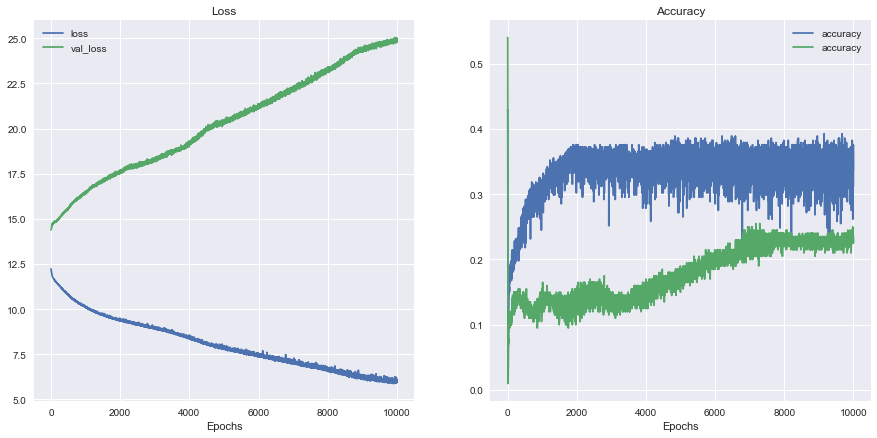

In [38]:
plot(history2)

## Thirth Experiment 

In [39]:
thirth_model = model3()
thirth_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['accuracy'])

In [40]:
history3 = thirth_model.fit(X_train, y_train, epochs=10000, validation_data=(X_valid, y_valid))

Epoch 1/10000
10/10 [==============================] - 1s 19ms/step - loss: 12.2227 - accuracy: 0.4295 - val_loss: 14.3898 - val_accuracy: 0.5400
Epoch 2/10000
10/10 [==============================] - 0s 6ms/step - loss: 12.2176 - accuracy: 0.4295 - val_loss: 14.3945 - val_accuracy: 0.5400
Epoch 3/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.1996 - accuracy: 0.4295 - val_loss: 14.4065 - val_accuracy: 0.5400
Epoch 4/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.1512 - accuracy: 0.3389 - val_loss: 14.4484 - val_accuracy: 0.0450
Epoch 5/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.0859 - accuracy: 0.0369 - val_loss: 14.5771 - val_accuracy: 0.0050
Epoch 6/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.0862 - accuracy: 0.0000e+00 - val_loss: 14.6656 - val_accuracy: 0.0100
Epoch 7/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.9998 - accuracy: 0.0570 - val_loss: 14.5212 - v

10/10 [==============================] - 0s 5ms/step - loss: 11.1622 - accuracy: 0.3121 - val_loss: 15.3774 - val_accuracy: 0.2450
Epoch 58/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.0310 - accuracy: 0.2852 - val_loss: 15.0637 - val_accuracy: 0.2900
Epoch 59/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.0993 - accuracy: 0.3490 - val_loss: 15.7845 - val_accuracy: 0.1900
Epoch 60/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.0083 - accuracy: 0.2953 - val_loss: 15.4168 - val_accuracy: 0.2500
Epoch 61/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.9685 - accuracy: 0.3322 - val_loss: 15.5103 - val_accuracy: 0.2300
Epoch 62/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.9274 - accuracy: 0.3255 - val_loss: 15.6532 - val_accuracy: 0.2500
Epoch 63/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.9207 - accuracy: 0.3289 - val_loss: 15.6703 - val_accuracy: 

10/10 [==============================] - 0s 5ms/step - loss: 10.1482 - accuracy: 0.3826 - val_loss: 17.1250 - val_accuracy: 0.2700
Epoch 114/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.1373 - accuracy: 0.3993 - val_loss: 17.6115 - val_accuracy: 0.2400
Epoch 115/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9372 - accuracy: 0.3926 - val_loss: 17.0655 - val_accuracy: 0.2700
Epoch 116/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8806 - accuracy: 0.4094 - val_loss: 17.8538 - val_accuracy: 0.2650
Epoch 117/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8650 - accuracy: 0.3993 - val_loss: 17.3496 - val_accuracy: 0.2950
Epoch 118/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.2099 - accuracy: 0.3960 - val_loss: 17.1700 - val_accuracy: 0.3100
Epoch 119/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9353 - accuracy: 0.3993 - val_loss: 17.2183 - val_accuracy

10/10 [==============================] - 0s 5ms/step - loss: 8.8979 - accuracy: 0.3893 - val_loss: 19.5484 - val_accuracy: 0.2300
Epoch 170/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.8243 - accuracy: 0.3826 - val_loss: 18.9425 - val_accuracy: 0.2750
Epoch 171/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9199 - accuracy: 0.3993 - val_loss: 19.9696 - val_accuracy: 0.2800
Epoch 172/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.4530 - accuracy: 0.4060 - val_loss: 17.3421 - val_accuracy: 0.3400
Epoch 173/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1017 - accuracy: 0.3591 - val_loss: 20.7039 - val_accuracy: 0.2500
Epoch 174/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1240 - accuracy: 0.3993 - val_loss: 19.6458 - val_accuracy: 0.2900
Epoch 175/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.2785 - accuracy: 0.3893 - val_loss: 19.5918 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 7.6016 - accuracy: 0.3758 - val_loss: 19.9080 - val_accuracy: 0.3100
Epoch 226/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6678 - accuracy: 0.3960 - val_loss: 23.1591 - val_accuracy: 0.2250
Epoch 227/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6765 - accuracy: 0.3926 - val_loss: 20.5414 - val_accuracy: 0.2750
Epoch 228/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.9649 - accuracy: 0.3926 - val_loss: 19.8140 - val_accuracy: 0.2200
Epoch 229/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.5831 - accuracy: 0.3826 - val_loss: 20.9190 - val_accuracy: 0.2450
Epoch 230/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6166 - accuracy: 0.3993 - val_loss: 22.3796 - val_accuracy: 0.2400
Epoch 231/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.6244 - accuracy: 0.3826 - val_loss: 20.2921 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 6.5195 - accuracy: 0.4128 - val_loss: 20.2753 - val_accuracy: 0.2600
Epoch 282/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8273 - accuracy: 0.4060 - val_loss: 21.8298 - val_accuracy: 0.2600
Epoch 283/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.7635 - accuracy: 0.4094 - val_loss: 22.0224 - val_accuracy: 0.2550
Epoch 284/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5800 - accuracy: 0.4195 - val_loss: 21.2859 - val_accuracy: 0.2650
Epoch 285/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8418 - accuracy: 0.3993 - val_loss: 21.1661 - val_accuracy: 0.2850
Epoch 286/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.9732 - accuracy: 0.4295 - val_loss: 23.2631 - val_accuracy: 0.2250
Epoch 287/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6633 - accuracy: 0.3859 - val_loss: 19.6093 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 6.1818 - accuracy: 0.4161 - val_loss: 21.8768 - val_accuracy: 0.2200
Epoch 338/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0667 - accuracy: 0.3893 - val_loss: 20.6942 - val_accuracy: 0.2550
Epoch 339/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0042 - accuracy: 0.4161 - val_loss: 20.4107 - val_accuracy: 0.2250
Epoch 340/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.5644 - accuracy: 0.4161 - val_loss: 21.9117 - val_accuracy: 0.2250
Epoch 341/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9666 - accuracy: 0.4195 - val_loss: 20.1230 - val_accuracy: 0.2700
Epoch 342/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0066 - accuracy: 0.4128 - val_loss: 21.3375 - val_accuracy: 0.2250
Epoch 343/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0335 - accuracy: 0.4228 - val_loss: 19.5773 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 5.3457 - accuracy: 0.4094 - val_loss: 19.8706 - val_accuracy: 0.2300
Epoch 394/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.5955 - accuracy: 0.4128 - val_loss: 20.9341 - val_accuracy: 0.2550
Epoch 395/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.5985 - accuracy: 0.4295 - val_loss: 21.5825 - val_accuracy: 0.2650
Epoch 396/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.8571 - accuracy: 0.4262 - val_loss: 20.6559 - val_accuracy: 0.2250
Epoch 397/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.2793 - accuracy: 0.4094 - val_loss: 20.4889 - val_accuracy: 0.2150
Epoch 398/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.0539 - accuracy: 0.4060 - val_loss: 20.8543 - val_accuracy: 0.2300
Epoch 399/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.0082 - accuracy: 0.4262 - val_loss: 21.8195 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 4.7329 - accuracy: 0.4128 - val_loss: 21.6302 - val_accuracy: 0.2000
Epoch 450/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.7917 - accuracy: 0.4128 - val_loss: 19.9261 - val_accuracy: 0.2450
Epoch 451/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.4884 - accuracy: 0.4195 - val_loss: 21.7373 - val_accuracy: 0.1850
Epoch 452/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.6559 - accuracy: 0.3758 - val_loss: 19.4814 - val_accuracy: 0.2300
Epoch 453/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.9511 - accuracy: 0.4195 - val_loss: 21.8660 - val_accuracy: 0.2200
Epoch 454/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.1165 - accuracy: 0.4128 - val_loss: 20.2373 - val_accuracy: 0.2500
Epoch 455/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.9235 - accuracy: 0.4128 - val_loss: 21.0603 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 4.4145 - accuracy: 0.4262 - val_loss: 20.8160 - val_accuracy: 0.1950
Epoch 506/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.2658 - accuracy: 0.4195 - val_loss: 21.3489 - val_accuracy: 0.1950
Epoch 507/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.5670 - accuracy: 0.4128 - val_loss: 20.5064 - val_accuracy: 0.2150
Epoch 508/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.3643 - accuracy: 0.4262 - val_loss: 20.6791 - val_accuracy: 0.2150
Epoch 509/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.3919 - accuracy: 0.4195 - val_loss: 21.2153 - val_accuracy: 0.2100
Epoch 510/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.2326 - accuracy: 0.4128 - val_loss: 20.9617 - val_accuracy: 0.2150
Epoch 511/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.1822 - accuracy: 0.4161 - val_loss: 20.2214 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 4.7272 - accuracy: 0.4195 - val_loss: 21.9736 - val_accuracy: 0.2150
Epoch 562/10000
10/10 [==============================] - 0s 7ms/step - loss: 4.4672 - accuracy: 0.3859 - val_loss: 21.7697 - val_accuracy: 0.2200
Epoch 563/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.0439 - accuracy: 0.4295 - val_loss: 21.7895 - val_accuracy: 0.2050
Epoch 564/10000
10/10 [==============================] - 0s 5ms/step - loss: 3.5511 - accuracy: 0.3893 - val_loss: 22.7826 - val_accuracy: 0.2250
Epoch 565/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.2271 - accuracy: 0.4228 - val_loss: 20.5038 - val_accuracy: 0.2050
Epoch 566/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.1682 - accuracy: 0.4161 - val_loss: 21.5552 - val_accuracy: 0.2150
Epoch 567/10000
10/10 [==============================] - 0s 5ms/step - loss: 3.9166 - accuracy: 0.4228 - val_loss: 22.6969 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 2.4033 - accuracy: 0.4094 - val_loss: 21.3524 - val_accuracy: 0.2400
Epoch 618/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.8787 - accuracy: 0.4027 - val_loss: 22.8961 - val_accuracy: 0.2200
Epoch 619/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0981 - accuracy: 0.4128 - val_loss: 24.1173 - val_accuracy: 0.2250
Epoch 620/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.5313 - accuracy: 0.4161 - val_loss: 23.4750 - val_accuracy: 0.2400
Epoch 621/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0124 - accuracy: 0.4262 - val_loss: 21.3829 - val_accuracy: 0.2150
Epoch 622/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.6572 - accuracy: 0.4195 - val_loss: 23.5498 - val_accuracy: 0.2000
Epoch 623/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0739 - accuracy: 0.4161 - val_loss: 22.5024 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 1.8050 - accuracy: 0.4228 - val_loss: 23.8922 - val_accuracy: 0.2050
Epoch 674/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8081 - accuracy: 0.4295 - val_loss: 23.0856 - val_accuracy: 0.2350
Epoch 675/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6561 - accuracy: 0.4161 - val_loss: 24.9262 - val_accuracy: 0.1850
Epoch 676/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8833 - accuracy: 0.4195 - val_loss: 23.6473 - val_accuracy: 0.1950
Epoch 677/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5642 - accuracy: 0.4228 - val_loss: 23.2841 - val_accuracy: 0.2100
Epoch 678/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7670 - accuracy: 0.4295 - val_loss: 24.1486 - val_accuracy: 0.2000
Epoch 679/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7059 - accuracy: 0.4262 - val_loss: 24.0253 - val_accuracy: 0

10/10 [==============================] - 0s 7ms/step - loss: 1.7848 - accuracy: 0.4262 - val_loss: 23.9464 - val_accuracy: 0.2000
Epoch 730/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7402 - accuracy: 0.4228 - val_loss: 23.7227 - val_accuracy: 0.2100
Epoch 731/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5428 - accuracy: 0.4228 - val_loss: 23.9395 - val_accuracy: 0.2000
Epoch 732/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4495 - accuracy: 0.4262 - val_loss: 24.2560 - val_accuracy: 0.2150
Epoch 733/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6368 - accuracy: 0.4228 - val_loss: 24.3355 - val_accuracy: 0.1850
Epoch 734/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7545 - accuracy: 0.4295 - val_loss: 23.8723 - val_accuracy: 0.2150
Epoch 735/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5446 - accuracy: 0.4195 - val_loss: 23.3380 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 1.3709 - accuracy: 0.4228 - val_loss: 23.1143 - val_accuracy: 0.2150
Epoch 786/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4913 - accuracy: 0.4295 - val_loss: 23.1005 - val_accuracy: 0.2200
Epoch 787/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6136 - accuracy: 0.4262 - val_loss: 22.9515 - val_accuracy: 0.2250
Epoch 788/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8086 - accuracy: 0.4295 - val_loss: 21.9729 - val_accuracy: 0.2100
Epoch 789/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.6860 - accuracy: 0.4295 - val_loss: 21.7138 - val_accuracy: 0.2100
Epoch 790/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.5268 - accuracy: 0.4195 - val_loss: 22.6120 - val_accuracy: 0.2100
Epoch 791/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.2115 - accuracy: 0.4195 - val_loss: 24.3200 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 1.6745 - accuracy: 0.4228 - val_loss: 22.4841 - val_accuracy: 0.2300
Epoch 842/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6793 - accuracy: 0.4295 - val_loss: 24.5974 - val_accuracy: 0.1850
Epoch 843/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9734 - accuracy: 0.4161 - val_loss: 22.5168 - val_accuracy: 0.2250
Epoch 844/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5684 - accuracy: 0.4295 - val_loss: 24.4009 - val_accuracy: 0.1900
Epoch 845/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.6312 - accuracy: 0.4161 - val_loss: 23.0144 - val_accuracy: 0.2400
Epoch 846/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.4769 - accuracy: 0.4195 - val_loss: 20.9745 - val_accuracy: 0.2000
Epoch 847/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.9848 - accuracy: 0.4027 - val_loss: 23.2416 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 1.5395 - accuracy: 0.4295 - val_loss: 23.4322 - val_accuracy: 0.2200
Epoch 898/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6478 - accuracy: 0.4195 - val_loss: 23.0471 - val_accuracy: 0.2000
Epoch 899/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5070 - accuracy: 0.4228 - val_loss: 23.0774 - val_accuracy: 0.2000
Epoch 900/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5203 - accuracy: 0.4262 - val_loss: 24.4320 - val_accuracy: 0.1850
Epoch 901/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7508 - accuracy: 0.4295 - val_loss: 22.3082 - val_accuracy: 0.2000
Epoch 902/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1949 - accuracy: 0.4195 - val_loss: 23.7181 - val_accuracy: 0.1900
Epoch 903/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8703 - accuracy: 0.4262 - val_loss: 23.0212 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 1.8593 - accuracy: 0.4262 - val_loss: 22.0739 - val_accuracy: 0.2300
Epoch 954/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4572 - accuracy: 0.4295 - val_loss: 23.2418 - val_accuracy: 0.1850
Epoch 955/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7479 - accuracy: 0.4228 - val_loss: 22.4847 - val_accuracy: 0.2000
Epoch 956/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6320 - accuracy: 0.4295 - val_loss: 24.0186 - val_accuracy: 0.1900
Epoch 957/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5867 - accuracy: 0.4295 - val_loss: 21.4617 - val_accuracy: 0.2100
Epoch 958/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1579 - accuracy: 0.4262 - val_loss: 22.4078 - val_accuracy: 0.2000
Epoch 959/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6099 - accuracy: 0.4295 - val_loss: 23.6497 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 1.3424 - accuracy: 0.4295 - val_loss: 22.8546 - val_accuracy: 0.1950
Epoch 1010/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4273 - accuracy: 0.4295 - val_loss: 23.3077 - val_accuracy: 0.1850
Epoch 1011/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4399 - accuracy: 0.4295 - val_loss: 23.0457 - val_accuracy: 0.1950
Epoch 1012/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6327 - accuracy: 0.4295 - val_loss: 22.5683 - val_accuracy: 0.2100
Epoch 1013/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8976 - accuracy: 0.4262 - val_loss: 23.5459 - val_accuracy: 0.1950
Epoch 1014/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5426 - accuracy: 0.4195 - val_loss: 22.3261 - val_accuracy: 0.2100
Epoch 1015/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6810 - accuracy: 0.4295 - val_loss: 21.5800 - val_accur

Epoch 1065/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0212 - accuracy: 0.4262 - val_loss: 23.1524 - val_accuracy: 0.1950
Epoch 1066/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6654 - accuracy: 0.4262 - val_loss: 21.8810 - val_accuracy: 0.2200
Epoch 1067/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7861 - accuracy: 0.4228 - val_loss: 23.8512 - val_accuracy: 0.1900
Epoch 1068/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6550 - accuracy: 0.4161 - val_loss: 22.6272 - val_accuracy: 0.2100
Epoch 1069/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4547 - accuracy: 0.4262 - val_loss: 24.3502 - val_accuracy: 0.1900
Epoch 1070/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6088 - accuracy: 0.4262 - val_loss: 22.5919 - val_accuracy: 0.2050
Epoch 1071/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6188 - accuracy: 0.4262 - val_loss: 23

Epoch 1121/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4384 - accuracy: 0.4295 - val_loss: 22.3666 - val_accuracy: 0.1950
Epoch 1122/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4433 - accuracy: 0.4262 - val_loss: 22.5806 - val_accuracy: 0.1900
Epoch 1123/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5658 - accuracy: 0.4295 - val_loss: 23.2984 - val_accuracy: 0.1900
Epoch 1124/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3268 - accuracy: 0.4295 - val_loss: 22.5623 - val_accuracy: 0.2000
Epoch 1125/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5299 - accuracy: 0.4262 - val_loss: 23.4576 - val_accuracy: 0.2050
Epoch 1126/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4368 - accuracy: 0.4295 - val_loss: 23.3255 - val_accuracy: 0.1950
Epoch 1127/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4421 - accuracy: 0.4228 - val_loss: 22

Epoch 1177/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6279 - accuracy: 0.4228 - val_loss: 23.3390 - val_accuracy: 0.2000
Epoch 1178/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5264 - accuracy: 0.4295 - val_loss: 23.0328 - val_accuracy: 0.2050
Epoch 1179/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4551 - accuracy: 0.4295 - val_loss: 22.3455 - val_accuracy: 0.2100
Epoch 1180/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3726 - accuracy: 0.4295 - val_loss: 24.1660 - val_accuracy: 0.2000
Epoch 1181/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1664 - accuracy: 0.4228 - val_loss: 23.2134 - val_accuracy: 0.2050
Epoch 1182/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7762 - accuracy: 0.4262 - val_loss: 22.1349 - val_accuracy: 0.2000
Epoch 1183/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7808 - accuracy: 0.4228 - val_loss: 22

Epoch 1233/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3055 - accuracy: 0.4262 - val_loss: 23.3318 - val_accuracy: 0.2050
Epoch 1234/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3217 - accuracy: 0.4262 - val_loss: 23.6168 - val_accuracy: 0.1900
Epoch 1235/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3923 - accuracy: 0.4295 - val_loss: 22.8916 - val_accuracy: 0.1950
Epoch 1236/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4757 - accuracy: 0.4295 - val_loss: 22.9683 - val_accuracy: 0.1950
Epoch 1237/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3117 - accuracy: 0.4295 - val_loss: 22.5423 - val_accuracy: 0.1950
Epoch 1238/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4211 - accuracy: 0.4295 - val_loss: 23.4123 - val_accuracy: 0.1850
Epoch 1239/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7398 - accuracy: 0.4228 - val_loss: 23

Epoch 1289/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4945 - accuracy: 0.4295 - val_loss: 22.2940 - val_accuracy: 0.2200
Epoch 1290/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4158 - accuracy: 0.4295 - val_loss: 24.0830 - val_accuracy: 0.1950
Epoch 1291/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6012 - accuracy: 0.4228 - val_loss: 22.9275 - val_accuracy: 0.2000
Epoch 1292/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4780 - accuracy: 0.4295 - val_loss: 22.1406 - val_accuracy: 0.2050
Epoch 1293/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6582 - accuracy: 0.4295 - val_loss: 23.0244 - val_accuracy: 0.1950
Epoch 1294/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3509 - accuracy: 0.4295 - val_loss: 23.4050 - val_accuracy: 0.1950
Epoch 1295/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3190 - accuracy: 0.4295 - val_loss: 23

Epoch 1345/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4283 - accuracy: 0.4262 - val_loss: 22.9364 - val_accuracy: 0.2000
Epoch 1346/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2504 - accuracy: 0.4262 - val_loss: 22.5500 - val_accuracy: 0.1850
Epoch 1347/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1704 - accuracy: 0.4262 - val_loss: 21.6921 - val_accuracy: 0.2000
Epoch 1348/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4412 - accuracy: 0.4195 - val_loss: 23.6135 - val_accuracy: 0.1800
Epoch 1349/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6571 - accuracy: 0.4262 - val_loss: 22.2409 - val_accuracy: 0.2150
Epoch 1350/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3902 - accuracy: 0.4295 - val_loss: 22.9839 - val_accuracy: 0.1850
Epoch 1351/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4305 - accuracy: 0.4262 - val_loss: 21

Epoch 1401/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3892 - accuracy: 0.4262 - val_loss: 22.9108 - val_accuracy: 0.1950
Epoch 1402/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3875 - accuracy: 0.4295 - val_loss: 23.2837 - val_accuracy: 0.2000
Epoch 1403/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4976 - accuracy: 0.4295 - val_loss: 22.2655 - val_accuracy: 0.1950
Epoch 1404/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4919 - accuracy: 0.4295 - val_loss: 21.7137 - val_accuracy: 0.1950
Epoch 1405/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8431 - accuracy: 0.4295 - val_loss: 21.8827 - val_accuracy: 0.2000
Epoch 1406/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4054 - accuracy: 0.4262 - val_loss: 24.1282 - val_accuracy: 0.1900
Epoch 1407/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5528 - accuracy: 0.4228 - val_loss: 23

Epoch 1457/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3066 - accuracy: 0.4262 - val_loss: 22.7598 - val_accuracy: 0.1950
Epoch 1458/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2917 - accuracy: 0.4262 - val_loss: 23.6108 - val_accuracy: 0.1900
Epoch 1459/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2736 - accuracy: 0.4295 - val_loss: 23.1950 - val_accuracy: 0.1900
Epoch 1460/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2517 - accuracy: 0.4295 - val_loss: 23.1906 - val_accuracy: 0.1850
Epoch 1461/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4412 - accuracy: 0.4295 - val_loss: 23.1041 - val_accuracy: 0.1900
Epoch 1462/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3129 - accuracy: 0.4228 - val_loss: 22.5640 - val_accuracy: 0.2000
Epoch 1463/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3942 - accuracy: 0.4295 - val_loss: 22

Epoch 1513/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8390 - accuracy: 0.4262 - val_loss: 21.2782 - val_accuracy: 0.2100
Epoch 1514/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7765 - accuracy: 0.4228 - val_loss: 23.2431 - val_accuracy: 0.1950
Epoch 1515/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3664 - accuracy: 0.4228 - val_loss: 22.7330 - val_accuracy: 0.2000
Epoch 1516/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5090 - accuracy: 0.4262 - val_loss: 22.9704 - val_accuracy: 0.1750
Epoch 1517/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2894 - accuracy: 0.4295 - val_loss: 22.6550 - val_accuracy: 0.2050
Epoch 1518/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5285 - accuracy: 0.4228 - val_loss: 22.9335 - val_accuracy: 0.1900
Epoch 1519/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6097 - accuracy: 0.4262 - val_loss: 22

Epoch 1569/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5313 - accuracy: 0.4262 - val_loss: 22.4591 - val_accuracy: 0.1850
Epoch 1570/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5073 - accuracy: 0.4295 - val_loss: 22.4761 - val_accuracy: 0.1900
Epoch 1571/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2601 - accuracy: 0.4295 - val_loss: 23.8325 - val_accuracy: 0.1900
Epoch 1572/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6180 - accuracy: 0.4295 - val_loss: 22.6194 - val_accuracy: 0.1900
Epoch 1573/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4138 - accuracy: 0.4262 - val_loss: 22.8251 - val_accuracy: 0.1800
Epoch 1574/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1851 - accuracy: 0.4295 - val_loss: 23.2952 - val_accuracy: 0.2000
Epoch 1575/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3113 - accuracy: 0.4295 - val_loss: 22

Epoch 1625/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2586 - accuracy: 0.4228 - val_loss: 23.0383 - val_accuracy: 0.1850
Epoch 1626/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1994 - accuracy: 0.4262 - val_loss: 22.4037 - val_accuracy: 0.1900
Epoch 1627/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4464 - accuracy: 0.4262 - val_loss: 23.1377 - val_accuracy: 0.1850
Epoch 1628/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1973 - accuracy: 0.4262 - val_loss: 22.8203 - val_accuracy: 0.1850
Epoch 1629/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1741 - accuracy: 0.4295 - val_loss: 23.0241 - val_accuracy: 0.1850
Epoch 1630/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3780 - accuracy: 0.4262 - val_loss: 23.5984 - val_accuracy: 0.1800
Epoch 1631/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3502 - accuracy: 0.4262 - val_loss: 22

Epoch 1681/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2232 - accuracy: 0.4295 - val_loss: 22.9636 - val_accuracy: 0.1900
Epoch 1682/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2425 - accuracy: 0.4295 - val_loss: 23.0335 - val_accuracy: 0.1850
Epoch 1683/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2242 - accuracy: 0.4262 - val_loss: 22.8631 - val_accuracy: 0.1900
Epoch 1684/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1960 - accuracy: 0.4295 - val_loss: 22.3546 - val_accuracy: 0.1950
Epoch 1685/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2314 - accuracy: 0.4295 - val_loss: 23.4307 - val_accuracy: 0.1900
Epoch 1686/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1943 - accuracy: 0.4295 - val_loss: 22.3833 - val_accuracy: 0.1950
Epoch 1687/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3030 - accuracy: 0.4295 - val_loss: 22

Epoch 1737/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3659 - accuracy: 0.4262 - val_loss: 23.1572 - val_accuracy: 0.1900
Epoch 1738/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2236 - accuracy: 0.4295 - val_loss: 22.7385 - val_accuracy: 0.1800
Epoch 1739/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1395 - accuracy: 0.4295 - val_loss: 22.4071 - val_accuracy: 0.1800
Epoch 1740/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3966 - accuracy: 0.4295 - val_loss: 23.3800 - val_accuracy: 0.1800
Epoch 1741/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2862 - accuracy: 0.4295 - val_loss: 23.1094 - val_accuracy: 0.1900
Epoch 1742/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2737 - accuracy: 0.4295 - val_loss: 21.8481 - val_accuracy: 0.1850
Epoch 1743/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4245 - accuracy: 0.4295 - val_loss: 23

Epoch 1793/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3352 - accuracy: 0.4295 - val_loss: 21.8838 - val_accuracy: 0.1900
Epoch 1794/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5200 - accuracy: 0.4262 - val_loss: 22.3368 - val_accuracy: 0.1850
Epoch 1795/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3515 - accuracy: 0.4295 - val_loss: 23.6788 - val_accuracy: 0.1800
Epoch 1796/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4134 - accuracy: 0.4262 - val_loss: 22.3323 - val_accuracy: 0.1950
Epoch 1797/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7124 - accuracy: 0.4295 - val_loss: 21.6999 - val_accuracy: 0.1900
Epoch 1798/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6009 - accuracy: 0.4295 - val_loss: 22.9778 - val_accuracy: 0.1900
Epoch 1799/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4265 - accuracy: 0.4295 - val_loss: 22

Epoch 1849/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2256 - accuracy: 0.4262 - val_loss: 22.5967 - val_accuracy: 0.2000
Epoch 1850/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1463 - accuracy: 0.4262 - val_loss: 23.0541 - val_accuracy: 0.2000
Epoch 1851/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1747 - accuracy: 0.4295 - val_loss: 22.3476 - val_accuracy: 0.1950
Epoch 1852/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3935 - accuracy: 0.4295 - val_loss: 23.2418 - val_accuracy: 0.1850
Epoch 1853/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2689 - accuracy: 0.4262 - val_loss: 23.2044 - val_accuracy: 0.2000
Epoch 1854/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4807 - accuracy: 0.4262 - val_loss: 22.7756 - val_accuracy: 0.1850
Epoch 1855/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3030 - accuracy: 0.4295 - val_loss: 22

Epoch 1905/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4425 - accuracy: 0.4262 - val_loss: 22.2854 - val_accuracy: 0.2000
Epoch 1906/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2817 - accuracy: 0.4295 - val_loss: 23.1936 - val_accuracy: 0.1950
Epoch 1907/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1783 - accuracy: 0.4295 - val_loss: 22.5085 - val_accuracy: 0.1950
Epoch 1908/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3010 - accuracy: 0.4295 - val_loss: 22.3690 - val_accuracy: 0.1900
Epoch 1909/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2686 - accuracy: 0.4295 - val_loss: 22.5854 - val_accuracy: 0.1800
Epoch 1910/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4603 - accuracy: 0.4195 - val_loss: 22.8765 - val_accuracy: 0.1950
Epoch 1911/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2542 - accuracy: 0.4295 - val_loss: 23

Epoch 1961/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1808 - accuracy: 0.4295 - val_loss: 22.5898 - val_accuracy: 0.1950
Epoch 1962/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1694 - accuracy: 0.4295 - val_loss: 22.6089 - val_accuracy: 0.1900
Epoch 1963/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2383 - accuracy: 0.4295 - val_loss: 22.2633 - val_accuracy: 0.1950
Epoch 1964/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2135 - accuracy: 0.4295 - val_loss: 22.8625 - val_accuracy: 0.1950
Epoch 1965/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2424 - accuracy: 0.4295 - val_loss: 22.8498 - val_accuracy: 0.1850
Epoch 1966/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1314 - accuracy: 0.4295 - val_loss: 22.5888 - val_accuracy: 0.1850
Epoch 1967/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1685 - accuracy: 0.4295 - val_loss: 22

Epoch 2017/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2241 - accuracy: 0.4295 - val_loss: 23.0291 - val_accuracy: 0.1800
Epoch 2018/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1347 - accuracy: 0.4295 - val_loss: 23.5527 - val_accuracy: 0.1800
Epoch 2019/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3212 - accuracy: 0.4262 - val_loss: 22.5731 - val_accuracy: 0.1850
Epoch 2020/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1908 - accuracy: 0.4295 - val_loss: 23.1597 - val_accuracy: 0.1850
Epoch 2021/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2973 - accuracy: 0.4295 - val_loss: 23.1920 - val_accuracy: 0.1900
Epoch 2022/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1156 - accuracy: 0.4295 - val_loss: 22.1529 - val_accuracy: 0.1850
Epoch 2023/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3223 - accuracy: 0.4295 - val_loss: 23

Epoch 2073/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3277 - accuracy: 0.4295 - val_loss: 23.7229 - val_accuracy: 0.1800
Epoch 2074/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2013 - accuracy: 0.4295 - val_loss: 22.8462 - val_accuracy: 0.1950
Epoch 2075/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2446 - accuracy: 0.4295 - val_loss: 23.4926 - val_accuracy: 0.1800
Epoch 2076/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0793 - accuracy: 0.4295 - val_loss: 22.5781 - val_accuracy: 0.1900
Epoch 2077/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1851 - accuracy: 0.4295 - val_loss: 23.5245 - val_accuracy: 0.1900
Epoch 2078/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0991 - accuracy: 0.4295 - val_loss: 22.3085 - val_accuracy: 0.2000
Epoch 2079/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3363 - accuracy: 0.4295 - val_loss: 23

Epoch 2129/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1816 - accuracy: 0.4295 - val_loss: 23.0591 - val_accuracy: 0.1900
Epoch 2130/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3317 - accuracy: 0.4295 - val_loss: 23.7742 - val_accuracy: 0.1900
Epoch 2131/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1301 - accuracy: 0.4295 - val_loss: 23.0708 - val_accuracy: 0.1850
Epoch 2132/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3603 - accuracy: 0.4295 - val_loss: 23.3186 - val_accuracy: 0.1850
Epoch 2133/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1556 - accuracy: 0.4295 - val_loss: 23.8427 - val_accuracy: 0.1900
Epoch 2134/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2100 - accuracy: 0.4295 - val_loss: 23.0010 - val_accuracy: 0.2000
Epoch 2135/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2480 - accuracy: 0.4295 - val_loss: 23

Epoch 2185/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2302 - accuracy: 0.4228 - val_loss: 24.0996 - val_accuracy: 0.1950
Epoch 2186/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7225 - accuracy: 0.4262 - val_loss: 23.1819 - val_accuracy: 0.1900
Epoch 2187/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6355 - accuracy: 0.4295 - val_loss: 22.4481 - val_accuracy: 0.1900
Epoch 2188/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4267 - accuracy: 0.4295 - val_loss: 22.5930 - val_accuracy: 0.1900
Epoch 2189/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3341 - accuracy: 0.4295 - val_loss: 22.8163 - val_accuracy: 0.1900
Epoch 2190/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2078 - accuracy: 0.4295 - val_loss: 22.1175 - val_accuracy: 0.1850
Epoch 2191/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0749 - accuracy: 0.4295 - val_loss: 22

Epoch 2241/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1314 - accuracy: 0.4295 - val_loss: 23.0084 - val_accuracy: 0.2000
Epoch 2242/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1579 - accuracy: 0.4295 - val_loss: 23.4645 - val_accuracy: 0.1800
Epoch 2243/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0979 - accuracy: 0.4295 - val_loss: 23.3368 - val_accuracy: 0.1950
Epoch 2244/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2453 - accuracy: 0.4295 - val_loss: 22.6094 - val_accuracy: 0.1850
Epoch 2245/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3139 - accuracy: 0.4295 - val_loss: 23.3726 - val_accuracy: 0.1800
Epoch 2246/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1332 - accuracy: 0.4295 - val_loss: 23.1746 - val_accuracy: 0.2000
Epoch 2247/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5752 - accuracy: 0.4295 - val_loss: 23

Epoch 2297/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2712 - accuracy: 0.4295 - val_loss: 23.3360 - val_accuracy: 0.1800
Epoch 2298/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0923 - accuracy: 0.4295 - val_loss: 22.7492 - val_accuracy: 0.1850
Epoch 2299/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1819 - accuracy: 0.4295 - val_loss: 23.1116 - val_accuracy: 0.1900
Epoch 2300/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0322 - accuracy: 0.4295 - val_loss: 23.4990 - val_accuracy: 0.1900
Epoch 2301/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1343 - accuracy: 0.4295 - val_loss: 22.7845 - val_accuracy: 0.1900
Epoch 2302/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1807 - accuracy: 0.4295 - val_loss: 23.3298 - val_accuracy: 0.1750
Epoch 2303/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1124 - accuracy: 0.4295 - val_loss: 22

Epoch 2353/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0627 - accuracy: 0.4295 - val_loss: 23.5761 - val_accuracy: 0.1700
Epoch 2354/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1768 - accuracy: 0.4295 - val_loss: 22.4424 - val_accuracy: 0.1850
Epoch 2355/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1374 - accuracy: 0.4295 - val_loss: 23.7739 - val_accuracy: 0.1700
Epoch 2356/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2127 - accuracy: 0.4295 - val_loss: 22.5047 - val_accuracy: 0.1900
Epoch 2357/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1840 - accuracy: 0.4295 - val_loss: 24.2420 - val_accuracy: 0.1800
Epoch 2358/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2888 - accuracy: 0.4295 - val_loss: 22.2961 - val_accuracy: 0.1900
Epoch 2359/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3828 - accuracy: 0.4295 - val_loss: 21

Epoch 2409/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0938 - accuracy: 0.4295 - val_loss: 23.5839 - val_accuracy: 0.1850
Epoch 2410/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2897 - accuracy: 0.4295 - val_loss: 22.4894 - val_accuracy: 0.1750
Epoch 2411/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1046 - accuracy: 0.4295 - val_loss: 23.0744 - val_accuracy: 0.1850
Epoch 2412/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1269 - accuracy: 0.4262 - val_loss: 23.6913 - val_accuracy: 0.1800
Epoch 2413/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3290 - accuracy: 0.4295 - val_loss: 22.8055 - val_accuracy: 0.1850
Epoch 2414/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1912 - accuracy: 0.4295 - val_loss: 22.2087 - val_accuracy: 0.1850
Epoch 2415/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3032 - accuracy: 0.4295 - val_loss: 23

Epoch 2465/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1112 - accuracy: 0.4295 - val_loss: 22.4879 - val_accuracy: 0.1950
Epoch 2466/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3487 - accuracy: 0.4262 - val_loss: 23.0131 - val_accuracy: 0.1850
Epoch 2467/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2873 - accuracy: 0.4295 - val_loss: 23.1018 - val_accuracy: 0.2050
Epoch 2468/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4935 - accuracy: 0.4295 - val_loss: 22.0422 - val_accuracy: 0.1850
Epoch 2469/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2434 - accuracy: 0.4295 - val_loss: 23.3392 - val_accuracy: 0.1850
Epoch 2470/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3660 - accuracy: 0.4295 - val_loss: 22.7645 - val_accuracy: 0.1950
Epoch 2471/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0933 - accuracy: 0.4295 - val_loss: 22

Epoch 2521/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1781 - accuracy: 0.4295 - val_loss: 21.9614 - val_accuracy: 0.1950
Epoch 2522/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3454 - accuracy: 0.4295 - val_loss: 23.2254 - val_accuracy: 0.1900
Epoch 2523/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1517 - accuracy: 0.4295 - val_loss: 22.3769 - val_accuracy: 0.1900
Epoch 2524/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1979 - accuracy: 0.4295 - val_loss: 22.9127 - val_accuracy: 0.1850
Epoch 2525/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0907 - accuracy: 0.4295 - val_loss: 23.3031 - val_accuracy: 0.2000
Epoch 2526/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2080 - accuracy: 0.4295 - val_loss: 23.0543 - val_accuracy: 0.1950
Epoch 2527/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0709 - accuracy: 0.4295 - val_loss: 22

Epoch 2577/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2257 - accuracy: 0.4262 - val_loss: 23.6583 - val_accuracy: 0.1900
Epoch 2578/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1010 - accuracy: 0.4295 - val_loss: 23.0482 - val_accuracy: 0.1800
Epoch 2579/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2341 - accuracy: 0.4295 - val_loss: 23.3130 - val_accuracy: 0.1800
Epoch 2580/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0995 - accuracy: 0.4295 - val_loss: 23.8624 - val_accuracy: 0.1750
Epoch 2581/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1128 - accuracy: 0.4295 - val_loss: 22.9698 - val_accuracy: 0.1800
Epoch 2582/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0030 - accuracy: 0.4295 - val_loss: 23.6376 - val_accuracy: 0.1850
Epoch 2583/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2594 - accuracy: 0.4295 - val_loss: 22

Epoch 2633/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0532 - accuracy: 0.4295 - val_loss: 23.2014 - val_accuracy: 0.1700
Epoch 2634/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1235 - accuracy: 0.4295 - val_loss: 23.4139 - val_accuracy: 0.1800
Epoch 2635/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0381 - accuracy: 0.4295 - val_loss: 23.1612 - val_accuracy: 0.1700
Epoch 2636/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0414 - accuracy: 0.4295 - val_loss: 23.7251 - val_accuracy: 0.1650
Epoch 2637/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0373 - accuracy: 0.4295 - val_loss: 23.4074 - val_accuracy: 0.1900
Epoch 2638/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0262 - accuracy: 0.4295 - val_loss: 23.3135 - val_accuracy: 0.1800
Epoch 2639/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0086 - accuracy: 0.4295 - val_loss: 22

Epoch 2689/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0503 - accuracy: 0.4295 - val_loss: 22.7859 - val_accuracy: 0.1800
Epoch 2690/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0582 - accuracy: 0.4295 - val_loss: 23.1664 - val_accuracy: 0.1800
Epoch 2691/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0835 - accuracy: 0.4295 - val_loss: 23.1849 - val_accuracy: 0.1700
Epoch 2692/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0919 - accuracy: 0.4295 - val_loss: 23.0771 - val_accuracy: 0.1700
Epoch 2693/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0666 - accuracy: 0.4295 - val_loss: 22.7816 - val_accuracy: 0.1900
Epoch 2694/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0710 - accuracy: 0.4295 - val_loss: 24.1971 - val_accuracy: 0.1750
Epoch 2695/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2560 - accuracy: 0.4295 - val_loss: 22

Epoch 2745/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0207 - accuracy: 0.4295 - val_loss: 22.9366 - val_accuracy: 0.1850
Epoch 2746/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0544 - accuracy: 0.4295 - val_loss: 22.5755 - val_accuracy: 0.1800
Epoch 2747/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2049 - accuracy: 0.4295 - val_loss: 22.4179 - val_accuracy: 0.1800
Epoch 2748/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1069 - accuracy: 0.4295 - val_loss: 23.1674 - val_accuracy: 0.1950
Epoch 2749/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0300 - accuracy: 0.4295 - val_loss: 22.4581 - val_accuracy: 0.1900
Epoch 2750/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1576 - accuracy: 0.4295 - val_loss: 22.4565 - val_accuracy: 0.1800
Epoch 2751/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1174 - accuracy: 0.4262 - val_loss: 22

Epoch 2801/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0568 - accuracy: 0.4295 - val_loss: 23.0207 - val_accuracy: 0.1650
Epoch 2802/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9639 - accuracy: 0.4295 - val_loss: 22.6695 - val_accuracy: 0.1850
Epoch 2803/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0162 - accuracy: 0.4262 - val_loss: 23.2669 - val_accuracy: 0.1950
Epoch 2804/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1005 - accuracy: 0.4262 - val_loss: 22.8308 - val_accuracy: 0.1800
Epoch 2805/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1099 - accuracy: 0.4295 - val_loss: 22.7714 - val_accuracy: 0.1700
Epoch 2806/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0315 - accuracy: 0.4295 - val_loss: 23.4361 - val_accuracy: 0.1800
Epoch 2807/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2170 - accuracy: 0.4295 - val_loss: 22

Epoch 2857/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0948 - accuracy: 0.4295 - val_loss: 22.4711 - val_accuracy: 0.1600
Epoch 2858/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2174 - accuracy: 0.4295 - val_loss: 22.0416 - val_accuracy: 0.1800
Epoch 2859/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6219 - accuracy: 0.4295 - val_loss: 22.5875 - val_accuracy: 0.1850
Epoch 2860/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4605 - accuracy: 0.4228 - val_loss: 22.7063 - val_accuracy: 0.1800
Epoch 2861/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2299 - accuracy: 0.4295 - val_loss: 23.5080 - val_accuracy: 0.1700
Epoch 2862/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1909 - accuracy: 0.4295 - val_loss: 22.2375 - val_accuracy: 0.1900
Epoch 2863/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3220 - accuracy: 0.4228 - val_loss: 22

Epoch 2913/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.1712 - accuracy: 0.4295 - val_loss: 23.0903 - val_accuracy: 0.1850
Epoch 2914/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.1020 - accuracy: 0.4295 - val_loss: 21.7390 - val_accuracy: 0.1850
Epoch 2915/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.1566 - accuracy: 0.4295 - val_loss: 23.2205 - val_accuracy: 0.1700
Epoch 2916/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.1798 - accuracy: 0.4295 - val_loss: 21.7934 - val_accuracy: 0.2050
Epoch 2917/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.2347 - accuracy: 0.4295 - val_loss: 23.3378 - val_accuracy: 0.1750
Epoch 2918/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.1309 - accuracy: 0.4295 - val_loss: 21.8759 - val_accuracy: 0.1800
Epoch 2919/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.3174 - accuracy: 0.4262 - val_loss: 22

Epoch 2969/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2718 - accuracy: 0.4295 - val_loss: 22.8840 - val_accuracy: 0.1900
Epoch 2970/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9978 - accuracy: 0.4295 - val_loss: 22.3033 - val_accuracy: 0.1900
Epoch 2971/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1173 - accuracy: 0.4295 - val_loss: 22.2869 - val_accuracy: 0.1800
Epoch 2972/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0470 - accuracy: 0.4295 - val_loss: 22.7473 - val_accuracy: 0.1750
Epoch 2973/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9661 - accuracy: 0.4295 - val_loss: 22.4881 - val_accuracy: 0.1900
Epoch 2974/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0056 - accuracy: 0.4295 - val_loss: 22.8489 - val_accuracy: 0.1700
Epoch 2975/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0516 - accuracy: 0.4295 - val_loss: 22

Epoch 3025/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1138 - accuracy: 0.4295 - val_loss: 23.0529 - val_accuracy: 0.1750
Epoch 3026/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0958 - accuracy: 0.4295 - val_loss: 22.7401 - val_accuracy: 0.1850
Epoch 3027/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9858 - accuracy: 0.4295 - val_loss: 22.7571 - val_accuracy: 0.1700
Epoch 3028/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1656 - accuracy: 0.4295 - val_loss: 22.5534 - val_accuracy: 0.1800
Epoch 3029/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0257 - accuracy: 0.4295 - val_loss: 23.0242 - val_accuracy: 0.1850
Epoch 3030/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1246 - accuracy: 0.4295 - val_loss: 22.6464 - val_accuracy: 0.1900
Epoch 3031/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9826 - accuracy: 0.4295 - val_loss: 22

Epoch 3081/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2109 - accuracy: 0.4295 - val_loss: 21.9152 - val_accuracy: 0.1900
Epoch 3082/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0680 - accuracy: 0.4295 - val_loss: 21.9612 - val_accuracy: 0.1650
Epoch 3083/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1569 - accuracy: 0.4295 - val_loss: 22.0327 - val_accuracy: 0.1800
Epoch 3084/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0370 - accuracy: 0.4295 - val_loss: 22.8178 - val_accuracy: 0.1700
Epoch 3085/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9061 - accuracy: 0.4295 - val_loss: 22.5195 - val_accuracy: 0.1750
Epoch 3086/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9835 - accuracy: 0.4295 - val_loss: 22.8560 - val_accuracy: 0.1750
Epoch 3087/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9836 - accuracy: 0.4295 - val_loss: 22

Epoch 3137/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0088 - accuracy: 0.4295 - val_loss: 22.5362 - val_accuracy: 0.1800
Epoch 3138/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0063 - accuracy: 0.4295 - val_loss: 22.1614 - val_accuracy: 0.1700
Epoch 3139/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1339 - accuracy: 0.4295 - val_loss: 22.5940 - val_accuracy: 0.1800
Epoch 3140/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0993 - accuracy: 0.4295 - val_loss: 22.2536 - val_accuracy: 0.1800
Epoch 3141/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1494 - accuracy: 0.4295 - val_loss: 22.7925 - val_accuracy: 0.1650
Epoch 3142/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1569 - accuracy: 0.4262 - val_loss: 22.9231 - val_accuracy: 0.1850
Epoch 3143/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1638 - accuracy: 0.4295 - val_loss: 22

Epoch 3193/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1974 - accuracy: 0.4262 - val_loss: 22.2297 - val_accuracy: 0.1800
Epoch 3194/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0879 - accuracy: 0.4295 - val_loss: 22.6807 - val_accuracy: 0.1900
Epoch 3195/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1739 - accuracy: 0.4295 - val_loss: 22.9050 - val_accuracy: 0.1750
Epoch 3196/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0554 - accuracy: 0.4295 - val_loss: 22.7852 - val_accuracy: 0.1700
Epoch 3197/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9433 - accuracy: 0.4295 - val_loss: 22.2797 - val_accuracy: 0.1750
Epoch 3198/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9497 - accuracy: 0.4295 - val_loss: 22.2823 - val_accuracy: 0.1750
Epoch 3199/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1410 - accuracy: 0.4295 - val_loss: 22

Epoch 3249/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0620 - accuracy: 0.4295 - val_loss: 22.6750 - val_accuracy: 0.1750
Epoch 3250/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9226 - accuracy: 0.4295 - val_loss: 22.0303 - val_accuracy: 0.1850
Epoch 3251/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1414 - accuracy: 0.4295 - val_loss: 22.2852 - val_accuracy: 0.1750
Epoch 3252/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0834 - accuracy: 0.4295 - val_loss: 22.5865 - val_accuracy: 0.1900
Epoch 3253/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1214 - accuracy: 0.4295 - val_loss: 22.7805 - val_accuracy: 0.1750
Epoch 3254/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0355 - accuracy: 0.4262 - val_loss: 21.8714 - val_accuracy: 0.1750
Epoch 3255/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3517 - accuracy: 0.4295 - val_loss: 22

Epoch 3305/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0376 - accuracy: 0.4295 - val_loss: 22.8109 - val_accuracy: 0.1700
Epoch 3306/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1323 - accuracy: 0.4295 - val_loss: 21.7159 - val_accuracy: 0.1800
Epoch 3307/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3579 - accuracy: 0.4295 - val_loss: 21.2736 - val_accuracy: 0.1850
Epoch 3308/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0400 - accuracy: 0.4295 - val_loss: 22.4860 - val_accuracy: 0.1900
Epoch 3309/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1655 - accuracy: 0.4295 - val_loss: 22.6095 - val_accuracy: 0.1850
Epoch 3310/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2313 - accuracy: 0.4295 - val_loss: 22.1915 - val_accuracy: 0.1750
Epoch 3311/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2475 - accuracy: 0.4295 - val_loss: 22

Epoch 3361/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0238 - accuracy: 0.4295 - val_loss: 23.0068 - val_accuracy: 0.1750
Epoch 3362/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0732 - accuracy: 0.4295 - val_loss: 22.7310 - val_accuracy: 0.1700
Epoch 3363/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8611 - accuracy: 0.4295 - val_loss: 22.0495 - val_accuracy: 0.1700
Epoch 3364/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2325 - accuracy: 0.4295 - val_loss: 22.8679 - val_accuracy: 0.1700
Epoch 3365/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0154 - accuracy: 0.4295 - val_loss: 22.8678 - val_accuracy: 0.1700
Epoch 3366/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1012 - accuracy: 0.4295 - val_loss: 22.9490 - val_accuracy: 0.1700
Epoch 3367/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8662 - accuracy: 0.4295 - val_loss: 23

Epoch 3417/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1314 - accuracy: 0.4262 - val_loss: 22.0737 - val_accuracy: 0.1700
Epoch 3418/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0350 - accuracy: 0.4295 - val_loss: 22.3151 - val_accuracy: 0.1700
Epoch 3419/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1292 - accuracy: 0.4295 - val_loss: 22.4556 - val_accuracy: 0.1750
Epoch 3420/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0560 - accuracy: 0.4295 - val_loss: 22.3488 - val_accuracy: 0.1900
Epoch 3421/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0974 - accuracy: 0.4295 - val_loss: 22.8033 - val_accuracy: 0.1700
Epoch 3422/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9832 - accuracy: 0.4295 - val_loss: 22.1733 - val_accuracy: 0.1800
Epoch 3423/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0587 - accuracy: 0.4295 - val_loss: 22

Epoch 3473/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1021 - accuracy: 0.4295 - val_loss: 22.9289 - val_accuracy: 0.1800
Epoch 3474/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0312 - accuracy: 0.4295 - val_loss: 23.0719 - val_accuracy: 0.1750
Epoch 3475/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1672 - accuracy: 0.4295 - val_loss: 23.0203 - val_accuracy: 0.1700
Epoch 3476/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1877 - accuracy: 0.4295 - val_loss: 21.5608 - val_accuracy: 0.1750
Epoch 3477/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2029 - accuracy: 0.4295 - val_loss: 22.4094 - val_accuracy: 0.1750
Epoch 3478/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8823 - accuracy: 0.4295 - val_loss: 22.4961 - val_accuracy: 0.1850
Epoch 3479/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9968 - accuracy: 0.4295 - val_loss: 22

Epoch 3529/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1058 - accuracy: 0.4295 - val_loss: 22.6761 - val_accuracy: 0.1800
Epoch 3530/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1417 - accuracy: 0.4295 - val_loss: 22.1179 - val_accuracy: 0.1800
Epoch 3531/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9601 - accuracy: 0.4295 - val_loss: 22.2403 - val_accuracy: 0.1800
Epoch 3532/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9532 - accuracy: 0.4295 - val_loss: 23.0860 - val_accuracy: 0.1750
Epoch 3533/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9459 - accuracy: 0.4295 - val_loss: 21.8882 - val_accuracy: 0.1800
Epoch 3534/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0718 - accuracy: 0.4295 - val_loss: 23.3736 - val_accuracy: 0.1750
Epoch 3535/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0805 - accuracy: 0.4295 - val_loss: 22

Epoch 3585/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0380 - accuracy: 0.4295 - val_loss: 22.5147 - val_accuracy: 0.1700
Epoch 3586/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9175 - accuracy: 0.4295 - val_loss: 21.2030 - val_accuracy: 0.1850
Epoch 3587/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1674 - accuracy: 0.4295 - val_loss: 22.4276 - val_accuracy: 0.1650
Epoch 3588/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0484 - accuracy: 0.4228 - val_loss: 22.1580 - val_accuracy: 0.1750
Epoch 3589/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9613 - accuracy: 0.4295 - val_loss: 22.3457 - val_accuracy: 0.1750
Epoch 3590/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9117 - accuracy: 0.4295 - val_loss: 21.5123 - val_accuracy: 0.1750
Epoch 3591/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0547 - accuracy: 0.4295 - val_loss: 22

Epoch 3641/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.9817 - accuracy: 0.4295 - val_loss: 22.1631 - val_accuracy: 0.1750
Epoch 3642/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.8906 - accuracy: 0.4295 - val_loss: 22.4933 - val_accuracy: 0.1800
Epoch 3643/10000
10/10 [==============================] - 0s 8ms/step - loss: 0.9094 - accuracy: 0.4295 - val_loss: 21.4707 - val_accuracy: 0.1800
Epoch 3644/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.8798 - accuracy: 0.4295 - val_loss: 22.0610 - val_accuracy: 0.1750
Epoch 3645/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.8279 - accuracy: 0.4295 - val_loss: 22.2690 - val_accuracy: 0.1800
Epoch 3646/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9375 - accuracy: 0.4295 - val_loss: 22.2521 - val_accuracy: 0.1700
Epoch 3647/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8180 - accuracy: 0.4295 - val_loss: 22

Epoch 3697/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.9789 - accuracy: 0.4295 - val_loss: 22.7953 - val_accuracy: 0.1650
Epoch 3698/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9677 - accuracy: 0.4295 - val_loss: 22.9053 - val_accuracy: 0.1850
Epoch 3699/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8695 - accuracy: 0.4295 - val_loss: 22.2774 - val_accuracy: 0.1750
Epoch 3700/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.8892 - accuracy: 0.4295 - val_loss: 22.0576 - val_accuracy: 0.1700
Epoch 3701/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0278 - accuracy: 0.4295 - val_loss: 22.4882 - val_accuracy: 0.1850
Epoch 3702/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.9912 - accuracy: 0.4295 - val_loss: 22.5686 - val_accuracy: 0.1750
Epoch 3703/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8997 - accuracy: 0.4228 - val_loss: 22

Epoch 3753/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8771 - accuracy: 0.4295 - val_loss: 22.6075 - val_accuracy: 0.1700
Epoch 3754/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7863 - accuracy: 0.4295 - val_loss: 22.0892 - val_accuracy: 0.1750
Epoch 3755/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8702 - accuracy: 0.4295 - val_loss: 22.5659 - val_accuracy: 0.1750
Epoch 3756/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7417 - accuracy: 0.4295 - val_loss: 21.8650 - val_accuracy: 0.1800
Epoch 3757/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8737 - accuracy: 0.4295 - val_loss: 22.8471 - val_accuracy: 0.1700
Epoch 3758/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8922 - accuracy: 0.4295 - val_loss: 22.0019 - val_accuracy: 0.1700
Epoch 3759/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7908 - accuracy: 0.4295 - val_loss: 22

Epoch 3809/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1589 - accuracy: 0.4295 - val_loss: 22.2043 - val_accuracy: 0.1800
Epoch 3810/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2344 - accuracy: 0.4295 - val_loss: 22.1594 - val_accuracy: 0.1850
Epoch 3811/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0115 - accuracy: 0.4295 - val_loss: 22.9448 - val_accuracy: 0.1700
Epoch 3812/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0691 - accuracy: 0.4295 - val_loss: 21.9582 - val_accuracy: 0.1800
Epoch 3813/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1730 - accuracy: 0.4262 - val_loss: 22.0418 - val_accuracy: 0.1700
Epoch 3814/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2414 - accuracy: 0.4295 - val_loss: 21.8897 - val_accuracy: 0.1800
Epoch 3815/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0630 - accuracy: 0.4295 - val_loss: 22

Epoch 3865/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9536 - accuracy: 0.4295 - val_loss: 22.5753 - val_accuracy: 0.1850
Epoch 3866/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8001 - accuracy: 0.4295 - val_loss: 22.3417 - val_accuracy: 0.1800
Epoch 3867/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8646 - accuracy: 0.4295 - val_loss: 22.5468 - val_accuracy: 0.1850
Epoch 3868/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7482 - accuracy: 0.4295 - val_loss: 22.9063 - val_accuracy: 0.1850
Epoch 3869/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9401 - accuracy: 0.4295 - val_loss: 22.3532 - val_accuracy: 0.1600
Epoch 3870/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8991 - accuracy: 0.4295 - val_loss: 21.6838 - val_accuracy: 0.1800
Epoch 3871/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9796 - accuracy: 0.4295 - val_loss: 22

Epoch 3921/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8895 - accuracy: 0.4262 - val_loss: 22.7363 - val_accuracy: 0.1800
Epoch 3922/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8978 - accuracy: 0.4295 - val_loss: 22.8515 - val_accuracy: 0.1800
Epoch 3923/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.7594 - accuracy: 0.4295 - val_loss: 22.8643 - val_accuracy: 0.1950
Epoch 3924/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8307 - accuracy: 0.4295 - val_loss: 22.3153 - val_accuracy: 0.1850
Epoch 3925/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8565 - accuracy: 0.4295 - val_loss: 23.1120 - val_accuracy: 0.1700
Epoch 3926/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9295 - accuracy: 0.4295 - val_loss: 22.9574 - val_accuracy: 0.1950
Epoch 3927/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1197 - accuracy: 0.4295 - val_loss: 23

Epoch 3977/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9163 - accuracy: 0.4295 - val_loss: 22.9438 - val_accuracy: 0.1800
Epoch 3978/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9500 - accuracy: 0.4295 - val_loss: 22.2037 - val_accuracy: 0.1850
Epoch 3979/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8619 - accuracy: 0.4295 - val_loss: 22.1154 - val_accuracy: 0.1850
Epoch 3980/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8775 - accuracy: 0.4295 - val_loss: 21.8972 - val_accuracy: 0.1700
Epoch 3981/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8751 - accuracy: 0.4295 - val_loss: 22.0322 - val_accuracy: 0.1850
Epoch 3982/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8732 - accuracy: 0.4295 - val_loss: 21.8896 - val_accuracy: 0.1850
Epoch 3983/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9089 - accuracy: 0.4295 - val_loss: 22

Epoch 4033/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9348 - accuracy: 0.4295 - val_loss: 22.2985 - val_accuracy: 0.1850
Epoch 4034/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9463 - accuracy: 0.4295 - val_loss: 21.9067 - val_accuracy: 0.1850
Epoch 4035/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0652 - accuracy: 0.4262 - val_loss: 21.5324 - val_accuracy: 0.1800
Epoch 4036/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3251 - accuracy: 0.4262 - val_loss: 22.8570 - val_accuracy: 0.1650
Epoch 4037/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1179 - accuracy: 0.4295 - val_loss: 22.3496 - val_accuracy: 0.1850
Epoch 4038/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1248 - accuracy: 0.4262 - val_loss: 22.6844 - val_accuracy: 0.1850
Epoch 4039/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8284 - accuracy: 0.4295 - val_loss: 22

Epoch 4089/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0774 - accuracy: 0.4295 - val_loss: 22.5043 - val_accuracy: 0.1800
Epoch 4090/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8002 - accuracy: 0.4295 - val_loss: 22.3159 - val_accuracy: 0.1850
Epoch 4091/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7890 - accuracy: 0.4295 - val_loss: 22.5268 - val_accuracy: 0.1800
Epoch 4092/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8111 - accuracy: 0.4295 - val_loss: 22.3574 - val_accuracy: 0.1850
Epoch 4093/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8522 - accuracy: 0.4262 - val_loss: 22.7420 - val_accuracy: 0.1850
Epoch 4094/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8077 - accuracy: 0.4295 - val_loss: 22.4415 - val_accuracy: 0.1800
Epoch 4095/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2401 - accuracy: 0.4228 - val_loss: 23

Epoch 4145/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9314 - accuracy: 0.4295 - val_loss: 22.7011 - val_accuracy: 0.1800
Epoch 4146/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8334 - accuracy: 0.4295 - val_loss: 22.2625 - val_accuracy: 0.1900
Epoch 4147/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8834 - accuracy: 0.4295 - val_loss: 23.1066 - val_accuracy: 0.1750
Epoch 4148/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8753 - accuracy: 0.4295 - val_loss: 22.2724 - val_accuracy: 0.1850
Epoch 4149/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8666 - accuracy: 0.4295 - val_loss: 22.1877 - val_accuracy: 0.1600
Epoch 4150/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1031 - accuracy: 0.4295 - val_loss: 21.8795 - val_accuracy: 0.1800
Epoch 4151/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0320 - accuracy: 0.4295 - val_loss: 22

Epoch 4201/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.0927 - accuracy: 0.4295 - val_loss: 22.2284 - val_accuracy: 0.1700
Epoch 4202/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.1652 - accuracy: 0.4262 - val_loss: 21.8177 - val_accuracy: 0.1900
Epoch 4203/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.0516 - accuracy: 0.4262 - val_loss: 22.7455 - val_accuracy: 0.1800
Epoch 4204/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8276 - accuracy: 0.4295 - val_loss: 22.0154 - val_accuracy: 0.1850
Epoch 4205/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9517 - accuracy: 0.4295 - val_loss: 22.8289 - val_accuracy: 0.1750
Epoch 4206/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8697 - accuracy: 0.4295 - val_loss: 22.5610 - val_accuracy: 0.1900
Epoch 4207/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9208 - accuracy: 0.4295 - val_loss: 22

Epoch 4257/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.7369 - accuracy: 0.4262 - val_loss: 22.5868 - val_accuracy: 0.1800
Epoch 4258/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8616 - accuracy: 0.4262 - val_loss: 22.6079 - val_accuracy: 0.1650
Epoch 4259/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8325 - accuracy: 0.4228 - val_loss: 23.1065 - val_accuracy: 0.1750
Epoch 4260/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9370 - accuracy: 0.4228 - val_loss: 22.6728 - val_accuracy: 0.1700
Epoch 4261/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8715 - accuracy: 0.4228 - val_loss: 22.9249 - val_accuracy: 0.1650
Epoch 4262/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3407 - accuracy: 0.4195 - val_loss: 23.8322 - val_accuracy: 0.1800
Epoch 4263/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1204 - accuracy: 0.4228 - val_loss: 21

Epoch 4313/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8241 - accuracy: 0.4295 - val_loss: 22.0917 - val_accuracy: 0.1800
Epoch 4314/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9177 - accuracy: 0.4295 - val_loss: 22.3125 - val_accuracy: 0.1700
Epoch 4315/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7354 - accuracy: 0.4295 - val_loss: 22.3852 - val_accuracy: 0.1800
Epoch 4316/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9287 - accuracy: 0.4295 - val_loss: 22.6712 - val_accuracy: 0.1700
Epoch 4317/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7132 - accuracy: 0.4295 - val_loss: 21.8288 - val_accuracy: 0.1800
Epoch 4318/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8439 - accuracy: 0.4295 - val_loss: 22.5765 - val_accuracy: 0.1650
Epoch 4319/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7381 - accuracy: 0.4295 - val_loss: 22

Epoch 4369/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8115 - accuracy: 0.4262 - val_loss: 21.7991 - val_accuracy: 0.1750
Epoch 4370/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1279 - accuracy: 0.4262 - val_loss: 22.6717 - val_accuracy: 0.1600
Epoch 4371/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1450 - accuracy: 0.4262 - val_loss: 21.4642 - val_accuracy: 0.1900
Epoch 4372/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1116 - accuracy: 0.4295 - val_loss: 22.6824 - val_accuracy: 0.1700
Epoch 4373/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9816 - accuracy: 0.4295 - val_loss: 21.9698 - val_accuracy: 0.1850
Epoch 4374/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3278 - accuracy: 0.4295 - val_loss: 23.1047 - val_accuracy: 0.1850
Epoch 4375/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9413 - accuracy: 0.4195 - val_loss: 24

Epoch 4425/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9795 - accuracy: 0.4295 - val_loss: 22.7159 - val_accuracy: 0.1800
Epoch 4426/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8580 - accuracy: 0.4295 - val_loss: 22.8031 - val_accuracy: 0.1750
Epoch 4427/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8845 - accuracy: 0.4295 - val_loss: 23.1165 - val_accuracy: 0.1700
Epoch 4428/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7861 - accuracy: 0.4295 - val_loss: 22.7647 - val_accuracy: 0.1750
Epoch 4429/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9083 - accuracy: 0.4295 - val_loss: 22.8145 - val_accuracy: 0.1750
Epoch 4430/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7937 - accuracy: 0.4295 - val_loss: 22.4800 - val_accuracy: 0.1700
Epoch 4431/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9661 - accuracy: 0.4295 - val_loss: 22

Epoch 4481/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8776 - accuracy: 0.4295 - val_loss: 21.9885 - val_accuracy: 0.1750
Epoch 4482/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9575 - accuracy: 0.4295 - val_loss: 22.3663 - val_accuracy: 0.1650
Epoch 4483/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8605 - accuracy: 0.4295 - val_loss: 22.2870 - val_accuracy: 0.1850
Epoch 4484/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9471 - accuracy: 0.4295 - val_loss: 23.0594 - val_accuracy: 0.1550
Epoch 4485/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8801 - accuracy: 0.4262 - val_loss: 22.7998 - val_accuracy: 0.1900
Epoch 4486/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0645 - accuracy: 0.4295 - val_loss: 22.8265 - val_accuracy: 0.1550
Epoch 4487/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9085 - accuracy: 0.4295 - val_loss: 21

Epoch 4537/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9555 - accuracy: 0.4295 - val_loss: 22.9465 - val_accuracy: 0.1750
Epoch 4538/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9194 - accuracy: 0.4295 - val_loss: 22.2645 - val_accuracy: 0.1950
Epoch 4539/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8977 - accuracy: 0.4295 - val_loss: 23.2193 - val_accuracy: 0.1650
Epoch 4540/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8759 - accuracy: 0.4295 - val_loss: 22.0879 - val_accuracy: 0.1900
Epoch 4541/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9818 - accuracy: 0.4295 - val_loss: 22.7367 - val_accuracy: 0.1650
Epoch 4542/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8988 - accuracy: 0.4295 - val_loss: 22.0453 - val_accuracy: 0.1800
Epoch 4543/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9448 - accuracy: 0.4295 - val_loss: 22

Epoch 4593/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7117 - accuracy: 0.4295 - val_loss: 23.1444 - val_accuracy: 0.1800
Epoch 4594/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9893 - accuracy: 0.4295 - val_loss: 22.8619 - val_accuracy: 0.1750
Epoch 4595/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7935 - accuracy: 0.4295 - val_loss: 22.1759 - val_accuracy: 0.1750
Epoch 4596/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8685 - accuracy: 0.4295 - val_loss: 23.0815 - val_accuracy: 0.1750
Epoch 4597/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8226 - accuracy: 0.4295 - val_loss: 23.2292 - val_accuracy: 0.1900
Epoch 4598/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0926 - accuracy: 0.4295 - val_loss: 22.7657 - val_accuracy: 0.1750
Epoch 4599/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9302 - accuracy: 0.4295 - val_loss: 21

Epoch 4649/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9282 - accuracy: 0.4295 - val_loss: 22.6312 - val_accuracy: 0.1750
Epoch 4650/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9286 - accuracy: 0.4295 - val_loss: 23.1837 - val_accuracy: 0.1950
Epoch 4651/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9433 - accuracy: 0.4295 - val_loss: 22.8974 - val_accuracy: 0.1700
Epoch 4652/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7466 - accuracy: 0.4295 - val_loss: 22.1358 - val_accuracy: 0.1800
Epoch 4653/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8677 - accuracy: 0.4295 - val_loss: 22.9955 - val_accuracy: 0.1650
Epoch 4654/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8209 - accuracy: 0.4295 - val_loss: 22.8256 - val_accuracy: 0.1900
Epoch 4655/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9182 - accuracy: 0.4295 - val_loss: 23

Epoch 4705/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.7133 - accuracy: 0.4295 - val_loss: 22.1220 - val_accuracy: 0.1850
Epoch 4706/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8385 - accuracy: 0.4295 - val_loss: 22.6444 - val_accuracy: 0.1850
Epoch 4707/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7006 - accuracy: 0.4295 - val_loss: 22.8131 - val_accuracy: 0.1850
Epoch 4708/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9036 - accuracy: 0.4295 - val_loss: 22.4735 - val_accuracy: 0.1800
Epoch 4709/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1140 - accuracy: 0.4295 - val_loss: 21.8088 - val_accuracy: 0.1900
Epoch 4710/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9518 - accuracy: 0.4295 - val_loss: 22.5343 - val_accuracy: 0.1750
Epoch 4711/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8234 - accuracy: 0.4295 - val_loss: 22

Epoch 4761/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8019 - accuracy: 0.4295 - val_loss: 21.8915 - val_accuracy: 0.1800
Epoch 4762/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8553 - accuracy: 0.4295 - val_loss: 22.4217 - val_accuracy: 0.1750
Epoch 4763/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7600 - accuracy: 0.4295 - val_loss: 22.0362 - val_accuracy: 0.1800
Epoch 4764/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1741 - accuracy: 0.4295 - val_loss: 21.7914 - val_accuracy: 0.1700
Epoch 4765/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1209 - accuracy: 0.4295 - val_loss: 22.1701 - val_accuracy: 0.1850
Epoch 4766/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1588 - accuracy: 0.4295 - val_loss: 22.2755 - val_accuracy: 0.1750
Epoch 4767/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0036 - accuracy: 0.4295 - val_loss: 22

Epoch 4817/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8883 - accuracy: 0.4295 - val_loss: 22.9788 - val_accuracy: 0.1750
Epoch 4818/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8569 - accuracy: 0.4295 - val_loss: 22.8369 - val_accuracy: 0.1700
Epoch 4819/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8158 - accuracy: 0.4295 - val_loss: 22.9073 - val_accuracy: 0.1750
Epoch 4820/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8293 - accuracy: 0.4295 - val_loss: 22.8848 - val_accuracy: 0.1700
Epoch 4821/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8957 - accuracy: 0.4295 - val_loss: 22.9451 - val_accuracy: 0.1750
Epoch 4822/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8226 - accuracy: 0.4295 - val_loss: 22.5611 - val_accuracy: 0.1750
Epoch 4823/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8766 - accuracy: 0.4295 - val_loss: 22

Epoch 4873/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7944 - accuracy: 0.4295 - val_loss: 22.4667 - val_accuracy: 0.1800
Epoch 4874/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7564 - accuracy: 0.4295 - val_loss: 22.8133 - val_accuracy: 0.1800
Epoch 4875/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7216 - accuracy: 0.4295 - val_loss: 22.2964 - val_accuracy: 0.1750
Epoch 4876/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7448 - accuracy: 0.4295 - val_loss: 22.8331 - val_accuracy: 0.1950
Epoch 4877/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7820 - accuracy: 0.4295 - val_loss: 22.8860 - val_accuracy: 0.1850
Epoch 4878/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9112 - accuracy: 0.4295 - val_loss: 22.7318 - val_accuracy: 0.1900
Epoch 4879/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8533 - accuracy: 0.4295 - val_loss: 22

Epoch 4929/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8945 - accuracy: 0.4295 - val_loss: 22.7465 - val_accuracy: 0.1800
Epoch 4930/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9666 - accuracy: 0.4295 - val_loss: 22.5419 - val_accuracy: 0.1850
Epoch 4931/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8363 - accuracy: 0.4295 - val_loss: 22.5381 - val_accuracy: 0.1750
Epoch 4932/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8790 - accuracy: 0.4295 - val_loss: 23.1320 - val_accuracy: 0.1800
Epoch 4933/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8840 - accuracy: 0.4295 - val_loss: 23.0531 - val_accuracy: 0.1750
Epoch 4934/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8301 - accuracy: 0.4295 - val_loss: 22.9342 - val_accuracy: 0.1850
Epoch 4935/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7862 - accuracy: 0.4295 - val_loss: 23

Epoch 4985/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8375 - accuracy: 0.4295 - val_loss: 22.5703 - val_accuracy: 0.1750
Epoch 4986/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1415 - accuracy: 0.4295 - val_loss: 22.4782 - val_accuracy: 0.1900
Epoch 4987/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9902 - accuracy: 0.4295 - val_loss: 22.9116 - val_accuracy: 0.1800
Epoch 4988/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8582 - accuracy: 0.4295 - val_loss: 22.4198 - val_accuracy: 0.1900
Epoch 4989/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9764 - accuracy: 0.4295 - val_loss: 23.0329 - val_accuracy: 0.1800
Epoch 4990/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8896 - accuracy: 0.4295 - val_loss: 22.0368 - val_accuracy: 0.1950
Epoch 4991/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9115 - accuracy: 0.4295 - val_loss: 22

Epoch 5041/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8255 - accuracy: 0.4295 - val_loss: 21.9825 - val_accuracy: 0.1900
Epoch 5042/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9147 - accuracy: 0.4295 - val_loss: 22.5321 - val_accuracy: 0.1700
Epoch 5043/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9007 - accuracy: 0.4295 - val_loss: 22.5400 - val_accuracy: 0.1850
Epoch 5044/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0498 - accuracy: 0.4295 - val_loss: 22.3761 - val_accuracy: 0.1950
Epoch 5045/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8978 - accuracy: 0.4295 - val_loss: 22.0266 - val_accuracy: 0.1900
Epoch 5046/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8779 - accuracy: 0.4295 - val_loss: 22.4679 - val_accuracy: 0.1850
Epoch 5047/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7658 - accuracy: 0.4295 - val_loss: 22

Epoch 5097/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7520 - accuracy: 0.4295 - val_loss: 22.0101 - val_accuracy: 0.1950
Epoch 5098/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7095 - accuracy: 0.4295 - val_loss: 23.2220 - val_accuracy: 0.1700
Epoch 5099/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7780 - accuracy: 0.4262 - val_loss: 22.4729 - val_accuracy: 0.1950
Epoch 5100/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6959 - accuracy: 0.4295 - val_loss: 22.5862 - val_accuracy: 0.1850
Epoch 5101/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7086 - accuracy: 0.4295 - val_loss: 23.1371 - val_accuracy: 0.1850
Epoch 5102/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8268 - accuracy: 0.4295 - val_loss: 22.6767 - val_accuracy: 0.1900
Epoch 5103/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7483 - accuracy: 0.4295 - val_loss: 22

Epoch 5153/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7276 - accuracy: 0.4295 - val_loss: 22.5664 - val_accuracy: 0.1750
Epoch 5154/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8299 - accuracy: 0.4295 - val_loss: 22.4302 - val_accuracy: 0.1900
Epoch 5155/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7729 - accuracy: 0.4262 - val_loss: 22.9071 - val_accuracy: 0.1800
Epoch 5156/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7265 - accuracy: 0.4295 - val_loss: 22.6421 - val_accuracy: 0.1850
Epoch 5157/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7650 - accuracy: 0.4295 - val_loss: 22.9831 - val_accuracy: 0.1900
Epoch 5158/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8221 - accuracy: 0.4295 - val_loss: 22.4426 - val_accuracy: 0.1850
Epoch 5159/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7476 - accuracy: 0.4295 - val_loss: 23

Epoch 5209/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6534 - accuracy: 0.4295 - val_loss: 22.3824 - val_accuracy: 0.1850
Epoch 5210/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7703 - accuracy: 0.4295 - val_loss: 23.2405 - val_accuracy: 0.1800
Epoch 5211/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7598 - accuracy: 0.4295 - val_loss: 23.0258 - val_accuracy: 0.1850
Epoch 5212/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8316 - accuracy: 0.4295 - val_loss: 23.2339 - val_accuracy: 0.1800
Epoch 5213/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6662 - accuracy: 0.4295 - val_loss: 22.3124 - val_accuracy: 0.1850
Epoch 5214/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8720 - accuracy: 0.4295 - val_loss: 22.1343 - val_accuracy: 0.1750
Epoch 5215/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7777 - accuracy: 0.4295 - val_loss: 22

Epoch 5265/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8455 - accuracy: 0.4262 - val_loss: 23.3255 - val_accuracy: 0.1800
Epoch 5266/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0817 - accuracy: 0.4262 - val_loss: 23.0066 - val_accuracy: 0.1950
Epoch 5267/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9402 - accuracy: 0.4262 - val_loss: 22.3433 - val_accuracy: 0.1800
Epoch 5268/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7707 - accuracy: 0.4262 - val_loss: 21.8912 - val_accuracy: 0.1900
Epoch 5269/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8489 - accuracy: 0.4262 - val_loss: 22.5358 - val_accuracy: 0.1850
Epoch 5270/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6661 - accuracy: 0.4262 - val_loss: 22.6359 - val_accuracy: 0.1800
Epoch 5271/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9473 - accuracy: 0.4262 - val_loss: 22

Epoch 5321/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9314 - accuracy: 0.4262 - val_loss: 22.7631 - val_accuracy: 0.1800
Epoch 5322/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8928 - accuracy: 0.4262 - val_loss: 22.5171 - val_accuracy: 0.1850
Epoch 5323/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9167 - accuracy: 0.4262 - val_loss: 22.4785 - val_accuracy: 0.1850
Epoch 5324/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8076 - accuracy: 0.4262 - val_loss: 22.5176 - val_accuracy: 0.1850
Epoch 5325/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9194 - accuracy: 0.4262 - val_loss: 22.7535 - val_accuracy: 0.1700
Epoch 5326/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0147 - accuracy: 0.4228 - val_loss: 21.0632 - val_accuracy: 0.2000
Epoch 5327/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.4982 - accuracy: 0.4228 - val_loss: 21

Epoch 5377/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7085 - accuracy: 0.4262 - val_loss: 22.6652 - val_accuracy: 0.1900
Epoch 5378/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7688 - accuracy: 0.4262 - val_loss: 22.5548 - val_accuracy: 0.1800
Epoch 5379/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8651 - accuracy: 0.4262 - val_loss: 22.8875 - val_accuracy: 0.1850
Epoch 5380/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7125 - accuracy: 0.4262 - val_loss: 22.6690 - val_accuracy: 0.1750
Epoch 5381/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6160 - accuracy: 0.4262 - val_loss: 22.9548 - val_accuracy: 0.1850
Epoch 5382/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7102 - accuracy: 0.4262 - val_loss: 22.5261 - val_accuracy: 0.1900
Epoch 5383/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6945 - accuracy: 0.4262 - val_loss: 23

Epoch 5433/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9227 - accuracy: 0.4262 - val_loss: 22.8169 - val_accuracy: 0.1850
Epoch 5434/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7781 - accuracy: 0.4262 - val_loss: 23.1579 - val_accuracy: 0.1750
Epoch 5435/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8440 - accuracy: 0.4262 - val_loss: 22.7108 - val_accuracy: 0.1850
Epoch 5436/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7780 - accuracy: 0.4262 - val_loss: 22.2724 - val_accuracy: 0.1800
Epoch 5437/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9138 - accuracy: 0.4262 - val_loss: 22.7798 - val_accuracy: 0.1750
Epoch 5438/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7995 - accuracy: 0.4262 - val_loss: 23.0996 - val_accuracy: 0.1750
Epoch 5439/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8712 - accuracy: 0.4262 - val_loss: 22

Epoch 5489/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1586 - accuracy: 0.4262 - val_loss: 22.8776 - val_accuracy: 0.1900
Epoch 5490/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9387 - accuracy: 0.4262 - val_loss: 22.6113 - val_accuracy: 0.1800
Epoch 5491/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9387 - accuracy: 0.4262 - val_loss: 22.5180 - val_accuracy: 0.1800
Epoch 5492/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7757 - accuracy: 0.4262 - val_loss: 22.8999 - val_accuracy: 0.1850
Epoch 5493/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8744 - accuracy: 0.4262 - val_loss: 22.9954 - val_accuracy: 0.1800
Epoch 5494/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8523 - accuracy: 0.4262 - val_loss: 22.7433 - val_accuracy: 0.1900
Epoch 5495/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8561 - accuracy: 0.4262 - val_loss: 23

Epoch 5545/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7323 - accuracy: 0.4262 - val_loss: 23.2348 - val_accuracy: 0.1850
Epoch 5546/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6201 - accuracy: 0.4262 - val_loss: 23.9395 - val_accuracy: 0.1750
Epoch 5547/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7802 - accuracy: 0.4262 - val_loss: 23.1362 - val_accuracy: 0.1750
Epoch 5548/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6960 - accuracy: 0.4262 - val_loss: 23.3727 - val_accuracy: 0.1800
Epoch 5549/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7464 - accuracy: 0.4262 - val_loss: 22.8971 - val_accuracy: 0.1850
Epoch 5550/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7861 - accuracy: 0.4262 - val_loss: 23.7001 - val_accuracy: 0.1750
Epoch 5551/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7972 - accuracy: 0.4262 - val_loss: 23

Epoch 5601/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7827 - accuracy: 0.4262 - val_loss: 23.2765 - val_accuracy: 0.1800
Epoch 5602/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8174 - accuracy: 0.4262 - val_loss: 23.2183 - val_accuracy: 0.1800
Epoch 5603/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8119 - accuracy: 0.4262 - val_loss: 23.2296 - val_accuracy: 0.1850
Epoch 5604/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8062 - accuracy: 0.4262 - val_loss: 22.6998 - val_accuracy: 0.1800
Epoch 5605/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8003 - accuracy: 0.4262 - val_loss: 23.2250 - val_accuracy: 0.1750
Epoch 5606/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8362 - accuracy: 0.4262 - val_loss: 22.8968 - val_accuracy: 0.1800
Epoch 5607/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8847 - accuracy: 0.4262 - val_loss: 22

Epoch 5657/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9059 - accuracy: 0.4295 - val_loss: 22.8541 - val_accuracy: 0.1750
Epoch 5658/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8027 - accuracy: 0.4262 - val_loss: 24.0888 - val_accuracy: 0.1700
Epoch 5659/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8327 - accuracy: 0.4262 - val_loss: 23.5587 - val_accuracy: 0.1800
Epoch 5660/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7789 - accuracy: 0.4262 - val_loss: 23.0599 - val_accuracy: 0.1750
Epoch 5661/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9900 - accuracy: 0.4262 - val_loss: 23.8179 - val_accuracy: 0.1700
Epoch 5662/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9494 - accuracy: 0.4228 - val_loss: 23.1821 - val_accuracy: 0.1800
Epoch 5663/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8276 - accuracy: 0.4262 - val_loss: 23

Epoch 5713/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7301 - accuracy: 0.4262 - val_loss: 23.9581 - val_accuracy: 0.1850
Epoch 5714/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7458 - accuracy: 0.4262 - val_loss: 23.5742 - val_accuracy: 0.1850
Epoch 5715/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6945 - accuracy: 0.4262 - val_loss: 23.8218 - val_accuracy: 0.1850
Epoch 5716/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8127 - accuracy: 0.4262 - val_loss: 23.4432 - val_accuracy: 0.1800
Epoch 5717/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7524 - accuracy: 0.4262 - val_loss: 23.8077 - val_accuracy: 0.1900
Epoch 5718/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7829 - accuracy: 0.4262 - val_loss: 23.8520 - val_accuracy: 0.1850
Epoch 5719/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7170 - accuracy: 0.4262 - val_loss: 24

Epoch 5769/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7700 - accuracy: 0.4295 - val_loss: 22.6984 - val_accuracy: 0.1900
Epoch 5770/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9960 - accuracy: 0.4262 - val_loss: 23.5334 - val_accuracy: 0.1750
Epoch 5771/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9375 - accuracy: 0.4262 - val_loss: 23.2543 - val_accuracy: 0.1950
Epoch 5772/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8737 - accuracy: 0.4262 - val_loss: 23.4521 - val_accuracy: 0.1850
Epoch 5773/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7396 - accuracy: 0.4262 - val_loss: 22.8613 - val_accuracy: 0.1850
Epoch 5774/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7485 - accuracy: 0.4262 - val_loss: 23.6751 - val_accuracy: 0.1800
Epoch 5775/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6796 - accuracy: 0.4262 - val_loss: 23

Epoch 5825/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7187 - accuracy: 0.4262 - val_loss: 23.5203 - val_accuracy: 0.1850
Epoch 5826/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5557 - accuracy: 0.4262 - val_loss: 24.3920 - val_accuracy: 0.1900
Epoch 5827/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7514 - accuracy: 0.4295 - val_loss: 23.3069 - val_accuracy: 0.1950
Epoch 5828/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6152 - accuracy: 0.4295 - val_loss: 23.4087 - val_accuracy: 0.1800
Epoch 5829/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7325 - accuracy: 0.4262 - val_loss: 23.5607 - val_accuracy: 0.1850
Epoch 5830/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7551 - accuracy: 0.4295 - val_loss: 23.2779 - val_accuracy: 0.1750
Epoch 5831/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8009 - accuracy: 0.4295 - val_loss: 23

Epoch 5881/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6108 - accuracy: 0.4262 - val_loss: 23.9877 - val_accuracy: 0.1900
Epoch 5882/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6585 - accuracy: 0.4262 - val_loss: 22.9743 - val_accuracy: 0.1950
Epoch 5883/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5503 - accuracy: 0.4295 - val_loss: 22.9563 - val_accuracy: 0.1900
Epoch 5884/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7547 - accuracy: 0.4295 - val_loss: 22.9845 - val_accuracy: 0.1750
Epoch 5885/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6226 - accuracy: 0.4262 - val_loss: 23.7940 - val_accuracy: 0.1800
Epoch 5886/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7372 - accuracy: 0.4295 - val_loss: 23.1473 - val_accuracy: 0.1900
Epoch 5887/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6974 - accuracy: 0.4295 - val_loss: 23

Epoch 5937/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7404 - accuracy: 0.4262 - val_loss: 23.2888 - val_accuracy: 0.1800
Epoch 5938/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6391 - accuracy: 0.4262 - val_loss: 22.7674 - val_accuracy: 0.1850
Epoch 5939/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6076 - accuracy: 0.4295 - val_loss: 22.7897 - val_accuracy: 0.1850
Epoch 5940/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6792 - accuracy: 0.4295 - val_loss: 22.6484 - val_accuracy: 0.1850
Epoch 5941/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8338 - accuracy: 0.4262 - val_loss: 22.7048 - val_accuracy: 0.1800
Epoch 5942/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7251 - accuracy: 0.4228 - val_loss: 22.9346 - val_accuracy: 0.1900
Epoch 5943/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7974 - accuracy: 0.4295 - val_loss: 22

Epoch 5993/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6948 - accuracy: 0.4295 - val_loss: 22.2920 - val_accuracy: 0.1800
Epoch 5994/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6779 - accuracy: 0.4295 - val_loss: 22.4903 - val_accuracy: 0.1800
Epoch 5995/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7505 - accuracy: 0.4295 - val_loss: 22.2087 - val_accuracy: 0.1850
Epoch 5996/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7490 - accuracy: 0.4295 - val_loss: 22.1417 - val_accuracy: 0.1750
Epoch 5997/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8028 - accuracy: 0.4295 - val_loss: 22.3712 - val_accuracy: 0.1850
Epoch 5998/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7178 - accuracy: 0.4295 - val_loss: 22.6007 - val_accuracy: 0.1900
Epoch 5999/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6912 - accuracy: 0.4295 - val_loss: 22

Epoch 6049/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6879 - accuracy: 0.4295 - val_loss: 23.6729 - val_accuracy: 0.1850
Epoch 6050/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8411 - accuracy: 0.4295 - val_loss: 23.3542 - val_accuracy: 0.1850
Epoch 6051/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6998 - accuracy: 0.4295 - val_loss: 22.7809 - val_accuracy: 0.1750
Epoch 6052/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8399 - accuracy: 0.4262 - val_loss: 22.7523 - val_accuracy: 0.1850
Epoch 6053/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6799 - accuracy: 0.4295 - val_loss: 23.3138 - val_accuracy: 0.1900
Epoch 6054/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7471 - accuracy: 0.4295 - val_loss: 22.7278 - val_accuracy: 0.1900
Epoch 6055/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6941 - accuracy: 0.4295 - val_loss: 23

Epoch 6105/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9747 - accuracy: 0.4295 - val_loss: 22.5262 - val_accuracy: 0.1900
Epoch 6106/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8135 - accuracy: 0.4295 - val_loss: 23.0601 - val_accuracy: 0.1750
Epoch 6107/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8554 - accuracy: 0.4295 - val_loss: 22.5933 - val_accuracy: 0.1750
Epoch 6108/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8073 - accuracy: 0.4295 - val_loss: 23.0252 - val_accuracy: 0.1750
Epoch 6109/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8013 - accuracy: 0.4295 - val_loss: 22.6888 - val_accuracy: 0.1750
Epoch 6110/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7932 - accuracy: 0.4295 - val_loss: 23.0239 - val_accuracy: 0.1750
Epoch 6111/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8458 - accuracy: 0.4295 - val_loss: 22

Epoch 6161/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8353 - accuracy: 0.4295 - val_loss: 22.4098 - val_accuracy: 0.1800
Epoch 6162/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7796 - accuracy: 0.4295 - val_loss: 22.3204 - val_accuracy: 0.1750
Epoch 6163/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8460 - accuracy: 0.4295 - val_loss: 22.4881 - val_accuracy: 0.1750
Epoch 6164/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8196 - accuracy: 0.4295 - val_loss: 22.9944 - val_accuracy: 0.1700
Epoch 6165/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9481 - accuracy: 0.4295 - val_loss: 22.2909 - val_accuracy: 0.1750
Epoch 6166/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8817 - accuracy: 0.4295 - val_loss: 22.6254 - val_accuracy: 0.1800
Epoch 6167/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8864 - accuracy: 0.4295 - val_loss: 22

Epoch 6217/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9930 - accuracy: 0.4295 - val_loss: 23.0331 - val_accuracy: 0.1850
Epoch 6218/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7794 - accuracy: 0.4295 - val_loss: 22.8400 - val_accuracy: 0.1750
Epoch 6219/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8507 - accuracy: 0.4295 - val_loss: 22.8538 - val_accuracy: 0.1850
Epoch 6220/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7498 - accuracy: 0.4295 - val_loss: 23.1022 - val_accuracy: 0.1850
Epoch 6221/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7705 - accuracy: 0.4295 - val_loss: 22.7945 - val_accuracy: 0.1850
Epoch 6222/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7672 - accuracy: 0.4295 - val_loss: 23.8053 - val_accuracy: 0.1800
Epoch 6223/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8669 - accuracy: 0.4295 - val_loss: 22

Epoch 6273/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.0283 - accuracy: 0.4295 - val_loss: 22.1541 - val_accuracy: 0.1800
Epoch 6274/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0607 - accuracy: 0.4295 - val_loss: 21.7292 - val_accuracy: 0.1850
Epoch 6275/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9927 - accuracy: 0.4295 - val_loss: 22.4663 - val_accuracy: 0.1800
Epoch 6276/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.8300 - accuracy: 0.4295 - val_loss: 22.4983 - val_accuracy: 0.1850
Epoch 6277/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.8634 - accuracy: 0.4295 - val_loss: 23.1073 - val_accuracy: 0.1800
Epoch 6278/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7578 - accuracy: 0.4295 - val_loss: 22.6330 - val_accuracy: 0.1800
Epoch 6279/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.7854 - accuracy: 0.4295 - val_loss: 22

Epoch 6329/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8657 - accuracy: 0.4295 - val_loss: 22.4346 - val_accuracy: 0.1850
Epoch 6330/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8098 - accuracy: 0.4295 - val_loss: 22.3981 - val_accuracy: 0.1850
Epoch 6331/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7268 - accuracy: 0.4295 - val_loss: 23.3350 - val_accuracy: 0.1850
Epoch 6332/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7945 - accuracy: 0.4295 - val_loss: 23.2343 - val_accuracy: 0.1850
Epoch 6333/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7028 - accuracy: 0.4295 - val_loss: 22.7129 - val_accuracy: 0.1800
Epoch 6334/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8255 - accuracy: 0.4295 - val_loss: 23.1915 - val_accuracy: 0.1800
Epoch 6335/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7891 - accuracy: 0.4295 - val_loss: 23

Epoch 6385/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7647 - accuracy: 0.4295 - val_loss: 22.8337 - val_accuracy: 0.1850
Epoch 6386/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6792 - accuracy: 0.4295 - val_loss: 23.1833 - val_accuracy: 0.1800
Epoch 6387/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8867 - accuracy: 0.4295 - val_loss: 23.1466 - val_accuracy: 0.1800
Epoch 6388/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7260 - accuracy: 0.4295 - val_loss: 22.6738 - val_accuracy: 0.1850
Epoch 6389/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9032 - accuracy: 0.4295 - val_loss: 22.6476 - val_accuracy: 0.1850
Epoch 6390/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8110 - accuracy: 0.4295 - val_loss: 23.1474 - val_accuracy: 0.1800
Epoch 6391/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8638 - accuracy: 0.4295 - val_loss: 22

Epoch 6441/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7375 - accuracy: 0.4295 - val_loss: 22.4241 - val_accuracy: 0.1750
Epoch 6442/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7107 - accuracy: 0.4295 - val_loss: 21.7005 - val_accuracy: 0.1850
Epoch 6443/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0159 - accuracy: 0.4295 - val_loss: 22.1338 - val_accuracy: 0.1700
Epoch 6444/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9513 - accuracy: 0.4295 - val_loss: 22.3376 - val_accuracy: 0.1800
Epoch 6445/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9086 - accuracy: 0.4295 - val_loss: 22.3543 - val_accuracy: 0.1700
Epoch 6446/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7846 - accuracy: 0.4295 - val_loss: 22.9229 - val_accuracy: 0.1650
Epoch 6447/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7862 - accuracy: 0.4295 - val_loss: 22

Epoch 6497/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8096 - accuracy: 0.4295 - val_loss: 21.9866 - val_accuracy: 0.1800
Epoch 6498/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0703 - accuracy: 0.4295 - val_loss: 21.3188 - val_accuracy: 0.1800
Epoch 6499/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8870 - accuracy: 0.4295 - val_loss: 22.2718 - val_accuracy: 0.1800
Epoch 6500/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7317 - accuracy: 0.4295 - val_loss: 21.9387 - val_accuracy: 0.1850
Epoch 6501/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8439 - accuracy: 0.4295 - val_loss: 22.3223 - val_accuracy: 0.1850
Epoch 6502/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7979 - accuracy: 0.4295 - val_loss: 22.6890 - val_accuracy: 0.1850
Epoch 6503/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9398 - accuracy: 0.4295 - val_loss: 22

Epoch 6553/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6525 - accuracy: 0.4295 - val_loss: 22.7637 - val_accuracy: 0.1750
Epoch 6554/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6622 - accuracy: 0.4295 - val_loss: 22.5150 - val_accuracy: 0.1850
Epoch 6555/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7207 - accuracy: 0.4295 - val_loss: 22.5893 - val_accuracy: 0.1800
Epoch 6556/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8212 - accuracy: 0.4295 - val_loss: 22.7934 - val_accuracy: 0.1800
Epoch 6557/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8241 - accuracy: 0.4295 - val_loss: 22.7498 - val_accuracy: 0.1700
Epoch 6558/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8496 - accuracy: 0.4295 - val_loss: 23.1546 - val_accuracy: 0.1750
Epoch 6559/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8046 - accuracy: 0.4295 - val_loss: 22

Epoch 6609/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0495 - accuracy: 0.4295 - val_loss: 22.0623 - val_accuracy: 0.1750
Epoch 6610/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9348 - accuracy: 0.4295 - val_loss: 22.2584 - val_accuracy: 0.1750
Epoch 6611/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9300 - accuracy: 0.4295 - val_loss: 22.9677 - val_accuracy: 0.1750
Epoch 6612/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7594 - accuracy: 0.4295 - val_loss: 22.3683 - val_accuracy: 0.1800
Epoch 6613/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8086 - accuracy: 0.4295 - val_loss: 23.0275 - val_accuracy: 0.1750
Epoch 6614/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8571 - accuracy: 0.4295 - val_loss: 23.0493 - val_accuracy: 0.1850
Epoch 6615/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0002 - accuracy: 0.4295 - val_loss: 23

Epoch 6665/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9513 - accuracy: 0.4295 - val_loss: 23.8384 - val_accuracy: 0.1800
Epoch 6666/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8597 - accuracy: 0.4295 - val_loss: 22.9974 - val_accuracy: 0.1900
Epoch 6667/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9136 - accuracy: 0.4295 - val_loss: 23.7147 - val_accuracy: 0.1750
Epoch 6668/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8293 - accuracy: 0.4295 - val_loss: 23.2494 - val_accuracy: 0.1900
Epoch 6669/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8700 - accuracy: 0.4295 - val_loss: 23.9096 - val_accuracy: 0.1850
Epoch 6670/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8071 - accuracy: 0.4295 - val_loss: 23.0722 - val_accuracy: 0.1850
Epoch 6671/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9663 - accuracy: 0.4295 - val_loss: 24

Epoch 6721/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8510 - accuracy: 0.4295 - val_loss: 23.2272 - val_accuracy: 0.1800
Epoch 6722/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8318 - accuracy: 0.4295 - val_loss: 23.7708 - val_accuracy: 0.1750
Epoch 6723/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8756 - accuracy: 0.4295 - val_loss: 23.2062 - val_accuracy: 0.1900
Epoch 6724/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8383 - accuracy: 0.4295 - val_loss: 23.7509 - val_accuracy: 0.1800
Epoch 6725/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8342 - accuracy: 0.4295 - val_loss: 23.5064 - val_accuracy: 0.1800
Epoch 6726/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8091 - accuracy: 0.4295 - val_loss: 23.8173 - val_accuracy: 0.1850
Epoch 6727/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8421 - accuracy: 0.4295 - val_loss: 23

Epoch 6777/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6712 - accuracy: 0.4262 - val_loss: 23.4717 - val_accuracy: 0.1900
Epoch 6778/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6950 - accuracy: 0.4262 - val_loss: 22.6532 - val_accuracy: 0.1950
Epoch 6779/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7358 - accuracy: 0.4295 - val_loss: 23.5646 - val_accuracy: 0.1850
Epoch 6780/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7562 - accuracy: 0.4295 - val_loss: 23.2486 - val_accuracy: 0.1950
Epoch 6781/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6613 - accuracy: 0.4295 - val_loss: 24.0055 - val_accuracy: 0.1950
Epoch 6782/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.4262 - val_loss: 23.6684 - val_accuracy: 0.1900
Epoch 6783/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6664 - accuracy: 0.4262 - val_loss: 23

Epoch 6833/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8292 - accuracy: 0.4295 - val_loss: 23.2737 - val_accuracy: 0.1750
Epoch 6834/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8103 - accuracy: 0.4295 - val_loss: 23.7809 - val_accuracy: 0.1850
Epoch 6835/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9137 - accuracy: 0.4295 - val_loss: 23.2627 - val_accuracy: 0.1850
Epoch 6836/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7905 - accuracy: 0.4295 - val_loss: 23.3994 - val_accuracy: 0.1900
Epoch 6837/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8618 - accuracy: 0.4295 - val_loss: 23.1896 - val_accuracy: 0.1900
Epoch 6838/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8222 - accuracy: 0.4295 - val_loss: 23.5393 - val_accuracy: 0.1800
Epoch 6839/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8387 - accuracy: 0.4295 - val_loss: 23

Epoch 6889/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9399 - accuracy: 0.4295 - val_loss: 23.0588 - val_accuracy: 0.1800
Epoch 6890/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8704 - accuracy: 0.4295 - val_loss: 23.0043 - val_accuracy: 0.1800
Epoch 6891/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8109 - accuracy: 0.4295 - val_loss: 23.0380 - val_accuracy: 0.1800
Epoch 6892/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7502 - accuracy: 0.4295 - val_loss: 23.7977 - val_accuracy: 0.1900
Epoch 6893/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7878 - accuracy: 0.4295 - val_loss: 23.6706 - val_accuracy: 0.1950
Epoch 6894/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9459 - accuracy: 0.4295 - val_loss: 23.3982 - val_accuracy: 0.1800
Epoch 6895/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8702 - accuracy: 0.4295 - val_loss: 23

Epoch 6945/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6970 - accuracy: 0.4295 - val_loss: 23.5231 - val_accuracy: 0.1900
Epoch 6946/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7191 - accuracy: 0.4295 - val_loss: 23.6663 - val_accuracy: 0.1900
Epoch 6947/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6612 - accuracy: 0.4295 - val_loss: 23.0467 - val_accuracy: 0.1850
Epoch 6948/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7229 - accuracy: 0.4295 - val_loss: 23.4358 - val_accuracy: 0.1900
Epoch 6949/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6464 - accuracy: 0.4295 - val_loss: 22.8942 - val_accuracy: 0.1900
Epoch 6950/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7354 - accuracy: 0.4295 - val_loss: 23.1931 - val_accuracy: 0.1850
Epoch 6951/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6609 - accuracy: 0.4295 - val_loss: 23

Epoch 7001/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6639 - accuracy: 0.4295 - val_loss: 22.8403 - val_accuracy: 0.1900
Epoch 7002/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8125 - accuracy: 0.4295 - val_loss: 23.0507 - val_accuracy: 0.1900
Epoch 7003/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7770 - accuracy: 0.4295 - val_loss: 23.4409 - val_accuracy: 0.1900
Epoch 7004/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6675 - accuracy: 0.4295 - val_loss: 23.2424 - val_accuracy: 0.1900
Epoch 7005/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.4295 - val_loss: 23.0804 - val_accuracy: 0.1900
Epoch 7006/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6225 - accuracy: 0.4295 - val_loss: 22.9835 - val_accuracy: 0.1900
Epoch 7007/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7182 - accuracy: 0.4295 - val_loss: 23

Epoch 7057/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3699 - accuracy: 0.4262 - val_loss: 22.1639 - val_accuracy: 0.1850
Epoch 7058/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2344 - accuracy: 0.4295 - val_loss: 22.9395 - val_accuracy: 0.1850
Epoch 7059/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0188 - accuracy: 0.4295 - val_loss: 23.0193 - val_accuracy: 0.1900
Epoch 7060/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8184 - accuracy: 0.4295 - val_loss: 23.8624 - val_accuracy: 0.1900
Epoch 7061/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7354 - accuracy: 0.4295 - val_loss: 23.5537 - val_accuracy: 0.1800
Epoch 7062/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7123 - accuracy: 0.4295 - val_loss: 23.7504 - val_accuracy: 0.1800
Epoch 7063/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6647 - accuracy: 0.4295 - val_loss: 23

Epoch 7113/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.6416 - accuracy: 0.4295 - val_loss: 23.1213 - val_accuracy: 0.1800
Epoch 7114/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.5883 - accuracy: 0.4295 - val_loss: 23.2061 - val_accuracy: 0.1800
Epoch 7115/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6642 - accuracy: 0.4295 - val_loss: 23.1741 - val_accuracy: 0.1800
Epoch 7116/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5994 - accuracy: 0.4295 - val_loss: 22.7028 - val_accuracy: 0.1800
Epoch 7117/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6784 - accuracy: 0.4295 - val_loss: 23.1672 - val_accuracy: 0.1800
Epoch 7118/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.6362 - accuracy: 0.4295 - val_loss: 22.7470 - val_accuracy: 0.1800
Epoch 7119/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0152 - accuracy: 0.4295 - val_loss: 22

Epoch 7169/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8918 - accuracy: 0.4295 - val_loss: 22.3240 - val_accuracy: 0.1800
Epoch 7170/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0133 - accuracy: 0.4295 - val_loss: 22.9227 - val_accuracy: 0.1800
Epoch 7171/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8383 - accuracy: 0.4295 - val_loss: 22.6360 - val_accuracy: 0.1800
Epoch 7172/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0317 - accuracy: 0.4295 - val_loss: 22.8603 - val_accuracy: 0.1800
Epoch 7173/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8210 - accuracy: 0.4295 - val_loss: 22.8556 - val_accuracy: 0.1800
Epoch 7174/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8386 - accuracy: 0.4295 - val_loss: 22.6936 - val_accuracy: 0.1800
Epoch 7175/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0739 - accuracy: 0.4295 - val_loss: 22

Epoch 7225/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8045 - accuracy: 0.4295 - val_loss: 22.2669 - val_accuracy: 0.1900
Epoch 7226/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8441 - accuracy: 0.4295 - val_loss: 22.9142 - val_accuracy: 0.1800
Epoch 7227/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9189 - accuracy: 0.4295 - val_loss: 22.7411 - val_accuracy: 0.1850
Epoch 7228/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9981 - accuracy: 0.4295 - val_loss: 22.7351 - val_accuracy: 0.1800
Epoch 7229/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8196 - accuracy: 0.4295 - val_loss: 21.7212 - val_accuracy: 0.1800
Epoch 7230/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9295 - accuracy: 0.4295 - val_loss: 22.6618 - val_accuracy: 0.1800
Epoch 7231/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9081 - accuracy: 0.4295 - val_loss: 22

Epoch 7281/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8599 - accuracy: 0.4295 - val_loss: 22.8917 - val_accuracy: 0.1800
Epoch 7282/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8034 - accuracy: 0.4295 - val_loss: 22.5677 - val_accuracy: 0.1850
Epoch 7283/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9191 - accuracy: 0.4295 - val_loss: 23.0810 - val_accuracy: 0.1700
Epoch 7284/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0545 - accuracy: 0.4295 - val_loss: 23.6883 - val_accuracy: 0.1800
Epoch 7285/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0526 - accuracy: 0.4295 - val_loss: 23.2953 - val_accuracy: 0.1700
Epoch 7286/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8774 - accuracy: 0.4295 - val_loss: 22.9672 - val_accuracy: 0.1800
Epoch 7287/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8658 - accuracy: 0.4295 - val_loss: 23

Epoch 7337/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8096 - accuracy: 0.4295 - val_loss: 22.1231 - val_accuracy: 0.1850
Epoch 7338/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8890 - accuracy: 0.4295 - val_loss: 22.9939 - val_accuracy: 0.1800
Epoch 7339/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7848 - accuracy: 0.4295 - val_loss: 22.4133 - val_accuracy: 0.1800
Epoch 7340/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8579 - accuracy: 0.4295 - val_loss: 22.9775 - val_accuracy: 0.1800
Epoch 7341/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8132 - accuracy: 0.4295 - val_loss: 22.3860 - val_accuracy: 0.1850
Epoch 7342/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8746 - accuracy: 0.4295 - val_loss: 22.8671 - val_accuracy: 0.1750
Epoch 7343/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8317 - accuracy: 0.4295 - val_loss: 21

Epoch 7393/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7763 - accuracy: 0.4295 - val_loss: 23.1224 - val_accuracy: 0.1850
Epoch 7394/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1408 - accuracy: 0.4295 - val_loss: 23.3101 - val_accuracy: 0.1800
Epoch 7395/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0817 - accuracy: 0.4295 - val_loss: 22.2246 - val_accuracy: 0.1850
Epoch 7396/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9143 - accuracy: 0.4295 - val_loss: 21.7767 - val_accuracy: 0.1850
Epoch 7397/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.7939 - accuracy: 0.4295 - val_loss: 22.2640 - val_accuracy: 0.1750
Epoch 7398/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8359 - accuracy: 0.4295 - val_loss: 22.0668 - val_accuracy: 0.1800
Epoch 7399/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8896 - accuracy: 0.4295 - val_loss: 22

Epoch 7449/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8115 - accuracy: 0.4295 - val_loss: 22.8178 - val_accuracy: 0.1850
Epoch 7450/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7633 - accuracy: 0.4295 - val_loss: 22.9206 - val_accuracy: 0.1800
Epoch 7451/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8341 - accuracy: 0.4295 - val_loss: 22.9220 - val_accuracy: 0.1800
Epoch 7452/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7941 - accuracy: 0.4295 - val_loss: 22.6088 - val_accuracy: 0.1750
Epoch 7453/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9821 - accuracy: 0.4295 - val_loss: 23.2010 - val_accuracy: 0.1800
Epoch 7454/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0018 - accuracy: 0.4295 - val_loss: 22.6380 - val_accuracy: 0.1850
Epoch 7455/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7778 - accuracy: 0.4295 - val_loss: 21

Epoch 7505/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8049 - accuracy: 0.4295 - val_loss: 22.5714 - val_accuracy: 0.1850
Epoch 7506/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7208 - accuracy: 0.4295 - val_loss: 22.2271 - val_accuracy: 0.1900
Epoch 7507/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7361 - accuracy: 0.4295 - val_loss: 22.5811 - val_accuracy: 0.1850
Epoch 7508/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6706 - accuracy: 0.4295 - val_loss: 22.0964 - val_accuracy: 0.1850
Epoch 7509/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7313 - accuracy: 0.4262 - val_loss: 22.8395 - val_accuracy: 0.1800
Epoch 7510/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7007 - accuracy: 0.4295 - val_loss: 22.4572 - val_accuracy: 0.1850
Epoch 7511/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9915 - accuracy: 0.4295 - val_loss: 21

Epoch 7561/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6952 - accuracy: 0.4295 - val_loss: 22.7521 - val_accuracy: 0.1800
Epoch 7562/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7482 - accuracy: 0.4295 - val_loss: 22.7199 - val_accuracy: 0.1800
Epoch 7563/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6795 - accuracy: 0.4295 - val_loss: 22.3896 - val_accuracy: 0.1800
Epoch 7564/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7202 - accuracy: 0.4295 - val_loss: 22.4117 - val_accuracy: 0.1850
Epoch 7565/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6919 - accuracy: 0.4295 - val_loss: 22.9874 - val_accuracy: 0.1850
Epoch 7566/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8362 - accuracy: 0.4295 - val_loss: 22.7232 - val_accuracy: 0.1750
Epoch 7567/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7302 - accuracy: 0.4295 - val_loss: 22

Epoch 7617/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7330 - accuracy: 0.4295 - val_loss: 22.8649 - val_accuracy: 0.1800
Epoch 7618/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6924 - accuracy: 0.4295 - val_loss: 23.0026 - val_accuracy: 0.1850
Epoch 7619/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7616 - accuracy: 0.4295 - val_loss: 22.7218 - val_accuracy: 0.1750
Epoch 7620/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7704 - accuracy: 0.4262 - val_loss: 22.5594 - val_accuracy: 0.1850
Epoch 7621/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7480 - accuracy: 0.4295 - val_loss: 22.8187 - val_accuracy: 0.1850
Epoch 7622/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6451 - accuracy: 0.4295 - val_loss: 22.9950 - val_accuracy: 0.1900
Epoch 7623/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8019 - accuracy: 0.4295 - val_loss: 22

Epoch 7673/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6066 - accuracy: 0.4295 - val_loss: 22.7431 - val_accuracy: 0.1900
Epoch 7674/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6888 - accuracy: 0.4295 - val_loss: 22.8447 - val_accuracy: 0.1750
Epoch 7675/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6813 - accuracy: 0.4295 - val_loss: 22.3556 - val_accuracy: 0.1850
Epoch 7676/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.4295 - val_loss: 22.8979 - val_accuracy: 0.1800
Epoch 7677/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6356 - accuracy: 0.4295 - val_loss: 22.8522 - val_accuracy: 0.1850
Epoch 7678/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7393 - accuracy: 0.4295 - val_loss: 22.8199 - val_accuracy: 0.1850
Epoch 7679/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6238 - accuracy: 0.4295 - val_loss: 22

Epoch 7729/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8758 - accuracy: 0.4295 - val_loss: 22.6686 - val_accuracy: 0.1650
Epoch 7730/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7546 - accuracy: 0.4295 - val_loss: 22.7922 - val_accuracy: 0.1700
Epoch 7731/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8814 - accuracy: 0.4295 - val_loss: 22.5450 - val_accuracy: 0.1700
Epoch 7732/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7951 - accuracy: 0.4295 - val_loss: 22.3444 - val_accuracy: 0.1900
Epoch 7733/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8641 - accuracy: 0.4295 - val_loss: 22.5559 - val_accuracy: 0.1750
Epoch 7734/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8644 - accuracy: 0.4295 - val_loss: 23.3375 - val_accuracy: 0.1950
Epoch 7735/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2019 - accuracy: 0.4262 - val_loss: 23

Epoch 7785/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7832 - accuracy: 0.4295 - val_loss: 22.5823 - val_accuracy: 0.1650
Epoch 7786/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7889 - accuracy: 0.4295 - val_loss: 22.9052 - val_accuracy: 0.1750
Epoch 7787/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7801 - accuracy: 0.4295 - val_loss: 22.4886 - val_accuracy: 0.1650
Epoch 7788/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8418 - accuracy: 0.4295 - val_loss: 22.4110 - val_accuracy: 0.1650
Epoch 7789/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7840 - accuracy: 0.4295 - val_loss: 22.3462 - val_accuracy: 0.1750
Epoch 7790/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8010 - accuracy: 0.4295 - val_loss: 22.5967 - val_accuracy: 0.1650
Epoch 7791/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7665 - accuracy: 0.4295 - val_loss: 22

Epoch 7841/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8844 - accuracy: 0.4295 - val_loss: 22.4721 - val_accuracy: 0.1900
Epoch 7842/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8739 - accuracy: 0.4295 - val_loss: 21.7989 - val_accuracy: 0.2000
Epoch 7843/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8914 - accuracy: 0.4295 - val_loss: 22.1856 - val_accuracy: 0.1950
Epoch 7844/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0123 - accuracy: 0.4295 - val_loss: 22.4102 - val_accuracy: 0.2000
Epoch 7845/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0613 - accuracy: 0.4295 - val_loss: 23.2190 - val_accuracy: 0.1950
Epoch 7846/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8910 - accuracy: 0.4262 - val_loss: 22.4909 - val_accuracy: 0.1950
Epoch 7847/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8867 - accuracy: 0.4262 - val_loss: 23

Epoch 7897/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7785 - accuracy: 0.4295 - val_loss: 22.7694 - val_accuracy: 0.1850
Epoch 7898/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8931 - accuracy: 0.4295 - val_loss: 22.3870 - val_accuracy: 0.1800
Epoch 7899/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0108 - accuracy: 0.4295 - val_loss: 22.2765 - val_accuracy: 0.1850
Epoch 7900/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9968 - accuracy: 0.4295 - val_loss: 23.0522 - val_accuracy: 0.1850
Epoch 7901/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8181 - accuracy: 0.4295 - val_loss: 23.5402 - val_accuracy: 0.1900
Epoch 7902/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8736 - accuracy: 0.4295 - val_loss: 23.1297 - val_accuracy: 0.1900
Epoch 7903/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7756 - accuracy: 0.4295 - val_loss: 22

Epoch 7953/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8550 - accuracy: 0.4295 - val_loss: 23.5684 - val_accuracy: 0.1700
Epoch 7954/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8038 - accuracy: 0.4295 - val_loss: 22.7275 - val_accuracy: 0.1800
Epoch 7955/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8251 - accuracy: 0.4295 - val_loss: 23.1746 - val_accuracy: 0.1650
Epoch 7956/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8437 - accuracy: 0.4295 - val_loss: 23.1869 - val_accuracy: 0.1850
Epoch 7957/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9128 - accuracy: 0.4295 - val_loss: 23.5907 - val_accuracy: 0.1700
Epoch 7958/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8467 - accuracy: 0.4295 - val_loss: 23.0537 - val_accuracy: 0.1800
Epoch 7959/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7860 - accuracy: 0.4295 - val_loss: 23

Epoch 8009/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8488 - accuracy: 0.4295 - val_loss: 22.7931 - val_accuracy: 0.1850
Epoch 8010/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8152 - accuracy: 0.4295 - val_loss: 22.8582 - val_accuracy: 0.1900
Epoch 8011/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8266 - accuracy: 0.4295 - val_loss: 22.5594 - val_accuracy: 0.1900
Epoch 8012/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8026 - accuracy: 0.4295 - val_loss: 22.8931 - val_accuracy: 0.1850
Epoch 8013/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8486 - accuracy: 0.4295 - val_loss: 22.7310 - val_accuracy: 0.1900
Epoch 8014/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7872 - accuracy: 0.4295 - val_loss: 23.1372 - val_accuracy: 0.1800
Epoch 8015/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8042 - accuracy: 0.4295 - val_loss: 22

Epoch 8065/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8784 - accuracy: 0.4295 - val_loss: 23.2759 - val_accuracy: 0.1850
Epoch 8066/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8377 - accuracy: 0.4295 - val_loss: 23.1376 - val_accuracy: 0.1850
Epoch 8067/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8669 - accuracy: 0.4295 - val_loss: 23.4848 - val_accuracy: 0.1750
Epoch 8068/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8118 - accuracy: 0.4295 - val_loss: 23.4595 - val_accuracy: 0.1850
Epoch 8069/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9077 - accuracy: 0.4295 - val_loss: 22.9820 - val_accuracy: 0.1850
Epoch 8070/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8220 - accuracy: 0.4295 - val_loss: 22.4908 - val_accuracy: 0.1850
Epoch 8071/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8559 - accuracy: 0.4295 - val_loss: 23

Epoch 8121/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8833 - accuracy: 0.4295 - val_loss: 21.9908 - val_accuracy: 0.1850
Epoch 8122/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8494 - accuracy: 0.4295 - val_loss: 21.9157 - val_accuracy: 0.1800
Epoch 8123/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7822 - accuracy: 0.4295 - val_loss: 22.6411 - val_accuracy: 0.1850
Epoch 8124/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9209 - accuracy: 0.4295 - val_loss: 22.7157 - val_accuracy: 0.1850
Epoch 8125/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8286 - accuracy: 0.4295 - val_loss: 22.1999 - val_accuracy: 0.1850
Epoch 8126/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8894 - accuracy: 0.4295 - val_loss: 22.4542 - val_accuracy: 0.1800
Epoch 8127/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8209 - accuracy: 0.4295 - val_loss: 22

Epoch 8177/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8391 - accuracy: 0.4295 - val_loss: 22.3151 - val_accuracy: 0.1800
Epoch 8178/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7672 - accuracy: 0.4295 - val_loss: 22.3127 - val_accuracy: 0.1800
Epoch 8179/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8327 - accuracy: 0.4295 - val_loss: 22.5665 - val_accuracy: 0.1800
Epoch 8180/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7409 - accuracy: 0.4295 - val_loss: 22.8942 - val_accuracy: 0.1800
Epoch 8181/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8704 - accuracy: 0.4295 - val_loss: 22.6056 - val_accuracy: 0.1800
Epoch 8182/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8060 - accuracy: 0.4295 - val_loss: 22.3856 - val_accuracy: 0.1800
Epoch 8183/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8140 - accuracy: 0.4295 - val_loss: 22

Epoch 8233/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8746 - accuracy: 0.4295 - val_loss: 22.3975 - val_accuracy: 0.1900
Epoch 8234/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7846 - accuracy: 0.4295 - val_loss: 21.8782 - val_accuracy: 0.1850
Epoch 8235/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8306 - accuracy: 0.4295 - val_loss: 22.5051 - val_accuracy: 0.1900
Epoch 8236/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8436 - accuracy: 0.4295 - val_loss: 23.3362 - val_accuracy: 0.2000
Epoch 8237/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.9751 - accuracy: 0.4295 - val_loss: 23.0125 - val_accuracy: 0.1900
Epoch 8238/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9022 - accuracy: 0.4295 - val_loss: 22.5556 - val_accuracy: 0.1900
Epoch 8239/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9285 - accuracy: 0.4295 - val_loss: 22

Epoch 8289/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8176 - accuracy: 0.4295 - val_loss: 22.8534 - val_accuracy: 0.1900
Epoch 8290/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8373 - accuracy: 0.4295 - val_loss: 23.2168 - val_accuracy: 0.1800
Epoch 8291/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7913 - accuracy: 0.4295 - val_loss: 22.7959 - val_accuracy: 0.1900
Epoch 8292/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8475 - accuracy: 0.4295 - val_loss: 23.2983 - val_accuracy: 0.1900
Epoch 8293/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7818 - accuracy: 0.4295 - val_loss: 22.6838 - val_accuracy: 0.1900
Epoch 8294/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8448 - accuracy: 0.4295 - val_loss: 23.0716 - val_accuracy: 0.1900
Epoch 8295/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7716 - accuracy: 0.4295 - val_loss: 23

Epoch 8345/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.8727 - accuracy: 0.4295 - val_loss: 23.4659 - val_accuracy: 0.1950
Epoch 8346/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7660 - accuracy: 0.4262 - val_loss: 23.1748 - val_accuracy: 0.1950
Epoch 8347/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9997 - accuracy: 0.4295 - val_loss: 23.5079 - val_accuracy: 0.1900
Epoch 8348/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7844 - accuracy: 0.4295 - val_loss: 22.1132 - val_accuracy: 0.1900
Epoch 8349/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9015 - accuracy: 0.4295 - val_loss: 22.9034 - val_accuracy: 0.1800
Epoch 8350/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7459 - accuracy: 0.4295 - val_loss: 23.1421 - val_accuracy: 0.2000
Epoch 8351/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9829 - accuracy: 0.4295 - val_loss: 23

Epoch 8401/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.7625 - accuracy: 0.4295 - val_loss: 22.7167 - val_accuracy: 0.1850
Epoch 8402/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7822 - accuracy: 0.4295 - val_loss: 23.1744 - val_accuracy: 0.1850
Epoch 8403/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7621 - accuracy: 0.4295 - val_loss: 23.2547 - val_accuracy: 0.1850
Epoch 8404/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7777 - accuracy: 0.4295 - val_loss: 23.0309 - val_accuracy: 0.1850
Epoch 8405/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9677 - accuracy: 0.4295 - val_loss: 23.6224 - val_accuracy: 0.1900
Epoch 8406/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9625 - accuracy: 0.4262 - val_loss: 23.3567 - val_accuracy: 0.1850
Epoch 8407/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7880 - accuracy: 0.4295 - val_loss: 22

Epoch 8457/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7974 - accuracy: 0.4295 - val_loss: 22.9542 - val_accuracy: 0.1850
Epoch 8458/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8787 - accuracy: 0.4295 - val_loss: 23.2303 - val_accuracy: 0.1900
Epoch 8459/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7719 - accuracy: 0.4295 - val_loss: 22.9606 - val_accuracy: 0.1850
Epoch 8460/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7671 - accuracy: 0.4295 - val_loss: 22.7685 - val_accuracy: 0.1950
Epoch 8461/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7345 - accuracy: 0.4295 - val_loss: 22.9211 - val_accuracy: 0.1950
Epoch 8462/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7718 - accuracy: 0.4295 - val_loss: 22.9882 - val_accuracy: 0.1950
Epoch 8463/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6883 - accuracy: 0.4295 - val_loss: 23

Epoch 8513/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8223 - accuracy: 0.4295 - val_loss: 23.3109 - val_accuracy: 0.2050
Epoch 8514/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6523 - accuracy: 0.4295 - val_loss: 22.7612 - val_accuracy: 0.2150
Epoch 8515/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7580 - accuracy: 0.4295 - val_loss: 23.0449 - val_accuracy: 0.2150
Epoch 8516/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6405 - accuracy: 0.4295 - val_loss: 22.7378 - val_accuracy: 0.2050
Epoch 8517/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7246 - accuracy: 0.4295 - val_loss: 23.1557 - val_accuracy: 0.2050
Epoch 8518/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6116 - accuracy: 0.4295 - val_loss: 23.3091 - val_accuracy: 0.2000
Epoch 8519/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6763 - accuracy: 0.4295 - val_loss: 23

Epoch 8569/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6876 - accuracy: 0.4295 - val_loss: 22.9465 - val_accuracy: 0.2050
Epoch 8570/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6132 - accuracy: 0.4295 - val_loss: 22.9466 - val_accuracy: 0.2100
Epoch 8571/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6884 - accuracy: 0.4295 - val_loss: 22.7955 - val_accuracy: 0.2050
Epoch 8572/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6091 - accuracy: 0.4295 - val_loss: 22.9976 - val_accuracy: 0.2000
Epoch 8573/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7495 - accuracy: 0.4295 - val_loss: 22.9817 - val_accuracy: 0.2000
Epoch 8574/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6417 - accuracy: 0.4295 - val_loss: 22.8711 - val_accuracy: 0.2000
Epoch 8575/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6628 - accuracy: 0.4295 - val_loss: 22

Epoch 8625/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8076 - accuracy: 0.4295 - val_loss: 22.4880 - val_accuracy: 0.1950
Epoch 8626/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8449 - accuracy: 0.4295 - val_loss: 22.8920 - val_accuracy: 0.1800
Epoch 8627/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7602 - accuracy: 0.4295 - val_loss: 22.5393 - val_accuracy: 0.1800
Epoch 8628/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8482 - accuracy: 0.4295 - val_loss: 22.4480 - val_accuracy: 0.1800
Epoch 8629/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7963 - accuracy: 0.4295 - val_loss: 22.5257 - val_accuracy: 0.1750
Epoch 8630/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7676 - accuracy: 0.4295 - val_loss: 22.5715 - val_accuracy: 0.1950
Epoch 8631/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7224 - accuracy: 0.4295 - val_loss: 22

Epoch 8681/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8036 - accuracy: 0.4295 - val_loss: 22.8451 - val_accuracy: 0.2000
Epoch 8682/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7638 - accuracy: 0.4295 - val_loss: 22.5024 - val_accuracy: 0.2000
Epoch 8683/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8369 - accuracy: 0.4295 - val_loss: 22.6323 - val_accuracy: 0.1950
Epoch 8684/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7273 - accuracy: 0.4295 - val_loss: 22.8761 - val_accuracy: 0.1950
Epoch 8685/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7708 - accuracy: 0.4295 - val_loss: 23.0405 - val_accuracy: 0.1950
Epoch 8686/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7418 - accuracy: 0.4295 - val_loss: 22.7091 - val_accuracy: 0.1800
Epoch 8687/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7827 - accuracy: 0.4295 - val_loss: 22

Epoch 8737/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.8028 - accuracy: 0.4295 - val_loss: 22.8791 - val_accuracy: 0.1950
Epoch 8738/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7429 - accuracy: 0.4295 - val_loss: 23.1979 - val_accuracy: 0.2000
Epoch 8739/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7969 - accuracy: 0.4295 - val_loss: 23.0666 - val_accuracy: 0.1950
Epoch 8740/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7866 - accuracy: 0.4295 - val_loss: 23.2674 - val_accuracy: 0.2050
Epoch 8741/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8641 - accuracy: 0.4295 - val_loss: 23.2461 - val_accuracy: 0.2050
Epoch 8742/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7725 - accuracy: 0.4295 - val_loss: 22.9247 - val_accuracy: 0.2000
Epoch 8743/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8418 - accuracy: 0.4295 - val_loss: 22

Epoch 8793/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.8388 - accuracy: 0.4295 - val_loss: 23.2529 - val_accuracy: 0.1900
Epoch 8794/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.8641 - accuracy: 0.4295 - val_loss: 23.4830 - val_accuracy: 0.1900
Epoch 8795/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8617 - accuracy: 0.4295 - val_loss: 23.7161 - val_accuracy: 0.2000
Epoch 8796/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.9485 - accuracy: 0.4295 - val_loss: 23.2184 - val_accuracy: 0.2000
Epoch 8797/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.8643 - accuracy: 0.4295 - val_loss: 22.6421 - val_accuracy: 0.2000
Epoch 8798/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.0667 - accuracy: 0.4295 - val_loss: 22.5254 - val_accuracy: 0.1950
Epoch 8799/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.1029 - accuracy: 0.4295 - val_loss: 22

Epoch 8849/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8381 - accuracy: 0.4295 - val_loss: 23.4096 - val_accuracy: 0.2000
Epoch 8850/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7686 - accuracy: 0.4295 - val_loss: 22.9204 - val_accuracy: 0.1950
Epoch 8851/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8584 - accuracy: 0.4295 - val_loss: 23.2464 - val_accuracy: 0.2000
Epoch 8852/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7326 - accuracy: 0.4295 - val_loss: 23.1649 - val_accuracy: 0.2050
Epoch 8853/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7312 - accuracy: 0.4295 - val_loss: 23.2516 - val_accuracy: 0.2000
Epoch 8854/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6295 - accuracy: 0.4295 - val_loss: 23.1363 - val_accuracy: 0.2000
Epoch 8855/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7161 - accuracy: 0.4295 - val_loss: 23

Epoch 8905/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6614 - accuracy: 0.4295 - val_loss: 23.2896 - val_accuracy: 0.2050
Epoch 8906/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6579 - accuracy: 0.4295 - val_loss: 23.7923 - val_accuracy: 0.2000
Epoch 8907/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6594 - accuracy: 0.4295 - val_loss: 23.3265 - val_accuracy: 0.1950
Epoch 8908/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7290 - accuracy: 0.4295 - val_loss: 24.0958 - val_accuracy: 0.1900
Epoch 8909/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6549 - accuracy: 0.4295 - val_loss: 23.8833 - val_accuracy: 0.2000
Epoch 8910/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6926 - accuracy: 0.4295 - val_loss: 23.6741 - val_accuracy: 0.2000
Epoch 8911/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6532 - accuracy: 0.4295 - val_loss: 23

Epoch 8961/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8570 - accuracy: 0.4295 - val_loss: 22.9273 - val_accuracy: 0.1850
Epoch 8962/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7935 - accuracy: 0.4295 - val_loss: 23.1971 - val_accuracy: 0.1950
Epoch 8963/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9324 - accuracy: 0.4295 - val_loss: 21.9635 - val_accuracy: 0.2000
Epoch 8964/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0323 - accuracy: 0.4295 - val_loss: 21.8307 - val_accuracy: 0.1950
Epoch 8965/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0109 - accuracy: 0.4295 - val_loss: 21.8598 - val_accuracy: 0.2000
Epoch 8966/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0042 - accuracy: 0.4295 - val_loss: 22.6429 - val_accuracy: 0.1950
Epoch 8967/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8101 - accuracy: 0.4295 - val_loss: 22

Epoch 9017/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7902 - accuracy: 0.4295 - val_loss: 22.7941 - val_accuracy: 0.2000
Epoch 9018/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7477 - accuracy: 0.4295 - val_loss: 22.7661 - val_accuracy: 0.2050
Epoch 9019/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7748 - accuracy: 0.4295 - val_loss: 22.7186 - val_accuracy: 0.2000
Epoch 9020/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7821 - accuracy: 0.4295 - val_loss: 22.5731 - val_accuracy: 0.1900
Epoch 9021/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7842 - accuracy: 0.4295 - val_loss: 22.5220 - val_accuracy: 0.2050
Epoch 9022/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7410 - accuracy: 0.4295 - val_loss: 22.5798 - val_accuracy: 0.2000
Epoch 9023/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7455 - accuracy: 0.4295 - val_loss: 22

Epoch 9073/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6414 - accuracy: 0.4262 - val_loss: 22.9602 - val_accuracy: 0.2000
Epoch 9074/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7733 - accuracy: 0.4295 - val_loss: 22.5343 - val_accuracy: 0.2050
Epoch 9075/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7675 - accuracy: 0.4295 - val_loss: 22.2546 - val_accuracy: 0.2000
Epoch 9076/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8073 - accuracy: 0.4295 - val_loss: 22.5569 - val_accuracy: 0.2000
Epoch 9077/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7297 - accuracy: 0.4295 - val_loss: 22.9547 - val_accuracy: 0.1950
Epoch 9078/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7486 - accuracy: 0.4295 - val_loss: 22.8028 - val_accuracy: 0.2000
Epoch 9079/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6028 - accuracy: 0.4295 - val_loss: 22

Epoch 9129/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6031 - accuracy: 0.4295 - val_loss: 22.5266 - val_accuracy: 0.2050
Epoch 9130/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6896 - accuracy: 0.4295 - val_loss: 22.3522 - val_accuracy: 0.2050
Epoch 9131/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6390 - accuracy: 0.4295 - val_loss: 22.9201 - val_accuracy: 0.2050
Epoch 9132/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6110 - accuracy: 0.4295 - val_loss: 22.8497 - val_accuracy: 0.2050
Epoch 9133/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6741 - accuracy: 0.4295 - val_loss: 23.3782 - val_accuracy: 0.2000
Epoch 9134/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6477 - accuracy: 0.4295 - val_loss: 22.8408 - val_accuracy: 0.2050
Epoch 9135/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6631 - accuracy: 0.4295 - val_loss: 22

Epoch 9185/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9069 - accuracy: 0.4295 - val_loss: 22.7345 - val_accuracy: 0.1850
Epoch 9186/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7687 - accuracy: 0.4295 - val_loss: 22.5438 - val_accuracy: 0.1900
Epoch 9187/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9276 - accuracy: 0.4295 - val_loss: 22.3317 - val_accuracy: 0.1900
Epoch 9188/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9082 - accuracy: 0.4295 - val_loss: 22.5178 - val_accuracy: 0.1950
Epoch 9189/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8225 - accuracy: 0.4295 - val_loss: 22.7189 - val_accuracy: 0.1950
Epoch 9190/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6554 - accuracy: 0.4295 - val_loss: 22.9454 - val_accuracy: 0.1950
Epoch 9191/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6660 - accuracy: 0.4295 - val_loss: 22

Epoch 9241/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6465 - accuracy: 0.4295 - val_loss: 23.0062 - val_accuracy: 0.1950
Epoch 9242/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6998 - accuracy: 0.4295 - val_loss: 22.4479 - val_accuracy: 0.2000
Epoch 9243/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6246 - accuracy: 0.4295 - val_loss: 22.3868 - val_accuracy: 0.2000
Epoch 9244/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7524 - accuracy: 0.4295 - val_loss: 22.4399 - val_accuracy: 0.2000
Epoch 9245/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6517 - accuracy: 0.4295 - val_loss: 22.7621 - val_accuracy: 0.1950
Epoch 9246/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6679 - accuracy: 0.4295 - val_loss: 22.3913 - val_accuracy: 0.2000
Epoch 9247/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6116 - accuracy: 0.4295 - val_loss: 22

Epoch 9297/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6832 - accuracy: 0.4295 - val_loss: 22.3866 - val_accuracy: 0.1950
Epoch 9298/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6182 - accuracy: 0.4295 - val_loss: 22.5657 - val_accuracy: 0.1900
Epoch 9299/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6380 - accuracy: 0.4295 - val_loss: 22.7261 - val_accuracy: 0.1950
Epoch 9300/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5884 - accuracy: 0.4295 - val_loss: 22.4074 - val_accuracy: 0.1900
Epoch 9301/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6443 - accuracy: 0.4295 - val_loss: 22.4482 - val_accuracy: 0.1850
Epoch 9302/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5696 - accuracy: 0.4295 - val_loss: 22.3985 - val_accuracy: 0.1950
Epoch 9303/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6166 - accuracy: 0.4295 - val_loss: 22

Epoch 9353/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7664 - accuracy: 0.4295 - val_loss: 21.1935 - val_accuracy: 0.1950
Epoch 9354/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6023 - accuracy: 0.4295 - val_loss: 20.9870 - val_accuracy: 0.1950
Epoch 9355/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7636 - accuracy: 0.4295 - val_loss: 21.1725 - val_accuracy: 0.2000
Epoch 9356/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6357 - accuracy: 0.4295 - val_loss: 21.5242 - val_accuracy: 0.2050
Epoch 9357/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7059 - accuracy: 0.4295 - val_loss: 21.3740 - val_accuracy: 0.2000
Epoch 9358/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.4295 - val_loss: 20.8928 - val_accuracy: 0.2000
Epoch 9359/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7745 - accuracy: 0.4295 - val_loss: 21

Epoch 9409/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6056 - accuracy: 0.4295 - val_loss: 21.8734 - val_accuracy: 0.1850
Epoch 9410/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6626 - accuracy: 0.4295 - val_loss: 21.8804 - val_accuracy: 0.1950
Epoch 9411/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6209 - accuracy: 0.4295 - val_loss: 22.2393 - val_accuracy: 0.1950
Epoch 9412/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6528 - accuracy: 0.4295 - val_loss: 22.0399 - val_accuracy: 0.2000
Epoch 9413/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5934 - accuracy: 0.4295 - val_loss: 21.7619 - val_accuracy: 0.2000
Epoch 9414/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6655 - accuracy: 0.4295 - val_loss: 21.9202 - val_accuracy: 0.2000
Epoch 9415/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6011 - accuracy: 0.4295 - val_loss: 22

Epoch 9465/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6270 - accuracy: 0.4295 - val_loss: 21.9317 - val_accuracy: 0.2000
Epoch 9466/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6104 - accuracy: 0.4295 - val_loss: 21.8672 - val_accuracy: 0.2000
Epoch 9467/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6668 - accuracy: 0.4295 - val_loss: 21.9312 - val_accuracy: 0.2050
Epoch 9468/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6024 - accuracy: 0.4295 - val_loss: 21.6965 - val_accuracy: 0.2000
Epoch 9469/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6654 - accuracy: 0.4295 - val_loss: 22.2482 - val_accuracy: 0.1850
Epoch 9470/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6359 - accuracy: 0.4295 - val_loss: 21.6599 - val_accuracy: 0.2000
Epoch 9471/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7012 - accuracy: 0.4295 - val_loss: 22

Epoch 9521/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7512 - accuracy: 0.4295 - val_loss: 22.0236 - val_accuracy: 0.1900
Epoch 9522/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6707 - accuracy: 0.4295 - val_loss: 22.1071 - val_accuracy: 0.2050
Epoch 9523/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6673 - accuracy: 0.4295 - val_loss: 22.1075 - val_accuracy: 0.1950
Epoch 9524/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6155 - accuracy: 0.4295 - val_loss: 21.9062 - val_accuracy: 0.2050
Epoch 9525/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6621 - accuracy: 0.4295 - val_loss: 22.1513 - val_accuracy: 0.1950
Epoch 9526/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6922 - accuracy: 0.4295 - val_loss: 22.1619 - val_accuracy: 0.1900
Epoch 9527/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8378 - accuracy: 0.4295 - val_loss: 21

Epoch 9577/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6078 - accuracy: 0.4295 - val_loss: 21.7108 - val_accuracy: 0.1900
Epoch 9578/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6381 - accuracy: 0.4295 - val_loss: 21.8416 - val_accuracy: 0.1950
Epoch 9579/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7806 - accuracy: 0.4295 - val_loss: 22.1977 - val_accuracy: 0.1900
Epoch 9580/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7828 - accuracy: 0.4295 - val_loss: 22.0020 - val_accuracy: 0.1900
Epoch 9581/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6905 - accuracy: 0.4295 - val_loss: 21.8557 - val_accuracy: 0.1900
Epoch 9582/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5832 - accuracy: 0.4295 - val_loss: 21.3606 - val_accuracy: 0.1900
Epoch 9583/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7349 - accuracy: 0.4295 - val_loss: 21

Epoch 9633/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6974 - accuracy: 0.4295 - val_loss: 21.9521 - val_accuracy: 0.1950
Epoch 9634/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7537 - accuracy: 0.4295 - val_loss: 21.5900 - val_accuracy: 0.1950
Epoch 9635/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7692 - accuracy: 0.4295 - val_loss: 21.7075 - val_accuracy: 0.2000
Epoch 9636/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7013 - accuracy: 0.4295 - val_loss: 22.0609 - val_accuracy: 0.2000
Epoch 9637/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5871 - accuracy: 0.4295 - val_loss: 22.4411 - val_accuracy: 0.2000
Epoch 9638/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6755 - accuracy: 0.4295 - val_loss: 22.3944 - val_accuracy: 0.1950
Epoch 9639/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6645 - accuracy: 0.4295 - val_loss: 22

Epoch 9689/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6998 - accuracy: 0.4295 - val_loss: 22.5392 - val_accuracy: 0.1900
Epoch 9690/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7155 - accuracy: 0.4295 - val_loss: 21.8580 - val_accuracy: 0.1950
Epoch 9691/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6554 - accuracy: 0.4295 - val_loss: 22.2336 - val_accuracy: 0.1950
Epoch 9692/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6385 - accuracy: 0.4295 - val_loss: 22.1182 - val_accuracy: 0.2000
Epoch 9693/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6537 - accuracy: 0.4295 - val_loss: 22.7769 - val_accuracy: 0.1950
Epoch 9694/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6921 - accuracy: 0.4295 - val_loss: 22.0176 - val_accuracy: 0.1950
Epoch 9695/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6694 - accuracy: 0.4295 - val_loss: 21

Epoch 9745/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8151 - accuracy: 0.4295 - val_loss: 21.8044 - val_accuracy: 0.2000
Epoch 9746/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8090 - accuracy: 0.4295 - val_loss: 22.1815 - val_accuracy: 0.1950
Epoch 9747/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8517 - accuracy: 0.4295 - val_loss: 21.7737 - val_accuracy: 0.2000
Epoch 9748/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8082 - accuracy: 0.4295 - val_loss: 22.4494 - val_accuracy: 0.1900
Epoch 9749/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8103 - accuracy: 0.4262 - val_loss: 21.8734 - val_accuracy: 0.1900
Epoch 9750/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7830 - accuracy: 0.4295 - val_loss: 22.2372 - val_accuracy: 0.1950
Epoch 9751/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8309 - accuracy: 0.4295 - val_loss: 22

Epoch 9801/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8679 - accuracy: 0.4262 - val_loss: 21.8003 - val_accuracy: 0.1900
Epoch 9802/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0669 - accuracy: 0.4295 - val_loss: 22.1420 - val_accuracy: 0.2000
Epoch 9803/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0747 - accuracy: 0.4295 - val_loss: 22.2141 - val_accuracy: 0.1950
Epoch 9804/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9716 - accuracy: 0.4295 - val_loss: 21.6542 - val_accuracy: 0.1950
Epoch 9805/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8179 - accuracy: 0.4295 - val_loss: 21.8460 - val_accuracy: 0.1950
Epoch 9806/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8141 - accuracy: 0.4295 - val_loss: 21.7978 - val_accuracy: 0.1950
Epoch 9807/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7803 - accuracy: 0.4295 - val_loss: 22

Epoch 9857/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8111 - accuracy: 0.4295 - val_loss: 21.3272 - val_accuracy: 0.1850
Epoch 9858/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7712 - accuracy: 0.4295 - val_loss: 21.6664 - val_accuracy: 0.1850
Epoch 9859/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7629 - accuracy: 0.4295 - val_loss: 21.2120 - val_accuracy: 0.1900
Epoch 9860/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9364 - accuracy: 0.4295 - val_loss: 21.5188 - val_accuracy: 0.1850
Epoch 9861/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7990 - accuracy: 0.4295 - val_loss: 21.3902 - val_accuracy: 0.1900
Epoch 9862/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8141 - accuracy: 0.4295 - val_loss: 21.7225 - val_accuracy: 0.1850
Epoch 9863/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8166 - accuracy: 0.4295 - val_loss: 21

Epoch 9913/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7438 - accuracy: 0.4295 - val_loss: 22.3567 - val_accuracy: 0.1850
Epoch 9914/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9813 - accuracy: 0.4295 - val_loss: 22.2789 - val_accuracy: 0.1850
Epoch 9915/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9518 - accuracy: 0.4295 - val_loss: 21.5308 - val_accuracy: 0.1950
Epoch 9916/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9554 - accuracy: 0.4295 - val_loss: 21.1839 - val_accuracy: 0.2000
Epoch 9917/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9751 - accuracy: 0.4295 - val_loss: 21.7309 - val_accuracy: 0.1850
Epoch 9918/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8051 - accuracy: 0.4262 - val_loss: 21.8043 - val_accuracy: 0.1850
Epoch 9919/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7646 - accuracy: 0.4262 - val_loss: 21

Epoch 9969/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7699 - accuracy: 0.4295 - val_loss: 22.4209 - val_accuracy: 0.2000
Epoch 9970/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8426 - accuracy: 0.4295 - val_loss: 22.9537 - val_accuracy: 0.1950
Epoch 9971/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7712 - accuracy: 0.4262 - val_loss: 22.0153 - val_accuracy: 0.2000
Epoch 9972/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7909 - accuracy: 0.4295 - val_loss: 21.9358 - val_accuracy: 0.1950
Epoch 9973/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7591 - accuracy: 0.4295 - val_loss: 22.2931 - val_accuracy: 0.1950
Epoch 9974/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6708 - accuracy: 0.4195 - val_loss: 22.2662 - val_accuracy: 0.1900
Epoch 9975/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6226 - accuracy: 0.4295 - val_loss: 21

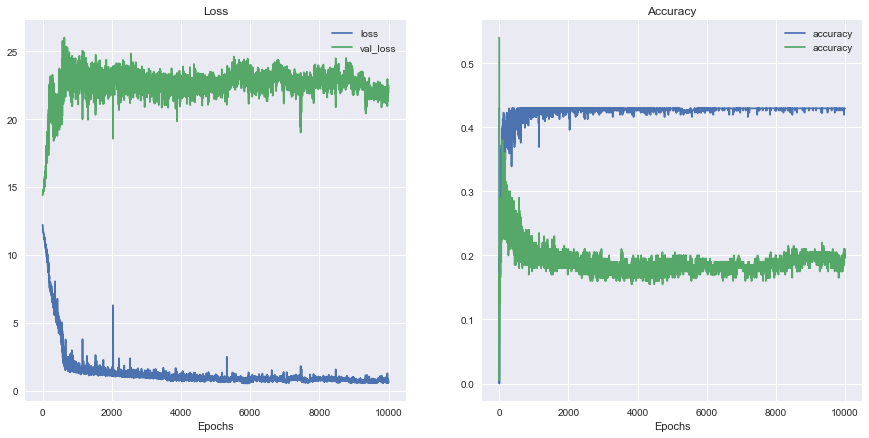

In [41]:
plot(history3)

## Fourth Experiment

In [42]:
fourth_model = model4()
fourth_model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['accuracy'])

In [43]:
history4 = fourth_model.fit(X_train, y_train, epochs=10000, validation_data=(X_valid, y_valid))

Epoch 1/10000
10/10 [==============================] - 1s 16ms/step - loss: 12.2229 - accuracy: 0.4295 - val_loss: 14.3895 - val_accuracy: 0.5400
Epoch 2/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.2182 - accuracy: 0.4295 - val_loss: 14.3931 - val_accuracy: 0.5400
Epoch 3/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.2085 - accuracy: 0.4295 - val_loss: 14.4021 - val_accuracy: 0.5400
Epoch 4/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.1838 - accuracy: 0.4262 - val_loss: 14.4271 - val_accuracy: 0.3850
Epoch 5/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.1342 - accuracy: 0.0872 - val_loss: 14.4740 - val_accuracy: 0.0000e+00
Epoch 6/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.1042 - accuracy: 0.0000e+00 - val_loss: 14.5592 - val_accuracy: 0.0000e+00
Epoch 7/10000
10/10 [==============================] - 0s 5ms/step - loss: 12.0739 - accuracy: 0.0000e+00 - val_loss:

Epoch 57/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.2261 - accuracy: 0.2718 - val_loss: 15.1454 - val_accuracy: 0.2600
Epoch 58/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.2318 - accuracy: 0.3054 - val_loss: 15.6273 - val_accuracy: 0.1550
Epoch 59/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.3506 - accuracy: 0.2517 - val_loss: 15.0838 - val_accuracy: 0.2250
Epoch 60/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.1627 - accuracy: 0.2785 - val_loss: 15.4900 - val_accuracy: 0.1850
Epoch 61/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.1935 - accuracy: 0.2919 - val_loss: 15.4543 - val_accuracy: 0.1950
Epoch 62/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.1142 - accuracy: 0.3054 - val_loss: 15.1009 - val_accuracy: 0.2600
Epoch 63/10000
10/10 [==============================] - 0s 5ms/step - loss: 11.1324 - accuracy: 0.3289 - val_loss: 15.8809 -

10/10 [==============================] - 0s 5ms/step - loss: 10.5418 - accuracy: 0.3658 - val_loss: 16.5859 - val_accuracy: 0.2350
Epoch 114/10000
10/10 [==============================] - 0s 4ms/step - loss: 10.5093 - accuracy: 0.3658 - val_loss: 16.0636 - val_accuracy: 0.3000
Epoch 115/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5829 - accuracy: 0.3523 - val_loss: 16.4903 - val_accuracy: 0.2550
Epoch 116/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.4548 - accuracy: 0.3826 - val_loss: 16.9484 - val_accuracy: 0.2000
Epoch 117/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.6717 - accuracy: 0.3154 - val_loss: 15.9694 - val_accuracy: 0.3350
Epoch 118/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5595 - accuracy: 0.3591 - val_loss: 16.9256 - val_accuracy: 0.2150
Epoch 119/10000
10/10 [==============================] - 0s 5ms/step - loss: 10.5527 - accuracy: 0.3658 - val_loss: 16.1378 - val_accu

Epoch 169/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7331 - accuracy: 0.3926 - val_loss: 17.8932 - val_accuracy: 0.2750
Epoch 170/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.7633 - accuracy: 0.3960 - val_loss: 17.2739 - val_accuracy: 0.2950
Epoch 171/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.6107 - accuracy: 0.3826 - val_loss: 18.0599 - val_accuracy: 0.2650
Epoch 172/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.7243 - accuracy: 0.3893 - val_loss: 16.7887 - val_accuracy: 0.3300
Epoch 173/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.8275 - accuracy: 0.4128 - val_loss: 18.9820 - val_accuracy: 0.2450
Epoch 174/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9199 - accuracy: 0.3926 - val_loss: 17.2570 - val_accuracy: 0.3400
Epoch 175/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.9522 - accuracy: 0.3859 - val_loss: 17.4681 -

10/10 [==============================] - 0s 5ms/step - loss: 8.9083 - accuracy: 0.4027 - val_loss: 19.1518 - val_accuracy: 0.2950
Epoch 226/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.9902 - accuracy: 0.4027 - val_loss: 18.7723 - val_accuracy: 0.3200
Epoch 227/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7702 - accuracy: 0.4060 - val_loss: 19.5321 - val_accuracy: 0.2650
Epoch 228/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7293 - accuracy: 0.3993 - val_loss: 18.7726 - val_accuracy: 0.3100
Epoch 229/10000
10/10 [==============================] - 0s 4ms/step - loss: 9.0171 - accuracy: 0.3893 - val_loss: 18.8087 - val_accuracy: 0.3150
Epoch 230/10000
10/10 [==============================] - 0s 5ms/step - loss: 8.7270 - accuracy: 0.4060 - val_loss: 20.5318 - val_accuracy: 0.2650
Epoch 231/10000
10/10 [==============================] - 0s 5ms/step - loss: 9.1298 - accuracy: 0.3960 - val_loss: 18.8745 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 7.6003 - accuracy: 0.3926 - val_loss: 21.8100 - val_accuracy: 0.2650
Epoch 282/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.7309 - accuracy: 0.3691 - val_loss: 20.9416 - val_accuracy: 0.2700
Epoch 283/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4381 - accuracy: 0.3591 - val_loss: 20.5821 - val_accuracy: 0.2900
Epoch 284/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.6333 - accuracy: 0.3826 - val_loss: 22.0851 - val_accuracy: 0.2850
Epoch 285/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.4115 - accuracy: 0.3826 - val_loss: 20.4985 - val_accuracy: 0.3100
Epoch 286/10000
10/10 [==============================] - 0s 5ms/step - loss: 7.3181 - accuracy: 0.3926 - val_loss: 22.1830 - val_accuracy: 0.2300
Epoch 287/10000
10/10 [==============================] - 0s 4ms/step - loss: 7.2591 - accuracy: 0.3691 - val_loss: 21.4825 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 6.5266 - accuracy: 0.3926 - val_loss: 21.1829 - val_accuracy: 0.3000
Epoch 338/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.5243 - accuracy: 0.3960 - val_loss: 24.4867 - val_accuracy: 0.2400
Epoch 339/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.4471 - accuracy: 0.4060 - val_loss: 22.4252 - val_accuracy: 0.2950
Epoch 340/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8051 - accuracy: 0.3960 - val_loss: 20.6140 - val_accuracy: 0.2950
Epoch 341/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.6442 - accuracy: 0.4060 - val_loss: 24.2359 - val_accuracy: 0.2650
Epoch 342/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.9025 - accuracy: 0.4094 - val_loss: 22.9120 - val_accuracy: 0.2950
Epoch 343/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.8119 - accuracy: 0.4094 - val_loss: 23.9618 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 6.0811 - accuracy: 0.4161 - val_loss: 22.4848 - val_accuracy: 0.2650
Epoch 394/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0074 - accuracy: 0.4161 - val_loss: 21.3145 - val_accuracy: 0.2850
Epoch 395/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1407 - accuracy: 0.4094 - val_loss: 25.2642 - val_accuracy: 0.2250
Epoch 396/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.1855 - accuracy: 0.3993 - val_loss: 22.1085 - val_accuracy: 0.3100
Epoch 397/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0055 - accuracy: 0.4094 - val_loss: 21.7076 - val_accuracy: 0.3100
Epoch 398/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.0239 - accuracy: 0.4161 - val_loss: 21.8973 - val_accuracy: 0.2800
Epoch 399/10000
10/10 [==============================] - 0s 4ms/step - loss: 6.1139 - accuracy: 0.3960 - val_loss: 23.5872 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 5.7205 - accuracy: 0.4060 - val_loss: 22.1686 - val_accuracy: 0.2450
Epoch 450/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.5568 - accuracy: 0.4161 - val_loss: 22.6103 - val_accuracy: 0.2250
Epoch 451/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.6357 - accuracy: 0.4094 - val_loss: 21.1879 - val_accuracy: 0.2450
Epoch 452/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.8673 - accuracy: 0.4161 - val_loss: 21.2984 - val_accuracy: 0.2300
Epoch 453/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.7073 - accuracy: 0.4161 - val_loss: 22.7783 - val_accuracy: 0.2350
Epoch 454/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.7192 - accuracy: 0.4128 - val_loss: 21.6402 - val_accuracy: 0.2200
Epoch 455/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0911 - accuracy: 0.3926 - val_loss: 20.3301 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 5.9833 - accuracy: 0.4094 - val_loss: 23.0313 - val_accuracy: 0.2200
Epoch 506/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.7964 - accuracy: 0.4060 - val_loss: 21.4125 - val_accuracy: 0.2250
Epoch 507/10000
10/10 [==============================] - 0s 6ms/step - loss: 5.7855 - accuracy: 0.3926 - val_loss: 21.5392 - val_accuracy: 0.2500
Epoch 508/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.9951 - accuracy: 0.4027 - val_loss: 22.6233 - val_accuracy: 0.2500
Epoch 509/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0514 - accuracy: 0.4060 - val_loss: 22.1986 - val_accuracy: 0.2050
Epoch 510/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.6022 - accuracy: 0.4195 - val_loss: 19.9471 - val_accuracy: 0.2350
Epoch 511/10000
10/10 [==============================] - 0s 5ms/step - loss: 6.0526 - accuracy: 0.3725 - val_loss: 23.1117 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 5.5198 - accuracy: 0.4161 - val_loss: 22.0129 - val_accuracy: 0.2250
Epoch 562/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.3521 - accuracy: 0.4161 - val_loss: 23.0552 - val_accuracy: 0.2350
Epoch 563/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.4060 - accuracy: 0.4161 - val_loss: 21.5447 - val_accuracy: 0.2250
Epoch 564/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.6762 - accuracy: 0.4161 - val_loss: 23.2595 - val_accuracy: 0.2000
Epoch 565/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.2553 - accuracy: 0.4128 - val_loss: 21.1898 - val_accuracy: 0.2450
Epoch 566/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.3923 - accuracy: 0.4128 - val_loss: 22.6623 - val_accuracy: 0.2250
Epoch 567/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.4168 - accuracy: 0.4195 - val_loss: 22.6353 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 5.5306 - accuracy: 0.4060 - val_loss: 22.9621 - val_accuracy: 0.2100
Epoch 618/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.2038 - accuracy: 0.4195 - val_loss: 22.1342 - val_accuracy: 0.2250
Epoch 619/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.6812 - accuracy: 0.4060 - val_loss: 20.3699 - val_accuracy: 0.2250
Epoch 620/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.6767 - accuracy: 0.4161 - val_loss: 22.9014 - val_accuracy: 0.2250
Epoch 621/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.2284 - accuracy: 0.4228 - val_loss: 22.2225 - val_accuracy: 0.2200
Epoch 622/10000
10/10 [==============================] - 0s 4ms/step - loss: 5.2405 - accuracy: 0.4027 - val_loss: 21.4687 - val_accuracy: 0.2150
Epoch 623/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.3272 - accuracy: 0.4161 - val_loss: 21.8303 - val_accuracy: 0

10/10 [==============================] - 0s 4ms/step - loss: 5.4291 - accuracy: 0.4060 - val_loss: 20.3035 - val_accuracy: 0.2450
Epoch 674/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.5008 - accuracy: 0.4094 - val_loss: 24.3588 - val_accuracy: 0.2000
Epoch 675/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.4651 - accuracy: 0.4060 - val_loss: 20.5672 - val_accuracy: 0.2300
Epoch 676/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.1870 - accuracy: 0.4027 - val_loss: 23.3735 - val_accuracy: 0.2100
Epoch 677/10000
10/10 [==============================] - 0s 4ms/step - loss: 4.9490 - accuracy: 0.4195 - val_loss: 22.3013 - val_accuracy: 0.2200
Epoch 678/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.0652 - accuracy: 0.4128 - val_loss: 22.6349 - val_accuracy: 0.2100
Epoch 679/10000
10/10 [==============================] - 0s 5ms/step - loss: 5.0461 - accuracy: 0.4161 - val_loss: 23.3540 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 4.5145 - accuracy: 0.4161 - val_loss: 22.8286 - val_accuracy: 0.2150
Epoch 730/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.6803 - accuracy: 0.4195 - val_loss: 21.8121 - val_accuracy: 0.2100
Epoch 731/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.9441 - accuracy: 0.4094 - val_loss: 21.7009 - val_accuracy: 0.2000
Epoch 732/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.7373 - accuracy: 0.4060 - val_loss: 22.8231 - val_accuracy: 0.2150
Epoch 733/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.6017 - accuracy: 0.4161 - val_loss: 22.9375 - val_accuracy: 0.2150
Epoch 734/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.6689 - accuracy: 0.4228 - val_loss: 21.9286 - val_accuracy: 0.2350
Epoch 735/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.6477 - accuracy: 0.4195 - val_loss: 24.2407 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 4.4898 - accuracy: 0.4128 - val_loss: 23.2169 - val_accuracy: 0.2200
Epoch 786/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.0903 - accuracy: 0.4195 - val_loss: 24.4355 - val_accuracy: 0.1950
Epoch 787/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.0296 - accuracy: 0.4228 - val_loss: 21.1765 - val_accuracy: 0.2500
Epoch 788/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.6576 - accuracy: 0.4161 - val_loss: 25.4376 - val_accuracy: 0.2000
Epoch 789/10000
10/10 [==============================] - 0s 4ms/step - loss: 4.3407 - accuracy: 0.3926 - val_loss: 21.7396 - val_accuracy: 0.2200
Epoch 790/10000
10/10 [==============================] - 0s 4ms/step - loss: 4.3370 - accuracy: 0.4161 - val_loss: 23.2918 - val_accuracy: 0.2150
Epoch 791/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.4413 - accuracy: 0.4060 - val_loss: 20.9924 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 2.9741 - accuracy: 0.3960 - val_loss: 26.3476 - val_accuracy: 0.2200
Epoch 842/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.1928 - accuracy: 0.4128 - val_loss: 21.1892 - val_accuracy: 0.2700
Epoch 843/10000
10/10 [==============================] - 0s 5ms/step - loss: 4.7967 - accuracy: 0.4161 - val_loss: 24.2969 - val_accuracy: 0.2050
Epoch 844/10000
10/10 [==============================] - 0s 5ms/step - loss: 3.8938 - accuracy: 0.3993 - val_loss: 21.7430 - val_accuracy: 0.2450
Epoch 845/10000
10/10 [==============================] - 0s 5ms/step - loss: 3.0642 - accuracy: 0.4228 - val_loss: 26.2343 - val_accuracy: 0.2200
Epoch 846/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.8610 - accuracy: 0.4027 - val_loss: 25.2042 - val_accuracy: 0.2450
Epoch 847/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.9130 - accuracy: 0.4161 - val_loss: 25.9653 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 2.4680 - accuracy: 0.4195 - val_loss: 26.0703 - val_accuracy: 0.2200
Epoch 898/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.3174 - accuracy: 0.4228 - val_loss: 26.8500 - val_accuracy: 0.2250
Epoch 899/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.3826 - accuracy: 0.4228 - val_loss: 24.2386 - val_accuracy: 0.2300
Epoch 900/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.3480 - accuracy: 0.4228 - val_loss: 25.6971 - val_accuracy: 0.2100
Epoch 901/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.3227 - accuracy: 0.4195 - val_loss: 26.0283 - val_accuracy: 0.2100
Epoch 902/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0715 - accuracy: 0.4295 - val_loss: 25.7558 - val_accuracy: 0.2200
Epoch 903/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.5562 - accuracy: 0.4262 - val_loss: 25.5832 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 2.3065 - accuracy: 0.4262 - val_loss: 24.2950 - val_accuracy: 0.2150
Epoch 954/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.6166 - accuracy: 0.4195 - val_loss: 25.4802 - val_accuracy: 0.2100
Epoch 955/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.2343 - accuracy: 0.4195 - val_loss: 24.0330 - val_accuracy: 0.2250
Epoch 956/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0854 - accuracy: 0.4195 - val_loss: 26.9952 - val_accuracy: 0.2000
Epoch 957/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.4219 - accuracy: 0.4262 - val_loss: 22.5585 - val_accuracy: 0.2200
Epoch 958/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.6493 - accuracy: 0.4027 - val_loss: 25.9563 - val_accuracy: 0.2100
Epoch 959/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.3085 - accuracy: 0.4295 - val_loss: 24.6758 - val_accuracy: 0

10/10 [==============================] - 0s 5ms/step - loss: 2.3785 - accuracy: 0.4027 - val_loss: 25.4150 - val_accuracy: 0.2250
Epoch 1010/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1017 - accuracy: 0.4161 - val_loss: 25.5110 - val_accuracy: 0.2100
Epoch 1011/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0889 - accuracy: 0.4195 - val_loss: 24.9094 - val_accuracy: 0.1950
Epoch 1012/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.8818 - accuracy: 0.3893 - val_loss: 26.0328 - val_accuracy: 0.2150
Epoch 1013/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.3417 - accuracy: 0.4262 - val_loss: 24.6931 - val_accuracy: 0.2050
Epoch 1014/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.3119 - accuracy: 0.4094 - val_loss: 25.0959 - val_accuracy: 0.2100
Epoch 1015/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1082 - accuracy: 0.4262 - val_loss: 25.0577 - val_accur

Epoch 1065/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0971 - accuracy: 0.4195 - val_loss: 22.1983 - val_accuracy: 0.2450
Epoch 1066/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.2994 - accuracy: 0.3993 - val_loss: 28.1588 - val_accuracy: 0.1700
Epoch 1067/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.9621 - accuracy: 0.4027 - val_loss: 22.0604 - val_accuracy: 0.2300
Epoch 1068/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.5093 - accuracy: 0.4262 - val_loss: 26.1331 - val_accuracy: 0.1900
Epoch 1069/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.3085 - accuracy: 0.4094 - val_loss: 22.9861 - val_accuracy: 0.2150
Epoch 1070/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.3526 - accuracy: 0.4161 - val_loss: 25.2218 - val_accuracy: 0.2000
Epoch 1071/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.5948 - accuracy: 0.4161 - val_loss: 21

Epoch 1121/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0879 - accuracy: 0.4195 - val_loss: 24.7531 - val_accuracy: 0.2000
Epoch 1122/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.2305 - accuracy: 0.4295 - val_loss: 23.0906 - val_accuracy: 0.2000
Epoch 1123/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.2091 - accuracy: 0.4128 - val_loss: 24.6606 - val_accuracy: 0.2250
Epoch 1124/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.3353 - accuracy: 0.4295 - val_loss: 25.3614 - val_accuracy: 0.2000
Epoch 1125/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1736 - accuracy: 0.4128 - val_loss: 22.7671 - val_accuracy: 0.2400
Epoch 1126/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.2310 - accuracy: 0.4262 - val_loss: 26.3496 - val_accuracy: 0.1950
Epoch 1127/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.5874 - accuracy: 0.3993 - val_loss: 20

Epoch 1177/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9358 - accuracy: 0.4195 - val_loss: 24.4091 - val_accuracy: 0.2000
Epoch 1178/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.1178 - accuracy: 0.4262 - val_loss: 25.4317 - val_accuracy: 0.2000
Epoch 1179/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.3071 - accuracy: 0.4228 - val_loss: 23.8413 - val_accuracy: 0.2000
Epoch 1180/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.2254 - accuracy: 0.4161 - val_loss: 22.6979 - val_accuracy: 0.2100
Epoch 1181/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.6389 - accuracy: 0.4195 - val_loss: 23.1467 - val_accuracy: 0.2300
Epoch 1182/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0856 - accuracy: 0.4262 - val_loss: 25.7527 - val_accuracy: 0.2100
Epoch 1183/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1709 - accuracy: 0.4195 - val_loss: 23

Epoch 1233/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9867 - accuracy: 0.4262 - val_loss: 23.1363 - val_accuracy: 0.2200
Epoch 1234/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8243 - accuracy: 0.4262 - val_loss: 24.5224 - val_accuracy: 0.2100
Epoch 1235/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8864 - accuracy: 0.4262 - val_loss: 24.0224 - val_accuracy: 0.2050
Epoch 1236/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9472 - accuracy: 0.4295 - val_loss: 25.5649 - val_accuracy: 0.2000
Epoch 1237/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0208 - accuracy: 0.4262 - val_loss: 23.0429 - val_accuracy: 0.2300
Epoch 1238/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.0065 - accuracy: 0.4295 - val_loss: 25.6098 - val_accuracy: 0.2100
Epoch 1239/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.2124 - accuracy: 0.4195 - val_loss: 23

Epoch 1289/10000
10/10 [==============================] - 0s 7ms/step - loss: 2.0130 - accuracy: 0.4195 - val_loss: 24.3475 - val_accuracy: 0.2100
Epoch 1290/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0884 - accuracy: 0.4262 - val_loss: 23.6207 - val_accuracy: 0.1800
Epoch 1291/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.2441 - accuracy: 0.4195 - val_loss: 21.7391 - val_accuracy: 0.2100
Epoch 1292/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1807 - accuracy: 0.4228 - val_loss: 24.2729 - val_accuracy: 0.2000
Epoch 1293/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0266 - accuracy: 0.4195 - val_loss: 23.6281 - val_accuracy: 0.2000
Epoch 1294/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0305 - accuracy: 0.4295 - val_loss: 23.4268 - val_accuracy: 0.1900
Epoch 1295/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8545 - accuracy: 0.4027 - val_loss: 23

Epoch 1345/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8876 - accuracy: 0.4060 - val_loss: 23.5083 - val_accuracy: 0.1850
Epoch 1346/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9368 - accuracy: 0.4228 - val_loss: 23.4357 - val_accuracy: 0.2000
Epoch 1347/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7566 - accuracy: 0.4295 - val_loss: 23.4880 - val_accuracy: 0.1900
Epoch 1348/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1717 - accuracy: 0.4295 - val_loss: 23.5616 - val_accuracy: 0.1950
Epoch 1349/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8102 - accuracy: 0.4295 - val_loss: 24.4742 - val_accuracy: 0.1950
Epoch 1350/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.9400 - accuracy: 0.4295 - val_loss: 23.5096 - val_accuracy: 0.2050
Epoch 1351/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6104 - accuracy: 0.4262 - val_loss: 25

Epoch 1401/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8699 - accuracy: 0.4262 - val_loss: 24.2945 - val_accuracy: 0.1950
Epoch 1402/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6461 - accuracy: 0.4295 - val_loss: 23.4410 - val_accuracy: 0.2050
Epoch 1403/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0467 - accuracy: 0.4295 - val_loss: 24.3754 - val_accuracy: 0.1800
Epoch 1404/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.9315 - accuracy: 0.4295 - val_loss: 24.6443 - val_accuracy: 0.1800
Epoch 1405/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0348 - accuracy: 0.4228 - val_loss: 24.6683 - val_accuracy: 0.1850
Epoch 1406/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7520 - accuracy: 0.4262 - val_loss: 24.1458 - val_accuracy: 0.1850
Epoch 1407/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9768 - accuracy: 0.4228 - val_loss: 23

Epoch 1457/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7685 - accuracy: 0.4295 - val_loss: 24.7312 - val_accuracy: 0.1900
Epoch 1458/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8683 - accuracy: 0.4262 - val_loss: 24.0303 - val_accuracy: 0.2050
Epoch 1459/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7891 - accuracy: 0.4161 - val_loss: 24.1383 - val_accuracy: 0.2200
Epoch 1460/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.8249 - accuracy: 0.4262 - val_loss: 23.9102 - val_accuracy: 0.1950
Epoch 1461/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.1351 - accuracy: 0.4228 - val_loss: 25.6639 - val_accuracy: 0.1700
Epoch 1462/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.0515 - accuracy: 0.4262 - val_loss: 23.1847 - val_accuracy: 0.2300
Epoch 1463/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.1103 - accuracy: 0.4195 - val_loss: 25

Epoch 1513/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.2168 - accuracy: 0.4262 - val_loss: 25.0837 - val_accuracy: 0.1700
Epoch 1514/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0081 - accuracy: 0.4195 - val_loss: 22.4622 - val_accuracy: 0.2050
Epoch 1515/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9522 - accuracy: 0.4295 - val_loss: 24.9407 - val_accuracy: 0.1900
Epoch 1516/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8634 - accuracy: 0.4295 - val_loss: 23.1231 - val_accuracy: 0.1950
Epoch 1517/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.8779 - accuracy: 0.4295 - val_loss: 24.6837 - val_accuracy: 0.1950
Epoch 1518/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8098 - accuracy: 0.4262 - val_loss: 24.2183 - val_accuracy: 0.2000
Epoch 1519/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7780 - accuracy: 0.4262 - val_loss: 24

Epoch 1569/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8613 - accuracy: 0.4262 - val_loss: 22.4882 - val_accuracy: 0.1950
Epoch 1570/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7253 - accuracy: 0.4262 - val_loss: 24.1701 - val_accuracy: 0.1950
Epoch 1571/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6758 - accuracy: 0.4262 - val_loss: 23.2154 - val_accuracy: 0.2050
Epoch 1572/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.6835 - accuracy: 0.4295 - val_loss: 23.9305 - val_accuracy: 0.1900
Epoch 1573/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7713 - accuracy: 0.4295 - val_loss: 23.0620 - val_accuracy: 0.1950
Epoch 1574/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7328 - accuracy: 0.4262 - val_loss: 24.3259 - val_accuracy: 0.1850
Epoch 1575/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8583 - accuracy: 0.4295 - val_loss: 23

Epoch 1625/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.8395 - accuracy: 0.4295 - val_loss: 24.8178 - val_accuracy: 0.1750
Epoch 1626/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8652 - accuracy: 0.4262 - val_loss: 22.1025 - val_accuracy: 0.2000
Epoch 1627/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1982 - accuracy: 0.4228 - val_loss: 24.9321 - val_accuracy: 0.1850
Epoch 1628/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8394 - accuracy: 0.4295 - val_loss: 22.3421 - val_accuracy: 0.2000
Epoch 1629/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9224 - accuracy: 0.4161 - val_loss: 26.1862 - val_accuracy: 0.1850
Epoch 1630/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.1192 - accuracy: 0.4195 - val_loss: 22.6978 - val_accuracy: 0.2100
Epoch 1631/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0841 - accuracy: 0.4228 - val_loss: 25

Epoch 1681/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1023 - accuracy: 0.4262 - val_loss: 24.6538 - val_accuracy: 0.1850
Epoch 1682/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9788 - accuracy: 0.4195 - val_loss: 22.5998 - val_accuracy: 0.2050
Epoch 1683/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9392 - accuracy: 0.4195 - val_loss: 24.1754 - val_accuracy: 0.1700
Epoch 1684/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8847 - accuracy: 0.4161 - val_loss: 23.4082 - val_accuracy: 0.1950
Epoch 1685/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9639 - accuracy: 0.4195 - val_loss: 26.2673 - val_accuracy: 0.1900
Epoch 1686/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9288 - accuracy: 0.4228 - val_loss: 22.2325 - val_accuracy: 0.2050
Epoch 1687/10000
10/10 [==============================] - 0s 4ms/step - loss: 2.0863 - accuracy: 0.4128 - val_loss: 24

Epoch 1737/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7939 - accuracy: 0.4262 - val_loss: 23.3341 - val_accuracy: 0.1750
Epoch 1738/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8923 - accuracy: 0.4195 - val_loss: 23.2448 - val_accuracy: 0.1850
Epoch 1739/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8014 - accuracy: 0.4228 - val_loss: 24.0914 - val_accuracy: 0.1900
Epoch 1740/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1442 - accuracy: 0.4262 - val_loss: 23.2042 - val_accuracy: 0.1700
Epoch 1741/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8737 - accuracy: 0.4161 - val_loss: 23.6228 - val_accuracy: 0.1850
Epoch 1742/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.8521 - accuracy: 0.4228 - val_loss: 22.5998 - val_accuracy: 0.1900
Epoch 1743/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.4560 - accuracy: 0.4161 - val_loss: 22

Epoch 1793/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7158 - accuracy: 0.4228 - val_loss: 25.0657 - val_accuracy: 0.1900
Epoch 1794/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9542 - accuracy: 0.4195 - val_loss: 24.1345 - val_accuracy: 0.1950
Epoch 1795/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8422 - accuracy: 0.4161 - val_loss: 22.2024 - val_accuracy: 0.1800
Epoch 1796/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0715 - accuracy: 0.4228 - val_loss: 24.7425 - val_accuracy: 0.1800
Epoch 1797/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8400 - accuracy: 0.4228 - val_loss: 23.6791 - val_accuracy: 0.1850
Epoch 1798/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9475 - accuracy: 0.4228 - val_loss: 23.9364 - val_accuracy: 0.1800
Epoch 1799/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.3391 - accuracy: 0.4128 - val_loss: 24

Epoch 1849/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6945 - accuracy: 0.4262 - val_loss: 23.1632 - val_accuracy: 0.1750
Epoch 1850/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9181 - accuracy: 0.4262 - val_loss: 24.3237 - val_accuracy: 0.1750
Epoch 1851/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.7274 - accuracy: 0.4295 - val_loss: 24.3092 - val_accuracy: 0.1700
Epoch 1852/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6098 - accuracy: 0.4295 - val_loss: 23.6070 - val_accuracy: 0.1750
Epoch 1853/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6069 - accuracy: 0.4228 - val_loss: 24.2862 - val_accuracy: 0.1800
Epoch 1854/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5435 - accuracy: 0.4262 - val_loss: 23.9181 - val_accuracy: 0.1750
Epoch 1855/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6308 - accuracy: 0.4262 - val_loss: 23

Epoch 1905/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6468 - accuracy: 0.4262 - val_loss: 23.2667 - val_accuracy: 0.1750
Epoch 1906/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7561 - accuracy: 0.4228 - val_loss: 25.2562 - val_accuracy: 0.1750
Epoch 1907/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.2269 - accuracy: 0.4228 - val_loss: 23.8559 - val_accuracy: 0.1900
Epoch 1908/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1162 - accuracy: 0.4262 - val_loss: 23.7748 - val_accuracy: 0.1600
Epoch 1909/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9842 - accuracy: 0.3960 - val_loss: 24.4054 - val_accuracy: 0.1950
Epoch 1910/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.1015 - accuracy: 0.4262 - val_loss: 24.7462 - val_accuracy: 0.1600
Epoch 1911/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6597 - accuracy: 0.4195 - val_loss: 21

Epoch 1961/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0728 - accuracy: 0.4228 - val_loss: 25.9767 - val_accuracy: 0.1650
Epoch 1962/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9986 - accuracy: 0.4195 - val_loss: 23.9963 - val_accuracy: 0.1700
Epoch 1963/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6965 - accuracy: 0.4128 - val_loss: 24.2074 - val_accuracy: 0.1600
Epoch 1964/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6870 - accuracy: 0.4128 - val_loss: 22.8593 - val_accuracy: 0.1650
Epoch 1965/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.6167 - accuracy: 0.4262 - val_loss: 24.7186 - val_accuracy: 0.1650
Epoch 1966/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8346 - accuracy: 0.4262 - val_loss: 23.1576 - val_accuracy: 0.1750
Epoch 1967/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6897 - accuracy: 0.4262 - val_loss: 24

Epoch 2017/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6959 - accuracy: 0.4262 - val_loss: 24.2351 - val_accuracy: 0.1500
Epoch 2018/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6896 - accuracy: 0.4262 - val_loss: 24.7975 - val_accuracy: 0.1750
Epoch 2019/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.6297 - accuracy: 0.4228 - val_loss: 23.8371 - val_accuracy: 0.1700
Epoch 2020/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.8269 - accuracy: 0.4161 - val_loss: 25.5714 - val_accuracy: 0.1600
Epoch 2021/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7085 - accuracy: 0.4262 - val_loss: 24.2949 - val_accuracy: 0.1700
Epoch 2022/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.8829 - accuracy: 0.4262 - val_loss: 24.9483 - val_accuracy: 0.1550
Epoch 2023/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6827 - accuracy: 0.4195 - val_loss: 24

Epoch 2073/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.7672 - accuracy: 0.4262 - val_loss: 24.7602 - val_accuracy: 0.1450
Epoch 2074/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8042 - accuracy: 0.4262 - val_loss: 25.0971 - val_accuracy: 0.1700
Epoch 2075/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6615 - accuracy: 0.4262 - val_loss: 24.1576 - val_accuracy: 0.1350
Epoch 2076/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6744 - accuracy: 0.4228 - val_loss: 24.0945 - val_accuracy: 0.1400
Epoch 2077/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.6875 - accuracy: 0.4228 - val_loss: 23.9322 - val_accuracy: 0.1650
Epoch 2078/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6255 - accuracy: 0.4228 - val_loss: 25.0151 - val_accuracy: 0.1450
Epoch 2079/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5770 - accuracy: 0.4262 - val_loss: 24

Epoch 2129/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8705 - accuracy: 0.4195 - val_loss: 23.3825 - val_accuracy: 0.1600
Epoch 2130/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5644 - accuracy: 0.4262 - val_loss: 21.9833 - val_accuracy: 0.1350
Epoch 2131/10000
10/10 [==============================] - 0s 5ms/step - loss: 2.0905 - accuracy: 0.4262 - val_loss: 22.5846 - val_accuracy: 0.1600
Epoch 2132/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5485 - accuracy: 0.4262 - val_loss: 24.7918 - val_accuracy: 0.1650
Epoch 2133/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.8704 - accuracy: 0.4262 - val_loss: 22.0965 - val_accuracy: 0.1600
Epoch 2134/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.8295 - accuracy: 0.4195 - val_loss: 23.6977 - val_accuracy: 0.1350
Epoch 2135/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6890 - accuracy: 0.4262 - val_loss: 23

Epoch 2185/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6327 - accuracy: 0.4262 - val_loss: 24.1976 - val_accuracy: 0.1650
Epoch 2186/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6488 - accuracy: 0.4262 - val_loss: 23.5049 - val_accuracy: 0.1500
Epoch 2187/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4868 - accuracy: 0.4262 - val_loss: 23.4953 - val_accuracy: 0.1400
Epoch 2188/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6829 - accuracy: 0.4262 - val_loss: 22.6953 - val_accuracy: 0.1450
Epoch 2189/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6908 - accuracy: 0.4262 - val_loss: 24.7849 - val_accuracy: 0.1450
Epoch 2190/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.8090 - accuracy: 0.4262 - val_loss: 23.8110 - val_accuracy: 0.1450
Epoch 2191/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5297 - accuracy: 0.4262 - val_loss: 24

Epoch 2241/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5118 - accuracy: 0.4195 - val_loss: 23.1190 - val_accuracy: 0.1600
Epoch 2242/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5248 - accuracy: 0.4228 - val_loss: 24.0243 - val_accuracy: 0.1250
Epoch 2243/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4891 - accuracy: 0.4262 - val_loss: 23.8563 - val_accuracy: 0.1550
Epoch 2244/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6403 - accuracy: 0.4228 - val_loss: 24.9149 - val_accuracy: 0.1450
Epoch 2245/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5562 - accuracy: 0.4262 - val_loss: 23.1285 - val_accuracy: 0.1450
Epoch 2246/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7760 - accuracy: 0.4262 - val_loss: 23.2677 - val_accuracy: 0.1450
Epoch 2247/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7829 - accuracy: 0.4228 - val_loss: 23

Epoch 2297/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3990 - accuracy: 0.4262 - val_loss: 24.0680 - val_accuracy: 0.1500
Epoch 2298/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6663 - accuracy: 0.4262 - val_loss: 25.3050 - val_accuracy: 0.1550
Epoch 2299/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.5413 - accuracy: 0.4262 - val_loss: 24.9285 - val_accuracy: 0.1450
Epoch 2300/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5707 - accuracy: 0.4228 - val_loss: 24.7056 - val_accuracy: 0.1500
Epoch 2301/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5056 - accuracy: 0.4262 - val_loss: 25.1271 - val_accuracy: 0.1600
Epoch 2302/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.4732 - accuracy: 0.4262 - val_loss: 24.1209 - val_accuracy: 0.1500
Epoch 2303/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5579 - accuracy: 0.4262 - val_loss: 24

Epoch 2353/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.7180 - accuracy: 0.4262 - val_loss: 23.5989 - val_accuracy: 0.1500
Epoch 2354/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4432 - accuracy: 0.4262 - val_loss: 24.7060 - val_accuracy: 0.1550
Epoch 2355/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4739 - accuracy: 0.4262 - val_loss: 23.7731 - val_accuracy: 0.1550
Epoch 2356/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5753 - accuracy: 0.4262 - val_loss: 25.0624 - val_accuracy: 0.1600
Epoch 2357/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5497 - accuracy: 0.4228 - val_loss: 25.5504 - val_accuracy: 0.1400
Epoch 2358/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5485 - accuracy: 0.4262 - val_loss: 23.9596 - val_accuracy: 0.1450
Epoch 2359/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6048 - accuracy: 0.4262 - val_loss: 25

Epoch 2409/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7652 - accuracy: 0.4027 - val_loss: 24.1641 - val_accuracy: 0.1600
Epoch 2410/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7535 - accuracy: 0.4262 - val_loss: 26.0986 - val_accuracy: 0.1350
Epoch 2411/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6482 - accuracy: 0.4128 - val_loss: 25.2361 - val_accuracy: 0.1650
Epoch 2412/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7212 - accuracy: 0.4228 - val_loss: 26.3809 - val_accuracy: 0.1400
Epoch 2413/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.6118 - accuracy: 0.4228 - val_loss: 24.0350 - val_accuracy: 0.1350
Epoch 2414/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8371 - accuracy: 0.4228 - val_loss: 25.8940 - val_accuracy: 0.1500
Epoch 2415/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7066 - accuracy: 0.4228 - val_loss: 24

Epoch 2465/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4689 - accuracy: 0.4262 - val_loss: 25.7790 - val_accuracy: 0.1450
Epoch 2466/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6310 - accuracy: 0.4262 - val_loss: 23.2508 - val_accuracy: 0.1450
Epoch 2467/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6777 - accuracy: 0.4195 - val_loss: 25.3994 - val_accuracy: 0.1450
Epoch 2468/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6495 - accuracy: 0.4228 - val_loss: 23.9742 - val_accuracy: 0.1350
Epoch 2469/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7414 - accuracy: 0.4128 - val_loss: 25.5213 - val_accuracy: 0.1450
Epoch 2470/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5797 - accuracy: 0.4262 - val_loss: 24.2790 - val_accuracy: 0.1500
Epoch 2471/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4929 - accuracy: 0.4262 - val_loss: 25

Epoch 2521/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4765 - accuracy: 0.4262 - val_loss: 24.1745 - val_accuracy: 0.1500
Epoch 2522/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4027 - accuracy: 0.4262 - val_loss: 25.1628 - val_accuracy: 0.1450
Epoch 2523/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5088 - accuracy: 0.4228 - val_loss: 23.7782 - val_accuracy: 0.1600
Epoch 2524/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4946 - accuracy: 0.4262 - val_loss: 25.5188 - val_accuracy: 0.1550
Epoch 2525/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4001 - accuracy: 0.4262 - val_loss: 23.6293 - val_accuracy: 0.1350
Epoch 2526/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.5275 - accuracy: 0.4262 - val_loss: 25.3637 - val_accuracy: 0.1450
Epoch 2527/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5434 - accuracy: 0.4262 - val_loss: 24

Epoch 2577/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.6339 - accuracy: 0.4195 - val_loss: 23.3374 - val_accuracy: 0.1500
Epoch 2578/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5669 - accuracy: 0.4262 - val_loss: 25.1721 - val_accuracy: 0.1450
Epoch 2579/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8029 - accuracy: 0.4262 - val_loss: 23.1307 - val_accuracy: 0.1500
Epoch 2580/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4726 - accuracy: 0.4262 - val_loss: 24.8317 - val_accuracy: 0.1500
Epoch 2581/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.5427 - accuracy: 0.4228 - val_loss: 23.6577 - val_accuracy: 0.1550
Epoch 2582/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5610 - accuracy: 0.4262 - val_loss: 24.5719 - val_accuracy: 0.1500
Epoch 2583/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6129 - accuracy: 0.4262 - val_loss: 23

Epoch 2633/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5953 - accuracy: 0.3926 - val_loss: 24.6073 - val_accuracy: 0.1550
Epoch 2634/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4332 - accuracy: 0.4228 - val_loss: 23.9001 - val_accuracy: 0.1350
Epoch 2635/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.6891 - accuracy: 0.4161 - val_loss: 24.8232 - val_accuracy: 0.1450
Epoch 2636/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4960 - accuracy: 0.4262 - val_loss: 23.7606 - val_accuracy: 0.1450
Epoch 2637/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6582 - accuracy: 0.4195 - val_loss: 24.9880 - val_accuracy: 0.1550
Epoch 2638/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.4361 - accuracy: 0.4262 - val_loss: 24.7056 - val_accuracy: 0.1400
Epoch 2639/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.4919 - accuracy: 0.4195 - val_loss: 23

Epoch 2689/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4218 - accuracy: 0.4228 - val_loss: 24.2116 - val_accuracy: 0.1400
Epoch 2690/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4071 - accuracy: 0.4228 - val_loss: 24.6133 - val_accuracy: 0.1500
Epoch 2691/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4256 - accuracy: 0.4262 - val_loss: 24.0879 - val_accuracy: 0.1400
Epoch 2692/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4420 - accuracy: 0.4128 - val_loss: 24.7162 - val_accuracy: 0.1500
Epoch 2693/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3893 - accuracy: 0.4262 - val_loss: 23.0148 - val_accuracy: 0.1350
Epoch 2694/10000
10/10 [==============================] - 0s 7ms/step - loss: 1.4497 - accuracy: 0.4228 - val_loss: 24.5217 - val_accuracy: 0.1400
Epoch 2695/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4479 - accuracy: 0.4262 - val_loss: 24

Epoch 2745/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4853 - accuracy: 0.4262 - val_loss: 25.1539 - val_accuracy: 0.1500
Epoch 2746/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5576 - accuracy: 0.4262 - val_loss: 24.1812 - val_accuracy: 0.1500
Epoch 2747/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.4523 - accuracy: 0.4262 - val_loss: 24.7086 - val_accuracy: 0.1500
Epoch 2748/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3799 - accuracy: 0.4262 - val_loss: 24.3946 - val_accuracy: 0.1450
Epoch 2749/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4515 - accuracy: 0.4262 - val_loss: 23.9448 - val_accuracy: 0.1350
Epoch 2750/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.4297 - accuracy: 0.4262 - val_loss: 24.1750 - val_accuracy: 0.1450
Epoch 2751/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.4708 - accuracy: 0.4262 - val_loss: 24

Epoch 2801/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4271 - accuracy: 0.4128 - val_loss: 25.4046 - val_accuracy: 0.1450
Epoch 2802/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4755 - accuracy: 0.4228 - val_loss: 24.1279 - val_accuracy: 0.1400
Epoch 2803/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5590 - accuracy: 0.4262 - val_loss: 25.6118 - val_accuracy: 0.1450
Epoch 2804/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9427 - accuracy: 0.4228 - val_loss: 24.2955 - val_accuracy: 0.1500
Epoch 2805/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6832 - accuracy: 0.4161 - val_loss: 23.0707 - val_accuracy: 0.1200
Epoch 2806/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8348 - accuracy: 0.4094 - val_loss: 23.4026 - val_accuracy: 0.1400
Epoch 2807/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5339 - accuracy: 0.4195 - val_loss: 24

Epoch 2857/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5021 - accuracy: 0.4262 - val_loss: 23.6597 - val_accuracy: 0.1400
Epoch 2858/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6517 - accuracy: 0.4262 - val_loss: 25.2560 - val_accuracy: 0.1400
Epoch 2859/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5152 - accuracy: 0.4228 - val_loss: 25.8741 - val_accuracy: 0.1300
Epoch 2860/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.5578 - accuracy: 0.4262 - val_loss: 23.6274 - val_accuracy: 0.1450
Epoch 2861/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6636 - accuracy: 0.4195 - val_loss: 25.4563 - val_accuracy: 0.1500
Epoch 2862/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4923 - accuracy: 0.4228 - val_loss: 23.1427 - val_accuracy: 0.1350
Epoch 2863/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.7022 - accuracy: 0.4228 - val_loss: 26

Epoch 2913/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5801 - accuracy: 0.4128 - val_loss: 23.2175 - val_accuracy: 0.1300
Epoch 2914/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.9018 - accuracy: 0.4128 - val_loss: 24.0004 - val_accuracy: 0.1400
Epoch 2915/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7316 - accuracy: 0.4195 - val_loss: 25.7342 - val_accuracy: 0.1250
Epoch 2916/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5965 - accuracy: 0.4262 - val_loss: 25.1195 - val_accuracy: 0.1400
Epoch 2917/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4246 - accuracy: 0.4228 - val_loss: 24.5026 - val_accuracy: 0.1200
Epoch 2918/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3584 - accuracy: 0.4195 - val_loss: 25.2934 - val_accuracy: 0.1300
Epoch 2919/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.3682 - accuracy: 0.4228 - val_loss: 24

Epoch 2969/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3992 - accuracy: 0.4161 - val_loss: 25.3817 - val_accuracy: 0.1250
Epoch 2970/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.6384 - accuracy: 0.4228 - val_loss: 25.2692 - val_accuracy: 0.1350
Epoch 2971/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7696 - accuracy: 0.4161 - val_loss: 25.0586 - val_accuracy: 0.1300
Epoch 2972/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.5710 - accuracy: 0.4060 - val_loss: 25.8199 - val_accuracy: 0.1200
Epoch 2973/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4303 - accuracy: 0.4161 - val_loss: 25.0989 - val_accuracy: 0.1250
Epoch 2974/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4085 - accuracy: 0.4228 - val_loss: 25.3901 - val_accuracy: 0.1250
Epoch 2975/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2864 - accuracy: 0.4195 - val_loss: 24

Epoch 3025/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.2450 - accuracy: 0.4161 - val_loss: 24.4830 - val_accuracy: 0.1350
Epoch 3026/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2630 - accuracy: 0.4195 - val_loss: 26.2257 - val_accuracy: 0.1300
Epoch 3027/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3882 - accuracy: 0.4128 - val_loss: 24.1528 - val_accuracy: 0.1400
Epoch 3028/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4116 - accuracy: 0.4161 - val_loss: 23.2519 - val_accuracy: 0.1350
Epoch 3029/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.8621 - accuracy: 0.4128 - val_loss: 24.3495 - val_accuracy: 0.1300
Epoch 3030/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.7909 - accuracy: 0.4094 - val_loss: 24.2491 - val_accuracy: 0.1400
Epoch 3031/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5425 - accuracy: 0.4228 - val_loss: 25

Epoch 3081/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3774 - accuracy: 0.4094 - val_loss: 26.2832 - val_accuracy: 0.1250
Epoch 3082/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2937 - accuracy: 0.4161 - val_loss: 27.1031 - val_accuracy: 0.1200
Epoch 3083/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3724 - accuracy: 0.4128 - val_loss: 25.3974 - val_accuracy: 0.1250
Epoch 3084/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4337 - accuracy: 0.4128 - val_loss: 26.0793 - val_accuracy: 0.1250
Epoch 3085/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.2994 - accuracy: 0.4128 - val_loss: 26.3722 - val_accuracy: 0.1200
Epoch 3086/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3123 - accuracy: 0.4128 - val_loss: 26.1484 - val_accuracy: 0.1250
Epoch 3087/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2456 - accuracy: 0.4128 - val_loss: 25

Epoch 3137/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3626 - accuracy: 0.4195 - val_loss: 24.7857 - val_accuracy: 0.1350
Epoch 3138/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3585 - accuracy: 0.4094 - val_loss: 24.8708 - val_accuracy: 0.1350
Epoch 3139/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.2941 - accuracy: 0.4228 - val_loss: 24.4466 - val_accuracy: 0.1350
Epoch 3140/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.2594 - accuracy: 0.4195 - val_loss: 25.6481 - val_accuracy: 0.1250
Epoch 3141/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5932 - accuracy: 0.4128 - val_loss: 24.9693 - val_accuracy: 0.1250
Epoch 3142/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5149 - accuracy: 0.4161 - val_loss: 25.2552 - val_accuracy: 0.1300
Epoch 3143/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.3650 - accuracy: 0.4195 - val_loss: 23

Epoch 3193/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5636 - accuracy: 0.4060 - val_loss: 26.1990 - val_accuracy: 0.1300
Epoch 3194/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4958 - accuracy: 0.4161 - val_loss: 25.0879 - val_accuracy: 0.1350
Epoch 3195/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4819 - accuracy: 0.4161 - val_loss: 24.9920 - val_accuracy: 0.1150
Epoch 3196/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3262 - accuracy: 0.4094 - val_loss: 25.7880 - val_accuracy: 0.1200
Epoch 3197/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2860 - accuracy: 0.4161 - val_loss: 24.2378 - val_accuracy: 0.1250
Epoch 3198/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3872 - accuracy: 0.4128 - val_loss: 26.1302 - val_accuracy: 0.1200
Epoch 3199/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4050 - accuracy: 0.4128 - val_loss: 24

Epoch 3249/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3756 - accuracy: 0.4060 - val_loss: 24.6751 - val_accuracy: 0.1200
Epoch 3250/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4089 - accuracy: 0.4060 - val_loss: 24.7747 - val_accuracy: 0.1300
Epoch 3251/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2523 - accuracy: 0.4060 - val_loss: 24.3003 - val_accuracy: 0.1250
Epoch 3252/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3696 - accuracy: 0.4060 - val_loss: 25.1415 - val_accuracy: 0.1150
Epoch 3253/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1731 - accuracy: 0.4128 - val_loss: 24.7699 - val_accuracy: 0.1200
Epoch 3254/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3608 - accuracy: 0.4128 - val_loss: 25.6697 - val_accuracy: 0.1200
Epoch 3255/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3186 - accuracy: 0.4161 - val_loss: 24

Epoch 3305/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.4688 - accuracy: 0.4195 - val_loss: 25.2898 - val_accuracy: 0.1200
Epoch 3306/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2537 - accuracy: 0.4094 - val_loss: 25.0991 - val_accuracy: 0.1200
Epoch 3307/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.1934 - accuracy: 0.4195 - val_loss: 25.1774 - val_accuracy: 0.1200
Epoch 3308/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1342 - accuracy: 0.4195 - val_loss: 24.7061 - val_accuracy: 0.1150
Epoch 3309/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3422 - accuracy: 0.4027 - val_loss: 25.6645 - val_accuracy: 0.1250
Epoch 3310/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.2662 - accuracy: 0.4128 - val_loss: 24.8392 - val_accuracy: 0.1200
Epoch 3311/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3897 - accuracy: 0.4027 - val_loss: 25

Epoch 3361/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2529 - accuracy: 0.4161 - val_loss: 24.5386 - val_accuracy: 0.1300
Epoch 3362/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.2408 - accuracy: 0.4094 - val_loss: 25.5451 - val_accuracy: 0.1300
Epoch 3363/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3126 - accuracy: 0.4128 - val_loss: 23.8600 - val_accuracy: 0.1300
Epoch 3364/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3669 - accuracy: 0.4094 - val_loss: 25.1416 - val_accuracy: 0.1250
Epoch 3365/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1603 - accuracy: 0.4161 - val_loss: 25.1537 - val_accuracy: 0.1150
Epoch 3366/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3286 - accuracy: 0.4094 - val_loss: 25.4188 - val_accuracy: 0.1250
Epoch 3367/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2365 - accuracy: 0.4027 - val_loss: 24

Epoch 3417/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3756 - accuracy: 0.4128 - val_loss: 24.6750 - val_accuracy: 0.1200
Epoch 3418/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2539 - accuracy: 0.4161 - val_loss: 24.8804 - val_accuracy: 0.1200
Epoch 3419/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2266 - accuracy: 0.4161 - val_loss: 24.4577 - val_accuracy: 0.1150
Epoch 3420/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1476 - accuracy: 0.3926 - val_loss: 25.3797 - val_accuracy: 0.1200
Epoch 3421/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1905 - accuracy: 0.4128 - val_loss: 25.1431 - val_accuracy: 0.1150
Epoch 3422/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1602 - accuracy: 0.4094 - val_loss: 24.8637 - val_accuracy: 0.1100
Epoch 3423/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.2859 - accuracy: 0.4060 - val_loss: 24

Epoch 3473/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2541 - accuracy: 0.4161 - val_loss: 24.8548 - val_accuracy: 0.1150
Epoch 3474/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0838 - accuracy: 0.4060 - val_loss: 25.7099 - val_accuracy: 0.1250
Epoch 3475/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3465 - accuracy: 0.4161 - val_loss: 25.0109 - val_accuracy: 0.1150
Epoch 3476/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2157 - accuracy: 0.4094 - val_loss: 24.7599 - val_accuracy: 0.1250
Epoch 3477/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2104 - accuracy: 0.4128 - val_loss: 24.9454 - val_accuracy: 0.1150
Epoch 3478/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0648 - accuracy: 0.4128 - val_loss: 24.9870 - val_accuracy: 0.1200
Epoch 3479/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.2311 - accuracy: 0.4060 - val_loss: 24

Epoch 3529/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1341 - accuracy: 0.4094 - val_loss: 26.1986 - val_accuracy: 0.1250
Epoch 3530/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1532 - accuracy: 0.4195 - val_loss: 25.3145 - val_accuracy: 0.1300
Epoch 3531/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1532 - accuracy: 0.4128 - val_loss: 26.2192 - val_accuracy: 0.1250
Epoch 3532/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0956 - accuracy: 0.4161 - val_loss: 24.7637 - val_accuracy: 0.1350
Epoch 3533/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.1848 - accuracy: 0.4161 - val_loss: 26.4963 - val_accuracy: 0.1200
Epoch 3534/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1864 - accuracy: 0.4094 - val_loss: 24.5492 - val_accuracy: 0.1250
Epoch 3535/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2041 - accuracy: 0.3826 - val_loss: 26

Epoch 3585/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1459 - accuracy: 0.4161 - val_loss: 25.5589 - val_accuracy: 0.1300
Epoch 3586/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0257 - accuracy: 0.4128 - val_loss: 26.2256 - val_accuracy: 0.1300
Epoch 3587/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1464 - accuracy: 0.4094 - val_loss: 25.0707 - val_accuracy: 0.1200
Epoch 3588/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1606 - accuracy: 0.4060 - val_loss: 25.3749 - val_accuracy: 0.1250
Epoch 3589/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1396 - accuracy: 0.3993 - val_loss: 25.7278 - val_accuracy: 0.1350
Epoch 3590/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1123 - accuracy: 0.4128 - val_loss: 26.6105 - val_accuracy: 0.1250
Epoch 3591/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1226 - accuracy: 0.4060 - val_loss: 25

Epoch 3641/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.5772 - accuracy: 0.4060 - val_loss: 26.3887 - val_accuracy: 0.1250
Epoch 3642/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2925 - accuracy: 0.3960 - val_loss: 26.2082 - val_accuracy: 0.1250
Epoch 3643/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1144 - accuracy: 0.3993 - val_loss: 25.9223 - val_accuracy: 0.1350
Epoch 3644/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0994 - accuracy: 0.4161 - val_loss: 27.5764 - val_accuracy: 0.1250
Epoch 3645/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.3064 - accuracy: 0.4060 - val_loss: 26.0395 - val_accuracy: 0.1400
Epoch 3646/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1389 - accuracy: 0.3993 - val_loss: 26.4683 - val_accuracy: 0.1300
Epoch 3647/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2373 - accuracy: 0.4060 - val_loss: 26

Epoch 3697/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0252 - accuracy: 0.3960 - val_loss: 26.5184 - val_accuracy: 0.1200
Epoch 3698/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1137 - accuracy: 0.4161 - val_loss: 25.5346 - val_accuracy: 0.1150
Epoch 3699/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0843 - accuracy: 0.4128 - val_loss: 26.0669 - val_accuracy: 0.1150
Epoch 3700/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0176 - accuracy: 0.4161 - val_loss: 25.4770 - val_accuracy: 0.1200
Epoch 3701/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9433 - accuracy: 0.4094 - val_loss: 25.5274 - val_accuracy: 0.1200
Epoch 3702/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0601 - accuracy: 0.4128 - val_loss: 25.5157 - val_accuracy: 0.1100
Epoch 3703/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1172 - accuracy: 0.4128 - val_loss: 25

Epoch 3753/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2498 - accuracy: 0.4161 - val_loss: 25.0543 - val_accuracy: 0.1100
Epoch 3754/10000
10/10 [==============================] - 0s 7ms/step - loss: 1.0843 - accuracy: 0.4094 - val_loss: 26.3495 - val_accuracy: 0.1200
Epoch 3755/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0795 - accuracy: 0.4094 - val_loss: 25.1342 - val_accuracy: 0.1150
Epoch 3756/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9922 - accuracy: 0.4161 - val_loss: 26.3494 - val_accuracy: 0.1250
Epoch 3757/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.9914 - accuracy: 0.4161 - val_loss: 25.1725 - val_accuracy: 0.1150
Epoch 3758/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0041 - accuracy: 0.4195 - val_loss: 26.3790 - val_accuracy: 0.1150
Epoch 3759/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0677 - accuracy: 0.4128 - val_loss: 24

Epoch 3809/10000
10/10 [==============================] - 0s 7ms/step - loss: 1.0220 - accuracy: 0.4161 - val_loss: 26.3349 - val_accuracy: 0.1400
Epoch 3810/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9996 - accuracy: 0.4128 - val_loss: 25.2164 - val_accuracy: 0.1200
Epoch 3811/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1538 - accuracy: 0.4128 - val_loss: 25.3193 - val_accuracy: 0.1150
Epoch 3812/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9970 - accuracy: 0.4027 - val_loss: 24.4373 - val_accuracy: 0.1350
Epoch 3813/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0784 - accuracy: 0.4060 - val_loss: 25.1822 - val_accuracy: 0.1300
Epoch 3814/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0578 - accuracy: 0.4161 - val_loss: 25.2443 - val_accuracy: 0.1050
Epoch 3815/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.1077 - accuracy: 0.4094 - val_loss: 25

Epoch 3865/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0451 - accuracy: 0.4128 - val_loss: 26.0222 - val_accuracy: 0.1150
Epoch 3866/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9155 - accuracy: 0.4094 - val_loss: 25.6090 - val_accuracy: 0.1300
Epoch 3867/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0448 - accuracy: 0.4228 - val_loss: 25.9027 - val_accuracy: 0.1200
Epoch 3868/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9333 - accuracy: 0.4094 - val_loss: 26.3030 - val_accuracy: 0.1250
Epoch 3869/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0314 - accuracy: 0.4060 - val_loss: 25.9952 - val_accuracy: 0.1200
Epoch 3870/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9323 - accuracy: 0.4195 - val_loss: 25.9269 - val_accuracy: 0.1300
Epoch 3871/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0171 - accuracy: 0.4161 - val_loss: 25

Epoch 3921/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0495 - accuracy: 0.4161 - val_loss: 27.2006 - val_accuracy: 0.1200
Epoch 3922/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0132 - accuracy: 0.4060 - val_loss: 26.0263 - val_accuracy: 0.1450
Epoch 3923/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.9909 - accuracy: 0.4161 - val_loss: 26.2485 - val_accuracy: 0.1300
Epoch 3924/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0855 - accuracy: 0.4195 - val_loss: 25.4322 - val_accuracy: 0.1250
Epoch 3925/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9408 - accuracy: 0.4161 - val_loss: 26.4973 - val_accuracy: 0.1300
Epoch 3926/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.0152 - accuracy: 0.4161 - val_loss: 25.6560 - val_accuracy: 0.1250
Epoch 3927/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0014 - accuracy: 0.4195 - val_loss: 26

Epoch 3977/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0207 - accuracy: 0.4128 - val_loss: 25.2702 - val_accuracy: 0.1150
Epoch 3978/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0902 - accuracy: 0.4161 - val_loss: 25.5753 - val_accuracy: 0.1200
Epoch 3979/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9932 - accuracy: 0.4128 - val_loss: 25.4522 - val_accuracy: 0.1250
Epoch 3980/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0437 - accuracy: 0.4128 - val_loss: 25.5213 - val_accuracy: 0.1300
Epoch 3981/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0360 - accuracy: 0.4161 - val_loss: 25.4299 - val_accuracy: 0.1500
Epoch 3982/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.2866 - accuracy: 0.4128 - val_loss: 25.4980 - val_accuracy: 0.1400
Epoch 3983/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1567 - accuracy: 0.4195 - val_loss: 24

Epoch 4033/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9559 - accuracy: 0.4161 - val_loss: 25.5602 - val_accuracy: 0.1200
Epoch 4034/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9639 - accuracy: 0.4161 - val_loss: 26.4226 - val_accuracy: 0.1200
Epoch 4035/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0501 - accuracy: 0.4128 - val_loss: 25.5899 - val_accuracy: 0.1200
Epoch 4036/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9570 - accuracy: 0.4094 - val_loss: 25.5641 - val_accuracy: 0.1200
Epoch 4037/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9830 - accuracy: 0.4128 - val_loss: 24.8119 - val_accuracy: 0.1250
Epoch 4038/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9315 - accuracy: 0.4060 - val_loss: 26.8513 - val_accuracy: 0.1200
Epoch 4039/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2026 - accuracy: 0.4128 - val_loss: 25

Epoch 4089/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.3961 - accuracy: 0.4128 - val_loss: 25.1696 - val_accuracy: 0.1200
Epoch 4090/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2248 - accuracy: 0.4094 - val_loss: 25.9918 - val_accuracy: 0.1250
Epoch 4091/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0887 - accuracy: 0.4161 - val_loss: 26.1890 - val_accuracy: 0.1150
Epoch 4092/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0575 - accuracy: 0.4094 - val_loss: 25.7602 - val_accuracy: 0.1350
Epoch 4093/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8947 - accuracy: 0.4161 - val_loss: 25.6149 - val_accuracy: 0.1200
Epoch 4094/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.0704 - accuracy: 0.4094 - val_loss: 26.0416 - val_accuracy: 0.1100
Epoch 4095/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0238 - accuracy: 0.4161 - val_loss: 26

Epoch 4145/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9568 - accuracy: 0.4128 - val_loss: 25.3828 - val_accuracy: 0.1100
Epoch 4146/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0308 - accuracy: 0.4161 - val_loss: 25.3514 - val_accuracy: 0.1150
Epoch 4147/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0373 - accuracy: 0.4060 - val_loss: 24.4272 - val_accuracy: 0.1350
Epoch 4148/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0710 - accuracy: 0.3993 - val_loss: 25.5485 - val_accuracy: 0.1300
Epoch 4149/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.9241 - accuracy: 0.4161 - val_loss: 25.1268 - val_accuracy: 0.1300
Epoch 4150/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9876 - accuracy: 0.4161 - val_loss: 25.3169 - val_accuracy: 0.1300
Epoch 4151/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9408 - accuracy: 0.4128 - val_loss: 25

Epoch 4201/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1395 - accuracy: 0.4128 - val_loss: 25.6090 - val_accuracy: 0.1200
Epoch 4202/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1443 - accuracy: 0.4060 - val_loss: 25.3182 - val_accuracy: 0.1200
Epoch 4203/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0535 - accuracy: 0.4128 - val_loss: 25.3899 - val_accuracy: 0.1250
Epoch 4204/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9180 - accuracy: 0.4161 - val_loss: 25.8187 - val_accuracy: 0.1200
Epoch 4205/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1159 - accuracy: 0.4128 - val_loss: 25.3433 - val_accuracy: 0.1200
Epoch 4206/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9927 - accuracy: 0.4128 - val_loss: 25.9686 - val_accuracy: 0.1350
Epoch 4207/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9668 - accuracy: 0.4195 - val_loss: 25

Epoch 4257/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0027 - accuracy: 0.4128 - val_loss: 25.9656 - val_accuracy: 0.1250
Epoch 4258/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9491 - accuracy: 0.4060 - val_loss: 25.9472 - val_accuracy: 0.1100
Epoch 4259/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0105 - accuracy: 0.4161 - val_loss: 26.2144 - val_accuracy: 0.1100
Epoch 4260/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9592 - accuracy: 0.4161 - val_loss: 25.8725 - val_accuracy: 0.1300
Epoch 4261/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9807 - accuracy: 0.4161 - val_loss: 25.9830 - val_accuracy: 0.1050
Epoch 4262/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9354 - accuracy: 0.4128 - val_loss: 25.4511 - val_accuracy: 0.1300
Epoch 4263/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9563 - accuracy: 0.4128 - val_loss: 25

Epoch 4313/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0131 - accuracy: 0.4128 - val_loss: 27.6470 - val_accuracy: 0.1400
Epoch 4314/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1550 - accuracy: 0.4027 - val_loss: 26.6382 - val_accuracy: 0.1350
Epoch 4315/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.0399 - accuracy: 0.4128 - val_loss: 26.5109 - val_accuracy: 0.1300
Epoch 4316/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9923 - accuracy: 0.4128 - val_loss: 26.8699 - val_accuracy: 0.1200
Epoch 4317/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1144 - accuracy: 0.4094 - val_loss: 25.6300 - val_accuracy: 0.1150
Epoch 4318/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.0324 - accuracy: 0.4094 - val_loss: 25.9610 - val_accuracy: 0.1250
Epoch 4319/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9211 - accuracy: 0.4128 - val_loss: 25

Epoch 4369/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9723 - accuracy: 0.4128 - val_loss: 26.4553 - val_accuracy: 0.1100
Epoch 4370/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9464 - accuracy: 0.4027 - val_loss: 26.7517 - val_accuracy: 0.1200
Epoch 4371/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9588 - accuracy: 0.4128 - val_loss: 26.5574 - val_accuracy: 0.1100
Epoch 4372/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8562 - accuracy: 0.4161 - val_loss: 26.1688 - val_accuracy: 0.1100
Epoch 4373/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0327 - accuracy: 0.4128 - val_loss: 26.7784 - val_accuracy: 0.1150
Epoch 4374/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9249 - accuracy: 0.4094 - val_loss: 26.7408 - val_accuracy: 0.1050
Epoch 4375/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9788 - accuracy: 0.4128 - val_loss: 26

Epoch 4425/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9306 - accuracy: 0.4094 - val_loss: 26.1038 - val_accuracy: 0.1200
Epoch 4426/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9307 - accuracy: 0.4128 - val_loss: 24.7565 - val_accuracy: 0.1400
Epoch 4427/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.9015 - accuracy: 0.4128 - val_loss: 26.8340 - val_accuracy: 0.1300
Epoch 4428/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0716 - accuracy: 0.4161 - val_loss: 25.6817 - val_accuracy: 0.1250
Epoch 4429/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0883 - accuracy: 0.4161 - val_loss: 24.2460 - val_accuracy: 0.1300
Epoch 4430/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2094 - accuracy: 0.4027 - val_loss: 25.3796 - val_accuracy: 0.1250
Epoch 4431/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0973 - accuracy: 0.4161 - val_loss: 26

Epoch 4481/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9555 - accuracy: 0.4094 - val_loss: 25.3215 - val_accuracy: 0.1200
Epoch 4482/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9542 - accuracy: 0.4128 - val_loss: 26.4143 - val_accuracy: 0.1100
Epoch 4483/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0102 - accuracy: 0.4128 - val_loss: 24.6336 - val_accuracy: 0.1250
Epoch 4484/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.9540 - accuracy: 0.4161 - val_loss: 26.0631 - val_accuracy: 0.1250
Epoch 4485/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0009 - accuracy: 0.4060 - val_loss: 26.3702 - val_accuracy: 0.1200
Epoch 4486/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0146 - accuracy: 0.4094 - val_loss: 24.6035 - val_accuracy: 0.1350
Epoch 4487/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9517 - accuracy: 0.4161 - val_loss: 24

Epoch 4537/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.7913 - accuracy: 0.4195 - val_loss: 25.6597 - val_accuracy: 0.1250
Epoch 4538/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8813 - accuracy: 0.4128 - val_loss: 25.5202 - val_accuracy: 0.1150
Epoch 4539/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8443 - accuracy: 0.4094 - val_loss: 25.7734 - val_accuracy: 0.1200
Epoch 4540/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8727 - accuracy: 0.4161 - val_loss: 25.6885 - val_accuracy: 0.1200
Epoch 4541/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9443 - accuracy: 0.4195 - val_loss: 26.9076 - val_accuracy: 0.1050
Epoch 4542/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9480 - accuracy: 0.4094 - val_loss: 24.8551 - val_accuracy: 0.1100
Epoch 4543/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8849 - accuracy: 0.4128 - val_loss: 26

Epoch 4593/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9333 - accuracy: 0.4128 - val_loss: 25.9893 - val_accuracy: 0.1250
Epoch 4594/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9208 - accuracy: 0.4128 - val_loss: 26.7155 - val_accuracy: 0.1150
Epoch 4595/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.9197 - accuracy: 0.4128 - val_loss: 25.8437 - val_accuracy: 0.1100
Epoch 4596/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1826 - accuracy: 0.4128 - val_loss: 25.8158 - val_accuracy: 0.1250
Epoch 4597/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1748 - accuracy: 0.4195 - val_loss: 25.9406 - val_accuracy: 0.1350
Epoch 4598/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9821 - accuracy: 0.4060 - val_loss: 25.9192 - val_accuracy: 0.1250
Epoch 4599/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8250 - accuracy: 0.4161 - val_loss: 24

Epoch 4649/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9409 - accuracy: 0.4195 - val_loss: 25.8849 - val_accuracy: 0.1200
Epoch 4650/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8675 - accuracy: 0.4195 - val_loss: 25.4158 - val_accuracy: 0.1200
Epoch 4651/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8996 - accuracy: 0.4128 - val_loss: 25.6342 - val_accuracy: 0.1400
Epoch 4652/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8066 - accuracy: 0.4195 - val_loss: 26.0522 - val_accuracy: 0.1350
Epoch 4653/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9325 - accuracy: 0.4128 - val_loss: 25.4335 - val_accuracy: 0.1350
Epoch 4654/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8067 - accuracy: 0.4161 - val_loss: 25.4000 - val_accuracy: 0.1200
Epoch 4655/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.8744 - accuracy: 0.4161 - val_loss: 25

Epoch 4705/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.8490 - accuracy: 0.4161 - val_loss: 25.7349 - val_accuracy: 0.1250
Epoch 4706/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9097 - accuracy: 0.4195 - val_loss: 26.2615 - val_accuracy: 0.1200
Epoch 4707/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9580 - accuracy: 0.4128 - val_loss: 25.1484 - val_accuracy: 0.1250
Epoch 4708/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.9227 - accuracy: 0.4094 - val_loss: 25.1937 - val_accuracy: 0.1150
Epoch 4709/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9239 - accuracy: 0.4094 - val_loss: 26.7464 - val_accuracy: 0.1200
Epoch 4710/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9001 - accuracy: 0.4161 - val_loss: 26.2517 - val_accuracy: 0.1150
Epoch 4711/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8641 - accuracy: 0.4128 - val_loss: 26

Epoch 4761/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8950 - accuracy: 0.4195 - val_loss: 25.1748 - val_accuracy: 0.1400
Epoch 4762/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8815 - accuracy: 0.4060 - val_loss: 26.5728 - val_accuracy: 0.1150
Epoch 4763/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9475 - accuracy: 0.4060 - val_loss: 25.7175 - val_accuracy: 0.1350
Epoch 4764/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8229 - accuracy: 0.4128 - val_loss: 26.5021 - val_accuracy: 0.1400
Epoch 4765/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9349 - accuracy: 0.4128 - val_loss: 25.4114 - val_accuracy: 0.1400
Epoch 4766/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8488 - accuracy: 0.4195 - val_loss: 26.5789 - val_accuracy: 0.1400
Epoch 4767/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9166 - accuracy: 0.4161 - val_loss: 25

Epoch 4817/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.9759 - accuracy: 0.4094 - val_loss: 25.1837 - val_accuracy: 0.1300
Epoch 4818/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8273 - accuracy: 0.4195 - val_loss: 25.1044 - val_accuracy: 0.1200
Epoch 4819/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9310 - accuracy: 0.4128 - val_loss: 25.6495 - val_accuracy: 0.1150
Epoch 4820/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9181 - accuracy: 0.4195 - val_loss: 25.5438 - val_accuracy: 0.1300
Epoch 4821/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8950 - accuracy: 0.4094 - val_loss: 25.9240 - val_accuracy: 0.1300
Epoch 4822/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8086 - accuracy: 0.4128 - val_loss: 24.7485 - val_accuracy: 0.1200
Epoch 4823/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9192 - accuracy: 0.4128 - val_loss: 25

Epoch 4873/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.8031 - accuracy: 0.4027 - val_loss: 25.0498 - val_accuracy: 0.1400
Epoch 4874/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8901 - accuracy: 0.4094 - val_loss: 25.8393 - val_accuracy: 0.1350
Epoch 4875/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8440 - accuracy: 0.4128 - val_loss: 24.3355 - val_accuracy: 0.1400
Epoch 4876/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1422 - accuracy: 0.4094 - val_loss: 23.7780 - val_accuracy: 0.1300
Epoch 4877/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.2493 - accuracy: 0.3993 - val_loss: 25.0627 - val_accuracy: 0.1400
Epoch 4878/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0544 - accuracy: 0.4161 - val_loss: 25.6945 - val_accuracy: 0.1300
Epoch 4879/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8588 - accuracy: 0.4161 - val_loss: 25

Epoch 4929/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8764 - accuracy: 0.4094 - val_loss: 24.4218 - val_accuracy: 0.1300
Epoch 4930/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9453 - accuracy: 0.4027 - val_loss: 25.4227 - val_accuracy: 0.1300
Epoch 4931/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7722 - accuracy: 0.4027 - val_loss: 24.5417 - val_accuracy: 0.1250
Epoch 4932/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9716 - accuracy: 0.4128 - val_loss: 25.6814 - val_accuracy: 0.1300
Epoch 4933/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.7957 - accuracy: 0.4161 - val_loss: 24.5979 - val_accuracy: 0.1350
Epoch 4934/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9299 - accuracy: 0.4195 - val_loss: 26.9921 - val_accuracy: 0.1250
Epoch 4935/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.8801 - accuracy: 0.4195 - val_loss: 25

Epoch 4985/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8946 - accuracy: 0.4128 - val_loss: 25.1875 - val_accuracy: 0.1250
Epoch 4986/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.7918 - accuracy: 0.4161 - val_loss: 25.7949 - val_accuracy: 0.1250
Epoch 4987/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8062 - accuracy: 0.4128 - val_loss: 26.5819 - val_accuracy: 0.1300
Epoch 4988/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7784 - accuracy: 0.4161 - val_loss: 25.4012 - val_accuracy: 0.1350
Epoch 4989/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.8630 - accuracy: 0.4060 - val_loss: 25.9161 - val_accuracy: 0.1300
Epoch 4990/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8585 - accuracy: 0.4128 - val_loss: 26.5856 - val_accuracy: 0.1300
Epoch 4991/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8949 - accuracy: 0.4195 - val_loss: 26

Epoch 5041/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7252 - accuracy: 0.4161 - val_loss: 25.7823 - val_accuracy: 0.1350
Epoch 5042/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8892 - accuracy: 0.4094 - val_loss: 25.7727 - val_accuracy: 0.1300
Epoch 5043/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8987 - accuracy: 0.4128 - val_loss: 25.1090 - val_accuracy: 0.1250
Epoch 5044/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9583 - accuracy: 0.4161 - val_loss: 25.4375 - val_accuracy: 0.1250
Epoch 5045/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8103 - accuracy: 0.3993 - val_loss: 25.3332 - val_accuracy: 0.1350
Epoch 5046/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8136 - accuracy: 0.4128 - val_loss: 25.0734 - val_accuracy: 0.1300
Epoch 5047/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7604 - accuracy: 0.4161 - val_loss: 25

Epoch 5097/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.8673 - accuracy: 0.4060 - val_loss: 25.9187 - val_accuracy: 0.1300
Epoch 5098/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8255 - accuracy: 0.4094 - val_loss: 24.9159 - val_accuracy: 0.1350
Epoch 5099/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.8286 - accuracy: 0.4161 - val_loss: 25.9493 - val_accuracy: 0.1300
Epoch 5100/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8373 - accuracy: 0.4094 - val_loss: 25.2407 - val_accuracy: 0.1400
Epoch 5101/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9422 - accuracy: 0.4161 - val_loss: 25.7324 - val_accuracy: 0.1200
Epoch 5102/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7399 - accuracy: 0.3993 - val_loss: 24.9732 - val_accuracy: 0.1300
Epoch 5103/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9076 - accuracy: 0.3993 - val_loss: 25

Epoch 5153/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8171 - accuracy: 0.3993 - val_loss: 25.1840 - val_accuracy: 0.1300
Epoch 5154/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7208 - accuracy: 0.4094 - val_loss: 24.6325 - val_accuracy: 0.1300
Epoch 5155/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8402 - accuracy: 0.4128 - val_loss: 25.7263 - val_accuracy: 0.1200
Epoch 5156/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7830 - accuracy: 0.4128 - val_loss: 25.4414 - val_accuracy: 0.1300
Epoch 5157/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8407 - accuracy: 0.4060 - val_loss: 25.5110 - val_accuracy: 0.1300
Epoch 5158/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.7738 - accuracy: 0.4161 - val_loss: 25.7210 - val_accuracy: 0.1300
Epoch 5159/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8670 - accuracy: 0.4027 - val_loss: 26

Epoch 5209/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7205 - accuracy: 0.4161 - val_loss: 24.8655 - val_accuracy: 0.1300
Epoch 5210/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9092 - accuracy: 0.4094 - val_loss: 25.8671 - val_accuracy: 0.1250
Epoch 5211/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.9033 - accuracy: 0.4060 - val_loss: 24.5112 - val_accuracy: 0.1400
Epoch 5212/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.8753 - accuracy: 0.4094 - val_loss: 24.7888 - val_accuracy: 0.1350
Epoch 5213/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7383 - accuracy: 0.4161 - val_loss: 25.5305 - val_accuracy: 0.1350
Epoch 5214/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9676 - accuracy: 0.4094 - val_loss: 25.9121 - val_accuracy: 0.1350
Epoch 5215/10000
10/10 [==============================] - 0s 4ms/step - loss: 1.0197 - accuracy: 0.4128 - val_loss: 25

Epoch 5265/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8718 - accuracy: 0.4027 - val_loss: 25.2221 - val_accuracy: 0.1400
Epoch 5266/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6878 - accuracy: 0.4060 - val_loss: 25.3155 - val_accuracy: 0.1450
Epoch 5267/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8014 - accuracy: 0.4161 - val_loss: 25.1373 - val_accuracy: 0.1400
Epoch 5268/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7029 - accuracy: 0.4094 - val_loss: 25.0862 - val_accuracy: 0.1450
Epoch 5269/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8232 - accuracy: 0.4161 - val_loss: 25.4688 - val_accuracy: 0.1250
Epoch 5270/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7380 - accuracy: 0.3960 - val_loss: 25.5612 - val_accuracy: 0.1450
Epoch 5271/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7849 - accuracy: 0.4128 - val_loss: 24

Epoch 5321/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0135 - accuracy: 0.4027 - val_loss: 26.0179 - val_accuracy: 0.1300
Epoch 5322/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7823 - accuracy: 0.4094 - val_loss: 27.7112 - val_accuracy: 0.1150
Epoch 5323/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8485 - accuracy: 0.4027 - val_loss: 25.7542 - val_accuracy: 0.1600
Epoch 5324/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.1556 - accuracy: 0.4094 - val_loss: 25.7702 - val_accuracy: 0.1250
Epoch 5325/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8160 - accuracy: 0.4094 - val_loss: 25.2288 - val_accuracy: 0.1400
Epoch 5326/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7915 - accuracy: 0.4128 - val_loss: 25.2828 - val_accuracy: 0.1400
Epoch 5327/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8814 - accuracy: 0.4094 - val_loss: 24

Epoch 5377/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7488 - accuracy: 0.4128 - val_loss: 24.9682 - val_accuracy: 0.1250
Epoch 5378/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7201 - accuracy: 0.4128 - val_loss: 25.3585 - val_accuracy: 0.1300
Epoch 5379/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7070 - accuracy: 0.4094 - val_loss: 25.5302 - val_accuracy: 0.1200
Epoch 5380/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7897 - accuracy: 0.4060 - val_loss: 25.0432 - val_accuracy: 0.1400
Epoch 5381/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7109 - accuracy: 0.4161 - val_loss: 24.8888 - val_accuracy: 0.1250
Epoch 5382/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7470 - accuracy: 0.4027 - val_loss: 25.3071 - val_accuracy: 0.1350
Epoch 5383/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6880 - accuracy: 0.4161 - val_loss: 25

Epoch 5433/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7698 - accuracy: 0.4128 - val_loss: 24.9264 - val_accuracy: 0.1400
Epoch 5434/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7346 - accuracy: 0.4161 - val_loss: 24.7787 - val_accuracy: 0.1400
Epoch 5435/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6963 - accuracy: 0.4195 - val_loss: 24.7447 - val_accuracy: 0.1400
Epoch 5436/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7265 - accuracy: 0.4094 - val_loss: 25.2896 - val_accuracy: 0.1400
Epoch 5437/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7419 - accuracy: 0.4195 - val_loss: 24.2760 - val_accuracy: 0.1300
Epoch 5438/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7055 - accuracy: 0.4161 - val_loss: 25.0506 - val_accuracy: 0.1350
Epoch 5439/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7611 - accuracy: 0.4128 - val_loss: 24

Epoch 5489/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7570 - accuracy: 0.3960 - val_loss: 25.3885 - val_accuracy: 0.1200
Epoch 5490/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7511 - accuracy: 0.4128 - val_loss: 24.1316 - val_accuracy: 0.1400
Epoch 5491/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8157 - accuracy: 0.4027 - val_loss: 25.2843 - val_accuracy: 0.1350
Epoch 5492/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7154 - accuracy: 0.4094 - val_loss: 24.8569 - val_accuracy: 0.1350
Epoch 5493/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7494 - accuracy: 0.4027 - val_loss: 25.5303 - val_accuracy: 0.1350
Epoch 5494/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.8184 - accuracy: 0.4128 - val_loss: 24.6828 - val_accuracy: 0.1300
Epoch 5495/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7393 - accuracy: 0.4027 - val_loss: 25

Epoch 5545/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7508 - accuracy: 0.4128 - val_loss: 24.5454 - val_accuracy: 0.1200
Epoch 5546/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9031 - accuracy: 0.4161 - val_loss: 24.5784 - val_accuracy: 0.1300
Epoch 5547/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.7412 - accuracy: 0.4128 - val_loss: 26.1779 - val_accuracy: 0.1150
Epoch 5548/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7262 - accuracy: 0.4094 - val_loss: 24.8409 - val_accuracy: 0.1200
Epoch 5549/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7133 - accuracy: 0.4027 - val_loss: 25.6649 - val_accuracy: 0.1200
Epoch 5550/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7820 - accuracy: 0.4060 - val_loss: 25.4256 - val_accuracy: 0.1100
Epoch 5551/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7028 - accuracy: 0.4128 - val_loss: 24

Epoch 5601/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6616 - accuracy: 0.4094 - val_loss: 24.4310 - val_accuracy: 0.1300
Epoch 5602/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7159 - accuracy: 0.4161 - val_loss: 25.0155 - val_accuracy: 0.1300
Epoch 5603/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7173 - accuracy: 0.4128 - val_loss: 24.4356 - val_accuracy: 0.1300
Epoch 5604/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.7211 - accuracy: 0.4161 - val_loss: 24.9740 - val_accuracy: 0.1300
Epoch 5605/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7067 - accuracy: 0.4094 - val_loss: 25.0465 - val_accuracy: 0.1200
Epoch 5606/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8676 - accuracy: 0.4195 - val_loss: 24.9168 - val_accuracy: 0.1350
Epoch 5607/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.8349 - accuracy: 0.4094 - val_loss: 24

Epoch 5657/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6649 - accuracy: 0.4094 - val_loss: 25.5422 - val_accuracy: 0.1350
Epoch 5658/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7057 - accuracy: 0.4060 - val_loss: 25.7136 - val_accuracy: 0.1350
Epoch 5659/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6233 - accuracy: 0.4094 - val_loss: 24.7586 - val_accuracy: 0.1250
Epoch 5660/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8478 - accuracy: 0.4128 - val_loss: 25.6211 - val_accuracy: 0.1400
Epoch 5661/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7303 - accuracy: 0.4094 - val_loss: 25.1823 - val_accuracy: 0.1500
Epoch 5662/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7037 - accuracy: 0.4128 - val_loss: 25.3657 - val_accuracy: 0.1350
Epoch 5663/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6876 - accuracy: 0.4161 - val_loss: 25

Epoch 5713/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7561 - accuracy: 0.4161 - val_loss: 25.3627 - val_accuracy: 0.1250
Epoch 5714/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6951 - accuracy: 0.4027 - val_loss: 25.6901 - val_accuracy: 0.1300
Epoch 5715/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7748 - accuracy: 0.4027 - val_loss: 25.6766 - val_accuracy: 0.1350
Epoch 5716/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6347 - accuracy: 0.4060 - val_loss: 25.0641 - val_accuracy: 0.1400
Epoch 5717/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7348 - accuracy: 0.4094 - val_loss: 25.4770 - val_accuracy: 0.1300
Epoch 5718/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6388 - accuracy: 0.4161 - val_loss: 25.1486 - val_accuracy: 0.1300
Epoch 5719/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.7230 - accuracy: 0.4094 - val_loss: 25

Epoch 5769/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8654 - accuracy: 0.4060 - val_loss: 25.0429 - val_accuracy: 0.1350
Epoch 5770/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8070 - accuracy: 0.3893 - val_loss: 25.4712 - val_accuracy: 0.1350
Epoch 5771/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7280 - accuracy: 0.4128 - val_loss: 25.1033 - val_accuracy: 0.1350
Epoch 5772/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6780 - accuracy: 0.4094 - val_loss: 24.5658 - val_accuracy: 0.1400
Epoch 5773/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7160 - accuracy: 0.4094 - val_loss: 25.2777 - val_accuracy: 0.1250
Epoch 5774/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6959 - accuracy: 0.4094 - val_loss: 24.8005 - val_accuracy: 0.1300
Epoch 5775/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6618 - accuracy: 0.4094 - val_loss: 25

Epoch 5825/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7664 - accuracy: 0.4161 - val_loss: 24.2769 - val_accuracy: 0.1250
Epoch 5826/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7684 - accuracy: 0.4060 - val_loss: 24.2208 - val_accuracy: 0.1450
Epoch 5827/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6724 - accuracy: 0.3960 - val_loss: 24.3045 - val_accuracy: 0.1400
Epoch 5828/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7490 - accuracy: 0.4027 - val_loss: 24.1972 - val_accuracy: 0.1400
Epoch 5829/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6356 - accuracy: 0.4161 - val_loss: 24.5384 - val_accuracy: 0.1350
Epoch 5830/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7209 - accuracy: 0.4161 - val_loss: 24.7735 - val_accuracy: 0.1350
Epoch 5831/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6487 - accuracy: 0.4094 - val_loss: 24

Epoch 5881/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6532 - accuracy: 0.4060 - val_loss: 25.1629 - val_accuracy: 0.1300
Epoch 5882/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6927 - accuracy: 0.4094 - val_loss: 24.8672 - val_accuracy: 0.1250
Epoch 5883/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6280 - accuracy: 0.4128 - val_loss: 24.6680 - val_accuracy: 0.1400
Epoch 5884/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.4128 - val_loss: 24.3120 - val_accuracy: 0.1350
Epoch 5885/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7205 - accuracy: 0.4128 - val_loss: 24.5233 - val_accuracy: 0.1300
Epoch 5886/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6098 - accuracy: 0.4128 - val_loss: 24.7703 - val_accuracy: 0.1350
Epoch 5887/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7691 - accuracy: 0.4128 - val_loss: 24

Epoch 5937/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6895 - accuracy: 0.4161 - val_loss: 24.5908 - val_accuracy: 0.1250
Epoch 5938/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7705 - accuracy: 0.3993 - val_loss: 24.5351 - val_accuracy: 0.1350
Epoch 5939/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6582 - accuracy: 0.4195 - val_loss: 24.7650 - val_accuracy: 0.1350
Epoch 5940/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7128 - accuracy: 0.4060 - val_loss: 24.7899 - val_accuracy: 0.1350
Epoch 5941/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7172 - accuracy: 0.4128 - val_loss: 25.0258 - val_accuracy: 0.1150
Epoch 5942/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7162 - accuracy: 0.3792 - val_loss: 25.3918 - val_accuracy: 0.1400
Epoch 5943/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7160 - accuracy: 0.3993 - val_loss: 24

Epoch 5993/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9680 - accuracy: 0.4195 - val_loss: 24.0901 - val_accuracy: 0.1200
Epoch 5994/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0117 - accuracy: 0.3993 - val_loss: 24.3682 - val_accuracy: 0.1350
Epoch 5995/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8495 - accuracy: 0.4094 - val_loss: 24.6969 - val_accuracy: 0.1250
Epoch 5996/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6441 - accuracy: 0.4027 - val_loss: 24.8821 - val_accuracy: 0.1300
Epoch 5997/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6939 - accuracy: 0.4060 - val_loss: 24.4678 - val_accuracy: 0.1150
Epoch 5998/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6664 - accuracy: 0.4161 - val_loss: 24.2311 - val_accuracy: 0.1250
Epoch 5999/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7422 - accuracy: 0.4128 - val_loss: 24

Epoch 6049/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6300 - accuracy: 0.4195 - val_loss: 23.9043 - val_accuracy: 0.1350
Epoch 6050/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6910 - accuracy: 0.4094 - val_loss: 24.6422 - val_accuracy: 0.1300
Epoch 6051/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6554 - accuracy: 0.4128 - val_loss: 23.5359 - val_accuracy: 0.1400
Epoch 6052/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7493 - accuracy: 0.4161 - val_loss: 24.7546 - val_accuracy: 0.1250
Epoch 6053/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6643 - accuracy: 0.4128 - val_loss: 23.6282 - val_accuracy: 0.1300
Epoch 6054/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8971 - accuracy: 0.4161 - val_loss: 23.8887 - val_accuracy: 0.1150
Epoch 6055/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7072 - accuracy: 0.4027 - val_loss: 24

Epoch 6105/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6194 - accuracy: 0.4094 - val_loss: 25.0160 - val_accuracy: 0.1500
Epoch 6106/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6649 - accuracy: 0.4128 - val_loss: 24.2735 - val_accuracy: 0.1300
Epoch 6107/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5510 - accuracy: 0.4128 - val_loss: 24.7564 - val_accuracy: 0.1350
Epoch 6108/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6559 - accuracy: 0.4195 - val_loss: 24.3618 - val_accuracy: 0.1300
Epoch 6109/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7106 - accuracy: 0.4094 - val_loss: 24.6343 - val_accuracy: 0.1350
Epoch 6110/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6800 - accuracy: 0.4027 - val_loss: 25.1054 - val_accuracy: 0.1450
Epoch 6111/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8102 - accuracy: 0.4195 - val_loss: 24

Epoch 6161/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8603 - accuracy: 0.4060 - val_loss: 23.7295 - val_accuracy: 0.1350
Epoch 6162/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8039 - accuracy: 0.4060 - val_loss: 23.8947 - val_accuracy: 0.1300
Epoch 6163/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5310 - accuracy: 0.4094 - val_loss: 24.3028 - val_accuracy: 0.1300
Epoch 6164/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6003 - accuracy: 0.4161 - val_loss: 24.4814 - val_accuracy: 0.1350
Epoch 6165/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6737 - accuracy: 0.4128 - val_loss: 24.4012 - val_accuracy: 0.1450
Epoch 6166/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7862 - accuracy: 0.4094 - val_loss: 23.3732 - val_accuracy: 0.1400
Epoch 6167/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6514 - accuracy: 0.4161 - val_loss: 23

Epoch 6217/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6149 - accuracy: 0.4094 - val_loss: 23.7276 - val_accuracy: 0.1400
Epoch 6218/10000
10/10 [==============================] - 0s 8ms/step - loss: 0.5193 - accuracy: 0.4094 - val_loss: 23.7812 - val_accuracy: 0.1450
Epoch 6219/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7236 - accuracy: 0.4161 - val_loss: 23.8030 - val_accuracy: 0.1300
Epoch 6220/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6462 - accuracy: 0.4128 - val_loss: 23.8494 - val_accuracy: 0.1100
Epoch 6221/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6383 - accuracy: 0.4161 - val_loss: 23.7853 - val_accuracy: 0.1250
Epoch 6222/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6568 - accuracy: 0.4195 - val_loss: 24.1550 - val_accuracy: 0.1200
Epoch 6223/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7355 - accuracy: 0.4195 - val_loss: 24

Epoch 6273/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5395 - accuracy: 0.4128 - val_loss: 23.0068 - val_accuracy: 0.1300
Epoch 6274/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6153 - accuracy: 0.4195 - val_loss: 23.7766 - val_accuracy: 0.1250
Epoch 6275/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5509 - accuracy: 0.4027 - val_loss: 23.2622 - val_accuracy: 0.1300
Epoch 6276/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5871 - accuracy: 0.4195 - val_loss: 24.0570 - val_accuracy: 0.1400
Epoch 6277/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5848 - accuracy: 0.4094 - val_loss: 23.4924 - val_accuracy: 0.1350
Epoch 6278/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5820 - accuracy: 0.4094 - val_loss: 23.5554 - val_accuracy: 0.1400
Epoch 6279/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5669 - accuracy: 0.4161 - val_loss: 23

Epoch 6329/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0127 - accuracy: 0.3859 - val_loss: 23.6559 - val_accuracy: 0.1250
Epoch 6330/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7225 - accuracy: 0.4094 - val_loss: 24.2527 - val_accuracy: 0.1250
Epoch 6331/10000
10/10 [==============================] - 0s 6ms/step - loss: 1.0127 - accuracy: 0.3960 - val_loss: 24.7468 - val_accuracy: 0.1400
Epoch 6332/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7194 - accuracy: 0.3859 - val_loss: 25.7691 - val_accuracy: 0.1250
Epoch 6333/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9378 - accuracy: 0.4060 - val_loss: 24.7180 - val_accuracy: 0.1250
Epoch 6334/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7922 - accuracy: 0.3960 - val_loss: 24.3864 - val_accuracy: 0.1300
Epoch 6335/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9138 - accuracy: 0.4060 - val_loss: 22

Epoch 6385/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7976 - accuracy: 0.4128 - val_loss: 24.1037 - val_accuracy: 0.1350
Epoch 6386/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6254 - accuracy: 0.3926 - val_loss: 23.5655 - val_accuracy: 0.1300
Epoch 6387/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6730 - accuracy: 0.4128 - val_loss: 23.8916 - val_accuracy: 0.1200
Epoch 6388/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5233 - accuracy: 0.3893 - val_loss: 24.7033 - val_accuracy: 0.1300
Epoch 6389/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7282 - accuracy: 0.4161 - val_loss: 23.5451 - val_accuracy: 0.1200
Epoch 6390/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6271 - accuracy: 0.4027 - val_loss: 23.4338 - val_accuracy: 0.1350
Epoch 6391/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6566 - accuracy: 0.4161 - val_loss: 23

Epoch 6441/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0368 - accuracy: 0.4027 - val_loss: 24.4065 - val_accuracy: 0.1550
Epoch 6442/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.9520 - accuracy: 0.4094 - val_loss: 23.2708 - val_accuracy: 0.1400
Epoch 6443/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8544 - accuracy: 0.3893 - val_loss: 24.2081 - val_accuracy: 0.1350
Epoch 6444/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7842 - accuracy: 0.4128 - val_loss: 23.5752 - val_accuracy: 0.1350
Epoch 6445/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6520 - accuracy: 0.4128 - val_loss: 23.0577 - val_accuracy: 0.1300
Epoch 6446/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8866 - accuracy: 0.4060 - val_loss: 23.6882 - val_accuracy: 0.1400
Epoch 6447/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6060 - accuracy: 0.4094 - val_loss: 24

Epoch 6497/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6820 - accuracy: 0.4027 - val_loss: 23.8025 - val_accuracy: 0.1300
Epoch 6498/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5507 - accuracy: 0.4161 - val_loss: 24.2215 - val_accuracy: 0.1250
Epoch 6499/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.5613 - accuracy: 0.4128 - val_loss: 23.8235 - val_accuracy: 0.1300
Epoch 6500/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6777 - accuracy: 0.4027 - val_loss: 23.9454 - val_accuracy: 0.1200
Epoch 6501/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5552 - accuracy: 0.4161 - val_loss: 24.4102 - val_accuracy: 0.1200
Epoch 6502/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5216 - accuracy: 0.4195 - val_loss: 23.7643 - val_accuracy: 0.1200
Epoch 6503/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5606 - accuracy: 0.4161 - val_loss: 24

Epoch 6553/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8808 - accuracy: 0.4161 - val_loss: 23.2282 - val_accuracy: 0.1550
Epoch 6554/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.7415 - accuracy: 0.4228 - val_loss: 23.5417 - val_accuracy: 0.1350
Epoch 6555/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6145 - accuracy: 0.4027 - val_loss: 23.4830 - val_accuracy: 0.1400
Epoch 6556/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6874 - accuracy: 0.4060 - val_loss: 23.0037 - val_accuracy: 0.1400
Epoch 6557/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6367 - accuracy: 0.3993 - val_loss: 23.1974 - val_accuracy: 0.1550
Epoch 6558/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7014 - accuracy: 0.4094 - val_loss: 23.5428 - val_accuracy: 0.1400
Epoch 6559/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6367 - accuracy: 0.4195 - val_loss: 24

Epoch 6609/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6676 - accuracy: 0.4060 - val_loss: 24.2177 - val_accuracy: 0.1350
Epoch 6610/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5987 - accuracy: 0.4195 - val_loss: 24.3827 - val_accuracy: 0.1600
Epoch 6611/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7095 - accuracy: 0.4060 - val_loss: 24.5298 - val_accuracy: 0.1350
Epoch 6612/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5467 - accuracy: 0.4128 - val_loss: 24.8525 - val_accuracy: 0.1350
Epoch 6613/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6032 - accuracy: 0.4060 - val_loss: 24.4933 - val_accuracy: 0.1500
Epoch 6614/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5027 - accuracy: 0.4094 - val_loss: 23.6904 - val_accuracy: 0.1400
Epoch 6615/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7050 - accuracy: 0.4228 - val_loss: 24

Epoch 6665/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5007 - accuracy: 0.4094 - val_loss: 23.9615 - val_accuracy: 0.1400
Epoch 6666/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5589 - accuracy: 0.4195 - val_loss: 23.7726 - val_accuracy: 0.1300
Epoch 6667/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5368 - accuracy: 0.4128 - val_loss: 23.6543 - val_accuracy: 0.1300
Epoch 6668/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6013 - accuracy: 0.4195 - val_loss: 24.0342 - val_accuracy: 0.1300
Epoch 6669/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5425 - accuracy: 0.4195 - val_loss: 23.5682 - val_accuracy: 0.1400
Epoch 6670/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6217 - accuracy: 0.4128 - val_loss: 23.8846 - val_accuracy: 0.1300
Epoch 6671/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5408 - accuracy: 0.4128 - val_loss: 23

Epoch 6721/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5438 - accuracy: 0.4161 - val_loss: 24.2535 - val_accuracy: 0.1450
Epoch 6722/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5168 - accuracy: 0.4128 - val_loss: 24.5429 - val_accuracy: 0.1300
Epoch 6723/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6065 - accuracy: 0.4060 - val_loss: 24.1553 - val_accuracy: 0.1450
Epoch 6724/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5495 - accuracy: 0.4128 - val_loss: 23.8646 - val_accuracy: 0.1300
Epoch 6725/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5667 - accuracy: 0.4060 - val_loss: 24.2196 - val_accuracy: 0.1350
Epoch 6726/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5362 - accuracy: 0.4161 - val_loss: 24.8735 - val_accuracy: 0.1450
Epoch 6727/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6404 - accuracy: 0.4128 - val_loss: 23

Epoch 6777/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8365 - accuracy: 0.4094 - val_loss: 25.9875 - val_accuracy: 0.1150
Epoch 6778/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7578 - accuracy: 0.3993 - val_loss: 24.3205 - val_accuracy: 0.1400
Epoch 6779/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8014 - accuracy: 0.4027 - val_loss: 24.4267 - val_accuracy: 0.1500
Epoch 6780/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0362 - accuracy: 0.3960 - val_loss: 25.2828 - val_accuracy: 0.1350
Epoch 6781/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8066 - accuracy: 0.4128 - val_loss: 23.9994 - val_accuracy: 0.1300
Epoch 6782/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7545 - accuracy: 0.4128 - val_loss: 23.9303 - val_accuracy: 0.1300
Epoch 6783/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6421 - accuracy: 0.4060 - val_loss: 24

Epoch 6833/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5374 - accuracy: 0.3993 - val_loss: 23.9893 - val_accuracy: 0.1600
Epoch 6834/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6028 - accuracy: 0.4128 - val_loss: 24.7241 - val_accuracy: 0.1450
Epoch 6835/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5735 - accuracy: 0.4195 - val_loss: 24.6362 - val_accuracy: 0.1500
Epoch 6836/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6187 - accuracy: 0.3993 - val_loss: 24.0872 - val_accuracy: 0.1450
Epoch 6837/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5293 - accuracy: 0.4128 - val_loss: 24.0938 - val_accuracy: 0.1500
Epoch 6838/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5742 - accuracy: 0.4161 - val_loss: 24.4208 - val_accuracy: 0.1250
Epoch 6839/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5702 - accuracy: 0.4060 - val_loss: 24

Epoch 6889/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8349 - accuracy: 0.4161 - val_loss: 23.2215 - val_accuracy: 0.1450
Epoch 6890/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6643 - accuracy: 0.3960 - val_loss: 23.6831 - val_accuracy: 0.1200
Epoch 6891/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7479 - accuracy: 0.4060 - val_loss: 23.9780 - val_accuracy: 0.1600
Epoch 6892/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6275 - accuracy: 0.4161 - val_loss: 23.5320 - val_accuracy: 0.1700
Epoch 6893/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.8345 - accuracy: 0.4027 - val_loss: 24.6871 - val_accuracy: 0.1250
Epoch 6894/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7960 - accuracy: 0.4128 - val_loss: 23.5974 - val_accuracy: 0.1200
Epoch 6895/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5706 - accuracy: 0.4060 - val_loss: 23

Epoch 6945/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5939 - accuracy: 0.4094 - val_loss: 24.3623 - val_accuracy: 0.1400
Epoch 6946/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4892 - accuracy: 0.4161 - val_loss: 24.2583 - val_accuracy: 0.1450
Epoch 6947/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6667 - accuracy: 0.4094 - val_loss: 23.8808 - val_accuracy: 0.1400
Epoch 6948/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5560 - accuracy: 0.4161 - val_loss: 23.7523 - val_accuracy: 0.1350
Epoch 6949/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5515 - accuracy: 0.4128 - val_loss: 24.0227 - val_accuracy: 0.1250
Epoch 6950/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5280 - accuracy: 0.3960 - val_loss: 23.1316 - val_accuracy: 0.1550
Epoch 6951/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6483 - accuracy: 0.4228 - val_loss: 23

Epoch 7001/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5724 - accuracy: 0.4128 - val_loss: 23.9659 - val_accuracy: 0.1400
Epoch 7002/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5687 - accuracy: 0.3993 - val_loss: 24.2158 - val_accuracy: 0.1450
Epoch 7003/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5559 - accuracy: 0.4027 - val_loss: 23.6774 - val_accuracy: 0.1550
Epoch 7004/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6018 - accuracy: 0.4094 - val_loss: 23.8982 - val_accuracy: 0.1250
Epoch 7005/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6183 - accuracy: 0.4060 - val_loss: 23.8821 - val_accuracy: 0.1400
Epoch 7006/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5694 - accuracy: 0.4128 - val_loss: 24.1281 - val_accuracy: 0.1300
Epoch 7007/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5255 - accuracy: 0.4094 - val_loss: 23

Epoch 7057/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5089 - accuracy: 0.4128 - val_loss: 23.6322 - val_accuracy: 0.1400
Epoch 7058/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5564 - accuracy: 0.4060 - val_loss: 23.4156 - val_accuracy: 0.1450
Epoch 7059/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5636 - accuracy: 0.4161 - val_loss: 23.9942 - val_accuracy: 0.1200
Epoch 7060/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5629 - accuracy: 0.4027 - val_loss: 23.5582 - val_accuracy: 0.1550
Epoch 7061/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5412 - accuracy: 0.4161 - val_loss: 23.4430 - val_accuracy: 0.1350
Epoch 7062/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5282 - accuracy: 0.4060 - val_loss: 23.3400 - val_accuracy: 0.1350
Epoch 7063/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6587 - accuracy: 0.4161 - val_loss: 24

Epoch 7113/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4895 - accuracy: 0.4128 - val_loss: 23.5154 - val_accuracy: 0.1300
Epoch 7114/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5601 - accuracy: 0.4228 - val_loss: 24.0302 - val_accuracy: 0.1200
Epoch 7115/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5520 - accuracy: 0.4094 - val_loss: 24.2601 - val_accuracy: 0.1250
Epoch 7116/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6903 - accuracy: 0.4094 - val_loss: 23.0522 - val_accuracy: 0.1450
Epoch 7117/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7366 - accuracy: 0.4128 - val_loss: 23.6568 - val_accuracy: 0.1300
Epoch 7118/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6412 - accuracy: 0.3993 - val_loss: 24.0882 - val_accuracy: 0.1300
Epoch 7119/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6173 - accuracy: 0.4128 - val_loss: 23

Epoch 7169/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5225 - accuracy: 0.4195 - val_loss: 23.6420 - val_accuracy: 0.1150
Epoch 7170/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5096 - accuracy: 0.4161 - val_loss: 22.9972 - val_accuracy: 0.1350
Epoch 7171/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5125 - accuracy: 0.4195 - val_loss: 24.0511 - val_accuracy: 0.1350
Epoch 7172/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5354 - accuracy: 0.4060 - val_loss: 23.5479 - val_accuracy: 0.1350
Epoch 7173/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5451 - accuracy: 0.4027 - val_loss: 23.9736 - val_accuracy: 0.1350
Epoch 7174/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5222 - accuracy: 0.4195 - val_loss: 23.6994 - val_accuracy: 0.1150
Epoch 7175/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5451 - accuracy: 0.4161 - val_loss: 23

Epoch 7225/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6149 - accuracy: 0.4161 - val_loss: 23.8389 - val_accuracy: 0.1300
Epoch 7226/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5632 - accuracy: 0.4195 - val_loss: 23.0740 - val_accuracy: 0.1350
Epoch 7227/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5998 - accuracy: 0.4094 - val_loss: 23.2944 - val_accuracy: 0.1400
Epoch 7228/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4948 - accuracy: 0.4060 - val_loss: 22.9809 - val_accuracy: 0.1550
Epoch 7229/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5286 - accuracy: 0.4228 - val_loss: 23.5861 - val_accuracy: 0.1400
Epoch 7230/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4952 - accuracy: 0.4195 - val_loss: 23.5619 - val_accuracy: 0.1300
Epoch 7231/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6735 - accuracy: 0.4094 - val_loss: 22

Epoch 7281/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4797 - accuracy: 0.4094 - val_loss: 23.4093 - val_accuracy: 0.1400
Epoch 7282/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5298 - accuracy: 0.4228 - val_loss: 23.7636 - val_accuracy: 0.1300
Epoch 7283/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4739 - accuracy: 0.4128 - val_loss: 23.2261 - val_accuracy: 0.1400
Epoch 7284/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5868 - accuracy: 0.4195 - val_loss: 23.9202 - val_accuracy: 0.1200
Epoch 7285/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5155 - accuracy: 0.4128 - val_loss: 23.6475 - val_accuracy: 0.1500
Epoch 7286/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6578 - accuracy: 0.4195 - val_loss: 23.8378 - val_accuracy: 0.1450
Epoch 7287/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5197 - accuracy: 0.4161 - val_loss: 23

Epoch 7337/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6773 - accuracy: 0.4060 - val_loss: 24.0813 - val_accuracy: 0.1250
Epoch 7338/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5937 - accuracy: 0.4128 - val_loss: 23.5579 - val_accuracy: 0.1250
Epoch 7339/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5476 - accuracy: 0.3926 - val_loss: 24.1390 - val_accuracy: 0.1350
Epoch 7340/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5936 - accuracy: 0.4128 - val_loss: 23.1961 - val_accuracy: 0.1400
Epoch 7341/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5143 - accuracy: 0.4195 - val_loss: 23.7408 - val_accuracy: 0.1350
Epoch 7342/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5261 - accuracy: 0.4161 - val_loss: 23.9062 - val_accuracy: 0.1400
Epoch 7343/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4989 - accuracy: 0.4094 - val_loss: 23

Epoch 7393/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6644 - accuracy: 0.4128 - val_loss: 23.6769 - val_accuracy: 0.1250
Epoch 7394/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5682 - accuracy: 0.4161 - val_loss: 23.3641 - val_accuracy: 0.1300
Epoch 7395/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5049 - accuracy: 0.3993 - val_loss: 22.7419 - val_accuracy: 0.1400
Epoch 7396/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5338 - accuracy: 0.4195 - val_loss: 23.5288 - val_accuracy: 0.1350
Epoch 7397/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5224 - accuracy: 0.4060 - val_loss: 23.6299 - val_accuracy: 0.1250
Epoch 7398/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4812 - accuracy: 0.4161 - val_loss: 23.8820 - val_accuracy: 0.1250
Epoch 7399/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5782 - accuracy: 0.3993 - val_loss: 23

Epoch 7449/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6103 - accuracy: 0.4161 - val_loss: 24.0946 - val_accuracy: 0.1300
Epoch 7450/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5164 - accuracy: 0.4195 - val_loss: 24.3634 - val_accuracy: 0.1550
Epoch 7451/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6072 - accuracy: 0.4128 - val_loss: 23.7924 - val_accuracy: 0.1450
Epoch 7452/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5524 - accuracy: 0.4161 - val_loss: 23.5536 - val_accuracy: 0.1500
Epoch 7453/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5498 - accuracy: 0.4161 - val_loss: 24.1115 - val_accuracy: 0.1350
Epoch 7454/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4828 - accuracy: 0.4228 - val_loss: 24.2015 - val_accuracy: 0.1450
Epoch 7455/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6034 - accuracy: 0.4128 - val_loss: 24

Epoch 7505/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4920 - accuracy: 0.4161 - val_loss: 24.3515 - val_accuracy: 0.1500
Epoch 7506/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5285 - accuracy: 0.4228 - val_loss: 23.9631 - val_accuracy: 0.1350
Epoch 7507/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.4698 - accuracy: 0.4195 - val_loss: 24.6115 - val_accuracy: 0.1400
Epoch 7508/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6339 - accuracy: 0.4094 - val_loss: 23.9934 - val_accuracy: 0.1350
Epoch 7509/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5810 - accuracy: 0.4195 - val_loss: 23.8457 - val_accuracy: 0.1350
Epoch 7510/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6461 - accuracy: 0.4060 - val_loss: 23.9349 - val_accuracy: 0.1300
Epoch 7511/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5850 - accuracy: 0.4060 - val_loss: 24

Epoch 7561/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5556 - accuracy: 0.4228 - val_loss: 24.8713 - val_accuracy: 0.1400
Epoch 7562/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4801 - accuracy: 0.4094 - val_loss: 23.7034 - val_accuracy: 0.1400
Epoch 7563/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6403 - accuracy: 0.4195 - val_loss: 23.5254 - val_accuracy: 0.1450
Epoch 7564/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5283 - accuracy: 0.4027 - val_loss: 23.9865 - val_accuracy: 0.1350
Epoch 7565/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6081 - accuracy: 0.4128 - val_loss: 24.0107 - val_accuracy: 0.1100
Epoch 7566/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5633 - accuracy: 0.4128 - val_loss: 23.0875 - val_accuracy: 0.1250
Epoch 7567/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6218 - accuracy: 0.4161 - val_loss: 23

Epoch 7617/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5113 - accuracy: 0.4094 - val_loss: 24.0891 - val_accuracy: 0.1100
Epoch 7618/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4710 - accuracy: 0.4161 - val_loss: 23.7055 - val_accuracy: 0.1100
Epoch 7619/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5158 - accuracy: 0.4060 - val_loss: 24.1260 - val_accuracy: 0.1250
Epoch 7620/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5311 - accuracy: 0.4161 - val_loss: 24.5233 - val_accuracy: 0.1300
Epoch 7621/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6309 - accuracy: 0.4161 - val_loss: 23.9146 - val_accuracy: 0.1200
Epoch 7622/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5395 - accuracy: 0.4128 - val_loss: 23.9096 - val_accuracy: 0.1400
Epoch 7623/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5030 - accuracy: 0.4195 - val_loss: 23

Epoch 7673/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5253 - accuracy: 0.4128 - val_loss: 23.3721 - val_accuracy: 0.1400
Epoch 7674/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4848 - accuracy: 0.4060 - val_loss: 23.9887 - val_accuracy: 0.1100
Epoch 7675/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5719 - accuracy: 0.4161 - val_loss: 23.5472 - val_accuracy: 0.1100
Epoch 7676/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5207 - accuracy: 0.4094 - val_loss: 23.7403 - val_accuracy: 0.1150
Epoch 7677/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5293 - accuracy: 0.4128 - val_loss: 23.1723 - val_accuracy: 0.1050
Epoch 7678/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5098 - accuracy: 0.4027 - val_loss: 23.5014 - val_accuracy: 0.1150
Epoch 7679/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5450 - accuracy: 0.4161 - val_loss: 23

Epoch 7729/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5636 - accuracy: 0.4060 - val_loss: 22.9102 - val_accuracy: 0.1250
Epoch 7730/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5351 - accuracy: 0.4195 - val_loss: 22.9544 - val_accuracy: 0.1200
Epoch 7731/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5326 - accuracy: 0.4060 - val_loss: 23.9347 - val_accuracy: 0.1200
Epoch 7732/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4589 - accuracy: 0.4161 - val_loss: 23.6877 - val_accuracy: 0.1400
Epoch 7733/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5381 - accuracy: 0.4195 - val_loss: 23.8497 - val_accuracy: 0.1200
Epoch 7734/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4979 - accuracy: 0.4094 - val_loss: 24.0788 - val_accuracy: 0.1150
Epoch 7735/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6360 - accuracy: 0.4161 - val_loss: 24

Epoch 7785/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4707 - accuracy: 0.4060 - val_loss: 23.8931 - val_accuracy: 0.1200
Epoch 7786/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4559 - accuracy: 0.4228 - val_loss: 23.7954 - val_accuracy: 0.1250
Epoch 7787/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5551 - accuracy: 0.4195 - val_loss: 23.7720 - val_accuracy: 0.1250
Epoch 7788/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4945 - accuracy: 0.4128 - val_loss: 24.2952 - val_accuracy: 0.1100
Epoch 7789/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5013 - accuracy: 0.4161 - val_loss: 23.5671 - val_accuracy: 0.1200
Epoch 7790/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4719 - accuracy: 0.4228 - val_loss: 24.3592 - val_accuracy: 0.1150
Epoch 7791/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4683 - accuracy: 0.4128 - val_loss: 23

Epoch 7841/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5006 - accuracy: 0.4094 - val_loss: 24.0653 - val_accuracy: 0.1100
Epoch 7842/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5409 - accuracy: 0.4128 - val_loss: 23.9553 - val_accuracy: 0.1000
Epoch 7843/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4650 - accuracy: 0.4161 - val_loss: 24.4895 - val_accuracy: 0.1150
Epoch 7844/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7365 - accuracy: 0.4128 - val_loss: 24.5898 - val_accuracy: 0.1150
Epoch 7845/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7026 - accuracy: 0.4094 - val_loss: 24.3008 - val_accuracy: 0.1000
Epoch 7846/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6448 - accuracy: 0.4094 - val_loss: 24.9488 - val_accuracy: 0.1100
Epoch 7847/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5626 - accuracy: 0.3993 - val_loss: 24

Epoch 7897/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5629 - accuracy: 0.4161 - val_loss: 23.7221 - val_accuracy: 0.1150
Epoch 7898/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5602 - accuracy: 0.4060 - val_loss: 23.9172 - val_accuracy: 0.1200
Epoch 7899/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5910 - accuracy: 0.4195 - val_loss: 24.0651 - val_accuracy: 0.1150
Epoch 7900/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4762 - accuracy: 0.4094 - val_loss: 23.9601 - val_accuracy: 0.1150
Epoch 7901/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5410 - accuracy: 0.4195 - val_loss: 23.8671 - val_accuracy: 0.1200
Epoch 7902/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5143 - accuracy: 0.4060 - val_loss: 24.0234 - val_accuracy: 0.1200
Epoch 7903/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5154 - accuracy: 0.4128 - val_loss: 23

Epoch 7953/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4452 - accuracy: 0.4128 - val_loss: 23.5587 - val_accuracy: 0.1200
Epoch 7954/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5145 - accuracy: 0.4060 - val_loss: 23.9110 - val_accuracy: 0.1050
Epoch 7955/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4717 - accuracy: 0.4195 - val_loss: 23.5922 - val_accuracy: 0.1150
Epoch 7956/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5042 - accuracy: 0.4195 - val_loss: 23.8397 - val_accuracy: 0.1100
Epoch 7957/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4761 - accuracy: 0.3993 - val_loss: 23.6680 - val_accuracy: 0.1250
Epoch 7958/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4820 - accuracy: 0.4128 - val_loss: 23.9658 - val_accuracy: 0.1200
Epoch 7959/10000
10/10 [==============================] - 0s 8ms/step - loss: 0.5168 - accuracy: 0.4060 - val_loss: 23

Epoch 8009/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4536 - accuracy: 0.4027 - val_loss: 23.8588 - val_accuracy: 0.1150
Epoch 8010/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5164 - accuracy: 0.4161 - val_loss: 23.6258 - val_accuracy: 0.1200
Epoch 8011/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5738 - accuracy: 0.4094 - val_loss: 23.9394 - val_accuracy: 0.1100
Epoch 8012/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7774 - accuracy: 0.4161 - val_loss: 24.5647 - val_accuracy: 0.1100
Epoch 8013/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.6808 - accuracy: 0.4094 - val_loss: 23.5387 - val_accuracy: 0.1100
Epoch 8014/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6457 - accuracy: 0.4128 - val_loss: 23.4737 - val_accuracy: 0.1050
Epoch 8015/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6673 - accuracy: 0.4027 - val_loss: 23

Epoch 8065/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4701 - accuracy: 0.4094 - val_loss: 23.6765 - val_accuracy: 0.1150
Epoch 8066/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5103 - accuracy: 0.4161 - val_loss: 23.7770 - val_accuracy: 0.1100
Epoch 8067/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4446 - accuracy: 0.4195 - val_loss: 23.7727 - val_accuracy: 0.1050
Epoch 8068/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5224 - accuracy: 0.4060 - val_loss: 23.0619 - val_accuracy: 0.1100
Epoch 8069/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6739 - accuracy: 0.4128 - val_loss: 23.7987 - val_accuracy: 0.1250
Epoch 8070/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6332 - accuracy: 0.4161 - val_loss: 23.4410 - val_accuracy: 0.1150
Epoch 8071/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5484 - accuracy: 0.4060 - val_loss: 23

Epoch 8121/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4981 - accuracy: 0.4060 - val_loss: 23.6434 - val_accuracy: 0.1050
Epoch 8122/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3895 - accuracy: 0.4161 - val_loss: 24.3266 - val_accuracy: 0.1000
Epoch 8123/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4916 - accuracy: 0.4060 - val_loss: 24.1484 - val_accuracy: 0.1050
Epoch 8124/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3694 - accuracy: 0.4161 - val_loss: 23.9198 - val_accuracy: 0.1100
Epoch 8125/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4700 - accuracy: 0.4094 - val_loss: 24.2350 - val_accuracy: 0.1050
Epoch 8126/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4528 - accuracy: 0.4195 - val_loss: 24.0150 - val_accuracy: 0.1050
Epoch 8127/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4822 - accuracy: 0.4128 - val_loss: 23

Epoch 8177/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4281 - accuracy: 0.4161 - val_loss: 23.1438 - val_accuracy: 0.0950
Epoch 8178/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4376 - accuracy: 0.4060 - val_loss: 23.8704 - val_accuracy: 0.1050
Epoch 8179/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4567 - accuracy: 0.4060 - val_loss: 23.3268 - val_accuracy: 0.1150
Epoch 8180/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5036 - accuracy: 0.4161 - val_loss: 24.0330 - val_accuracy: 0.1200
Epoch 8181/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4508 - accuracy: 0.4161 - val_loss: 23.7968 - val_accuracy: 0.1150
Epoch 8182/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7988 - accuracy: 0.4094 - val_loss: 22.2326 - val_accuracy: 0.1050
Epoch 8183/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7019 - accuracy: 0.4161 - val_loss: 23

Epoch 8233/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4892 - accuracy: 0.4128 - val_loss: 23.9938 - val_accuracy: 0.1100
Epoch 8234/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4680 - accuracy: 0.4161 - val_loss: 24.0838 - val_accuracy: 0.1100
Epoch 8235/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4974 - accuracy: 0.4094 - val_loss: 24.4575 - val_accuracy: 0.1100
Epoch 8236/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4357 - accuracy: 0.4094 - val_loss: 24.3962 - val_accuracy: 0.1050
Epoch 8237/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4902 - accuracy: 0.4161 - val_loss: 24.4665 - val_accuracy: 0.1050
Epoch 8238/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4387 - accuracy: 0.4161 - val_loss: 24.3852 - val_accuracy: 0.1000
Epoch 8239/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5654 - accuracy: 0.4161 - val_loss: 23

Epoch 8289/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4570 - accuracy: 0.3960 - val_loss: 23.6560 - val_accuracy: 0.1000
Epoch 8290/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5478 - accuracy: 0.4094 - val_loss: 23.5145 - val_accuracy: 0.1150
Epoch 8291/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4695 - accuracy: 0.4128 - val_loss: 24.7072 - val_accuracy: 0.1000
Epoch 8292/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5003 - accuracy: 0.4060 - val_loss: 25.2664 - val_accuracy: 0.1200
Epoch 8293/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4803 - accuracy: 0.4161 - val_loss: 25.1152 - val_accuracy: 0.1050
Epoch 8294/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4483 - accuracy: 0.4027 - val_loss: 24.4441 - val_accuracy: 0.1100
Epoch 8295/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4182 - accuracy: 0.4228 - val_loss: 24

Epoch 8345/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4744 - accuracy: 0.4195 - val_loss: 23.6536 - val_accuracy: 0.1000
Epoch 8346/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4333 - accuracy: 0.4128 - val_loss: 23.9809 - val_accuracy: 0.1000
Epoch 8347/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4696 - accuracy: 0.4228 - val_loss: 23.4329 - val_accuracy: 0.1100
Epoch 8348/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4403 - accuracy: 0.4228 - val_loss: 24.0492 - val_accuracy: 0.1100
Epoch 8349/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4815 - accuracy: 0.4094 - val_loss: 22.1946 - val_accuracy: 0.1000
Epoch 8350/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7586 - accuracy: 0.4161 - val_loss: 23.4610 - val_accuracy: 0.1000
Epoch 8351/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4474 - accuracy: 0.4094 - val_loss: 23

Epoch 8401/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.4575 - accuracy: 0.4228 - val_loss: 24.4602 - val_accuracy: 0.1050
Epoch 8402/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4781 - accuracy: 0.4027 - val_loss: 24.5401 - val_accuracy: 0.1200
Epoch 8403/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4557 - accuracy: 0.4161 - val_loss: 25.1249 - val_accuracy: 0.1150
Epoch 8404/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5178 - accuracy: 0.4195 - val_loss: 23.9843 - val_accuracy: 0.1000
Epoch 8405/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5088 - accuracy: 0.4060 - val_loss: 24.5434 - val_accuracy: 0.1050
Epoch 8406/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5066 - accuracy: 0.4094 - val_loss: 24.0105 - val_accuracy: 0.1150
Epoch 8407/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5022 - accuracy: 0.4195 - val_loss: 24

Epoch 8457/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4658 - accuracy: 0.4161 - val_loss: 23.2048 - val_accuracy: 0.1150
Epoch 8458/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4033 - accuracy: 0.4161 - val_loss: 23.6644 - val_accuracy: 0.1100
Epoch 8459/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4682 - accuracy: 0.4161 - val_loss: 23.1130 - val_accuracy: 0.1100
Epoch 8460/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4320 - accuracy: 0.4128 - val_loss: 23.4871 - val_accuracy: 0.1100
Epoch 8461/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4573 - accuracy: 0.4161 - val_loss: 23.5514 - val_accuracy: 0.1100
Epoch 8462/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5354 - accuracy: 0.4128 - val_loss: 23.7234 - val_accuracy: 0.1150
Epoch 8463/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4461 - accuracy: 0.4128 - val_loss: 23

Epoch 8513/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3980 - accuracy: 0.4060 - val_loss: 23.6468 - val_accuracy: 0.1150
Epoch 8514/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4137 - accuracy: 0.4228 - val_loss: 23.2784 - val_accuracy: 0.1100
Epoch 8515/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4595 - accuracy: 0.4128 - val_loss: 24.1668 - val_accuracy: 0.1100
Epoch 8516/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4510 - accuracy: 0.4195 - val_loss: 24.0223 - val_accuracy: 0.1050
Epoch 8517/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4073 - accuracy: 0.4128 - val_loss: 24.0275 - val_accuracy: 0.1000
Epoch 8518/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.4179 - accuracy: 0.4161 - val_loss: 24.2738 - val_accuracy: 0.1150
Epoch 8519/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5358 - accuracy: 0.4128 - val_loss: 24

Epoch 8569/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4707 - accuracy: 0.4161 - val_loss: 24.1702 - val_accuracy: 0.1300
Epoch 8570/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4751 - accuracy: 0.4228 - val_loss: 24.7295 - val_accuracy: 0.1050
Epoch 8571/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4906 - accuracy: 0.3993 - val_loss: 23.3804 - val_accuracy: 0.1250
Epoch 8572/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5213 - accuracy: 0.4195 - val_loss: 24.0868 - val_accuracy: 0.1100
Epoch 8573/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4980 - accuracy: 0.4094 - val_loss: 24.4651 - val_accuracy: 0.1100
Epoch 8574/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5464 - accuracy: 0.4228 - val_loss: 23.9866 - val_accuracy: 0.1050
Epoch 8575/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5488 - accuracy: 0.4060 - val_loss: 23

Epoch 8625/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6074 - accuracy: 0.4161 - val_loss: 23.3130 - val_accuracy: 0.1000
Epoch 8626/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4866 - accuracy: 0.4161 - val_loss: 23.1789 - val_accuracy: 0.1050
Epoch 8627/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5568 - accuracy: 0.4128 - val_loss: 24.2749 - val_accuracy: 0.1000
Epoch 8628/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7318 - accuracy: 0.4161 - val_loss: 22.6727 - val_accuracy: 0.1000
Epoch 8629/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5322 - accuracy: 0.4128 - val_loss: 22.4894 - val_accuracy: 0.1000
Epoch 8630/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4811 - accuracy: 0.4195 - val_loss: 23.3482 - val_accuracy: 0.1050
Epoch 8631/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5487 - accuracy: 0.4060 - val_loss: 23

Epoch 8681/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4616 - accuracy: 0.4195 - val_loss: 23.8805 - val_accuracy: 0.1150
Epoch 8682/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4720 - accuracy: 0.4094 - val_loss: 23.1171 - val_accuracy: 0.1100
Epoch 8683/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5215 - accuracy: 0.4195 - val_loss: 23.3090 - val_accuracy: 0.1200
Epoch 8684/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4581 - accuracy: 0.4195 - val_loss: 23.4176 - val_accuracy: 0.1150
Epoch 8685/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5370 - accuracy: 0.4128 - val_loss: 22.9102 - val_accuracy: 0.1000
Epoch 8686/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7262 - accuracy: 0.4094 - val_loss: 22.6881 - val_accuracy: 0.0950
Epoch 8687/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6433 - accuracy: 0.4128 - val_loss: 23

Epoch 8737/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4933 - accuracy: 0.4060 - val_loss: 23.3339 - val_accuracy: 0.1200
Epoch 8738/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5115 - accuracy: 0.4195 - val_loss: 23.4984 - val_accuracy: 0.1150
Epoch 8739/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4484 - accuracy: 0.4195 - val_loss: 23.2229 - val_accuracy: 0.1100
Epoch 8740/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5838 - accuracy: 0.4195 - val_loss: 23.1012 - val_accuracy: 0.1150
Epoch 8741/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4908 - accuracy: 0.3993 - val_loss: 22.9025 - val_accuracy: 0.1200
Epoch 8742/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5332 - accuracy: 0.4228 - val_loss: 22.9329 - val_accuracy: 0.1250
Epoch 8743/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4928 - accuracy: 0.4128 - val_loss: 22

Epoch 8793/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4612 - accuracy: 0.4094 - val_loss: 23.0676 - val_accuracy: 0.1100
Epoch 8794/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3989 - accuracy: 0.4228 - val_loss: 23.7692 - val_accuracy: 0.1100
Epoch 8795/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4359 - accuracy: 0.4060 - val_loss: 23.4826 - val_accuracy: 0.1100
Epoch 8796/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3838 - accuracy: 0.4195 - val_loss: 23.5053 - val_accuracy: 0.1100
Epoch 8797/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4687 - accuracy: 0.4094 - val_loss: 23.5931 - val_accuracy: 0.1150
Epoch 8798/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4275 - accuracy: 0.4228 - val_loss: 23.8277 - val_accuracy: 0.1150
Epoch 8799/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3967 - accuracy: 0.4195 - val_loss: 23

Epoch 8849/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5810 - accuracy: 0.4094 - val_loss: 23.1268 - val_accuracy: 0.1150
Epoch 8850/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4876 - accuracy: 0.4228 - val_loss: 23.0953 - val_accuracy: 0.1150
Epoch 8851/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5367 - accuracy: 0.4161 - val_loss: 22.7082 - val_accuracy: 0.1100
Epoch 8852/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.4681 - accuracy: 0.4161 - val_loss: 22.7089 - val_accuracy: 0.1200
Epoch 8853/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4604 - accuracy: 0.4228 - val_loss: 22.6343 - val_accuracy: 0.1150
Epoch 8854/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4276 - accuracy: 0.4094 - val_loss: 22.5290 - val_accuracy: 0.1200
Epoch 8855/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4310 - accuracy: 0.4195 - val_loss: 23

Epoch 8905/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4572 - accuracy: 0.4060 - val_loss: 23.4833 - val_accuracy: 0.1050
Epoch 8906/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4521 - accuracy: 0.4228 - val_loss: 23.4416 - val_accuracy: 0.1150
Epoch 8907/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4056 - accuracy: 0.4161 - val_loss: 23.1835 - val_accuracy: 0.0950
Epoch 8908/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5190 - accuracy: 0.4195 - val_loss: 23.6783 - val_accuracy: 0.1000
Epoch 8909/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4446 - accuracy: 0.4128 - val_loss: 23.3122 - val_accuracy: 0.0950
Epoch 8910/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4402 - accuracy: 0.4128 - val_loss: 23.2627 - val_accuracy: 0.1200
Epoch 8911/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4639 - accuracy: 0.4161 - val_loss: 23

Epoch 8961/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3965 - accuracy: 0.4195 - val_loss: 22.9727 - val_accuracy: 0.1250
Epoch 8962/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3895 - accuracy: 0.4161 - val_loss: 23.0380 - val_accuracy: 0.1100
Epoch 8963/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.4697 - accuracy: 0.4161 - val_loss: 23.4366 - val_accuracy: 0.1150
Epoch 8964/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3907 - accuracy: 0.4161 - val_loss: 23.1953 - val_accuracy: 0.1100
Epoch 8965/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4823 - accuracy: 0.4228 - val_loss: 23.2486 - val_accuracy: 0.1100
Epoch 8966/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3882 - accuracy: 0.4228 - val_loss: 23.5872 - val_accuracy: 0.1100
Epoch 8967/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4750 - accuracy: 0.4195 - val_loss: 22

Epoch 9017/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.4502 - accuracy: 0.4128 - val_loss: 23.6043 - val_accuracy: 0.1100
Epoch 9018/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4819 - accuracy: 0.4161 - val_loss: 23.1191 - val_accuracy: 0.1100
Epoch 9019/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3820 - accuracy: 0.4128 - val_loss: 23.2706 - val_accuracy: 0.1050
Epoch 9020/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4640 - accuracy: 0.3993 - val_loss: 23.3020 - val_accuracy: 0.1100
Epoch 9021/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3878 - accuracy: 0.4195 - val_loss: 22.9447 - val_accuracy: 0.1100
Epoch 9022/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4696 - accuracy: 0.4195 - val_loss: 23.6264 - val_accuracy: 0.1150
Epoch 9023/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4372 - accuracy: 0.4195 - val_loss: 23

Epoch 9073/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4431 - accuracy: 0.4228 - val_loss: 23.2817 - val_accuracy: 0.1150
Epoch 9074/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7907 - accuracy: 0.4060 - val_loss: 22.7031 - val_accuracy: 0.1350
Epoch 9075/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7173 - accuracy: 0.4161 - val_loss: 22.8592 - val_accuracy: 0.1150
Epoch 9076/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5193 - accuracy: 0.4195 - val_loss: 22.7608 - val_accuracy: 0.1150
Epoch 9077/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3671 - accuracy: 0.4228 - val_loss: 23.6803 - val_accuracy: 0.0950
Epoch 9078/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4621 - accuracy: 0.4161 - val_loss: 22.9258 - val_accuracy: 0.1050
Epoch 9079/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4427 - accuracy: 0.4228 - val_loss: 22

Epoch 9129/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4038 - accuracy: 0.4228 - val_loss: 23.0943 - val_accuracy: 0.1150
Epoch 9130/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3844 - accuracy: 0.4128 - val_loss: 22.6096 - val_accuracy: 0.1200
Epoch 9131/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4579 - accuracy: 0.4228 - val_loss: 22.9609 - val_accuracy: 0.1100
Epoch 9132/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3652 - accuracy: 0.4195 - val_loss: 22.8422 - val_accuracy: 0.1150
Epoch 9133/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4220 - accuracy: 0.4195 - val_loss: 22.6902 - val_accuracy: 0.1100
Epoch 9134/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3837 - accuracy: 0.4161 - val_loss: 22.6195 - val_accuracy: 0.1150
Epoch 9135/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4473 - accuracy: 0.4228 - val_loss: 22

Epoch 9185/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4547 - accuracy: 0.4228 - val_loss: 23.5908 - val_accuracy: 0.1000
Epoch 9186/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4706 - accuracy: 0.4228 - val_loss: 23.3102 - val_accuracy: 0.1100
Epoch 9187/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4377 - accuracy: 0.4228 - val_loss: 23.3809 - val_accuracy: 0.0950
Epoch 9188/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5331 - accuracy: 0.4128 - val_loss: 23.5180 - val_accuracy: 0.1000
Epoch 9189/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4405 - accuracy: 0.4094 - val_loss: 23.1829 - val_accuracy: 0.1100
Epoch 9190/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4355 - accuracy: 0.4161 - val_loss: 23.0866 - val_accuracy: 0.1000
Epoch 9191/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4525 - accuracy: 0.4060 - val_loss: 23

Epoch 9241/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4753 - accuracy: 0.4060 - val_loss: 22.9860 - val_accuracy: 0.1150
Epoch 9242/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3726 - accuracy: 0.4228 - val_loss: 22.5325 - val_accuracy: 0.1150
Epoch 9243/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4632 - accuracy: 0.4262 - val_loss: 23.0808 - val_accuracy: 0.1050
Epoch 9244/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4811 - accuracy: 0.4195 - val_loss: 22.8848 - val_accuracy: 0.1150
Epoch 9245/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4709 - accuracy: 0.4161 - val_loss: 22.9431 - val_accuracy: 0.1100
Epoch 9246/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4132 - accuracy: 0.4195 - val_loss: 23.2651 - val_accuracy: 0.1150
Epoch 9247/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5248 - accuracy: 0.4228 - val_loss: 23

Epoch 9297/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5191 - accuracy: 0.4195 - val_loss: 23.0973 - val_accuracy: 0.1250
Epoch 9298/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5505 - accuracy: 0.4228 - val_loss: 22.6745 - val_accuracy: 0.1050
Epoch 9299/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5433 - accuracy: 0.4128 - val_loss: 22.8867 - val_accuracy: 0.1050
Epoch 9300/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5573 - accuracy: 0.4228 - val_loss: 23.4988 - val_accuracy: 0.1050
Epoch 9301/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4841 - accuracy: 0.4128 - val_loss: 22.8379 - val_accuracy: 0.1150
Epoch 9302/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5238 - accuracy: 0.4228 - val_loss: 23.0633 - val_accuracy: 0.1150
Epoch 9303/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4626 - accuracy: 0.4094 - val_loss: 23

Epoch 9353/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4173 - accuracy: 0.4094 - val_loss: 22.8048 - val_accuracy: 0.1050
Epoch 9354/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3822 - accuracy: 0.4195 - val_loss: 22.8198 - val_accuracy: 0.1050
Epoch 9355/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3746 - accuracy: 0.4128 - val_loss: 22.7319 - val_accuracy: 0.1150
Epoch 9356/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3626 - accuracy: 0.4228 - val_loss: 22.8612 - val_accuracy: 0.1100
Epoch 9357/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4194 - accuracy: 0.4195 - val_loss: 22.9472 - val_accuracy: 0.1050
Epoch 9358/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4115 - accuracy: 0.4228 - val_loss: 22.9216 - val_accuracy: 0.1150
Epoch 9359/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4475 - accuracy: 0.4060 - val_loss: 22

Epoch 9409/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3679 - accuracy: 0.4128 - val_loss: 22.5390 - val_accuracy: 0.1000
Epoch 9410/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4034 - accuracy: 0.4228 - val_loss: 22.8660 - val_accuracy: 0.1000
Epoch 9411/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4122 - accuracy: 0.4128 - val_loss: 23.0529 - val_accuracy: 0.1150
Epoch 9412/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4945 - accuracy: 0.4060 - val_loss: 22.8130 - val_accuracy: 0.1200
Epoch 9413/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4172 - accuracy: 0.4228 - val_loss: 22.8577 - val_accuracy: 0.1150
Epoch 9414/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4480 - accuracy: 0.4161 - val_loss: 22.7738 - val_accuracy: 0.1000
Epoch 9415/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4539 - accuracy: 0.4161 - val_loss: 23

Epoch 9465/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7017 - accuracy: 0.4195 - val_loss: 23.2687 - val_accuracy: 0.1100
Epoch 9466/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.7089 - accuracy: 0.4195 - val_loss: 22.8371 - val_accuracy: 0.1050
Epoch 9467/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5379 - accuracy: 0.4161 - val_loss: 23.5527 - val_accuracy: 0.1000
Epoch 9468/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6021 - accuracy: 0.4094 - val_loss: 23.6059 - val_accuracy: 0.1050
Epoch 9469/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5999 - accuracy: 0.4161 - val_loss: 22.6308 - val_accuracy: 0.1150
Epoch 9470/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5129 - accuracy: 0.4060 - val_loss: 22.7081 - val_accuracy: 0.1350
Epoch 9471/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4129 - accuracy: 0.4195 - val_loss: 22

Epoch 9521/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6276 - accuracy: 0.4195 - val_loss: 23.2662 - val_accuracy: 0.1100
Epoch 9522/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4658 - accuracy: 0.4128 - val_loss: 22.8563 - val_accuracy: 0.1200
Epoch 9523/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4895 - accuracy: 0.4195 - val_loss: 23.2742 - val_accuracy: 0.1100
Epoch 9524/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4642 - accuracy: 0.4195 - val_loss: 22.9677 - val_accuracy: 0.1200
Epoch 9525/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4912 - accuracy: 0.4228 - val_loss: 23.4589 - val_accuracy: 0.1300
Epoch 9526/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4775 - accuracy: 0.4128 - val_loss: 23.1428 - val_accuracy: 0.1300
Epoch 9527/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5343 - accuracy: 0.4228 - val_loss: 23

Epoch 9577/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5773 - accuracy: 0.4228 - val_loss: 23.1165 - val_accuracy: 0.1000
Epoch 9578/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4684 - accuracy: 0.4161 - val_loss: 23.2516 - val_accuracy: 0.1050
Epoch 9579/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4083 - accuracy: 0.4195 - val_loss: 23.5473 - val_accuracy: 0.1050
Epoch 9580/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6042 - accuracy: 0.4161 - val_loss: 23.5952 - val_accuracy: 0.1100
Epoch 9581/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5222 - accuracy: 0.4161 - val_loss: 23.3004 - val_accuracy: 0.1100
Epoch 9582/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4030 - accuracy: 0.4195 - val_loss: 23.2882 - val_accuracy: 0.1200
Epoch 9583/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3958 - accuracy: 0.4161 - val_loss: 23

Epoch 9633/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.3424 - accuracy: 0.4228 - val_loss: 23.1653 - val_accuracy: 0.1050
Epoch 9634/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3875 - accuracy: 0.4161 - val_loss: 23.3612 - val_accuracy: 0.1000
Epoch 9635/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3755 - accuracy: 0.4161 - val_loss: 22.8891 - val_accuracy: 0.1100
Epoch 9636/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4630 - accuracy: 0.4161 - val_loss: 23.2988 - val_accuracy: 0.1000
Epoch 9637/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4080 - accuracy: 0.4228 - val_loss: 23.1544 - val_accuracy: 0.1100
Epoch 9638/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5076 - accuracy: 0.4228 - val_loss: 23.1967 - val_accuracy: 0.1100
Epoch 9639/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4420 - accuracy: 0.4228 - val_loss: 23

Epoch 9689/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4232 - accuracy: 0.4195 - val_loss: 23.0509 - val_accuracy: 0.1100
Epoch 9690/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6490 - accuracy: 0.4195 - val_loss: 22.7006 - val_accuracy: 0.1150
Epoch 9691/10000
10/10 [==============================] - 0s 8ms/step - loss: 0.6908 - accuracy: 0.4161 - val_loss: 23.1426 - val_accuracy: 0.1200
Epoch 9692/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5840 - accuracy: 0.4195 - val_loss: 23.2422 - val_accuracy: 0.1050
Epoch 9693/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5077 - accuracy: 0.4228 - val_loss: 23.2673 - val_accuracy: 0.1000
Epoch 9694/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4621 - accuracy: 0.4128 - val_loss: 23.1319 - val_accuracy: 0.0950
Epoch 9695/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4585 - accuracy: 0.4228 - val_loss: 23

Epoch 9745/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4091 - accuracy: 0.4228 - val_loss: 23.3513 - val_accuracy: 0.1150
Epoch 9746/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5210 - accuracy: 0.4195 - val_loss: 23.0567 - val_accuracy: 0.1050
Epoch 9747/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3969 - accuracy: 0.4195 - val_loss: 23.1904 - val_accuracy: 0.1100
Epoch 9748/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4217 - accuracy: 0.4228 - val_loss: 22.9873 - val_accuracy: 0.1050
Epoch 9749/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3718 - accuracy: 0.4161 - val_loss: 23.3510 - val_accuracy: 0.1150
Epoch 9750/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4521 - accuracy: 0.4161 - val_loss: 23.1089 - val_accuracy: 0.1000
Epoch 9751/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3922 - accuracy: 0.4228 - val_loss: 23

Epoch 9801/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3773 - accuracy: 0.4228 - val_loss: 23.3727 - val_accuracy: 0.1050
Epoch 9802/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.3850 - accuracy: 0.4195 - val_loss: 22.9152 - val_accuracy: 0.1100
Epoch 9803/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4049 - accuracy: 0.4161 - val_loss: 22.9617 - val_accuracy: 0.1150
Epoch 9804/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3813 - accuracy: 0.4228 - val_loss: 23.0470 - val_accuracy: 0.1150
Epoch 9805/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3671 - accuracy: 0.4060 - val_loss: 23.3065 - val_accuracy: 0.1100
Epoch 9806/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.3338 - accuracy: 0.4195 - val_loss: 23.0108 - val_accuracy: 0.1100
Epoch 9807/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3951 - accuracy: 0.4161 - val_loss: 23

Epoch 9857/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3680 - accuracy: 0.4195 - val_loss: 22.7862 - val_accuracy: 0.1050
Epoch 9858/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3583 - accuracy: 0.4161 - val_loss: 23.3569 - val_accuracy: 0.1100
Epoch 9859/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4360 - accuracy: 0.4094 - val_loss: 22.7752 - val_accuracy: 0.1050
Epoch 9860/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4344 - accuracy: 0.4195 - val_loss: 23.2579 - val_accuracy: 0.1150
Epoch 9861/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4298 - accuracy: 0.4195 - val_loss: 23.1284 - val_accuracy: 0.1150
Epoch 9862/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3538 - accuracy: 0.4195 - val_loss: 23.3019 - val_accuracy: 0.1150
Epoch 9863/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4529 - accuracy: 0.4228 - val_loss: 22

Epoch 9913/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4361 - accuracy: 0.4161 - val_loss: 23.3926 - val_accuracy: 0.1150
Epoch 9914/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4981 - accuracy: 0.4094 - val_loss: 22.9508 - val_accuracy: 0.1050
Epoch 9915/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4179 - accuracy: 0.4161 - val_loss: 22.6681 - val_accuracy: 0.1150
Epoch 9916/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4588 - accuracy: 0.4195 - val_loss: 22.9847 - val_accuracy: 0.1050
Epoch 9917/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.3623 - accuracy: 0.4195 - val_loss: 22.6557 - val_accuracy: 0.1100
Epoch 9918/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4577 - accuracy: 0.4228 - val_loss: 22.8405 - val_accuracy: 0.1100
Epoch 9919/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4880 - accuracy: 0.4094 - val_loss: 23

Epoch 9969/10000
10/10 [==============================] - 0s 5ms/step - loss: 1.0159 - accuracy: 0.3993 - val_loss: 22.1803 - val_accuracy: 0.1150
Epoch 9970/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6476 - accuracy: 0.4027 - val_loss: 23.1688 - val_accuracy: 0.1150
Epoch 9971/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5500 - accuracy: 0.4195 - val_loss: 22.8860 - val_accuracy: 0.1250
Epoch 9972/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.6482 - accuracy: 0.4262 - val_loss: 23.4807 - val_accuracy: 0.1250
Epoch 9973/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5741 - accuracy: 0.4228 - val_loss: 22.9807 - val_accuracy: 0.1250
Epoch 9974/10000
10/10 [==============================] - 0s 4ms/step - loss: 0.5086 - accuracy: 0.4228 - val_loss: 23.2275 - val_accuracy: 0.1200
Epoch 9975/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5883 - accuracy: 0.4195 - val_loss: 22

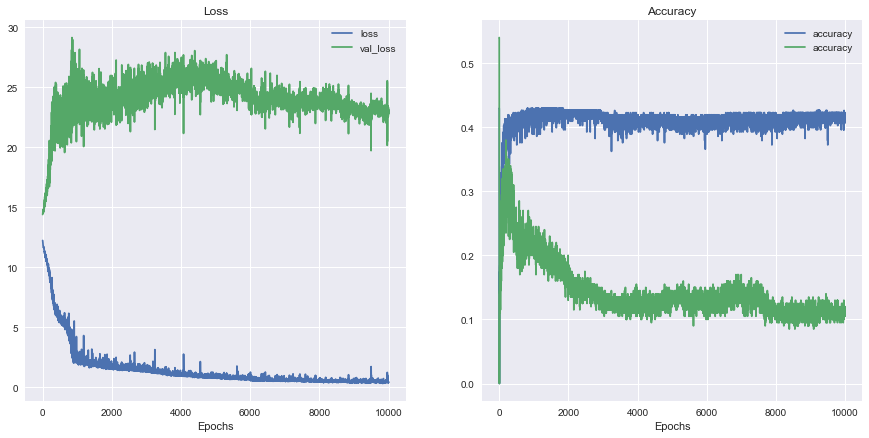

In [44]:
plot(history4)

# Condition prediction based on area

In [45]:
features = df.values[:,4:12]
labels =  df.values[:,13]
X_train, X_valid, y_train, y_valid = train_test_split(features, labels, test_size=0.4, random_state=20)

In [46]:
X_train = np.asarray(X_train).astype(np.float32)
y_train = np.asarray(y_train).astype(np.float32)

X_valid = np.asarray(X_valid).astype(np.float32)
y_valid = np.asarray(y_valid).astype(np.float32)

## Define model

In [47]:
def model_exp(X_train, y_train, X_test, y_test, batch_size=32, optimizer=Adam, lr=0.001, epochs=100, initializer="he_normal", loss="binary_crossentropy", hidden_activation="relu",):
    # define model
    model = tf.keras.Sequential(
        [
            layers.Dense(32,input_dim=X_train.shape[1],activation=hidden_activation,kernel_initializer=initializer,),
            layers.Dense(64, activation=hidden_activation, kernel_initializer=initializer),
            layers.Dense(1, activation="sigmoid"),
        ]
    )

    # compiling model
    model.compile(loss=loss, optimizer=optimizer(learning_rate=lr), metrics=["accuracy"])

    # fitting model
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs, verbose=0, batch_size=batch_size)

    # plotting
    plt.plot(history.history["accuracy"], label="train")
    plt.plot(history.history["val_accuracy"], label="test")
    plt.title(
        f"lr={lr}, batch={batch_size}, epochs={epochs}, init={initializer}, opt={optimizer.__name__}, loss={loss}, hidden_activation={hidden_activation}",
        fontsize=12,
    )
    plt.legend()

### Batch size exp

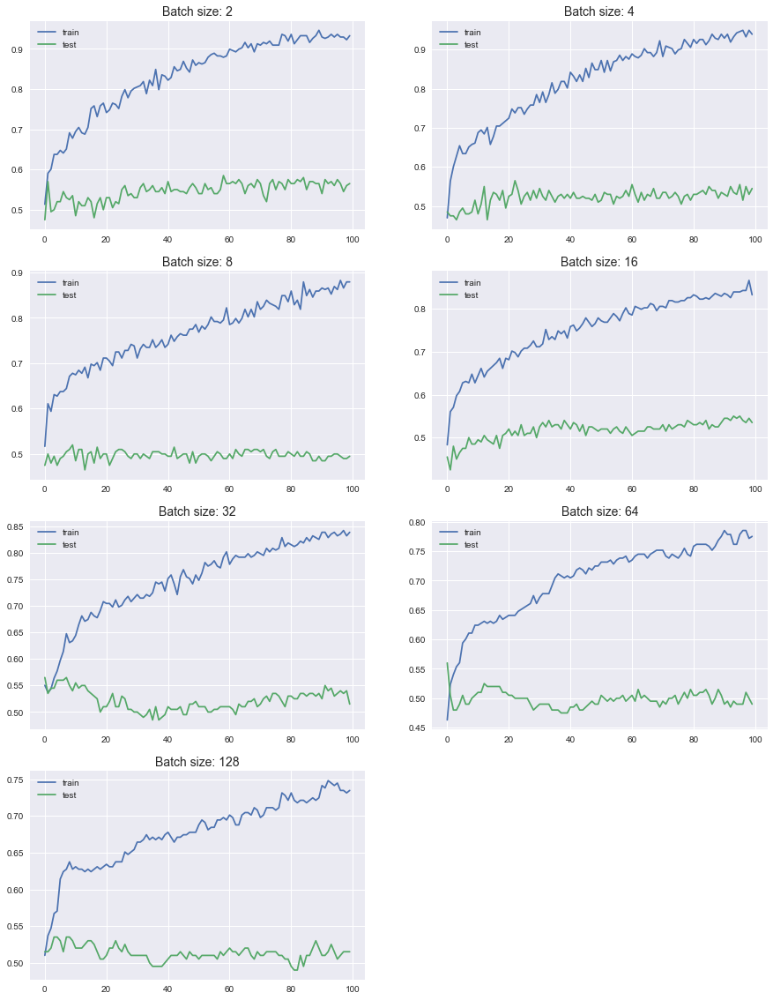

In [48]:
batch_sizes = [2, 4, 8, 16, 32, 64, 128]

plt.figure(figsize=(15, 20))
for i, batch_size in enumerate(batch_sizes):
    plot_no = 420 + (i + 1)
    plt.subplot(plot_no)
    
    model_exp(X_train, y_train, X_valid, y_valid, batch_size=batch_size)
    plt.title(f"Batch size: {batch_size}", fontsize=14)
plt.show()

The best one is batch size 32

### Optimizer exp

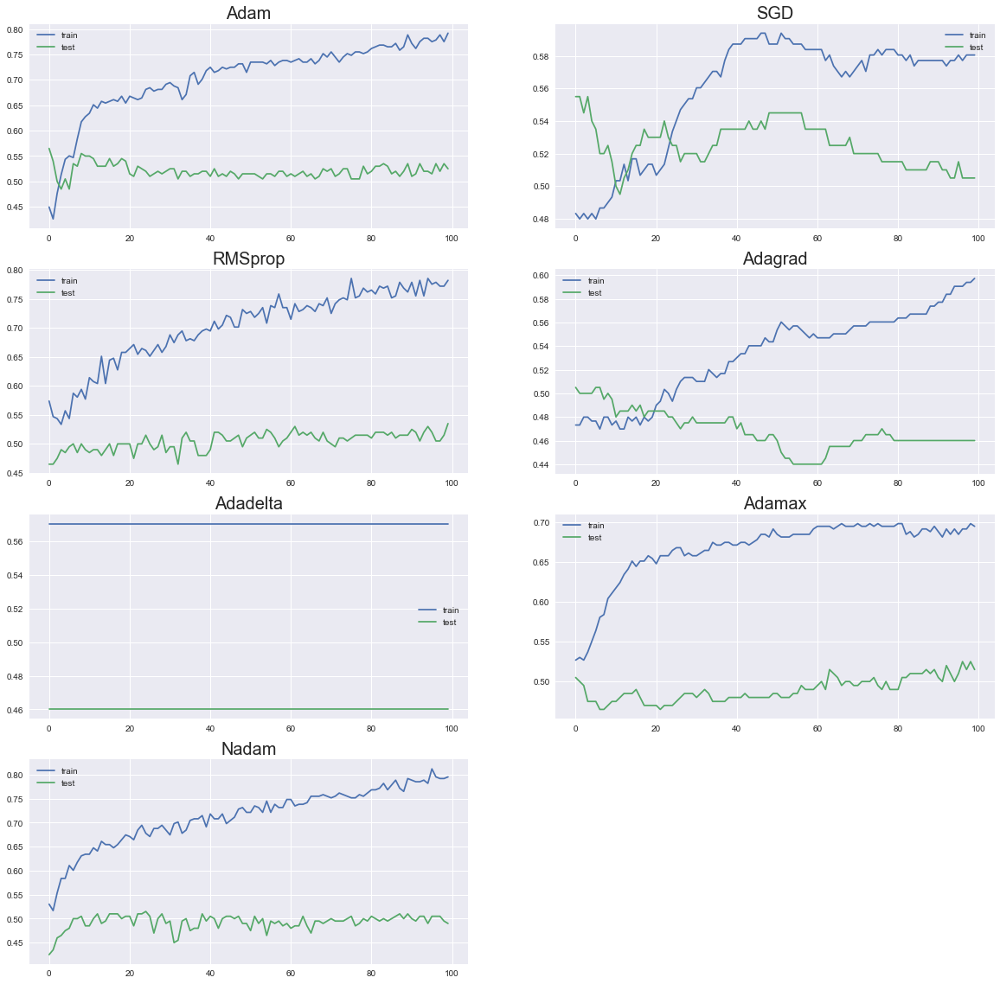

In [49]:
opts = [Adam, SGD, RMSprop, Adagrad, Adadelta, Adamax, Nadam]

plt.figure(figsize=(20, 20))
for i, opt in enumerate(opts):
    plot_no = 420 + (i + 1)
    plt.subplot(plot_no)
    
    model_exp(X_train, y_train, X_valid, y_valid, batch_size=32, optimizer=opt)
    plt.title(opt.__name__, fontsize=20)
plt.show()

we can pick either Adam, RMSprop, and Nadam

## Epoch exp

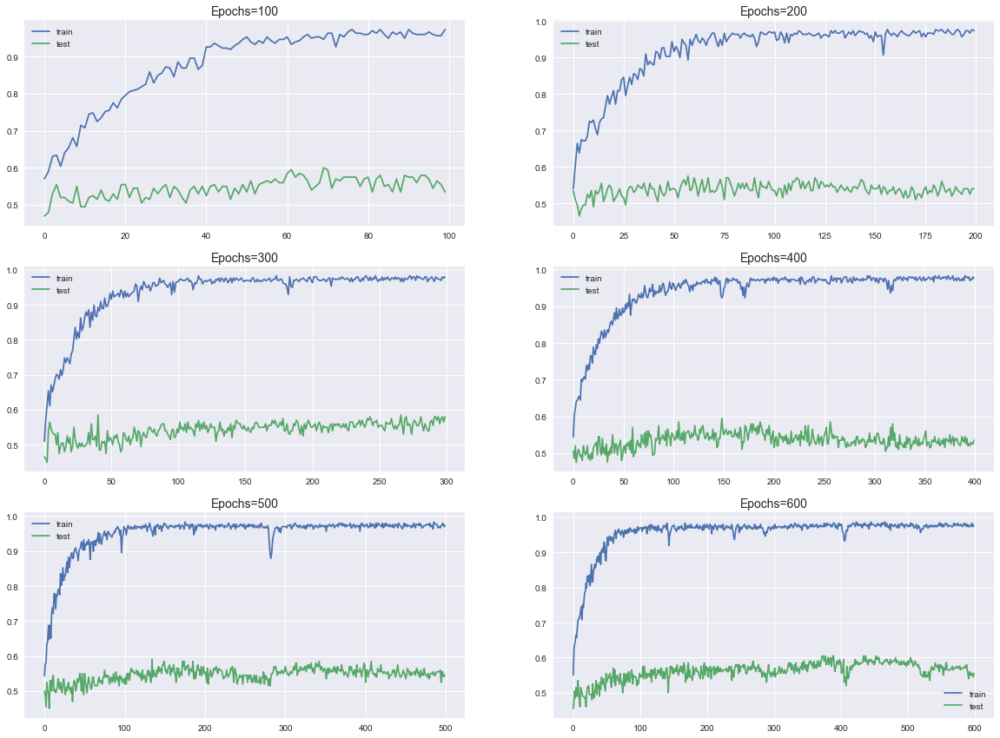

In [50]:
epochs = [100, 200, 300, 400, 500, 600]

plt.figure(figsize=(20, 20))
for i, epoch in enumerate(epochs):
    plot_no = 420 + (i + 1)
    plt.subplot(plot_no)

    model_exp(X_train, y_train, X_valid, y_valid, batch_size=32, optimizer=Nadam, lr=0.01, epochs=epoch)
    plt.title(f"Epochs={epoch}", fontsize=14)
plt.show()

# Conclution

### Regression area purposed

In [51]:
model = tf.keras.Sequential(
    [
        layers.Dense(256, input_dim=X_train.shape[1], activation='relu', kernel_initializer='normal'),
        layers.Dense(128, activation='relu', kernel_initializer='normal'),
        layers.Dense(64, kernel_initializer='normal', activation='relu'),
        layers.Dense(32, kernel_initializer='normal', activation='relu'),
        layers.Dense(1, kernel_initializer='normal', activation='linear'),
    ]
)

# compile model
model.compile(loss='mean_absolute_error', optimizer='adam', metrics=['accuracy'])

es = EarlyStopping(monitor="val_loss", mode="min", verbose=1, patience=150)
mc = ModelCheckpoint('checkpoints/best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

# fit model
history_final = model.fit(X_train, y_train, epochs=10000, validation_data=(X_valid, y_valid))

Epoch 1/10000
10/10 [==============================] - 1s 17ms/step - loss: 0.5691 - accuracy: 0.4295 - val_loss: 0.4625 - val_accuracy: 0.5400
Epoch 2/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5627 - accuracy: 0.4295 - val_loss: 0.4659 - val_accuracy: 0.5400
Epoch 3/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5452 - accuracy: 0.4295 - val_loss: 0.4747 - val_accuracy: 0.5450
Epoch 4/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.5001 - accuracy: 0.4664 - val_loss: 0.5074 - val_accuracy: 0.5000
Epoch 5/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4643 - accuracy: 0.5805 - val_loss: 0.4838 - val_accuracy: 0.5150
Epoch 6/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4525 - accuracy: 0.6107 - val_loss: 0.5094 - val_accuracy: 0.4950
Epoch 7/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.4440 - accuracy: 0.6040 - val_loss: 0.4878 - val_accuracy: 0.525

Epoch 58/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.2082 - accuracy: 0.8523 - val_loss: 0.5125 - val_accuracy: 0.5200
Epoch 59/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1886 - accuracy: 0.8624 - val_loss: 0.5180 - val_accuracy: 0.5200
Epoch 60/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1841 - accuracy: 0.8658 - val_loss: 0.4890 - val_accuracy: 0.5300
Epoch 61/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1722 - accuracy: 0.8658 - val_loss: 0.5088 - val_accuracy: 0.5150
Epoch 62/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1797 - accuracy: 0.8658 - val_loss: 0.5135 - val_accuracy: 0.5000
Epoch 63/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1809 - accuracy: 0.8624 - val_loss: 0.4884 - val_accuracy: 0.5250
Epoch 64/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1766 - accuracy: 0.8591 - val_loss: 0.5154 - val_accuracy:

Epoch 115/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1132 - accuracy: 0.9027 - val_loss: 0.4906 - val_accuracy: 0.5050
Epoch 116/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1167 - accuracy: 0.8993 - val_loss: 0.4863 - val_accuracy: 0.5250
Epoch 117/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1160 - accuracy: 0.9027 - val_loss: 0.4923 - val_accuracy: 0.5250
Epoch 118/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1065 - accuracy: 0.9027 - val_loss: 0.4925 - val_accuracy: 0.5350
Epoch 119/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1079 - accuracy: 0.9060 - val_loss: 0.4831 - val_accuracy: 0.5150
Epoch 120/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1143 - accuracy: 0.9027 - val_loss: 0.4960 - val_accuracy: 0.5100
Epoch 121/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1147 - accuracy: 0.9060 - val_loss: 0.5021 - val_ac

10/10 [==============================] - 0s 6ms/step - loss: 0.1019 - accuracy: 0.9128 - val_loss: 0.4941 - val_accuracy: 0.4850
Epoch 172/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1100 - accuracy: 0.9128 - val_loss: 0.4976 - val_accuracy: 0.5000
Epoch 173/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1755 - accuracy: 0.8523 - val_loss: 0.5018 - val_accuracy: 0.4950
Epoch 174/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1431 - accuracy: 0.8725 - val_loss: 0.4972 - val_accuracy: 0.5100
Epoch 175/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1240 - accuracy: 0.9060 - val_loss: 0.4920 - val_accuracy: 0.5400
Epoch 176/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1405 - accuracy: 0.8826 - val_loss: 0.4949 - val_accuracy: 0.5000
Epoch 177/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.1173 - accuracy: 0.9060 - val_loss: 0.4946 - val_accuracy: 0.4950
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0856 - accuracy: 0.9396 - val_loss: 0.4835 - val_accuracy: 0.5450
Epoch 228/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0952 - accuracy: 0.9329 - val_loss: 0.5035 - val_accuracy: 0.5100
Epoch 229/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0800 - accuracy: 0.9430 - val_loss: 0.4843 - val_accuracy: 0.5200
Epoch 230/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0723 - accuracy: 0.9430 - val_loss: 0.4787 - val_accuracy: 0.5150
Epoch 231/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0736 - accuracy: 0.9396 - val_loss: 0.4819 - val_accuracy: 0.5300
Epoch 232/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0671 - accuracy: 0.9497 - val_loss: 0.4914 - val_accuracy: 0.5000
Epoch 233/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0846 - accuracy: 0.9362 - val_loss: 0.4801 - val_accuracy: 0.5100
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0555 - accuracy: 0.9497 - val_loss: 0.4840 - val_accuracy: 0.5300
Epoch 284/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0556 - accuracy: 0.9497 - val_loss: 0.4851 - val_accuracy: 0.5250
Epoch 285/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0560 - accuracy: 0.9497 - val_loss: 0.4826 - val_accuracy: 0.5250
Epoch 286/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0657 - accuracy: 0.9396 - val_loss: 0.4741 - val_accuracy: 0.5400
Epoch 287/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0594 - accuracy: 0.9497 - val_loss: 0.4797 - val_accuracy: 0.5250
Epoch 288/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0607 - accuracy: 0.9463 - val_loss: 0.4779 - val_accuracy: 0.5150
Epoch 289/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0597 - accuracy: 0.9497 - val_loss: 0.4861 - val_accuracy: 0.5150
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0550 - accuracy: 0.9497 - val_loss: 0.4924 - val_accuracy: 0.4950
Epoch 340/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0528 - accuracy: 0.9497 - val_loss: 0.4897 - val_accuracy: 0.5100
Epoch 341/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0540 - accuracy: 0.9497 - val_loss: 0.4966 - val_accuracy: 0.5050
Epoch 342/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0554 - accuracy: 0.9497 - val_loss: 0.4901 - val_accuracy: 0.5100
Epoch 343/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0546 - accuracy: 0.9497 - val_loss: 0.4958 - val_accuracy: 0.5050
Epoch 344/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0549 - accuracy: 0.9497 - val_loss: 0.4883 - val_accuracy: 0.5050
Epoch 345/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0711 - accuracy: 0.9329 - val_loss: 0.4915 - val_accuracy: 0.5200
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0715 - accuracy: 0.9362 - val_loss: 0.4800 - val_accuracy: 0.5200
Epoch 396/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0649 - accuracy: 0.9430 - val_loss: 0.4787 - val_accuracy: 0.5050
Epoch 397/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0604 - accuracy: 0.9430 - val_loss: 0.4809 - val_accuracy: 0.5100
Epoch 398/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0562 - accuracy: 0.9497 - val_loss: 0.4757 - val_accuracy: 0.5050
Epoch 399/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0592 - accuracy: 0.9430 - val_loss: 0.4642 - val_accuracy: 0.5400
Epoch 400/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0562 - accuracy: 0.9530 - val_loss: 0.4574 - val_accuracy: 0.5450
Epoch 401/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0532 - accuracy: 0.9530 - val_loss: 0.4590 - val_accuracy: 0.5400
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0384 - accuracy: 0.9664 - val_loss: 0.4782 - val_accuracy: 0.5200
Epoch 452/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.9664 - val_loss: 0.4776 - val_accuracy: 0.5200
Epoch 453/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.9664 - val_loss: 0.4789 - val_accuracy: 0.5200
Epoch 454/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.9664 - val_loss: 0.4774 - val_accuracy: 0.5200
Epoch 455/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.9664 - val_loss: 0.4795 - val_accuracy: 0.5250
Epoch 456/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.9664 - val_loss: 0.4775 - val_accuracy: 0.5250
Epoch 457/10000
10/10 [==============================] - 0s 8ms/step - loss: 0.0393 - accuracy: 0.9664 - val_loss: 0.4736 - val_accuracy: 0.5200
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.9664 - val_loss: 0.4881 - val_accuracy: 0.5050
Epoch 508/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.9664 - val_loss: 0.4867 - val_accuracy: 0.5100
Epoch 509/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.9664 - val_loss: 0.4857 - val_accuracy: 0.5100
Epoch 510/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.9664 - val_loss: 0.4847 - val_accuracy: 0.5100
Epoch 511/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.9664 - val_loss: 0.4860 - val_accuracy: 0.5100
Epoch 512/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.9664 - val_loss: 0.4890 - val_accuracy: 0.5150
Epoch 513/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0367 - accuracy: 0.9664 - val_loss: 0.4903 - val_accuracy: 0.5150
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0366 - accuracy: 0.9664 - val_loss: 0.4860 - val_accuracy: 0.5150
Epoch 564/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0392 - accuracy: 0.9631 - val_loss: 0.4844 - val_accuracy: 0.5150
Epoch 565/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.9664 - val_loss: 0.4840 - val_accuracy: 0.5200
Epoch 566/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.9631 - val_loss: 0.4910 - val_accuracy: 0.5050
Epoch 567/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.9664 - val_loss: 0.5037 - val_accuracy: 0.5000
Epoch 568/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0462 - accuracy: 0.9597 - val_loss: 0.4923 - val_accuracy: 0.5000
Epoch 569/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0587 - accuracy: 0.9463 - val_loss: 0.5227 - val_accuracy: 0.4700
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0441 - accuracy: 0.9597 - val_loss: 0.4560 - val_accuracy: 0.5550
Epoch 620/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0503 - accuracy: 0.9530 - val_loss: 0.4560 - val_accuracy: 0.5600
Epoch 621/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0443 - accuracy: 0.9597 - val_loss: 0.4507 - val_accuracy: 0.5650
Epoch 622/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 0.9597 - val_loss: 0.4627 - val_accuracy: 0.5300
Epoch 623/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0452 - accuracy: 0.9597 - val_loss: 0.4566 - val_accuracy: 0.5550
Epoch 624/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0452 - accuracy: 0.9564 - val_loss: 0.4639 - val_accuracy: 0.5450
Epoch 625/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0434 - accuracy: 0.9631 - val_loss: 0.4653 - val_accuracy: 0.5400
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0386 - accuracy: 0.9631 - val_loss: 0.4524 - val_accuracy: 0.5500
Epoch 676/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0398 - accuracy: 0.9631 - val_loss: 0.4524 - val_accuracy: 0.5550
Epoch 677/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.9631 - val_loss: 0.4533 - val_accuracy: 0.5550
Epoch 678/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0385 - accuracy: 0.9631 - val_loss: 0.4527 - val_accuracy: 0.5500
Epoch 679/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0377 - accuracy: 0.9631 - val_loss: 0.4529 - val_accuracy: 0.5550
Epoch 680/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0390 - accuracy: 0.9631 - val_loss: 0.4550 - val_accuracy: 0.5500
Epoch 681/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.9631 - val_loss: 0.4535 - val_accuracy: 0.5500
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0387 - accuracy: 0.9631 - val_loss: 0.4616 - val_accuracy: 0.5450
Epoch 732/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0440 - accuracy: 0.9597 - val_loss: 0.4690 - val_accuracy: 0.5250
Epoch 733/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0457 - accuracy: 0.9564 - val_loss: 0.4712 - val_accuracy: 0.5300
Epoch 734/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0493 - accuracy: 0.9530 - val_loss: 0.4727 - val_accuracy: 0.5200
Epoch 735/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0653 - accuracy: 0.9396 - val_loss: 0.4563 - val_accuracy: 0.5450
Epoch 736/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0617 - accuracy: 0.9430 - val_loss: 0.4485 - val_accuracy: 0.5650
Epoch 737/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0644 - accuracy: 0.9362 - val_loss: 0.4826 - val_accuracy: 0.5200
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0681 - accuracy: 0.9430 - val_loss: 0.4556 - val_accuracy: 0.5350
Epoch 788/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0645 - accuracy: 0.9430 - val_loss: 0.4764 - val_accuracy: 0.5250
Epoch 789/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0555 - accuracy: 0.9530 - val_loss: 0.4662 - val_accuracy: 0.5400
Epoch 790/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0545 - accuracy: 0.9530 - val_loss: 0.4711 - val_accuracy: 0.5300
Epoch 791/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0524 - accuracy: 0.9530 - val_loss: 0.4721 - val_accuracy: 0.5300
Epoch 792/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0544 - accuracy: 0.9497 - val_loss: 0.4729 - val_accuracy: 0.5300
Epoch 793/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0529 - accuracy: 0.9530 - val_loss: 0.4739 - val_accuracy: 0.5300
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0335 - accuracy: 0.9698 - val_loss: 0.4602 - val_accuracy: 0.5400
Epoch 844/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0332 - accuracy: 0.9698 - val_loss: 0.4605 - val_accuracy: 0.5500
Epoch 845/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0331 - accuracy: 0.9698 - val_loss: 0.4588 - val_accuracy: 0.5500
Epoch 846/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.9698 - val_loss: 0.4591 - val_accuracy: 0.5500
Epoch 847/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0333 - accuracy: 0.9698 - val_loss: 0.4604 - val_accuracy: 0.5500
Epoch 848/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0329 - accuracy: 0.9698 - val_loss: 0.4593 - val_accuracy: 0.5500
Epoch 849/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0327 - accuracy: 0.9698 - val_loss: 0.4595 - val_accuracy: 0.5500
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0341 - accuracy: 0.9698 - val_loss: 0.4573 - val_accuracy: 0.5550
Epoch 900/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.9664 - val_loss: 0.4538 - val_accuracy: 0.5500
Epoch 901/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.9698 - val_loss: 0.4583 - val_accuracy: 0.5400
Epoch 902/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.9664 - val_loss: 0.4544 - val_accuracy: 0.5500
Epoch 903/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0441 - accuracy: 0.9597 - val_loss: 0.4540 - val_accuracy: 0.5500
Epoch 904/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.9664 - val_loss: 0.4541 - val_accuracy: 0.5450
Epoch 905/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0361 - accuracy: 0.9664 - val_loss: 0.4527 - val_accuracy: 0.5550
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0465 - accuracy: 0.9564 - val_loss: 0.4593 - val_accuracy: 0.5450
Epoch 956/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0458 - accuracy: 0.9564 - val_loss: 0.4578 - val_accuracy: 0.5450
Epoch 957/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0468 - accuracy: 0.9564 - val_loss: 0.4591 - val_accuracy: 0.5450
Epoch 958/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0463 - accuracy: 0.9564 - val_loss: 0.4586 - val_accuracy: 0.5450
Epoch 959/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0473 - accuracy: 0.9564 - val_loss: 0.4576 - val_accuracy: 0.5500
Epoch 960/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0474 - accuracy: 0.9564 - val_loss: 0.4589 - val_accuracy: 0.5450
Epoch 961/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0459 - accuracy: 0.9564 - val_loss: 0.4585 - val_accuracy: 0.5400
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.9631 - val_loss: 0.4685 - val_accuracy: 0.5200
Epoch 1012/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.9631 - val_loss: 0.4688 - val_accuracy: 0.5200
Epoch 1013/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.9631 - val_loss: 0.4688 - val_accuracy: 0.5250
Epoch 1014/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.9631 - val_loss: 0.4692 - val_accuracy: 0.5300
Epoch 1015/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0390 - accuracy: 0.9631 - val_loss: 0.4693 - val_accuracy: 0.5250
Epoch 1016/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.9631 - val_loss: 0.4714 - val_accuracy: 0.5300
Epoch 1017/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0390 - accuracy: 0.9631 - val_loss: 0.4716 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.9631 - val_loss: 0.4631 - val_accuracy: 0.5450
Epoch 1068/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.9631 - val_loss: 0.4648 - val_accuracy: 0.5400
Epoch 1069/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.9631 - val_loss: 0.4638 - val_accuracy: 0.5400
Epoch 1070/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0400 - accuracy: 0.9631 - val_loss: 0.4621 - val_accuracy: 0.5450
Epoch 1071/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.9631 - val_loss: 0.4611 - val_accuracy: 0.5400
Epoch 1072/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.9631 - val_loss: 0.4658 - val_accuracy: 0.5450
Epoch 1073/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.9631 - val_loss: 0.4604 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.9631 - val_loss: 0.4652 - val_accuracy: 0.5500
Epoch 1124/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.9631 - val_loss: 0.4643 - val_accuracy: 0.5450
Epoch 1125/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.9631 - val_loss: 0.4686 - val_accuracy: 0.5400
Epoch 1126/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.9631 - val_loss: 0.4654 - val_accuracy: 0.5450
Epoch 1127/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.9631 - val_loss: 0.4661 - val_accuracy: 0.5400
Epoch 1128/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0409 - accuracy: 0.9631 - val_loss: 0.4671 - val_accuracy: 0.5350
Epoch 1129/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.9631 - val_loss: 0.4654 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0378 - accuracy: 0.9664 - val_loss: 0.4642 - val_accuracy: 0.5300
Epoch 1180/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.9631 - val_loss: 0.4656 - val_accuracy: 0.5250
Epoch 1181/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0394 - accuracy: 0.9664 - val_loss: 0.4668 - val_accuracy: 0.5300
Epoch 1182/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0403 - accuracy: 0.9631 - val_loss: 0.4648 - val_accuracy: 0.5350
Epoch 1183/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.9631 - val_loss: 0.4645 - val_accuracy: 0.5350
Epoch 1184/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.9631 - val_loss: 0.4637 - val_accuracy: 0.5350
Epoch 1185/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.9664 - val_loss: 0.4647 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0325 - accuracy: 0.9732 - val_loss: 0.4633 - val_accuracy: 0.5400
Epoch 1236/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0330 - accuracy: 0.9732 - val_loss: 0.4640 - val_accuracy: 0.5350
Epoch 1237/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0337 - accuracy: 0.9732 - val_loss: 0.4731 - val_accuracy: 0.5250
Epoch 1238/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.9664 - val_loss: 0.4678 - val_accuracy: 0.5350
Epoch 1239/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0348 - accuracy: 0.9732 - val_loss: 0.4695 - val_accuracy: 0.5450
Epoch 1240/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0333 - accuracy: 0.9732 - val_loss: 0.4525 - val_accuracy: 0.5550
Epoch 1241/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0500 - accuracy: 0.9564 - val_loss: 0.4529 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0269 - accuracy: 0.9765 - val_loss: 0.4527 - val_accuracy: 0.5550
Epoch 1292/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4542 - val_accuracy: 0.5550
Epoch 1293/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0269 - accuracy: 0.9765 - val_loss: 0.4558 - val_accuracy: 0.5550
Epoch 1294/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0291 - accuracy: 0.9765 - val_loss: 0.4582 - val_accuracy: 0.5500
Epoch 1295/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0293 - accuracy: 0.9765 - val_loss: 0.4544 - val_accuracy: 0.5450
Epoch 1296/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0294 - accuracy: 0.9765 - val_loss: 0.4525 - val_accuracy: 0.5450
Epoch 1297/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0290 - accuracy: 0.9765 - val_loss: 0.4552 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0338 - accuracy: 0.9698 - val_loss: 0.4533 - val_accuracy: 0.5500
Epoch 1348/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.9698 - val_loss: 0.4579 - val_accuracy: 0.5500
Epoch 1349/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0511 - accuracy: 0.9564 - val_loss: 0.4819 - val_accuracy: 0.5200
Epoch 1350/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0543 - accuracy: 0.9564 - val_loss: 0.4597 - val_accuracy: 0.5450
Epoch 1351/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0685 - accuracy: 0.9362 - val_loss: 0.4789 - val_accuracy: 0.5150
Epoch 1352/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0688 - accuracy: 0.9396 - val_loss: 0.4662 - val_accuracy: 0.5400
Epoch 1353/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0477 - accuracy: 0.9631 - val_loss: 0.4588 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0433 - accuracy: 0.9631 - val_loss: 0.4540 - val_accuracy: 0.5600
Epoch 1404/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0407 - accuracy: 0.9631 - val_loss: 0.4520 - val_accuracy: 0.5600
Epoch 1405/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.9664 - val_loss: 0.4509 - val_accuracy: 0.5500
Epoch 1406/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.9664 - val_loss: 0.4503 - val_accuracy: 0.5550
Epoch 1407/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.9664 - val_loss: 0.4518 - val_accuracy: 0.5500
Epoch 1408/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.9664 - val_loss: 0.4576 - val_accuracy: 0.5550
Epoch 1409/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.9664 - val_loss: 0.4573 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4583 - val_accuracy: 0.5500
Epoch 1460/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4561 - val_accuracy: 0.5450
Epoch 1461/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.4564 - val_accuracy: 0.5550
Epoch 1462/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0276 - accuracy: 0.9765 - val_loss: 0.4578 - val_accuracy: 0.5500
Epoch 1463/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0296 - accuracy: 0.9765 - val_loss: 0.4625 - val_accuracy: 0.5550
Epoch 1464/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0279 - accuracy: 0.9765 - val_loss: 0.4592 - val_accuracy: 0.5500
Epoch 1465/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0267 - accuracy: 0.9765 - val_loss: 0.4586 - val_accuracy: 0.

10/10 [==============================] - 0s 9ms/step - loss: 0.0266 - accuracy: 0.9765 - val_loss: 0.4558 - val_accuracy: 0.5450
Epoch 1516/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4546 - val_accuracy: 0.5500
Epoch 1517/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0268 - accuracy: 0.9765 - val_loss: 0.4543 - val_accuracy: 0.5550
Epoch 1518/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0265 - accuracy: 0.9765 - val_loss: 0.4579 - val_accuracy: 0.5450
Epoch 1519/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0273 - accuracy: 0.9799 - val_loss: 0.4523 - val_accuracy: 0.5500
Epoch 1520/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0285 - accuracy: 0.9799 - val_loss: 0.4471 - val_accuracy: 0.5500
Epoch 1521/10000
10/10 [==============================] - 0s 8ms/step - loss: 0.0277 - accuracy: 0.9799 - val_loss: 0.4485 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0287 - accuracy: 0.9765 - val_loss: 0.4534 - val_accuracy: 0.5550
Epoch 1572/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0294 - accuracy: 0.9765 - val_loss: 0.4559 - val_accuracy: 0.5500
Epoch 1573/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0275 - accuracy: 0.9765 - val_loss: 0.4549 - val_accuracy: 0.5500
Epoch 1574/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0298 - accuracy: 0.9732 - val_loss: 0.4585 - val_accuracy: 0.5550
Epoch 1575/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 0.9732 - val_loss: 0.4576 - val_accuracy: 0.5500
Epoch 1576/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0273 - accuracy: 0.9765 - val_loss: 0.4591 - val_accuracy: 0.5550
Epoch 1577/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0269 - accuracy: 0.9765 - val_loss: 0.4521 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.9664 - val_loss: 0.4645 - val_accuracy: 0.5350
Epoch 1628/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0313 - accuracy: 0.9765 - val_loss: 0.4498 - val_accuracy: 0.5550
Epoch 1629/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0378 - accuracy: 0.9698 - val_loss: 0.4592 - val_accuracy: 0.5500
Epoch 1630/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0315 - accuracy: 0.9765 - val_loss: 0.4587 - val_accuracy: 0.5400
Epoch 1631/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0602 - accuracy: 0.9463 - val_loss: 0.4563 - val_accuracy: 0.5600
Epoch 1632/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0491 - accuracy: 0.9564 - val_loss: 0.4415 - val_accuracy: 0.5750
Epoch 1633/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0456 - accuracy: 0.9597 - val_loss: 0.4634 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0329 - accuracy: 0.9698 - val_loss: 0.4591 - val_accuracy: 0.5400
Epoch 1684/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0338 - accuracy: 0.9698 - val_loss: 0.4606 - val_accuracy: 0.5350
Epoch 1685/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.9732 - val_loss: 0.4621 - val_accuracy: 0.5350
Epoch 1686/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.9698 - val_loss: 0.4621 - val_accuracy: 0.5450
Epoch 1687/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.9732 - val_loss: 0.4592 - val_accuracy: 0.5400
Epoch 1688/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0334 - accuracy: 0.9732 - val_loss: 0.4607 - val_accuracy: 0.5350
Epoch 1689/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0336 - accuracy: 0.9732 - val_loss: 0.4617 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0322 - accuracy: 0.9698 - val_loss: 0.4715 - val_accuracy: 0.5150
Epoch 1740/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0323 - accuracy: 0.9698 - val_loss: 0.4699 - val_accuracy: 0.5350
Epoch 1741/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0313 - accuracy: 0.9698 - val_loss: 0.4725 - val_accuracy: 0.5200
Epoch 1742/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0327 - accuracy: 0.9698 - val_loss: 0.4743 - val_accuracy: 0.5250
Epoch 1743/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0327 - accuracy: 0.9698 - val_loss: 0.4701 - val_accuracy: 0.5300
Epoch 1744/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0326 - accuracy: 0.9698 - val_loss: 0.4694 - val_accuracy: 0.5250
Epoch 1745/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0332 - accuracy: 0.9732 - val_loss: 0.4688 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0287 - accuracy: 0.9765 - val_loss: 0.4693 - val_accuracy: 0.5400
Epoch 1796/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0304 - accuracy: 0.9765 - val_loss: 0.4679 - val_accuracy: 0.5350
Epoch 1797/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0308 - accuracy: 0.9765 - val_loss: 0.4685 - val_accuracy: 0.5350
Epoch 1798/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0304 - accuracy: 0.9765 - val_loss: 0.4655 - val_accuracy: 0.5400
Epoch 1799/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0279 - accuracy: 0.9765 - val_loss: 0.4673 - val_accuracy: 0.5250
Epoch 1800/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0284 - accuracy: 0.9765 - val_loss: 0.4687 - val_accuracy: 0.5300
Epoch 1801/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0278 - accuracy: 0.9765 - val_loss: 0.4702 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4578 - val_accuracy: 0.5500
Epoch 1852/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4572 - val_accuracy: 0.5450
Epoch 1853/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0238 - accuracy: 0.9799 - val_loss: 0.4578 - val_accuracy: 0.5500
Epoch 1854/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4599 - val_accuracy: 0.5450
Epoch 1855/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4600 - val_accuracy: 0.5400
Epoch 1856/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4582 - val_accuracy: 0.5500
Epoch 1857/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0231 - accuracy: 0.9799 - val_loss: 0.4576 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0359 - accuracy: 0.9698 - val_loss: 0.4747 - val_accuracy: 0.5300
Epoch 1908/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0401 - accuracy: 0.9631 - val_loss: 0.4647 - val_accuracy: 0.5550
Epoch 1909/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0343 - accuracy: 0.9698 - val_loss: 0.4553 - val_accuracy: 0.5600
Epoch 1910/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.9698 - val_loss: 0.4569 - val_accuracy: 0.5550
Epoch 1911/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0343 - accuracy: 0.9698 - val_loss: 0.4611 - val_accuracy: 0.5450
Epoch 1912/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0342 - accuracy: 0.9698 - val_loss: 0.4529 - val_accuracy: 0.5600
Epoch 1913/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0349 - accuracy: 0.9698 - val_loss: 0.4535 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0361 - accuracy: 0.9664 - val_loss: 0.4654 - val_accuracy: 0.5350
Epoch 1964/10000
10/10 [==============================] - 0s 8ms/step - loss: 0.0347 - accuracy: 0.9698 - val_loss: 0.4617 - val_accuracy: 0.5400
Epoch 1965/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0352 - accuracy: 0.9698 - val_loss: 0.4617 - val_accuracy: 0.5350
Epoch 1966/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0342 - accuracy: 0.9698 - val_loss: 0.4629 - val_accuracy: 0.5300
Epoch 1967/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0335 - accuracy: 0.9698 - val_loss: 0.4588 - val_accuracy: 0.5350
Epoch 1968/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0333 - accuracy: 0.9698 - val_loss: 0.4561 - val_accuracy: 0.5400
Epoch 1969/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0328 - accuracy: 0.9698 - val_loss: 0.4568 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0266 - accuracy: 0.9765 - val_loss: 0.4546 - val_accuracy: 0.5400
Epoch 2020/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.0428 - accuracy: 0.9631 - val_loss: 0.4582 - val_accuracy: 0.5350
Epoch 2021/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0355 - accuracy: 0.9698 - val_loss: 0.4769 - val_accuracy: 0.5200
Epoch 2022/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0380 - accuracy: 0.9698 - val_loss: 0.4737 - val_accuracy: 0.5250
Epoch 2023/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0338 - accuracy: 0.9732 - val_loss: 0.4653 - val_accuracy: 0.5450
Epoch 2024/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0337 - accuracy: 0.9698 - val_loss: 0.4701 - val_accuracy: 0.5300
Epoch 2025/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0269 - accuracy: 0.9765 - val_loss: 0.4741 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0275 - accuracy: 0.9765 - val_loss: 0.4662 - val_accuracy: 0.5250
Epoch 2076/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0274 - accuracy: 0.9765 - val_loss: 0.4682 - val_accuracy: 0.5250
Epoch 2077/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0267 - accuracy: 0.9765 - val_loss: 0.4689 - val_accuracy: 0.5250
Epoch 2078/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4688 - val_accuracy: 0.5350
Epoch 2079/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0258 - accuracy: 0.9765 - val_loss: 0.4671 - val_accuracy: 0.5300
Epoch 2080/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4672 - val_accuracy: 0.5300
Epoch 2081/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4667 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0212 - accuracy: 0.9832 - val_loss: 0.4824 - val_accuracy: 0.5050
Epoch 2132/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0205 - accuracy: 0.9832 - val_loss: 0.4830 - val_accuracy: 0.5000
Epoch 2133/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0211 - accuracy: 0.9832 - val_loss: 0.4829 - val_accuracy: 0.5050
Epoch 2134/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0216 - accuracy: 0.9832 - val_loss: 0.4808 - val_accuracy: 0.5050
Epoch 2135/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0220 - accuracy: 0.9832 - val_loss: 0.4784 - val_accuracy: 0.5150
Epoch 2136/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4796 - val_accuracy: 0.5100
Epoch 2137/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0214 - accuracy: 0.9832 - val_loss: 0.4815 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4811 - val_accuracy: 0.5050
Epoch 2188/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0200 - accuracy: 0.9832 - val_loss: 0.4794 - val_accuracy: 0.5100
Epoch 2189/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0197 - accuracy: 0.9832 - val_loss: 0.4786 - val_accuracy: 0.5050
Epoch 2190/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0206 - accuracy: 0.9832 - val_loss: 0.4820 - val_accuracy: 0.5000
Epoch 2191/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0213 - accuracy: 0.9832 - val_loss: 0.4806 - val_accuracy: 0.5100
Epoch 2192/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0214 - accuracy: 0.9799 - val_loss: 0.4811 - val_accuracy: 0.5100
Epoch 2193/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0212 - accuracy: 0.9832 - val_loss: 0.4809 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0206 - accuracy: 0.9832 - val_loss: 0.4784 - val_accuracy: 0.5150
Epoch 2244/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0218 - accuracy: 0.9832 - val_loss: 0.4784 - val_accuracy: 0.5150
Epoch 2245/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0201 - accuracy: 0.9832 - val_loss: 0.4775 - val_accuracy: 0.5150
Epoch 2246/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4741 - val_accuracy: 0.5250
Epoch 2247/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4656 - val_accuracy: 0.5300
Epoch 2248/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4771 - val_accuracy: 0.5200
Epoch 2249/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4677 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4677 - val_accuracy: 0.5250
Epoch 2300/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0220 - accuracy: 0.9799 - val_loss: 0.4682 - val_accuracy: 0.5300
Epoch 2301/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4706 - val_accuracy: 0.5300
Epoch 2302/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4669 - val_accuracy: 0.5300
Epoch 2303/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4677 - val_accuracy: 0.5300
Epoch 2304/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 0.9799 - val_loss: 0.4678 - val_accuracy: 0.5300
Epoch 2305/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0230 - accuracy: 0.9799 - val_loss: 0.4694 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4777 - val_accuracy: 0.5250
Epoch 2356/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4773 - val_accuracy: 0.5250
Epoch 2357/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4786 - val_accuracy: 0.5100
Epoch 2358/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 0.9799 - val_loss: 0.4767 - val_accuracy: 0.5250
Epoch 2359/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4772 - val_accuracy: 0.5200
Epoch 2360/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 0.9799 - val_loss: 0.4802 - val_accuracy: 0.5200
Epoch 2361/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 0.9799 - val_loss: 0.4811 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0246 - accuracy: 0.9765 - val_loss: 0.4747 - val_accuracy: 0.5250
Epoch 2412/10000
10/10 [==============================] - 0s 8ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.4753 - val_accuracy: 0.5350
Epoch 2413/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0249 - accuracy: 0.9799 - val_loss: 0.4731 - val_accuracy: 0.5200
Epoch 2414/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0259 - accuracy: 0.9799 - val_loss: 0.4670 - val_accuracy: 0.5300
Epoch 2415/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4691 - val_accuracy: 0.5300
Epoch 2416/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0244 - accuracy: 0.9799 - val_loss: 0.4719 - val_accuracy: 0.5250
Epoch 2417/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9799 - val_loss: 0.4722 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9799 - val_loss: 0.4733 - val_accuracy: 0.5350
Epoch 2468/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0242 - accuracy: 0.9799 - val_loss: 0.4732 - val_accuracy: 0.5300
Epoch 2469/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0248 - accuracy: 0.9799 - val_loss: 0.4755 - val_accuracy: 0.5400
Epoch 2470/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9799 - val_loss: 0.4751 - val_accuracy: 0.5250
Epoch 2471/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9799 - val_loss: 0.4742 - val_accuracy: 0.5250
Epoch 2472/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0241 - accuracy: 0.9799 - val_loss: 0.4731 - val_accuracy: 0.5300
Epoch 2473/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4710 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0240 - accuracy: 0.9799 - val_loss: 0.4758 - val_accuracy: 0.5300
Epoch 2524/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 0.9799 - val_loss: 0.4743 - val_accuracy: 0.5300
Epoch 2525/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0243 - accuracy: 0.9799 - val_loss: 0.4732 - val_accuracy: 0.5300
Epoch 2526/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4753 - val_accuracy: 0.5350
Epoch 2527/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4762 - val_accuracy: 0.5250
Epoch 2528/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4759 - val_accuracy: 0.5250
Epoch 2529/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0245 - accuracy: 0.9799 - val_loss: 0.4767 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4905 - val_accuracy: 0.5000
Epoch 2580/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4846 - val_accuracy: 0.5100
Epoch 2581/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4800 - val_accuracy: 0.5150
Epoch 2582/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4778 - val_accuracy: 0.5200
Epoch 2583/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4770 - val_accuracy: 0.5200
Epoch 2584/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4743 - val_accuracy: 0.5350
Epoch 2585/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0231 - accuracy: 0.9799 - val_loss: 0.4769 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4772 - val_accuracy: 0.5150
Epoch 2636/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4762 - val_accuracy: 0.5200
Epoch 2637/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4760 - val_accuracy: 0.5200
Epoch 2638/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0220 - accuracy: 0.9799 - val_loss: 0.4743 - val_accuracy: 0.5200
Epoch 2639/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4766 - val_accuracy: 0.5200
Epoch 2640/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4756 - val_accuracy: 0.5200
Epoch 2641/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4779 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 0.9799 - val_loss: 0.4789 - val_accuracy: 0.5250
Epoch 2692/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4771 - val_accuracy: 0.5250
Epoch 2693/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4737 - val_accuracy: 0.5300
Epoch 2694/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4735 - val_accuracy: 0.5300
Epoch 2695/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4780 - val_accuracy: 0.5300
Epoch 2696/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.4774 - val_accuracy: 0.5250
Epoch 2697/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4769 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4764 - val_accuracy: 0.5200
Epoch 2748/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4765 - val_accuracy: 0.5200
Epoch 2749/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4775 - val_accuracy: 0.5200
Epoch 2750/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4810 - val_accuracy: 0.5150
Epoch 2751/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4806 - val_accuracy: 0.5200
Epoch 2752/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0236 - accuracy: 0.9799 - val_loss: 0.4799 - val_accuracy: 0.5300
Epoch 2753/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4773 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0236 - accuracy: 0.9799 - val_loss: 0.4774 - val_accuracy: 0.5200
Epoch 2804/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4759 - val_accuracy: 0.5300
Epoch 2805/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4772 - val_accuracy: 0.5250
Epoch 2806/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4793 - val_accuracy: 0.5150
Epoch 2807/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4769 - val_accuracy: 0.5250
Epoch 2808/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0327 - accuracy: 0.9732 - val_loss: 0.4648 - val_accuracy: 0.5250
Epoch 2809/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.9664 - val_loss: 0.4456 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0296 - accuracy: 0.9732 - val_loss: 0.4758 - val_accuracy: 0.5200
Epoch 2860/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0297 - accuracy: 0.9732 - val_loss: 0.4757 - val_accuracy: 0.5100
Epoch 2861/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 0.9732 - val_loss: 0.4744 - val_accuracy: 0.5050
Epoch 2862/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0279 - accuracy: 0.9732 - val_loss: 0.4766 - val_accuracy: 0.5050
Epoch 2863/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0283 - accuracy: 0.9732 - val_loss: 0.4767 - val_accuracy: 0.5150
Epoch 2864/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0281 - accuracy: 0.9732 - val_loss: 0.4789 - val_accuracy: 0.5100
Epoch 2865/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0275 - accuracy: 0.9732 - val_loss: 0.4776 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4635 - val_accuracy: 0.5350
Epoch 2916/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4638 - val_accuracy: 0.5350
Epoch 2917/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4629 - val_accuracy: 0.5300
Epoch 2918/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4634 - val_accuracy: 0.5350
Epoch 2919/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4624 - val_accuracy: 0.5300
Epoch 2920/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0260 - accuracy: 0.9765 - val_loss: 0.4619 - val_accuracy: 0.5300
Epoch 2921/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4623 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0327 - accuracy: 0.9698 - val_loss: 0.4528 - val_accuracy: 0.5400
Epoch 2972/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0323 - accuracy: 0.9698 - val_loss: 0.4526 - val_accuracy: 0.5450
Epoch 2973/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0316 - accuracy: 0.9698 - val_loss: 0.4500 - val_accuracy: 0.5450
Epoch 2974/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0318 - accuracy: 0.9698 - val_loss: 0.4499 - val_accuracy: 0.5350
Epoch 2975/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0319 - accuracy: 0.9698 - val_loss: 0.4499 - val_accuracy: 0.5350
Epoch 2976/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0334 - accuracy: 0.9698 - val_loss: 0.4511 - val_accuracy: 0.5400
Epoch 2977/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0322 - accuracy: 0.9698 - val_loss: 0.4514 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0319 - accuracy: 0.9698 - val_loss: 0.4665 - val_accuracy: 0.5300
Epoch 3028/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0309 - accuracy: 0.9698 - val_loss: 0.4703 - val_accuracy: 0.5250
Epoch 3029/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0312 - accuracy: 0.9698 - val_loss: 0.4697 - val_accuracy: 0.5250
Epoch 3030/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0303 - accuracy: 0.9698 - val_loss: 0.4673 - val_accuracy: 0.5250
Epoch 3031/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0301 - accuracy: 0.9698 - val_loss: 0.4698 - val_accuracy: 0.5250
Epoch 3032/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.0310 - accuracy: 0.9732 - val_loss: 0.4711 - val_accuracy: 0.5250
Epoch 3033/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0312 - accuracy: 0.9732 - val_loss: 0.4707 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4790 - val_accuracy: 0.5150
Epoch 3084/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.4800 - val_accuracy: 0.5250
Epoch 3085/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4794 - val_accuracy: 0.5200
Epoch 3086/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.4820 - val_accuracy: 0.5000
Epoch 3087/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4824 - val_accuracy: 0.5050
Epoch 3088/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4803 - val_accuracy: 0.5100
Epoch 3089/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4805 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4764 - val_accuracy: 0.5250
Epoch 3140/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4808 - val_accuracy: 0.5200
Epoch 3141/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0230 - accuracy: 0.9799 - val_loss: 0.4785 - val_accuracy: 0.5150
Epoch 3142/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4755 - val_accuracy: 0.5250
Epoch 3143/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.4705 - val_accuracy: 0.5350
Epoch 3144/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0270 - accuracy: 0.9732 - val_loss: 0.4816 - val_accuracy: 0.5250
Epoch 3145/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4811 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4818 - val_accuracy: 0.5150
Epoch 3196/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0220 - accuracy: 0.9799 - val_loss: 0.4799 - val_accuracy: 0.5200
Epoch 3197/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4816 - val_accuracy: 0.5150
Epoch 3198/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4829 - val_accuracy: 0.5150
Epoch 3199/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4810 - val_accuracy: 0.5250
Epoch 3200/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4798 - val_accuracy: 0.5150
Epoch 3201/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4795 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4771 - val_accuracy: 0.5200
Epoch 3252/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4832 - val_accuracy: 0.5200
Epoch 3253/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0280 - accuracy: 0.9732 - val_loss: 0.4720 - val_accuracy: 0.5300
Epoch 3254/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4725 - val_accuracy: 0.5250
Epoch 3255/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4759 - val_accuracy: 0.5250
Epoch 3256/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4688 - val_accuracy: 0.5350
Epoch 3257/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4716 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0296 - accuracy: 0.9732 - val_loss: 0.4882 - val_accuracy: 0.5000
Epoch 3308/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0302 - accuracy: 0.9732 - val_loss: 0.4883 - val_accuracy: 0.5050
Epoch 3309/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0299 - accuracy: 0.9732 - val_loss: 0.4862 - val_accuracy: 0.5050
Epoch 3310/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0298 - accuracy: 0.9732 - val_loss: 0.4850 - val_accuracy: 0.5050
Epoch 3311/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0288 - accuracy: 0.9732 - val_loss: 0.4845 - val_accuracy: 0.5050
Epoch 3312/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0288 - accuracy: 0.9732 - val_loss: 0.4852 - val_accuracy: 0.5050
Epoch 3313/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0283 - accuracy: 0.9732 - val_loss: 0.4863 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0281 - accuracy: 0.9732 - val_loss: 0.4730 - val_accuracy: 0.5250
Epoch 3364/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0286 - accuracy: 0.9732 - val_loss: 0.4693 - val_accuracy: 0.5250
Epoch 3365/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0274 - accuracy: 0.9765 - val_loss: 0.4696 - val_accuracy: 0.5250
Epoch 3366/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0277 - accuracy: 0.9732 - val_loss: 0.4709 - val_accuracy: 0.5250
Epoch 3367/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.0288 - accuracy: 0.9732 - val_loss: 0.4647 - val_accuracy: 0.5350
Epoch 3368/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0292 - accuracy: 0.9732 - val_loss: 0.4664 - val_accuracy: 0.5350
Epoch 3369/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0286 - accuracy: 0.9732 - val_loss: 0.4669 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0246 - accuracy: 0.9765 - val_loss: 0.4791 - val_accuracy: 0.5200
Epoch 3420/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4793 - val_accuracy: 0.5150
Epoch 3421/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0247 - accuracy: 0.9765 - val_loss: 0.4793 - val_accuracy: 0.5200
Epoch 3422/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4789 - val_accuracy: 0.5200
Epoch 3423/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4796 - val_accuracy: 0.5200
Epoch 3424/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4793 - val_accuracy: 0.5200
Epoch 3425/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4803 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4731 - val_accuracy: 0.5200
Epoch 3476/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0258 - accuracy: 0.9765 - val_loss: 0.4738 - val_accuracy: 0.5200
Epoch 3477/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4725 - val_accuracy: 0.5250
Epoch 3478/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4736 - val_accuracy: 0.5150
Epoch 3479/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4750 - val_accuracy: 0.5100
Epoch 3480/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0247 - accuracy: 0.9765 - val_loss: 0.4721 - val_accuracy: 0.5150
Epoch 3481/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4726 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0268 - accuracy: 0.9765 - val_loss: 0.4747 - val_accuracy: 0.5200
Epoch 3532/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0244 - accuracy: 0.9765 - val_loss: 0.4827 - val_accuracy: 0.5000
Epoch 3533/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4725 - val_accuracy: 0.5250
Epoch 3534/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4755 - val_accuracy: 0.5200
Epoch 3535/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0247 - accuracy: 0.9765 - val_loss: 0.4754 - val_accuracy: 0.5100
Epoch 3536/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0245 - accuracy: 0.9765 - val_loss: 0.4770 - val_accuracy: 0.5150
Epoch 3537/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4781 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0243 - accuracy: 0.9799 - val_loss: 0.4706 - val_accuracy: 0.5250
Epoch 3588/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4684 - val_accuracy: 0.5250
Epoch 3589/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4672 - val_accuracy: 0.5300
Epoch 3590/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 0.9799 - val_loss: 0.4677 - val_accuracy: 0.5300
Epoch 3591/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4707 - val_accuracy: 0.5250
Epoch 3592/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4715 - val_accuracy: 0.5200
Epoch 3593/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4707 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4873 - val_accuracy: 0.5050
Epoch 3644/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4888 - val_accuracy: 0.5050
Epoch 3645/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4861 - val_accuracy: 0.5100
Epoch 3646/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0231 - accuracy: 0.9799 - val_loss: 0.4877 - val_accuracy: 0.5100
Epoch 3647/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4897 - val_accuracy: 0.5100
Epoch 3648/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4894 - val_accuracy: 0.5100
Epoch 3649/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4886 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4765 - val_accuracy: 0.5200
Epoch 3700/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4806 - val_accuracy: 0.5100
Epoch 3701/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.9664 - val_loss: 0.4778 - val_accuracy: 0.5150
Epoch 3702/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0321 - accuracy: 0.9664 - val_loss: 0.4891 - val_accuracy: 0.5050
Epoch 3703/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0277 - accuracy: 0.9799 - val_loss: 0.4818 - val_accuracy: 0.5200
Epoch 3704/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0244 - accuracy: 0.9799 - val_loss: 0.4721 - val_accuracy: 0.5300
Epoch 3705/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0321 - accuracy: 0.9698 - val_loss: 0.4718 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0266 - accuracy: 0.9765 - val_loss: 0.4865 - val_accuracy: 0.5150
Epoch 3756/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0272 - accuracy: 0.9765 - val_loss: 0.4851 - val_accuracy: 0.5150
Epoch 3757/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0273 - accuracy: 0.9765 - val_loss: 0.4868 - val_accuracy: 0.5100
Epoch 3758/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0289 - accuracy: 0.9732 - val_loss: 0.4881 - val_accuracy: 0.5100
Epoch 3759/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0263 - accuracy: 0.9765 - val_loss: 0.4852 - val_accuracy: 0.5200
Epoch 3760/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0272 - accuracy: 0.9765 - val_loss: 0.4873 - val_accuracy: 0.5150
Epoch 3761/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0266 - accuracy: 0.9765 - val_loss: 0.4882 - val_accuracy: 0.

10/10 [==============================] - 0s 8ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4754 - val_accuracy: 0.5300
Epoch 3812/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4749 - val_accuracy: 0.5300
Epoch 3813/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4737 - val_accuracy: 0.5400
Epoch 3814/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4742 - val_accuracy: 0.5400
Epoch 3815/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4735 - val_accuracy: 0.5400
Epoch 3816/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0263 - accuracy: 0.9765 - val_loss: 0.4723 - val_accuracy: 0.5400
Epoch 3817/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4727 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4747 - val_accuracy: 0.5400
Epoch 3868/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4743 - val_accuracy: 0.5400
Epoch 3869/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4745 - val_accuracy: 0.5450
Epoch 3870/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0269 - accuracy: 0.9765 - val_loss: 0.4726 - val_accuracy: 0.5450
Epoch 3871/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4725 - val_accuracy: 0.5450
Epoch 3872/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4719 - val_accuracy: 0.5450
Epoch 3873/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4746 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4854 - val_accuracy: 0.5000
Epoch 3924/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4848 - val_accuracy: 0.5050
Epoch 3925/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4864 - val_accuracy: 0.5000
Epoch 3926/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4863 - val_accuracy: 0.5000
Epoch 3927/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4887 - val_accuracy: 0.5000
Epoch 3928/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4878 - val_accuracy: 0.4950
Epoch 3929/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0258 - accuracy: 0.9765 - val_loss: 0.4888 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4880 - val_accuracy: 0.5150
Epoch 3980/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4873 - val_accuracy: 0.5200
Epoch 3981/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0263 - accuracy: 0.9765 - val_loss: 0.4875 - val_accuracy: 0.5150
Epoch 3982/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.4874 - val_accuracy: 0.5100
Epoch 3983/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4890 - val_accuracy: 0.5100
Epoch 3984/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4858 - val_accuracy: 0.5150
Epoch 3985/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0260 - accuracy: 0.9765 - val_loss: 0.4865 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0281 - accuracy: 0.9732 - val_loss: 0.4543 - val_accuracy: 0.5350
Epoch 4036/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0282 - accuracy: 0.9732 - val_loss: 0.4539 - val_accuracy: 0.5350
Epoch 4037/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0286 - accuracy: 0.9732 - val_loss: 0.4531 - val_accuracy: 0.5400
Epoch 4038/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0291 - accuracy: 0.9732 - val_loss: 0.4541 - val_accuracy: 0.5400
Epoch 4039/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0283 - accuracy: 0.9732 - val_loss: 0.4555 - val_accuracy: 0.5400
Epoch 4040/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0277 - accuracy: 0.9732 - val_loss: 0.4548 - val_accuracy: 0.5400
Epoch 4041/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0274 - accuracy: 0.9732 - val_loss: 0.4532 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4658 - val_accuracy: 0.5400
Epoch 4092/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4664 - val_accuracy: 0.5400
Epoch 4093/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.4665 - val_accuracy: 0.5350
Epoch 4094/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.4665 - val_accuracy: 0.5450
Epoch 4095/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4652 - val_accuracy: 0.5350
Epoch 4096/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4652 - val_accuracy: 0.5350
Epoch 4097/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4656 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4582 - val_accuracy: 0.5550
Epoch 4148/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4542 - val_accuracy: 0.5550
Epoch 4149/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0231 - accuracy: 0.9799 - val_loss: 0.4549 - val_accuracy: 0.5550
Epoch 4150/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4633 - val_accuracy: 0.5400
Epoch 4151/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4659 - val_accuracy: 0.5300
Epoch 4152/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 0.9799 - val_loss: 0.4685 - val_accuracy: 0.5350
Epoch 4153/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0187 - accuracy: 0.9832 - val_loss: 0.4702 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.4685 - val_accuracy: 0.5500
Epoch 4204/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 0.9799 - val_loss: 0.4677 - val_accuracy: 0.5500
Epoch 4205/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.4688 - val_accuracy: 0.5500
Epoch 4206/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4693 - val_accuracy: 0.5500
Epoch 4207/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4706 - val_accuracy: 0.5550
Epoch 4208/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4717 - val_accuracy: 0.5500
Epoch 4209/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4717 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0213 - accuracy: 0.9799 - val_loss: 0.4734 - val_accuracy: 0.5400
Epoch 4260/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 0.9799 - val_loss: 0.4729 - val_accuracy: 0.5400
Epoch 4261/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0213 - accuracy: 0.9799 - val_loss: 0.4733 - val_accuracy: 0.5400
Epoch 4262/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4739 - val_accuracy: 0.5400
Epoch 4263/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0214 - accuracy: 0.9799 - val_loss: 0.4743 - val_accuracy: 0.5350
Epoch 4264/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 0.9799 - val_loss: 0.4743 - val_accuracy: 0.5400
Epoch 4265/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0211 - accuracy: 0.9799 - val_loss: 0.4743 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4616 - val_accuracy: 0.5400
Epoch 4316/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0215 - accuracy: 0.9799 - val_loss: 0.4665 - val_accuracy: 0.5400
Epoch 4317/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4646 - val_accuracy: 0.5400
Epoch 4318/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.4602 - val_accuracy: 0.5400
Epoch 4319/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4647 - val_accuracy: 0.5400
Epoch 4320/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4628 - val_accuracy: 0.5400
Epoch 4321/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4662 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0303 - accuracy: 0.9732 - val_loss: 0.4951 - val_accuracy: 0.5050
Epoch 4372/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0346 - accuracy: 0.9698 - val_loss: 0.4750 - val_accuracy: 0.5300
Epoch 4373/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0373 - accuracy: 0.9664 - val_loss: 0.4625 - val_accuracy: 0.5350
Epoch 4374/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0343 - accuracy: 0.9732 - val_loss: 0.4618 - val_accuracy: 0.5400
Epoch 4375/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0341 - accuracy: 0.9732 - val_loss: 0.4636 - val_accuracy: 0.5400
Epoch 4376/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0348 - accuracy: 0.9698 - val_loss: 0.4680 - val_accuracy: 0.5400
Epoch 4377/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0425 - accuracy: 0.9631 - val_loss: 0.4558 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0319 - accuracy: 0.9698 - val_loss: 0.4596 - val_accuracy: 0.5550
Epoch 4428/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0318 - accuracy: 0.9698 - val_loss: 0.4578 - val_accuracy: 0.5550
Epoch 4429/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0314 - accuracy: 0.9698 - val_loss: 0.4581 - val_accuracy: 0.5600
Epoch 4430/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0320 - accuracy: 0.9698 - val_loss: 0.4591 - val_accuracy: 0.5550
Epoch 4431/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0321 - accuracy: 0.9698 - val_loss: 0.4601 - val_accuracy: 0.5600
Epoch 4432/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0321 - accuracy: 0.9698 - val_loss: 0.4563 - val_accuracy: 0.5600
Epoch 4433/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0323 - accuracy: 0.9698 - val_loss: 0.4577 - val_accuracy: 0.

10/10 [==============================] - 0s 7ms/step - loss: 0.0321 - accuracy: 0.9698 - val_loss: 0.4663 - val_accuracy: 0.5400
Epoch 4484/10000
10/10 [==============================] - 0s 8ms/step - loss: 0.0319 - accuracy: 0.9698 - val_loss: 0.4669 - val_accuracy: 0.5400
Epoch 4485/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.0321 - accuracy: 0.9698 - val_loss: 0.4674 - val_accuracy: 0.5350
Epoch 4486/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0323 - accuracy: 0.9698 - val_loss: 0.4674 - val_accuracy: 0.5400
Epoch 4487/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0323 - accuracy: 0.9698 - val_loss: 0.4654 - val_accuracy: 0.5400
Epoch 4488/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0316 - accuracy: 0.9698 - val_loss: 0.4647 - val_accuracy: 0.5350
Epoch 4489/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.0318 - accuracy: 0.9698 - val_loss: 0.4678 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0372 - accuracy: 0.9664 - val_loss: 0.4871 - val_accuracy: 0.5250
Epoch 4540/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0368 - accuracy: 0.9664 - val_loss: 0.4924 - val_accuracy: 0.5150
Epoch 4541/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0332 - accuracy: 0.9698 - val_loss: 0.4941 - val_accuracy: 0.5100
Epoch 4542/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0345 - accuracy: 0.9698 - val_loss: 0.4949 - val_accuracy: 0.5050
Epoch 4543/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0304 - accuracy: 0.9732 - val_loss: 0.4959 - val_accuracy: 0.5200
Epoch 4544/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0320 - accuracy: 0.9732 - val_loss: 0.4940 - val_accuracy: 0.5050
Epoch 4545/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0348 - accuracy: 0.9664 - val_loss: 0.4780 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0345 - accuracy: 0.9664 - val_loss: 0.4719 - val_accuracy: 0.5400
Epoch 4596/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0333 - accuracy: 0.9664 - val_loss: 0.4680 - val_accuracy: 0.5400
Epoch 4597/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0352 - accuracy: 0.9698 - val_loss: 0.4636 - val_accuracy: 0.5500
Epoch 4598/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0347 - accuracy: 0.9664 - val_loss: 0.4711 - val_accuracy: 0.5400
Epoch 4599/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0342 - accuracy: 0.9664 - val_loss: 0.4708 - val_accuracy: 0.5400
Epoch 4600/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0308 - accuracy: 0.9765 - val_loss: 0.4701 - val_accuracy: 0.5400
Epoch 4601/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0277 - accuracy: 0.9765 - val_loss: 0.4781 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4760 - val_accuracy: 0.5100
Epoch 4652/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4748 - val_accuracy: 0.5100
Epoch 4653/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4743 - val_accuracy: 0.5150
Epoch 4654/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4737 - val_accuracy: 0.5150
Epoch 4655/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4736 - val_accuracy: 0.5100
Epoch 4656/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0247 - accuracy: 0.9765 - val_loss: 0.4735 - val_accuracy: 0.5100
Epoch 4657/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4743 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 0.9765 - val_loss: 0.4678 - val_accuracy: 0.5300
Epoch 4708/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4630 - val_accuracy: 0.5450
Epoch 4709/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4625 - val_accuracy: 0.5400
Epoch 4710/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4603 - val_accuracy: 0.5350
Epoch 4711/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4606 - val_accuracy: 0.5250
Epoch 4712/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4641 - val_accuracy: 0.5300
Epoch 4713/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4639 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4724 - val_accuracy: 0.5250
Epoch 4764/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4725 - val_accuracy: 0.5250
Epoch 4765/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4738 - val_accuracy: 0.5200
Epoch 4766/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4780 - val_accuracy: 0.5150
Epoch 4767/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4751 - val_accuracy: 0.5250
Epoch 4768/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4725 - val_accuracy: 0.5300
Epoch 4769/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4727 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4358 - val_accuracy: 0.5700
Epoch 4820/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4342 - val_accuracy: 0.5700
Epoch 4821/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4349 - val_accuracy: 0.5750
Epoch 4822/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4349 - val_accuracy: 0.5650
Epoch 4823/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4348 - val_accuracy: 0.5750
Epoch 4824/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4342 - val_accuracy: 0.5700
Epoch 4825/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4341 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 0.9765 - val_loss: 0.4441 - val_accuracy: 0.5550
Epoch 4876/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4474 - val_accuracy: 0.5450
Epoch 4877/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4441 - val_accuracy: 0.5550
Epoch 4878/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4442 - val_accuracy: 0.5550
Epoch 4879/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4472 - val_accuracy: 0.5550
Epoch 4880/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0258 - accuracy: 0.9765 - val_loss: 0.4532 - val_accuracy: 0.5450
Epoch 4881/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4504 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0247 - accuracy: 0.9765 - val_loss: 0.4584 - val_accuracy: 0.5300
Epoch 4932/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4598 - val_accuracy: 0.5250
Epoch 4933/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0247 - accuracy: 0.9765 - val_loss: 0.4595 - val_accuracy: 0.5300
Epoch 4934/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4587 - val_accuracy: 0.5300
Epoch 4935/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0247 - accuracy: 0.9765 - val_loss: 0.4556 - val_accuracy: 0.5300
Epoch 4936/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4564 - val_accuracy: 0.5300
Epoch 4937/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0245 - accuracy: 0.9765 - val_loss: 0.4608 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4455 - val_accuracy: 0.5700
Epoch 4988/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0248 - accuracy: 0.9765 - val_loss: 0.4470 - val_accuracy: 0.5650
Epoch 4989/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4475 - val_accuracy: 0.5650
Epoch 4990/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 0.9765 - val_loss: 0.4465 - val_accuracy: 0.5650
Epoch 4991/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0246 - accuracy: 0.9765 - val_loss: 0.4480 - val_accuracy: 0.5650
Epoch 4992/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4460 - val_accuracy: 0.5600
Epoch 4993/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4446 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0286 - accuracy: 0.9732 - val_loss: 0.4719 - val_accuracy: 0.5250
Epoch 5044/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0293 - accuracy: 0.9732 - val_loss: 0.4739 - val_accuracy: 0.5250
Epoch 5045/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0300 - accuracy: 0.9732 - val_loss: 0.4734 - val_accuracy: 0.5250
Epoch 5046/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0292 - accuracy: 0.9732 - val_loss: 0.4748 - val_accuracy: 0.5300
Epoch 5047/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0347 - accuracy: 0.9664 - val_loss: 0.4687 - val_accuracy: 0.5300
Epoch 5048/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.0269 - accuracy: 0.9765 - val_loss: 0.4647 - val_accuracy: 0.5300
Epoch 5049/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0280 - accuracy: 0.9732 - val_loss: 0.4588 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0184 - accuracy: 0.9832 - val_loss: 0.4683 - val_accuracy: 0.5400
Epoch 5100/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0182 - accuracy: 0.9832 - val_loss: 0.4669 - val_accuracy: 0.5350
Epoch 5101/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0192 - accuracy: 0.9832 - val_loss: 0.4660 - val_accuracy: 0.5400
Epoch 5102/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0204 - accuracy: 0.9799 - val_loss: 0.4677 - val_accuracy: 0.5300
Epoch 5103/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0187 - accuracy: 0.9832 - val_loss: 0.4677 - val_accuracy: 0.5250
Epoch 5104/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0187 - accuracy: 0.9832 - val_loss: 0.4660 - val_accuracy: 0.5300
Epoch 5105/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0189 - accuracy: 0.9832 - val_loss: 0.4667 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0191 - accuracy: 0.9832 - val_loss: 0.4633 - val_accuracy: 0.5450
Epoch 5156/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0199 - accuracy: 0.9832 - val_loss: 0.4593 - val_accuracy: 0.5450
Epoch 5157/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0190 - accuracy: 0.9832 - val_loss: 0.4579 - val_accuracy: 0.5450
Epoch 5158/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0184 - accuracy: 0.9832 - val_loss: 0.4607 - val_accuracy: 0.5400
Epoch 5159/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0184 - accuracy: 0.9832 - val_loss: 0.4601 - val_accuracy: 0.5500
Epoch 5160/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0192 - accuracy: 0.9832 - val_loss: 0.4586 - val_accuracy: 0.5500
Epoch 5161/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0189 - accuracy: 0.9832 - val_loss: 0.4599 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0189 - accuracy: 0.9832 - val_loss: 0.4542 - val_accuracy: 0.5550
Epoch 5212/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0183 - accuracy: 0.9832 - val_loss: 0.4552 - val_accuracy: 0.5550
Epoch 5213/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0188 - accuracy: 0.9832 - val_loss: 0.4532 - val_accuracy: 0.5450
Epoch 5214/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0192 - accuracy: 0.9832 - val_loss: 0.4546 - val_accuracy: 0.5550
Epoch 5215/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0188 - accuracy: 0.9832 - val_loss: 0.4546 - val_accuracy: 0.5550
Epoch 5216/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0182 - accuracy: 0.9832 - val_loss: 0.4602 - val_accuracy: 0.5500
Epoch 5217/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0182 - accuracy: 0.9832 - val_loss: 0.4603 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0270 - accuracy: 0.9765 - val_loss: 0.4580 - val_accuracy: 0.5350
Epoch 5268/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0275 - accuracy: 0.9765 - val_loss: 0.4579 - val_accuracy: 0.5450
Epoch 5269/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0279 - accuracy: 0.9765 - val_loss: 0.4573 - val_accuracy: 0.5450
Epoch 5270/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0273 - accuracy: 0.9765 - val_loss: 0.4579 - val_accuracy: 0.5450
Epoch 5271/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0274 - accuracy: 0.9765 - val_loss: 0.4587 - val_accuracy: 0.5450
Epoch 5272/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0274 - accuracy: 0.9765 - val_loss: 0.4592 - val_accuracy: 0.5400
Epoch 5273/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0267 - accuracy: 0.9765 - val_loss: 0.4584 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0245 - accuracy: 0.9799 - val_loss: 0.4605 - val_accuracy: 0.5450
Epoch 5324/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0252 - accuracy: 0.9799 - val_loss: 0.4600 - val_accuracy: 0.5450
Epoch 5325/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0240 - accuracy: 0.9799 - val_loss: 0.4593 - val_accuracy: 0.5450
Epoch 5326/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0243 - accuracy: 0.9799 - val_loss: 0.4586 - val_accuracy: 0.5450
Epoch 5327/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0243 - accuracy: 0.9799 - val_loss: 0.4615 - val_accuracy: 0.5400
Epoch 5328/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0239 - accuracy: 0.9799 - val_loss: 0.4639 - val_accuracy: 0.5400
Epoch 5329/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 0.9799 - val_loss: 0.4639 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0240 - accuracy: 0.9799 - val_loss: 0.4637 - val_accuracy: 0.5550
Epoch 5380/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0235 - accuracy: 0.9799 - val_loss: 0.4656 - val_accuracy: 0.5550
Epoch 5381/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0241 - accuracy: 0.9799 - val_loss: 0.4656 - val_accuracy: 0.5450
Epoch 5382/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 0.9799 - val_loss: 0.4638 - val_accuracy: 0.5500
Epoch 5383/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0242 - accuracy: 0.9799 - val_loss: 0.4610 - val_accuracy: 0.5500
Epoch 5384/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0241 - accuracy: 0.9799 - val_loss: 0.4608 - val_accuracy: 0.5500
Epoch 5385/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0243 - accuracy: 0.9799 - val_loss: 0.4629 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0235 - accuracy: 0.9799 - val_loss: 0.4744 - val_accuracy: 0.5300
Epoch 5436/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0242 - accuracy: 0.9799 - val_loss: 0.4725 - val_accuracy: 0.5300
Epoch 5437/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0240 - accuracy: 0.9799 - val_loss: 0.4720 - val_accuracy: 0.5300
Epoch 5438/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0236 - accuracy: 0.9799 - val_loss: 0.4731 - val_accuracy: 0.5300
Epoch 5439/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4739 - val_accuracy: 0.5250
Epoch 5440/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0235 - accuracy: 0.9799 - val_loss: 0.4764 - val_accuracy: 0.5200
Epoch 5441/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0241 - accuracy: 0.9799 - val_loss: 0.4735 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0264 - accuracy: 0.9799 - val_loss: 0.4751 - val_accuracy: 0.5350
Epoch 5492/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0271 - accuracy: 0.9799 - val_loss: 0.4710 - val_accuracy: 0.5350
Epoch 5493/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9799 - val_loss: 0.4650 - val_accuracy: 0.5550
Epoch 5494/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0246 - accuracy: 0.9799 - val_loss: 0.4619 - val_accuracy: 0.5550
Epoch 5495/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0245 - accuracy: 0.9799 - val_loss: 0.4618 - val_accuracy: 0.5550
Epoch 5496/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0244 - accuracy: 0.9799 - val_loss: 0.4588 - val_accuracy: 0.5550
Epoch 5497/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0243 - accuracy: 0.9799 - val_loss: 0.4590 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0209 - accuracy: 0.9832 - val_loss: 0.4668 - val_accuracy: 0.5300
Epoch 5548/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0214 - accuracy: 0.9832 - val_loss: 0.4658 - val_accuracy: 0.5400
Epoch 5549/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0205 - accuracy: 0.9832 - val_loss: 0.4663 - val_accuracy: 0.5350
Epoch 5550/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0200 - accuracy: 0.9832 - val_loss: 0.4650 - val_accuracy: 0.5350
Epoch 5551/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0203 - accuracy: 0.9832 - val_loss: 0.4631 - val_accuracy: 0.5400
Epoch 5552/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0208 - accuracy: 0.9832 - val_loss: 0.4639 - val_accuracy: 0.5500
Epoch 5553/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0207 - accuracy: 0.9832 - val_loss: 0.4626 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0207 - accuracy: 0.9832 - val_loss: 0.4584 - val_accuracy: 0.5350
Epoch 5604/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0206 - accuracy: 0.9832 - val_loss: 0.4586 - val_accuracy: 0.5350
Epoch 5605/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0202 - accuracy: 0.9832 - val_loss: 0.4613 - val_accuracy: 0.5350
Epoch 5606/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0207 - accuracy: 0.9832 - val_loss: 0.4620 - val_accuracy: 0.5300
Epoch 5607/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0205 - accuracy: 0.9832 - val_loss: 0.4600 - val_accuracy: 0.5300
Epoch 5608/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0200 - accuracy: 0.9832 - val_loss: 0.4591 - val_accuracy: 0.5300
Epoch 5609/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0203 - accuracy: 0.9832 - val_loss: 0.4596 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4618 - val_accuracy: 0.5300
Epoch 5660/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0231 - accuracy: 0.9799 - val_loss: 0.4614 - val_accuracy: 0.5450
Epoch 5661/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0240 - accuracy: 0.9799 - val_loss: 0.4556 - val_accuracy: 0.5350
Epoch 5662/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0277 - accuracy: 0.9765 - val_loss: 0.4477 - val_accuracy: 0.5550
Epoch 5663/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0298 - accuracy: 0.9732 - val_loss: 0.4461 - val_accuracy: 0.5450
Epoch 5664/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0289 - accuracy: 0.9732 - val_loss: 0.4630 - val_accuracy: 0.5350
Epoch 5665/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0311 - accuracy: 0.9732 - val_loss: 0.4684 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0204 - accuracy: 0.9799 - val_loss: 0.4713 - val_accuracy: 0.5200
Epoch 5716/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0200 - accuracy: 0.9799 - val_loss: 0.4724 - val_accuracy: 0.5300
Epoch 5717/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0202 - accuracy: 0.9832 - val_loss: 0.4703 - val_accuracy: 0.5350
Epoch 5718/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0194 - accuracy: 0.9832 - val_loss: 0.4707 - val_accuracy: 0.5400
Epoch 5719/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0197 - accuracy: 0.9832 - val_loss: 0.4719 - val_accuracy: 0.5450
Epoch 5720/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0201 - accuracy: 0.9832 - val_loss: 0.4720 - val_accuracy: 0.5450
Epoch 5721/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9832 - val_loss: 0.4728 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0188 - accuracy: 0.9832 - val_loss: 0.4818 - val_accuracy: 0.5150
Epoch 5772/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0184 - accuracy: 0.9832 - val_loss: 0.4792 - val_accuracy: 0.5200
Epoch 5773/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0185 - accuracy: 0.9832 - val_loss: 0.4825 - val_accuracy: 0.5150
Epoch 5774/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0191 - accuracy: 0.9832 - val_loss: 0.4851 - val_accuracy: 0.5200
Epoch 5775/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0203 - accuracy: 0.9832 - val_loss: 0.4820 - val_accuracy: 0.5150
Epoch 5776/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0203 - accuracy: 0.9799 - val_loss: 0.4779 - val_accuracy: 0.5200
Epoch 5777/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0194 - accuracy: 0.9832 - val_loss: 0.4783 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 0.9799 - val_loss: 0.4839 - val_accuracy: 0.5050
Epoch 5828/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0214 - accuracy: 0.9799 - val_loss: 0.4858 - val_accuracy: 0.5050
Epoch 5829/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 0.9799 - val_loss: 0.4884 - val_accuracy: 0.5000
Epoch 5830/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4837 - val_accuracy: 0.5100
Epoch 5831/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0214 - accuracy: 0.9799 - val_loss: 0.4801 - val_accuracy: 0.5200
Epoch 5832/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0214 - accuracy: 0.9799 - val_loss: 0.4835 - val_accuracy: 0.5250
Epoch 5833/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4769 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 0.9799 - val_loss: 0.4763 - val_accuracy: 0.5100
Epoch 5884/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4749 - val_accuracy: 0.5100
Epoch 5885/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.4744 - val_accuracy: 0.5150
Epoch 5886/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4737 - val_accuracy: 0.5200
Epoch 5887/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4722 - val_accuracy: 0.5200
Epoch 5888/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4742 - val_accuracy: 0.5200
Epoch 5889/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4764 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.4757 - val_accuracy: 0.5300
Epoch 5940/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4749 - val_accuracy: 0.5300
Epoch 5941/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4747 - val_accuracy: 0.5300
Epoch 5942/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0230 - accuracy: 0.9799 - val_loss: 0.4813 - val_accuracy: 0.5300
Epoch 5943/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0246 - accuracy: 0.9765 - val_loss: 0.4769 - val_accuracy: 0.5300
Epoch 5944/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0253 - accuracy: 0.9799 - val_loss: 0.4865 - val_accuracy: 0.5050
Epoch 5945/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 0.9765 - val_loss: 0.4793 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4598 - val_accuracy: 0.5450
Epoch 5996/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0230 - accuracy: 0.9799 - val_loss: 0.4594 - val_accuracy: 0.5450
Epoch 5997/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4589 - val_accuracy: 0.5450
Epoch 5998/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4596 - val_accuracy: 0.5450
Epoch 5999/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4617 - val_accuracy: 0.5400
Epoch 6000/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4619 - val_accuracy: 0.5450
Epoch 6001/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4611 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0230 - accuracy: 0.9799 - val_loss: 0.4784 - val_accuracy: 0.5300
Epoch 6052/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 0.9799 - val_loss: 0.4789 - val_accuracy: 0.5200
Epoch 6053/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4801 - val_accuracy: 0.5200
Epoch 6054/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4790 - val_accuracy: 0.5200
Epoch 6055/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4776 - val_accuracy: 0.5300
Epoch 6056/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4780 - val_accuracy: 0.5300
Epoch 6057/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4775 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4872 - val_accuracy: 0.5100
Epoch 6108/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4850 - val_accuracy: 0.5250
Epoch 6109/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 0.9765 - val_loss: 0.4856 - val_accuracy: 0.5200
Epoch 6110/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4879 - val_accuracy: 0.5200
Epoch 6111/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4882 - val_accuracy: 0.5250
Epoch 6112/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4888 - val_accuracy: 0.5100
Epoch 6113/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4870 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0294 - accuracy: 0.9732 - val_loss: 0.4583 - val_accuracy: 0.5450
Epoch 6164/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0292 - accuracy: 0.9732 - val_loss: 0.4599 - val_accuracy: 0.5400
Epoch 6165/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0288 - accuracy: 0.9732 - val_loss: 0.4594 - val_accuracy: 0.5400
Epoch 6166/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0285 - accuracy: 0.9732 - val_loss: 0.4596 - val_accuracy: 0.5450
Epoch 6167/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0289 - accuracy: 0.9732 - val_loss: 0.4616 - val_accuracy: 0.5450
Epoch 6168/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0287 - accuracy: 0.9732 - val_loss: 0.4604 - val_accuracy: 0.5450
Epoch 6169/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0286 - accuracy: 0.9732 - val_loss: 0.4595 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0266 - accuracy: 0.9765 - val_loss: 0.4711 - val_accuracy: 0.5450
Epoch 6220/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4708 - val_accuracy: 0.5400
Epoch 6221/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0263 - accuracy: 0.9765 - val_loss: 0.4694 - val_accuracy: 0.5450
Epoch 6222/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0265 - accuracy: 0.9765 - val_loss: 0.4714 - val_accuracy: 0.5400
Epoch 6223/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0268 - accuracy: 0.9765 - val_loss: 0.4723 - val_accuracy: 0.5400
Epoch 6224/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4719 - val_accuracy: 0.5450
Epoch 6225/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4713 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0260 - accuracy: 0.9765 - val_loss: 0.4713 - val_accuracy: 0.5250
Epoch 6276/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4689 - val_accuracy: 0.5300
Epoch 6277/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.4694 - val_accuracy: 0.5300
Epoch 6278/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4712 - val_accuracy: 0.5350
Epoch 6279/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0263 - accuracy: 0.9765 - val_loss: 0.4671 - val_accuracy: 0.5450
Epoch 6280/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4636 - val_accuracy: 0.5450
Epoch 6281/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4658 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0258 - accuracy: 0.9765 - val_loss: 0.4766 - val_accuracy: 0.5200
Epoch 6332/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0258 - accuracy: 0.9765 - val_loss: 0.4751 - val_accuracy: 0.5250
Epoch 6333/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4749 - val_accuracy: 0.5150
Epoch 6334/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.4698 - val_accuracy: 0.5300
Epoch 6335/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0264 - accuracy: 0.9765 - val_loss: 0.4716 - val_accuracy: 0.5350
Epoch 6336/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4744 - val_accuracy: 0.5350
Epoch 6337/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4712 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4532 - val_accuracy: 0.5500
Epoch 6388/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0258 - accuracy: 0.9765 - val_loss: 0.4536 - val_accuracy: 0.5400
Epoch 6389/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4528 - val_accuracy: 0.5400
Epoch 6390/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4532 - val_accuracy: 0.5500
Epoch 6391/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0268 - accuracy: 0.9765 - val_loss: 0.4537 - val_accuracy: 0.5500
Epoch 6392/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.4555 - val_accuracy: 0.5500
Epoch 6393/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4537 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.4570 - val_accuracy: 0.5500
Epoch 6444/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4556 - val_accuracy: 0.5500
Epoch 6445/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 0.9765 - val_loss: 0.4544 - val_accuracy: 0.5500
Epoch 6446/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4545 - val_accuracy: 0.5550
Epoch 6447/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0262 - accuracy: 0.9765 - val_loss: 0.4559 - val_accuracy: 0.5400
Epoch 6448/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0263 - accuracy: 0.9765 - val_loss: 0.4538 - val_accuracy: 0.5450
Epoch 6449/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4564 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4522 - val_accuracy: 0.5500
Epoch 6500/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0279 - accuracy: 0.9732 - val_loss: 0.4642 - val_accuracy: 0.5450
Epoch 6501/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0275 - accuracy: 0.9732 - val_loss: 0.4718 - val_accuracy: 0.5350
Epoch 6502/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0281 - accuracy: 0.9765 - val_loss: 0.4587 - val_accuracy: 0.5350
Epoch 6503/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0283 - accuracy: 0.9732 - val_loss: 0.4571 - val_accuracy: 0.5500
Epoch 6504/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0197 - accuracy: 0.9832 - val_loss: 0.4585 - val_accuracy: 0.5550
Epoch 6505/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0185 - accuracy: 0.9832 - val_loss: 0.4613 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0196 - accuracy: 0.9832 - val_loss: 0.4770 - val_accuracy: 0.5150
Epoch 6556/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0198 - accuracy: 0.9832 - val_loss: 0.4760 - val_accuracy: 0.5150
Epoch 6557/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0195 - accuracy: 0.9832 - val_loss: 0.4778 - val_accuracy: 0.5150
Epoch 6558/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0197 - accuracy: 0.9832 - val_loss: 0.4768 - val_accuracy: 0.5150
Epoch 6559/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0193 - accuracy: 0.9832 - val_loss: 0.4768 - val_accuracy: 0.5250
Epoch 6560/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0196 - accuracy: 0.9832 - val_loss: 0.4779 - val_accuracy: 0.5200
Epoch 6561/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0199 - accuracy: 0.9832 - val_loss: 0.4803 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0239 - accuracy: 0.9799 - val_loss: 0.4669 - val_accuracy: 0.5450
Epoch 6612/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4659 - val_accuracy: 0.5450
Epoch 6613/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4641 - val_accuracy: 0.5450
Epoch 6614/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4691 - val_accuracy: 0.5350
Epoch 6615/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0231 - accuracy: 0.9799 - val_loss: 0.4707 - val_accuracy: 0.5400
Epoch 6616/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0231 - accuracy: 0.9799 - val_loss: 0.4700 - val_accuracy: 0.5350
Epoch 6617/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4688 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 0.9799 - val_loss: 0.4723 - val_accuracy: 0.5350
Epoch 6668/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4730 - val_accuracy: 0.5350
Epoch 6669/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4704 - val_accuracy: 0.5350
Epoch 6670/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4716 - val_accuracy: 0.5350
Epoch 6671/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4713 - val_accuracy: 0.5350
Epoch 6672/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4719 - val_accuracy: 0.5350
Epoch 6673/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4716 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4643 - val_accuracy: 0.5500
Epoch 6724/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4606 - val_accuracy: 0.5500
Epoch 6725/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4620 - val_accuracy: 0.5500
Epoch 6726/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4640 - val_accuracy: 0.5450
Epoch 6727/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4624 - val_accuracy: 0.5350
Epoch 6728/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4630 - val_accuracy: 0.5350
Epoch 6729/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4645 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4760 - val_accuracy: 0.5250
Epoch 6780/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4765 - val_accuracy: 0.5200
Epoch 6781/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4771 - val_accuracy: 0.5250
Epoch 6782/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4765 - val_accuracy: 0.5250
Epoch 6783/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4747 - val_accuracy: 0.5250
Epoch 6784/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4736 - val_accuracy: 0.5300
Epoch 6785/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.4744 - val_accuracy: 0.

10/10 [==============================] - 0s 7ms/step - loss: 0.0289 - accuracy: 0.9765 - val_loss: 0.4605 - val_accuracy: 0.5400
Epoch 6836/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0279 - accuracy: 0.9765 - val_loss: 0.4693 - val_accuracy: 0.5350
Epoch 6837/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0279 - accuracy: 0.9765 - val_loss: 0.4610 - val_accuracy: 0.5350
Epoch 6838/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0337 - accuracy: 0.9698 - val_loss: 0.4589 - val_accuracy: 0.5350
Epoch 6839/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0265 - accuracy: 0.9765 - val_loss: 0.4782 - val_accuracy: 0.5250
Epoch 6840/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0258 - accuracy: 0.9765 - val_loss: 0.4750 - val_accuracy: 0.5300
Epoch 6841/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0249 - accuracy: 0.9799 - val_loss: 0.4736 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0277 - accuracy: 0.9765 - val_loss: 0.4763 - val_accuracy: 0.5200
Epoch 6892/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0205 - accuracy: 0.9832 - val_loss: 0.4624 - val_accuracy: 0.5350
Epoch 6893/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0193 - accuracy: 0.9832 - val_loss: 0.4634 - val_accuracy: 0.5400
Epoch 6894/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0200 - accuracy: 0.9832 - val_loss: 0.4619 - val_accuracy: 0.5400
Epoch 6895/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0195 - accuracy: 0.9832 - val_loss: 0.4647 - val_accuracy: 0.5400
Epoch 6896/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.4646 - val_accuracy: 0.5350
Epoch 6897/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0200 - accuracy: 0.9832 - val_loss: 0.4603 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0196 - accuracy: 0.9832 - val_loss: 0.4696 - val_accuracy: 0.5350
Epoch 6948/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0195 - accuracy: 0.9832 - val_loss: 0.4697 - val_accuracy: 0.5400
Epoch 6949/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0190 - accuracy: 0.9832 - val_loss: 0.4719 - val_accuracy: 0.5400
Epoch 6950/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0196 - accuracy: 0.9832 - val_loss: 0.4713 - val_accuracy: 0.5400
Epoch 6951/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0188 - accuracy: 0.9832 - val_loss: 0.4719 - val_accuracy: 0.5400
Epoch 6952/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0187 - accuracy: 0.9832 - val_loss: 0.4705 - val_accuracy: 0.5450
Epoch 6953/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0186 - accuracy: 0.9832 - val_loss: 0.4710 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4754 - val_accuracy: 0.5300
Epoch 7004/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0215 - accuracy: 0.9799 - val_loss: 0.4730 - val_accuracy: 0.5300
Epoch 7005/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4751 - val_accuracy: 0.5250
Epoch 7006/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4741 - val_accuracy: 0.5300
Epoch 7007/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0213 - accuracy: 0.9799 - val_loss: 0.4753 - val_accuracy: 0.5250
Epoch 7008/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0215 - accuracy: 0.9799 - val_loss: 0.4750 - val_accuracy: 0.5300
Epoch 7009/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4747 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 0.9799 - val_loss: 0.4673 - val_accuracy: 0.5400
Epoch 7060/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0263 - accuracy: 0.9765 - val_loss: 0.4707 - val_accuracy: 0.5250
Epoch 7061/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4677 - val_accuracy: 0.5250
Epoch 7062/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4685 - val_accuracy: 0.5250
Epoch 7063/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4665 - val_accuracy: 0.5300
Epoch 7064/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0230 - accuracy: 0.9799 - val_loss: 0.4668 - val_accuracy: 0.5300
Epoch 7065/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4675 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0270 - accuracy: 0.9765 - val_loss: 0.4699 - val_accuracy: 0.5300
Epoch 7116/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0264 - accuracy: 0.9765 - val_loss: 0.4703 - val_accuracy: 0.5200
Epoch 7117/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0268 - accuracy: 0.9765 - val_loss: 0.4707 - val_accuracy: 0.5250
Epoch 7118/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0262 - accuracy: 0.9765 - val_loss: 0.4692 - val_accuracy: 0.5200
Epoch 7119/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0270 - accuracy: 0.9765 - val_loss: 0.4684 - val_accuracy: 0.5250
Epoch 7120/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0267 - accuracy: 0.9765 - val_loss: 0.4665 - val_accuracy: 0.5300
Epoch 7121/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0316 - accuracy: 0.9698 - val_loss: 0.4701 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4789 - val_accuracy: 0.5300
Epoch 7172/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4800 - val_accuracy: 0.5300
Epoch 7173/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4787 - val_accuracy: 0.5300
Epoch 7174/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4781 - val_accuracy: 0.5300
Epoch 7175/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4762 - val_accuracy: 0.5350
Epoch 7176/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4764 - val_accuracy: 0.5400
Epoch 7177/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4786 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4738 - val_accuracy: 0.5300
Epoch 7228/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4729 - val_accuracy: 0.5300
Epoch 7229/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4746 - val_accuracy: 0.5300
Epoch 7230/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4734 - val_accuracy: 0.5300
Epoch 7231/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4755 - val_accuracy: 0.5350
Epoch 7232/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4746 - val_accuracy: 0.5300
Epoch 7233/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4744 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4777 - val_accuracy: 0.5200
Epoch 7284/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4801 - val_accuracy: 0.5250
Epoch 7285/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4833 - val_accuracy: 0.5200
Epoch 7286/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4746 - val_accuracy: 0.5250
Epoch 7287/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0252 - accuracy: 0.9799 - val_loss: 0.4751 - val_accuracy: 0.5250
Epoch 7288/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0245 - accuracy: 0.9799 - val_loss: 0.4720 - val_accuracy: 0.5300
Epoch 7289/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0241 - accuracy: 0.9799 - val_loss: 0.4724 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4890 - val_accuracy: 0.5150
Epoch 7340/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4850 - val_accuracy: 0.5300
Epoch 7341/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4840 - val_accuracy: 0.5300
Epoch 7342/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.4823 - val_accuracy: 0.5300
Epoch 7343/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4834 - val_accuracy: 0.5250
Epoch 7344/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0276 - accuracy: 0.9732 - val_loss: 0.4829 - val_accuracy: 0.5300
Epoch 7345/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0264 - accuracy: 0.9765 - val_loss: 0.4840 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.5058 - val_accuracy: 0.4950
Epoch 7396/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.5051 - val_accuracy: 0.5000
Epoch 7397/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.5058 - val_accuracy: 0.5000
Epoch 7398/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.5062 - val_accuracy: 0.5000
Epoch 7399/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.5050 - val_accuracy: 0.5000
Epoch 7400/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.5061 - val_accuracy: 0.5000
Epoch 7401/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.5053 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.4909 - val_accuracy: 0.5150
Epoch 7452/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0265 - accuracy: 0.9765 - val_loss: 0.4872 - val_accuracy: 0.5150
Epoch 7453/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0258 - accuracy: 0.9765 - val_loss: 0.4863 - val_accuracy: 0.5250
Epoch 7454/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4885 - val_accuracy: 0.5200
Epoch 7455/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 0.9765 - val_loss: 0.4866 - val_accuracy: 0.5200
Epoch 7456/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0266 - accuracy: 0.9765 - val_loss: 0.4873 - val_accuracy: 0.5200
Epoch 7457/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0262 - accuracy: 0.9765 - val_loss: 0.4882 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0260 - accuracy: 0.9765 - val_loss: 0.4850 - val_accuracy: 0.5100
Epoch 7508/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0274 - accuracy: 0.9765 - val_loss: 0.4883 - val_accuracy: 0.5150
Epoch 7509/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0258 - accuracy: 0.9765 - val_loss: 0.4881 - val_accuracy: 0.5100
Epoch 7510/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0262 - accuracy: 0.9765 - val_loss: 0.4903 - val_accuracy: 0.5100
Epoch 7511/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 0.9765 - val_loss: 0.4860 - val_accuracy: 0.5150
Epoch 7512/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4865 - val_accuracy: 0.5150
Epoch 7513/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0264 - accuracy: 0.9765 - val_loss: 0.4862 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4717 - val_accuracy: 0.5150
Epoch 7564/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4731 - val_accuracy: 0.5150
Epoch 7565/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4727 - val_accuracy: 0.5250
Epoch 7566/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4740 - val_accuracy: 0.5200
Epoch 7567/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4722 - val_accuracy: 0.5250
Epoch 7568/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4749 - val_accuracy: 0.5200
Epoch 7569/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4757 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4924 - val_accuracy: 0.5000
Epoch 7620/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0216 - accuracy: 0.9799 - val_loss: 0.4913 - val_accuracy: 0.5000
Epoch 7621/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0216 - accuracy: 0.9799 - val_loss: 0.4938 - val_accuracy: 0.4950
Epoch 7622/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4914 - val_accuracy: 0.4900
Epoch 7623/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.4924 - val_accuracy: 0.4950
Epoch 7624/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.4896 - val_accuracy: 0.4900
Epoch 7625/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4924 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4655 - val_accuracy: 0.5350
Epoch 7676/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0247 - accuracy: 0.9799 - val_loss: 0.4675 - val_accuracy: 0.5350
Epoch 7677/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0240 - accuracy: 0.9799 - val_loss: 0.4650 - val_accuracy: 0.5350
Epoch 7678/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0230 - accuracy: 0.9799 - val_loss: 0.4649 - val_accuracy: 0.5350
Epoch 7679/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0238 - accuracy: 0.9799 - val_loss: 0.4627 - val_accuracy: 0.5400
Epoch 7680/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4646 - val_accuracy: 0.5400
Epoch 7681/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0233 - accuracy: 0.9799 - val_loss: 0.4661 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4689 - val_accuracy: 0.5350
Epoch 7732/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4698 - val_accuracy: 0.5350
Epoch 7733/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4690 - val_accuracy: 0.5350
Epoch 7734/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0239 - accuracy: 0.9799 - val_loss: 0.4688 - val_accuracy: 0.5300
Epoch 7735/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 0.9799 - val_loss: 0.4665 - val_accuracy: 0.5400
Epoch 7736/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0243 - accuracy: 0.9799 - val_loss: 0.4661 - val_accuracy: 0.5350
Epoch 7737/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4667 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0230 - accuracy: 0.9799 - val_loss: 0.4725 - val_accuracy: 0.5150
Epoch 7788/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4723 - val_accuracy: 0.5250
Epoch 7789/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4745 - val_accuracy: 0.5250
Epoch 7790/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0236 - accuracy: 0.9799 - val_loss: 0.4751 - val_accuracy: 0.5300
Epoch 7791/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4799 - val_accuracy: 0.5250
Epoch 7792/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0229 - accuracy: 0.9799 - val_loss: 0.4843 - val_accuracy: 0.5200
Epoch 7793/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4837 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0231 - accuracy: 0.9799 - val_loss: 0.4958 - val_accuracy: 0.5000
Epoch 7844/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4965 - val_accuracy: 0.4950
Epoch 7845/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.4956 - val_accuracy: 0.5000
Epoch 7846/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4952 - val_accuracy: 0.5050
Epoch 7847/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4946 - val_accuracy: 0.5050
Epoch 7848/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0220 - accuracy: 0.9799 - val_loss: 0.4986 - val_accuracy: 0.4950
Epoch 7849/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4977 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4913 - val_accuracy: 0.5150
Epoch 7900/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0230 - accuracy: 0.9799 - val_loss: 0.4934 - val_accuracy: 0.5100
Epoch 7901/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4967 - val_accuracy: 0.5050
Epoch 7902/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4955 - val_accuracy: 0.5150
Epoch 7903/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4953 - val_accuracy: 0.5150
Epoch 7904/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0239 - accuracy: 0.9799 - val_loss: 0.4935 - val_accuracy: 0.5150
Epoch 7905/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4952 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0286 - accuracy: 0.9765 - val_loss: 0.4866 - val_accuracy: 0.5100
Epoch 7956/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0297 - accuracy: 0.9732 - val_loss: 0.4818 - val_accuracy: 0.5200
Epoch 7957/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0294 - accuracy: 0.9732 - val_loss: 0.4666 - val_accuracy: 0.5350
Epoch 7958/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.9664 - val_loss: 0.4724 - val_accuracy: 0.5350
Epoch 7959/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0312 - accuracy: 0.9698 - val_loss: 0.4755 - val_accuracy: 0.5300
Epoch 7960/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.4812 - val_accuracy: 0.5300
Epoch 7961/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0278 - accuracy: 0.9765 - val_loss: 0.4853 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0214 - accuracy: 0.9799 - val_loss: 0.4926 - val_accuracy: 0.5000
Epoch 8012/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 0.9799 - val_loss: 0.4917 - val_accuracy: 0.5050
Epoch 8013/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0210 - accuracy: 0.9799 - val_loss: 0.4935 - val_accuracy: 0.5000
Epoch 8014/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0210 - accuracy: 0.9799 - val_loss: 0.4930 - val_accuracy: 0.5000
Epoch 8015/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0208 - accuracy: 0.9799 - val_loss: 0.4926 - val_accuracy: 0.5050
Epoch 8016/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0213 - accuracy: 0.9799 - val_loss: 0.4908 - val_accuracy: 0.5050
Epoch 8017/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0209 - accuracy: 0.9799 - val_loss: 0.4896 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0206 - accuracy: 0.9832 - val_loss: 0.4873 - val_accuracy: 0.5100
Epoch 8068/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0208 - accuracy: 0.9832 - val_loss: 0.4872 - val_accuracy: 0.5100
Epoch 8069/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0203 - accuracy: 0.9832 - val_loss: 0.4876 - val_accuracy: 0.5100
Epoch 8070/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 0.9799 - val_loss: 0.4877 - val_accuracy: 0.5150
Epoch 8071/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0209 - accuracy: 0.9799 - val_loss: 0.4878 - val_accuracy: 0.5050
Epoch 8072/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 0.9799 - val_loss: 0.4769 - val_accuracy: 0.5250
Epoch 8073/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0213 - accuracy: 0.9832 - val_loss: 0.4721 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.9664 - val_loss: 0.5037 - val_accuracy: 0.5000
Epoch 8124/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0376 - accuracy: 0.9664 - val_loss: 0.5012 - val_accuracy: 0.5000
Epoch 8125/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0395 - accuracy: 0.9631 - val_loss: 0.4939 - val_accuracy: 0.5100
Epoch 8126/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0374 - accuracy: 0.9664 - val_loss: 0.4944 - val_accuracy: 0.5100
Epoch 8127/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.9664 - val_loss: 0.4958 - val_accuracy: 0.5100
Epoch 8128/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.9664 - val_loss: 0.4972 - val_accuracy: 0.5100
Epoch 8129/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.9664 - val_loss: 0.4949 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.9664 - val_loss: 0.5135 - val_accuracy: 0.4950
Epoch 8180/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.9664 - val_loss: 0.5144 - val_accuracy: 0.4950
Epoch 8181/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0369 - accuracy: 0.9664 - val_loss: 0.5133 - val_accuracy: 0.5000
Epoch 8182/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.9664 - val_loss: 0.5156 - val_accuracy: 0.4950
Epoch 8183/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.9664 - val_loss: 0.5133 - val_accuracy: 0.4950
Epoch 8184/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.9664 - val_loss: 0.5166 - val_accuracy: 0.4950
Epoch 8185/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.9664 - val_loss: 0.5175 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.9664 - val_loss: 0.5156 - val_accuracy: 0.4850
Epoch 8236/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.9664 - val_loss: 0.5148 - val_accuracy: 0.4900
Epoch 8237/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.9664 - val_loss: 0.5131 - val_accuracy: 0.4900
Epoch 8238/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0352 - accuracy: 0.9664 - val_loss: 0.5144 - val_accuracy: 0.4850
Epoch 8239/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.9664 - val_loss: 0.5156 - val_accuracy: 0.4850
Epoch 8240/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.9664 - val_loss: 0.5148 - val_accuracy: 0.4850
Epoch 8241/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.9664 - val_loss: 0.5129 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.9664 - val_loss: 0.5178 - val_accuracy: 0.4850
Epoch 8292/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0364 - accuracy: 0.9664 - val_loss: 0.5205 - val_accuracy: 0.4850
Epoch 8293/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0357 - accuracy: 0.9664 - val_loss: 0.5189 - val_accuracy: 0.4850
Epoch 8294/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0360 - accuracy: 0.9664 - val_loss: 0.5190 - val_accuracy: 0.4850
Epoch 8295/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.9664 - val_loss: 0.5218 - val_accuracy: 0.4850
Epoch 8296/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.9664 - val_loss: 0.5239 - val_accuracy: 0.4850
Epoch 8297/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.9664 - val_loss: 0.5189 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.9664 - val_loss: 0.4804 - val_accuracy: 0.5300
Epoch 8348/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.9664 - val_loss: 0.4809 - val_accuracy: 0.5250
Epoch 8349/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0354 - accuracy: 0.9664 - val_loss: 0.4825 - val_accuracy: 0.5250
Epoch 8350/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.9664 - val_loss: 0.4833 - val_accuracy: 0.5250
Epoch 8351/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.9664 - val_loss: 0.4838 - val_accuracy: 0.5250
Epoch 8352/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.9664 - val_loss: 0.4841 - val_accuracy: 0.5250
Epoch 8353/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.9664 - val_loss: 0.4840 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0327 - accuracy: 0.9698 - val_loss: 0.4853 - val_accuracy: 0.5150
Epoch 8404/10000
10/10 [==============================] - 0s 8ms/step - loss: 0.0326 - accuracy: 0.9698 - val_loss: 0.4831 - val_accuracy: 0.5250
Epoch 8405/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0324 - accuracy: 0.9698 - val_loss: 0.4848 - val_accuracy: 0.5200
Epoch 8406/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0319 - accuracy: 0.9698 - val_loss: 0.4855 - val_accuracy: 0.5200
Epoch 8407/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0318 - accuracy: 0.9698 - val_loss: 0.4860 - val_accuracy: 0.5150
Epoch 8408/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0320 - accuracy: 0.9698 - val_loss: 0.4863 - val_accuracy: 0.5150
Epoch 8409/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0323 - accuracy: 0.9698 - val_loss: 0.4873 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0226 - accuracy: 0.9799 - val_loss: 0.4974 - val_accuracy: 0.5000
Epoch 8460/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4841 - val_accuracy: 0.5200
Epoch 8461/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0295 - accuracy: 0.9765 - val_loss: 0.4952 - val_accuracy: 0.5050
Epoch 8462/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0211 - accuracy: 0.9799 - val_loss: 0.5034 - val_accuracy: 0.5000
Epoch 8463/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0199 - accuracy: 0.9832 - val_loss: 0.5059 - val_accuracy: 0.5050
Epoch 8464/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0192 - accuracy: 0.9832 - val_loss: 0.4983 - val_accuracy: 0.5050
Epoch 8465/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0191 - accuracy: 0.9832 - val_loss: 0.4815 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0186 - accuracy: 0.9832 - val_loss: 0.4857 - val_accuracy: 0.5150
Epoch 8516/10000
10/10 [==============================] - 0s 7ms/step - loss: 0.0189 - accuracy: 0.9832 - val_loss: 0.4893 - val_accuracy: 0.5100
Epoch 8517/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0190 - accuracy: 0.9832 - val_loss: 0.4873 - val_accuracy: 0.5150
Epoch 8518/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0192 - accuracy: 0.9832 - val_loss: 0.4858 - val_accuracy: 0.5150
Epoch 8519/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0184 - accuracy: 0.9832 - val_loss: 0.4846 - val_accuracy: 0.5200
Epoch 8520/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0192 - accuracy: 0.9832 - val_loss: 0.4851 - val_accuracy: 0.5200
Epoch 8521/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0183 - accuracy: 0.9832 - val_loss: 0.4891 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0187 - accuracy: 0.9832 - val_loss: 0.4948 - val_accuracy: 0.5050
Epoch 8572/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4920 - val_accuracy: 0.5050
Epoch 8573/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0239 - accuracy: 0.9765 - val_loss: 0.4926 - val_accuracy: 0.5150
Epoch 8574/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9799 - val_loss: 0.5051 - val_accuracy: 0.4950
Epoch 8575/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0244 - accuracy: 0.9765 - val_loss: 0.5192 - val_accuracy: 0.4900
Epoch 8576/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.5095 - val_accuracy: 0.4950
Epoch 8577/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 0.9799 - val_loss: 0.5060 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.5078 - val_accuracy: 0.4900
Epoch 8628/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.5095 - val_accuracy: 0.5000
Epoch 8629/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0220 - accuracy: 0.9799 - val_loss: 0.5061 - val_accuracy: 0.5000
Epoch 8630/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0220 - accuracy: 0.9799 - val_loss: 0.5106 - val_accuracy: 0.4900
Epoch 8631/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 0.9799 - val_loss: 0.5087 - val_accuracy: 0.4950
Epoch 8632/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.5107 - val_accuracy: 0.4850
Epoch 8633/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.5034 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.5051 - val_accuracy: 0.5000
Epoch 8684/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0220 - accuracy: 0.9799 - val_loss: 0.5031 - val_accuracy: 0.5000
Epoch 8685/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.5056 - val_accuracy: 0.4950
Epoch 8686/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.5040 - val_accuracy: 0.5000
Epoch 8687/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.5023 - val_accuracy: 0.5000
Epoch 8688/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.5050 - val_accuracy: 0.4950
Epoch 8689/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0230 - accuracy: 0.9799 - val_loss: 0.5056 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.5151 - val_accuracy: 0.4850
Epoch 8740/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.5165 - val_accuracy: 0.4850
Epoch 8741/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.5168 - val_accuracy: 0.4850
Epoch 8742/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.5154 - val_accuracy: 0.4850
Epoch 8743/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.5147 - val_accuracy: 0.4800
Epoch 8744/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.5166 - val_accuracy: 0.4900
Epoch 8745/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.5171 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4631 - val_accuracy: 0.5450
Epoch 8796/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0247 - accuracy: 0.9765 - val_loss: 0.4663 - val_accuracy: 0.5450
Epoch 8797/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4679 - val_accuracy: 0.5350
Epoch 8798/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4649 - val_accuracy: 0.5450
Epoch 8799/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4631 - val_accuracy: 0.5450
Epoch 8800/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4659 - val_accuracy: 0.5400
Epoch 8801/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4673 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0211 - accuracy: 0.9799 - val_loss: 0.4705 - val_accuracy: 0.5300
Epoch 8852/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4742 - val_accuracy: 0.5250
Epoch 8853/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.4718 - val_accuracy: 0.5250
Epoch 8854/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.4684 - val_accuracy: 0.5250
Epoch 8855/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4708 - val_accuracy: 0.5250
Epoch 8856/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.4729 - val_accuracy: 0.5250
Epoch 8857/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.4718 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0284 - accuracy: 0.9732 - val_loss: 0.4667 - val_accuracy: 0.5350
Epoch 8908/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0287 - accuracy: 0.9732 - val_loss: 0.4690 - val_accuracy: 0.5300
Epoch 8909/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0289 - accuracy: 0.9732 - val_loss: 0.4696 - val_accuracy: 0.5350
Epoch 8910/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0287 - accuracy: 0.9732 - val_loss: 0.4690 - val_accuracy: 0.5300
Epoch 8911/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0289 - accuracy: 0.9732 - val_loss: 0.4680 - val_accuracy: 0.5350
Epoch 8912/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0289 - accuracy: 0.9732 - val_loss: 0.4682 - val_accuracy: 0.5300
Epoch 8913/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0287 - accuracy: 0.9732 - val_loss: 0.4654 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0283 - accuracy: 0.9732 - val_loss: 0.4982 - val_accuracy: 0.4900
Epoch 8964/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0280 - accuracy: 0.9732 - val_loss: 0.4971 - val_accuracy: 0.4950
Epoch 8965/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0279 - accuracy: 0.9732 - val_loss: 0.4997 - val_accuracy: 0.4900
Epoch 8966/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0281 - accuracy: 0.9732 - val_loss: 0.4981 - val_accuracy: 0.4900
Epoch 8967/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0278 - accuracy: 0.9732 - val_loss: 0.4991 - val_accuracy: 0.4950
Epoch 8968/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0281 - accuracy: 0.9732 - val_loss: 0.4997 - val_accuracy: 0.4950
Epoch 8969/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0283 - accuracy: 0.9732 - val_loss: 0.5005 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0265 - accuracy: 0.9765 - val_loss: 0.5008 - val_accuracy: 0.5000
Epoch 9020/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0244 - accuracy: 0.9799 - val_loss: 0.5113 - val_accuracy: 0.4900
Epoch 9021/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0236 - accuracy: 0.9799 - val_loss: 0.5121 - val_accuracy: 0.4850
Epoch 9022/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0237 - accuracy: 0.9799 - val_loss: 0.5084 - val_accuracy: 0.5000
Epoch 9023/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.5079 - val_accuracy: 0.4950
Epoch 9024/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0234 - accuracy: 0.9799 - val_loss: 0.5084 - val_accuracy: 0.5000
Epoch 9025/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.5050 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 0.9799 - val_loss: 0.5019 - val_accuracy: 0.5050
Epoch 9076/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0220 - accuracy: 0.9799 - val_loss: 0.5016 - val_accuracy: 0.5050
Epoch 9077/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0213 - accuracy: 0.9799 - val_loss: 0.5023 - val_accuracy: 0.5050
Epoch 9078/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0218 - accuracy: 0.9799 - val_loss: 0.5022 - val_accuracy: 0.5050
Epoch 9079/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0224 - accuracy: 0.9799 - val_loss: 0.5015 - val_accuracy: 0.5050
Epoch 9080/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.5011 - val_accuracy: 0.5050
Epoch 9081/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.5011 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0217 - accuracy: 0.9799 - val_loss: 0.5006 - val_accuracy: 0.5050
Epoch 9132/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0213 - accuracy: 0.9799 - val_loss: 0.5005 - val_accuracy: 0.5050
Epoch 9133/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0212 - accuracy: 0.9799 - val_loss: 0.5013 - val_accuracy: 0.5000
Epoch 9134/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.5019 - val_accuracy: 0.5050
Epoch 9135/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0220 - accuracy: 0.9799 - val_loss: 0.5025 - val_accuracy: 0.4950
Epoch 9136/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0219 - accuracy: 0.9799 - val_loss: 0.5010 - val_accuracy: 0.5050
Epoch 9137/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 0.9799 - val_loss: 0.5012 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.9631 - val_loss: 0.4991 - val_accuracy: 0.5050
Epoch 9188/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0636 - accuracy: 0.9396 - val_loss: 0.4905 - val_accuracy: 0.5100
Epoch 9189/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0612 - accuracy: 0.9430 - val_loss: 0.5073 - val_accuracy: 0.5000
Epoch 9190/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 0.9597 - val_loss: 0.5047 - val_accuracy: 0.4900
Epoch 9191/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.9631 - val_loss: 0.5008 - val_accuracy: 0.5000
Epoch 9192/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0319 - accuracy: 0.9698 - val_loss: 0.5126 - val_accuracy: 0.4850
Epoch 9193/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0323 - accuracy: 0.9698 - val_loss: 0.5047 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0248 - accuracy: 0.9765 - val_loss: 0.5102 - val_accuracy: 0.4950
Epoch 9244/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.9765 - val_loss: 0.5136 - val_accuracy: 0.4850
Epoch 9245/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.5096 - val_accuracy: 0.4950
Epoch 9246/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.5114 - val_accuracy: 0.4950
Epoch 9247/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.5102 - val_accuracy: 0.5100
Epoch 9248/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.5124 - val_accuracy: 0.4850
Epoch 9249/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.5134 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0288 - accuracy: 0.9732 - val_loss: 0.4882 - val_accuracy: 0.5150
Epoch 9300/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0289 - accuracy: 0.9732 - val_loss: 0.4875 - val_accuracy: 0.5100
Epoch 9301/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0279 - accuracy: 0.9732 - val_loss: 0.4896 - val_accuracy: 0.5150
Epoch 9302/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0280 - accuracy: 0.9732 - val_loss: 0.4890 - val_accuracy: 0.5200
Epoch 9303/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 0.9732 - val_loss: 0.4894 - val_accuracy: 0.5150
Epoch 9304/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 0.9732 - val_loss: 0.4888 - val_accuracy: 0.5150
Epoch 9305/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0287 - accuracy: 0.9732 - val_loss: 0.4896 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0318 - accuracy: 0.9698 - val_loss: 0.4986 - val_accuracy: 0.5050
Epoch 9356/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0318 - accuracy: 0.9698 - val_loss: 0.4998 - val_accuracy: 0.5000
Epoch 9357/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0316 - accuracy: 0.9698 - val_loss: 0.5031 - val_accuracy: 0.5000
Epoch 9358/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0320 - accuracy: 0.9698 - val_loss: 0.5021 - val_accuracy: 0.5000
Epoch 9359/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0315 - accuracy: 0.9698 - val_loss: 0.5010 - val_accuracy: 0.5050
Epoch 9360/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0316 - accuracy: 0.9698 - val_loss: 0.5017 - val_accuracy: 0.5050
Epoch 9361/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0319 - accuracy: 0.9698 - val_loss: 0.4969 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 0.9799 - val_loss: 0.4870 - val_accuracy: 0.5350
Epoch 9412/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0202 - accuracy: 0.9832 - val_loss: 0.4875 - val_accuracy: 0.5250
Epoch 9413/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0196 - accuracy: 0.9832 - val_loss: 0.4783 - val_accuracy: 0.5400
Epoch 9414/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0199 - accuracy: 0.9832 - val_loss: 0.4745 - val_accuracy: 0.5450
Epoch 9415/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0200 - accuracy: 0.9832 - val_loss: 0.4690 - val_accuracy: 0.5550
Epoch 9416/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0198 - accuracy: 0.9832 - val_loss: 0.4673 - val_accuracy: 0.5550
Epoch 9417/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0193 - accuracy: 0.9832 - val_loss: 0.4687 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0200 - accuracy: 0.9832 - val_loss: 0.4510 - val_accuracy: 0.5550
Epoch 9468/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0211 - accuracy: 0.9832 - val_loss: 0.4486 - val_accuracy: 0.5650
Epoch 9469/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0194 - accuracy: 0.9832 - val_loss: 0.4576 - val_accuracy: 0.5550
Epoch 9470/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0193 - accuracy: 0.9832 - val_loss: 0.4512 - val_accuracy: 0.5600
Epoch 9471/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0184 - accuracy: 0.9832 - val_loss: 0.4498 - val_accuracy: 0.5550
Epoch 9472/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0181 - accuracy: 0.9832 - val_loss: 0.4492 - val_accuracy: 0.5600
Epoch 9473/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0185 - accuracy: 0.9832 - val_loss: 0.4489 - val_accuracy: 0.

10/10 [==============================] - 0s 7ms/step - loss: 0.0182 - accuracy: 0.9832 - val_loss: 0.4575 - val_accuracy: 0.5550
Epoch 9524/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0186 - accuracy: 0.9832 - val_loss: 0.4579 - val_accuracy: 0.5550
Epoch 9525/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0188 - accuracy: 0.9832 - val_loss: 0.4566 - val_accuracy: 0.5500
Epoch 9526/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0186 - accuracy: 0.9832 - val_loss: 0.4565 - val_accuracy: 0.5500
Epoch 9527/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0187 - accuracy: 0.9832 - val_loss: 0.4552 - val_accuracy: 0.5500
Epoch 9528/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0195 - accuracy: 0.9832 - val_loss: 0.4555 - val_accuracy: 0.5500
Epoch 9529/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0185 - accuracy: 0.9832 - val_loss: 0.4541 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0185 - accuracy: 0.9832 - val_loss: 0.4566 - val_accuracy: 0.5550
Epoch 9580/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0182 - accuracy: 0.9832 - val_loss: 0.4569 - val_accuracy: 0.5500
Epoch 9581/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0186 - accuracy: 0.9832 - val_loss: 0.4612 - val_accuracy: 0.5450
Epoch 9582/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0189 - accuracy: 0.9832 - val_loss: 0.4630 - val_accuracy: 0.5500
Epoch 9583/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0188 - accuracy: 0.9832 - val_loss: 0.4622 - val_accuracy: 0.5550
Epoch 9584/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0190 - accuracy: 0.9832 - val_loss: 0.4613 - val_accuracy: 0.5550
Epoch 9585/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0188 - accuracy: 0.9832 - val_loss: 0.4592 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0231 - accuracy: 0.9799 - val_loss: 0.4749 - val_accuracy: 0.5300
Epoch 9636/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9799 - val_loss: 0.4731 - val_accuracy: 0.5250
Epoch 9637/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0271 - accuracy: 0.9732 - val_loss: 0.4771 - val_accuracy: 0.5300
Epoch 9638/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0201 - accuracy: 0.9832 - val_loss: 0.4684 - val_accuracy: 0.5400
Epoch 9639/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0268 - accuracy: 0.9765 - val_loss: 0.4668 - val_accuracy: 0.5400
Epoch 9640/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0242 - accuracy: 0.9799 - val_loss: 0.4657 - val_accuracy: 0.5450
Epoch 9641/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0201 - accuracy: 0.9832 - val_loss: 0.4656 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0186 - accuracy: 0.9832 - val_loss: 0.4760 - val_accuracy: 0.5250
Epoch 9692/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0189 - accuracy: 0.9832 - val_loss: 0.4741 - val_accuracy: 0.5300
Epoch 9693/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0186 - accuracy: 0.9832 - val_loss: 0.4732 - val_accuracy: 0.5300
Epoch 9694/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0195 - accuracy: 0.9832 - val_loss: 0.4741 - val_accuracy: 0.5300
Epoch 9695/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0195 - accuracy: 0.9832 - val_loss: 0.4754 - val_accuracy: 0.5300
Epoch 9696/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0192 - accuracy: 0.9832 - val_loss: 0.4763 - val_accuracy: 0.5300
Epoch 9697/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0228 - accuracy: 0.9799 - val_loss: 0.4738 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4707 - val_accuracy: 0.5300
Epoch 9748/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0222 - accuracy: 0.9799 - val_loss: 0.4724 - val_accuracy: 0.5300
Epoch 9749/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0227 - accuracy: 0.9799 - val_loss: 0.4716 - val_accuracy: 0.5300
Epoch 9750/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0245 - accuracy: 0.9799 - val_loss: 0.4666 - val_accuracy: 0.5250
Epoch 9751/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0221 - accuracy: 0.9799 - val_loss: 0.4632 - val_accuracy: 0.5400
Epoch 9752/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0225 - accuracy: 0.9799 - val_loss: 0.4634 - val_accuracy: 0.5400
Epoch 9753/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0223 - accuracy: 0.9799 - val_loss: 0.4622 - val_accuracy: 0.

10/10 [==============================] - 0s 6ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4736 - val_accuracy: 0.5300
Epoch 9804/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9765 - val_loss: 0.4828 - val_accuracy: 0.5250
Epoch 9805/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4804 - val_accuracy: 0.5300
Epoch 9806/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4768 - val_accuracy: 0.5350
Epoch 9807/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4764 - val_accuracy: 0.5350
Epoch 9808/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4787 - val_accuracy: 0.5300
Epoch 9809/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0255 - accuracy: 0.9765 - val_loss: 0.4798 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0291 - accuracy: 0.9732 - val_loss: 0.4751 - val_accuracy: 0.5300
Epoch 9860/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0291 - accuracy: 0.9732 - val_loss: 0.4752 - val_accuracy: 0.5250
Epoch 9861/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0285 - accuracy: 0.9732 - val_loss: 0.4756 - val_accuracy: 0.5300
Epoch 9862/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0286 - accuracy: 0.9732 - val_loss: 0.4750 - val_accuracy: 0.5300
Epoch 9863/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0294 - accuracy: 0.9732 - val_loss: 0.4750 - val_accuracy: 0.5250
Epoch 9864/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0291 - accuracy: 0.9732 - val_loss: 0.4746 - val_accuracy: 0.5300
Epoch 9865/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0294 - accuracy: 0.9732 - val_loss: 0.4731 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0245 - accuracy: 0.9765 - val_loss: 0.4716 - val_accuracy: 0.5300
Epoch 9916/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4709 - val_accuracy: 0.5250
Epoch 9917/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0251 - accuracy: 0.9765 - val_loss: 0.4700 - val_accuracy: 0.5250
Epoch 9918/10000
10/10 [==============================] - 0s 6ms/step - loss: 0.0249 - accuracy: 0.9765 - val_loss: 0.4688 - val_accuracy: 0.5250
Epoch 9919/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4709 - val_accuracy: 0.5250
Epoch 9920/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0259 - accuracy: 0.9765 - val_loss: 0.4712 - val_accuracy: 0.5250
Epoch 9921/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4678 - val_accuracy: 0.

10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4882 - val_accuracy: 0.5150
Epoch 9972/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9765 - val_loss: 0.4904 - val_accuracy: 0.5050
Epoch 9973/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4883 - val_accuracy: 0.5100
Epoch 9974/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9765 - val_loss: 0.4921 - val_accuracy: 0.5050
Epoch 9975/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9765 - val_loss: 0.4939 - val_accuracy: 0.5100
Epoch 9976/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0250 - accuracy: 0.9765 - val_loss: 0.4949 - val_accuracy: 0.5100
Epoch 9977/10000
10/10 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9765 - val_loss: 0.4922 - val_accuracy: 0.

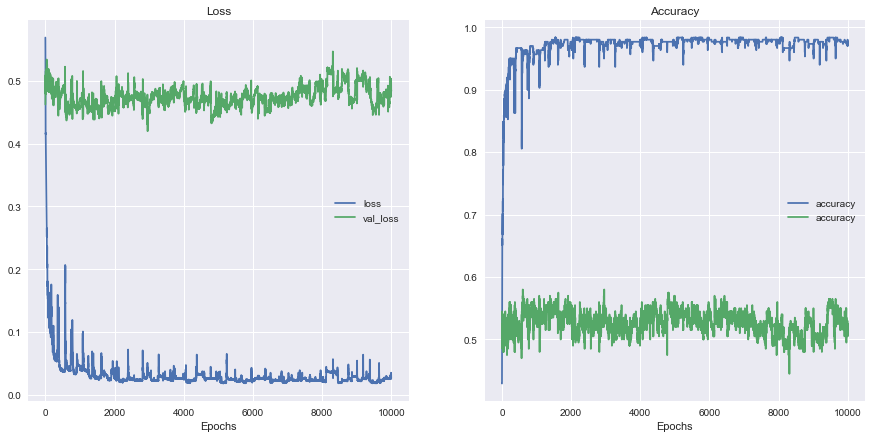

In [52]:
plot(history_final)

### Condition prediction based on area purposed

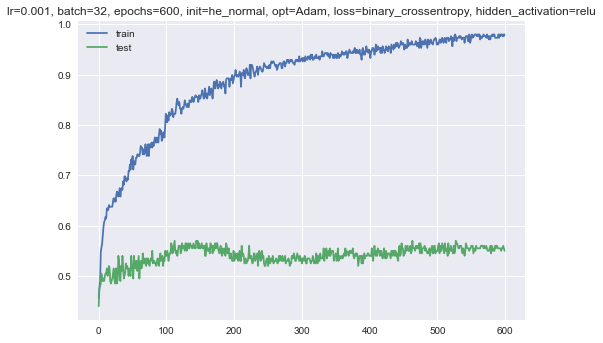

In [53]:
model_exp(X_train, y_train, X_valid, y_valid, batch_size=32, optimizer=Adam, epochs=600)

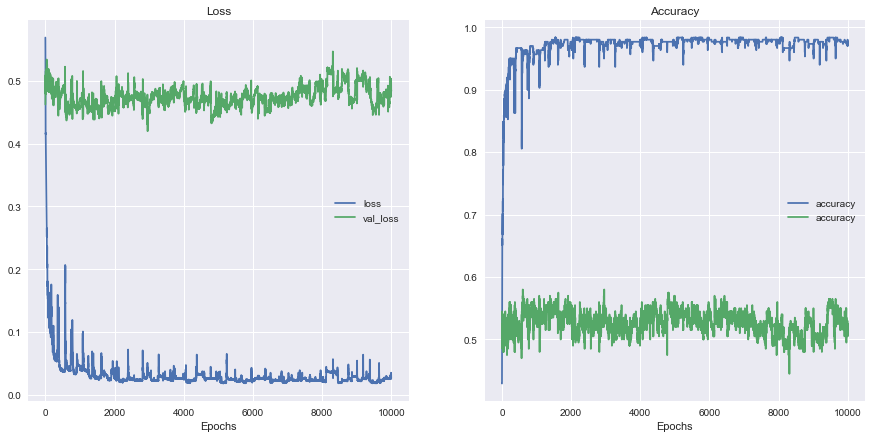

In [54]:
plot(history_final)